In [1]:
import glob
import os
from readfiles import *
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import h5py
from lomapost import * #All functions defined within module lomapost
%matplotlib inline
from scipy.interpolate import interp2d

In [2]:
set_fig_props()

In [3]:
plt.rcParams['figure.figsize'] = (10.0, 8.0)
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['figure.facecolor'] = 'white'
sizefont= 30
font = {'family' : 'normal','weight' : 'normal','size'   : sizefont}
plt.rc('font', **{'family': 'serif', 'serif': ['Computer Modern'],'size':sizefont})
plt.rc('text', usetex=True)
plt.rc('xtick', labelsize=sizefont)
plt.rc('ytick', labelsize=sizefont)
plt.rcParams['xtick.major.pad']='8'
plt.rcParams['ytick.major.pad']='8'



In [4]:
from IPython.display import clear_output
from IPython.display import Image

# Ref data

In [5]:
y = np.loadtxt('/home/toni/SVNlast/branches/initloma/data/Ly368Dy020my851.txt')

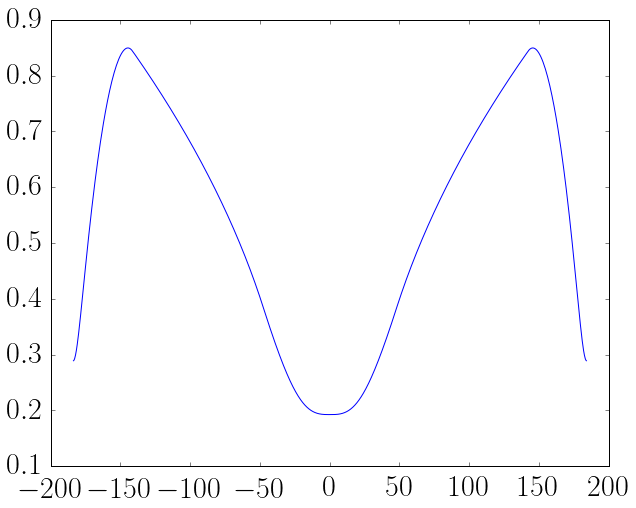

In [6]:
plt.plot(y[1:],np.diff(y))

In [7]:
pantanodotdm=[[1.0,2,4,8.0],[1.0,0.668,0.569,0.367]]
CdeltaPant=[0.117,0.084,0.093,0.071]
dmratiosPant=[1.00,0.67,0.57,0.37]
dmpPants1M07 = 0.0108;
vdmpPantM07 = np.array(dmratiosPant)*dmpPants1M07
print vdmpPantM07
fpant = np.divide(CdeltaPant,CdeltaPant[0])
#conv=dmtodwPant*5.0
#WRONG:#dmtodwPant = fpant/dmratiosPant
dmtodwPant = np.array(CdeltaPant)/np.array(vdmpPantM07)/2.0
conv=dmtodwPant
DwPant = conv
print conv
import scipy.io as sio

#BELL AND MEHTA
R11BM =np.loadtxt('/data2/toni/work/db/R11_1990.dat');
R22BM =np.loadtxt('/data2/toni/work/db/R22_1990.dat');
R33BM =np.loadtxt('/data2/toni/work/db/R33_1990.dat');
R12BM =np.loadtxt('/data2/toni/work/db/R12_1990.dat');

#SPENCER JONES
R11SJ =np.loadtxt('/data2/toni/work/db/R11_1971.dat');
R22SJ =np.loadtxt('/data2/toni/work/db/R22_1971.dat');
R33SJ =np.loadtxt('/data2/toni/work/db/R33_1971.dat');
R12SJ =np.loadtxt('/data2/toni/work/db/R12_1971.dat');

#PANTANO AND SARKAR
ums20pantano = np.loadtxt('/data2/toni/work/db/Pantano2002_umean_s20.dat');
ums40pantano = np.loadtxt('/data2/toni/work/db/Pantano2002_umean_s40.dat');
ums80pantano = np.loadtxt('/data2/toni/work/db/Pantano2002_umean_s80.dat');
rhos20pantano = np.loadtxt('/data2/toni/work/db/Pantano2002_rhomean_s20.dat');
rhos40pantano = np.loadtxt('/data2/toni/work/db/Pantano2002_rhomean_s40.dat');
rhos80pantano = np.loadtxt('/data2/toni/work/db/Pantano2002_rhomean_s80.dat');
R12s1pantano=np.loadtxt('/share/drive/toni/python/R12Pantanos1.dat');
R12s2pantano=np.loadtxt('/share/drive/toni/python/R12Pantanos2.dat');
R12s4pantano=np.loadtxt('/share/drive/toni/python/R12Pantanos4.dat');
R12s8pantano=np.loadtxt('/share/drive/toni/python/R12Pantanos8.dat');
ups1pantano=np.loadtxt('/data2/toni/work/db/up_s1_Pantano.dat');
ups2pantano=np.loadtxt('/data2/toni/work/db/up_s2_Pantano.dat');
ups4pantano=np.loadtxt('/data2/toni/work/db/up_s4_Pantano.dat');
ups8pantano=np.loadtxt('/data2/toni/work/db/up_s8_Pantano.dat');
rhops1pantano=np.loadtxt('/data2/toni/work/db/rhop_s1_Pantano.dat');
rhops2pantano=np.loadtxt('/data2/toni/work/db/rhop_s2_Pantano.dat');
rhops4pantano=np.loadtxt('/data2/toni/work/db/rhop_s4_Pantano.dat');
rhops8pantano=np.loadtxt('/data2/toni/work/db/rhop_s8_Pantano.dat');

#Brown and ROSHKO
U17BR=np.loadtxt('/data2/toni/work/db/ML_s17_BR_U.dat')
rho17BR=np.loadtxt('/data2/toni/work/db/ML_s17_BR_rho.dat')
U71BR=np.loadtxt('/data2/toni/work/db/ML_c_s71_U.dat')
rho71BR=np.loadtxt('/data2/toni/work/db/ML_c_s71_rho.dat')
dmpBR =np.loadtxt('/data2/toni/work/db/ML_growth_rate_dm_BR.dat')

#ROGERS AND MOSER
UselfRM =np.loadtxt('/data2/toni/work/db/uselfRogersMoser.dat');
urmsRM = np.loadtxt('/data2/toni/work/db/rogermoser1994u1.dat')
vrmsRM = np.loadtxt('/data2/toni/work/db/rogermoser1994u2.dat')
wrmsRM = np.loadtxt('/data2/toni/work/db/rogermoser1994u3.dat')
uvrmsRM = np.loadtxt('/data2/toni/work/db/rogermoser1994u12.dat')
R12RM =np.loadtxt('/data2/toni/work/db/R12_1994.dat');
#MY SS SOLUTION
s80=sio.loadmat('/share/drive/toni/VDML/JFM/VDML_JFM/SSphys2_s8.mat')
s40=sio.loadmat('/share/drive/toni/VDML/JFM/VDML_JFM/SSphys2_s4.mat')
s20=sio.loadmat('/share/drive/toni/VDML/JFM/VDML_JFM/SSphys2_s2.mat')
s10=sio.loadmat('/share/drive/toni/VDML/JFM/VDML_JFM/SSphys2_s1.mat')

[ 0.0108    0.007236  0.006156  0.003996]
[ 5.41666667  5.80431177  7.55360624  8.88388388]


In [8]:
print np.array(CdeltaPant)/(0.010*np.array(dmratiosPant))

[ 11.7         12.53731343  16.31578947  19.18918919]


0.0640218197192
0.0640218197192
3.60345511885


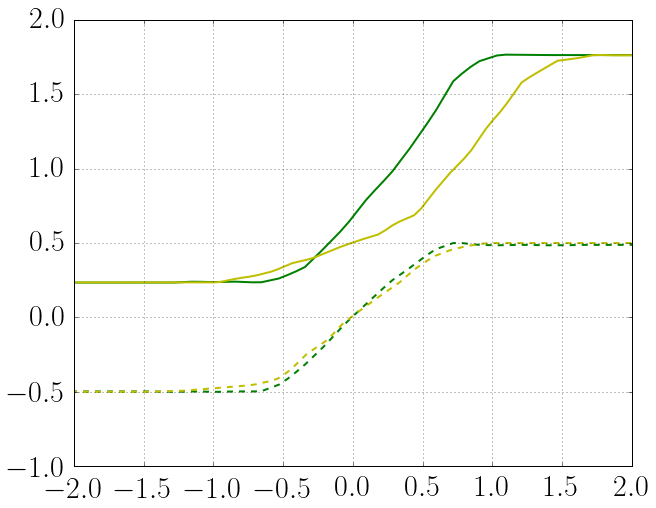

In [9]:
y2 = np.linspace(-2,2,1000)
U17BR2 = np.interp(y2,U17BR[:,0],U17BR[:,1])
U71BR2 = np.interp(y2,U71BR[:,0],U71BR[:,1])

rho17BR2 = np.interp(y2,rho17BR[:,0],rho17BR[:,1])
rho71BR2 = np.interp(y2,rho71BR[:,0],rho71BR[:,1])

dwkk = (U17BR2.max()-U17BR2.min())/np.max(np.abs(der1(y2,U17BR2)))
DU17 = U17BR2[0]+(U17BR2[-1]-U17BR2[0])/2.0;
DU71 = U71BR2[0]+(U71BR2[-1]-U71BR2[0])/2;

UC17 = (U17BR2.max()+U17BR2.min())/2
UC71 = (U71BR2.max()+U71BR2.min())/2

rho17trans = 2*rho17BR2/(rho17BR2.max()+rho17BR2.min())
rho71trans = 2*rho71BR2/(rho71BR2.max()+rho71BR2.min())

U17trans = (U17BR2-UC17)/((U17BR2-UC17).max()-(U17BR2-UC17).min());
U71trans = (U71BR2-UC71)/((U71BR2-UC71).max()-(U71BR2-UC71).min());

DUkk = np.nanmax(U17trans)-np.nanmin(U17trans)
dw17 = DUkk/np.max(np.abs(der1(y2,U17trans)));print dw17
DUkk = np.nanmax(U71trans)-np.nanmin(U71trans)
dw71 = DUkk/np.max(np.abs(der1(y2,U71trans)));#print dw71
print dwkk

plt.plot(y2/dw17,U17trans,'g--',lw=2.0)
plt.plot(y2/dw17,rho17trans,'g',lw=2.0)
plt.plot(y2/dw71,U71trans,'y--',lw=2.0)
plt.plot(-y2/dw71,rho71trans,'y',lw=2.0)

dmtodwBR = calcdmcomp(y2/dw71,U71trans,U71trans*rho71trans,rho71trans)
dmtodwBR17 = calcdmcomp(y2/dw17,U17trans,U17trans*rho17trans,rho17trans)
print 0.5/dmtodwBR
#print dmtodwBR*0.5
#,dmtodwBR17
plt.xlim([-2,2])
plt.grid('on')

# Laminar solution SS

dm = 0.225078242588
Dw = 4.44341145772
dm = 0.204790608979
Dw = 4.88030445991
dm = 0.156568071133
Dw = 6.37798805762
dm = 0.10379918916
Dw = 9.60579018567


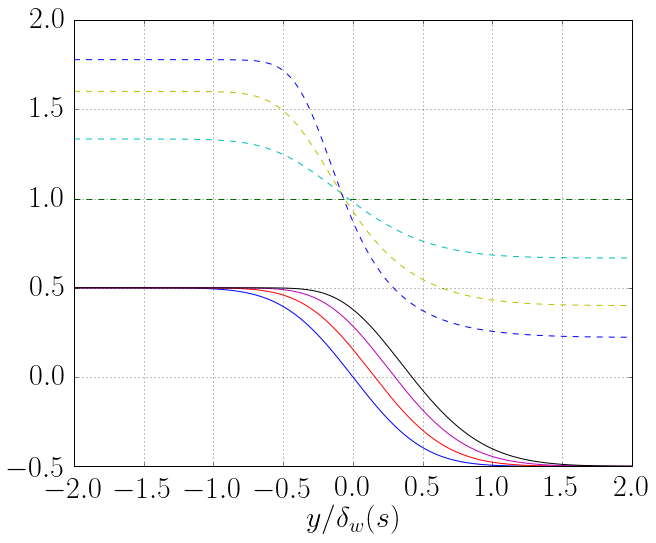

In [10]:
ncases = 4

y_int = np.linspace(-2,2,500)
DwLam = [0.0,0.0,0.0,0.0]
lam_s10_y=s10['y']
lam_s10_U=s10['U']
lam_s10_rho=s10['rhos']

lam_s20_y=s20['y']
lam_s20_U=s20['U']
lam_s20_rho=s20['rhos']

lam_s40_y=s40['y']
lam_s40_U=s40['U']
lam_s40_rho=s40['rhos']

lam_s80_y=s80['y']
lam_s80_U=s80['U']
lam_s80_rho=s80['rhos']

lam_U = np.zeros([len(y_int),ncases])
lam_rho = np.zeros([len(y_int),ncases])
icase = 0
lam_U[:,icase] = -np.interp(y_int,lam_s10_y.flatten(),lam_s10_U.flatten())/2.0
lam_rho[:,icase] = np.interp(y_int,lam_s10_y.flatten(),lam_s10_rho.flatten())
icase = 1
lam_U[:,icase] = -np.interp(y_int,lam_s20_y.flatten(),lam_s20_U.flatten())/2.0
lam_rho[:,icase] = np.interp(y_int,lam_s20_y.flatten(),lam_s20_rho.flatten())
icase = 2
lam_U[:,icase] = -np.interp(y_int,lam_s40_y.flatten(),lam_s40_U.flatten())/2.0
lam_rho[:,icase] = np.interp(y_int,lam_s40_y.flatten(),lam_s40_rho.flatten())
icase = 3
lam_U[:,icase] = -np.interp(y_int,lam_s80_y.flatten(),lam_s80_U.flatten())/2.0
lam_rho[:,icase] = np.interp(y_int,lam_s80_y.flatten(),lam_s80_rho.flatten())
for icase in range(ncases):
    plt.plot(y_int,lam_U[:,icase])
    plt.plot(y_int,lam_rho[:,icase],'--')#/(lam_rho[0,icase]-lam_rho[-1,icase]),'--')
    print "dm = %s" %(calcdmcomp(y_int,lam_U[:,icase],lam_U[:,icase]*lam_rho[:,icase],lam_rho[:,icase]))
    print "Dw = %s" %(calcdwcomp(y_int,lam_U[:,icase],lam_U[:,icase]*lam_rho[:,icase],lam_rho[:,icase])/\
                      calcdmcomp(y_int,lam_U[:,icase],lam_U[:,icase]*lam_rho[:,icase],lam_rho[:,icase]))
    DwLam[icase]= (calcdwcomp(y_int,lam_U[:,icase],lam_U[:,icase]*lam_rho[:,icase],lam_rho[:,icase])/\
                      calcdmcomp(y_int,lam_U[:,icase],lam_U[:,icase]*lam_rho[:,icase],lam_rho[:,icase]))
plt.grid('on')
plt.xlabel(r'$y/\delta_w(s)$')

# Job selection

In [11]:
p_results   = '/share/drive/toni/VDML/'          #Define path to folder with all results
#l_folders = os.listdir(p_results) #print available jobs (folders)
p_folders   = [p_results+'s10/02/h5.stats',p_results+'s10/03/h5.stats', \
               p_results+ 's10/04/newman/h5.stats', p_results+ 's10/06/h5.stats', \
               p_results+ 's20/01/h5.stats', p_results+ 's20/02/h5.stats', p_results+ 's20/03/h5.stats', \
               p_results+ 's20/04/h5.stats',\
               p_results+ 's40/01/h5.stats', p_results+ 's40/02/h5.stats', p_results+ 's40/03/h5.stats', \
               p_results+ 's40/04/h5.stats',\
               p_results+ 's80/01/h5.stats', p_results+ 's80/02/h5.stats', p_results+ 's80/03/h5.stats', \
               p_results+ 's80/04/h5.stats']

p_folders_prev_s1 = ['/data2/toni/work/results/Re160s10/case1/h5.stats',\
                     '/data2/toni/work/results/Re160s10/case2/h5.stats',\
                     '/data2/toni/work/results/Re160s10/case3/h5.stats']

njobs = len(p_folders) 
#define option and styles for sta reading

In [12]:
lgroup = [0,0,0,0,  1,1,1,1,  2,2,2,2,  3,3,3,3];
laverage = [1,1,1,1, 1,1,1,1, 1,1,1,1, 1,1,1,1] # Says which to average
lcases = [[0,1,2,3],[4,5,6,7],[8,9,10,11],[12,13,14,15]]

In [13]:
def getaverageintime(p_folders,variable,tmin,tmax,Npoints=200,derivative=False):
    """
    for a given folder path, and variable,computes a interpolated function in time(tmin:tmax)
    and average for all folders given in p_folders.
    """
    njobs = len(p_folders)
    time_int = np.linspace(tmin,tmax,Npoints)
    #faverage = np.zeros(Npoints)
    ftoaverage= np.zeros([njobs,Npoints])
    for ijob in range(njobs):
        path = p_folders[ijob]
        with h5py.File(path,"r") as f:
            time = f['time'];
            tmax2 = min(tmax,time[-1])
            fun1 = np.interp(time_int,time,f[variable],right=NaN)
            ftoaverage[ijob,:] = np.array(fun1)
            if derivative==True:
                ftoaverage[ijob,:]=der1(time_int,np.array(fun1))
    return time_int,np.mean(ftoaverage,axis=0),np.std(ftoaverage,axis=0)

In [14]:
def fcaseintime(p_folders,lcases,variable,tmin,tmax,Npoints=200,derivative=False):
    """
    using getaveragintime, returns as many vectors as cases wanted to compute.
    Distribution of cases is given in lcases(ex. lcases = [[0,1,2],[3,5]])
    """
    ncases = len(lcases)
    vtcases = [[] for i in range(ncases)]
    vfcases = [[] for i in range(ncases)]
    stddcases = [[] for i in range(ncases)]
    for icase in range(ncases):
        vpcases = []
        for ijob in lcases[icase]:
            vpcases = vpcases + [p_folders[ijob]]
        vtcases[icase],vfcases[icase],stddcases[icase] = getaverageintime(vpcases,variable,tmin,tmax,Npoints,derivative)
    return vtcases,vfcases,stddcases


In [15]:
def getvarmeanintime(path,variable,tmin,tmax,derivative=False):
    """
    for a given folder path, and variable,computes a interpolated function in time(tmin:tmax)
    and average for all folders given in p_folders.
    """
    with h5py.File(path,"r") as f:
            time = np.array(f['time']);
            if derivative==False:
                fun = np.array(f[variable])
            else: #Derivative with time
                fun = der1(time,np.array(f[variable]))
            it1 = where(time>=tmin)[0][0]
            it2 = where(time>=tmax)[0][0]
            mean = np.mean(fun[it1:it2]);
            error = np.std(fun[it1:it2]);
    return mean,error

In [16]:
def getSSprofile(path,variable,tmin,tmax,scaling = 'dm',Npoints=500,derivative=False,y0=0):
    """
    Obtain SS profile averaged in the given time
    """
    lim = 12.0;
    if scaling == 'dw':
        lim=2.0
    
    ydelta = np.linspace(-lim,lim,Npoints)
    funintcum = np.zeros(Npoints);
    nacum = 0
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        fun = np.array(f[variable]);
        if variable=='rum':
            rhom = np.array(f['rhom'])
            fun = np.divide(fun,rhom)
            #print "computed rum/rhom"
        y = np.array(f['y'])
        delta = f[scaling]
        it1 = where(time>=tmin)[0][0]
        it2 = where(time>=tmax)[0][0]
        fyjob = [np.zeros(Npoints) for i in range(it2-it1)]
        print it1,it2
        for itime in range(it1,it2):
            dd = delta[itime]
            if derivative == True:
                funint = np.interp(ydelta,(y-y0)/dd,dd*der1(y,fun[:,itime]))
                if itime==it1:
                    print "Taking derivative and multiplying by scaling"
            else:
                if variable=='w3m' or variable[0:2] =='ep':
                    funint = np.interp(ydelta,(y-y0)/dd,dd*fun[:,itime])
                    if itime==it1: #First time
                        print "Multiplying by scaling"
                else:
                    funint = np.interp(ydelta,(y-y0)/dd,fun[:,itime])
            fyjob[itime-it1] = funint
            
    return ydelta,np.mean(fyjob,axis=0),np.std(fyjob,axis=0)
            

In [17]:
def getvarmeanintimeV(fun,time,tmin,tmax,derivative=False):
    """
    for a given folder path, and variable,computes a interpolated function in time(tmin:tmax)
    and average for all folders given in p_folders.
    """
    it1 = where(time>=tmin)[0][0]
    it2 = where(time>=tmax)[0][0]
    if derivative==True:
        fun=der1(time,fun)
    mean = np.mean(fun[it1:it2]);
    error = np.std(fun[it1:it2]);
    return mean,error

In [18]:
def getSScase2(p_folders,lcases,variable,scaling,SS1,SS2,Npoints=500,derivative=False):
    """
    returns as many vectors as cases wanted to compute.
    Distribution of cases is given in lcases(ex. lcases = [[0,1,2],[3,5]])
    return only one profile per case
    """
    ncases = len(lcases)
    fycases = [[] for i in range(ncases)]
    
    ycases = [[] for i in range(ncases)]
    ferrorcases = [[] for i in range(ncases)]
    for icase in range(ncases):
        vpcases = []
        nacum = 0
        fy = np.zeros(Npoints)
        yf = [[]for i in range(len(lcases[icase]))]
        fy= [[]for i in range(len(lcases[icase]))]
        ferror = [[] for i in range(len(lcases[icase]))]
        for ijob in lcases[icase]:
            vpcases = vpcases + [p_folders[ijob]]
        for path,i in zip(vpcases,range(len(vpcases))):
            ijob = lcases[icase][i]
            yf[i],fy[i],ferror[i] = getSSprofile(path,variable,SS1[ijob],SS2[ijob],scaling,Npoints,derivative)
        ycases[icase]=yf
        fycases[icase]=np.mean(fy,axis=0)
        ferrorcases[icase]=np.max(ferror,axis=0)
    return ycases,fycases,ferrorcases

In [19]:
def gettimeaverage(p_folders,lcases,variable,SS1,SS2,Npoints=500,ferror='std'):
    """
    returns one for case wanted to compute.
    Distribution of runs is given in lcases[icase](ex. lcases = [[0,1,2],[3,5]])
    only for one case at a time
    return only one profile per case and its std
    """
    nruns = len(lcases)
    #Obtain dispersion on scaling
    Ntimes= Npoints
    funcum  = np.zeros(Ntimes) 
    funcum2 = np.zeros(Ntimes)
    tmin=10000;
    tmax=0;
    ltimes =[]
    lfuns =[]
    for ijob in lcases:
        path = p_folders[ijob]
        with h5py.File(path,"r") as f:
            time = np.array(f['time']);
            if variable =='dyeta':
                fun  = np.nanmax(np.array(f[variable]),axis=0)
                Lx=2*np.pi/np.float32(f['alp'])
                print "Lx=%s"%Lx
            elif variable=='eta':
                fun  = np.nanmin(np.array(f[variable]),axis=0)
            else:
                fun  = np.array(f[variable]);
            it1 = where(time>=SS1[ijob])[0][0]
            it2 = where(time>=SS2[ijob])[0][0]
            tmin = min(tmin,time[it1])
            tmax = max(tmax,time[it2])
            ltimes.append(time)
            lfuns.append(fun)
    tint = np.linspace(tmin,tmax,Ntimes)
    for ij in range(nruns):
        funint   = np.interp(tint,ltimes[ij],lfuns[ij])
        funcum  += funint
        funcum2 += funint**2
    funmean = funcum/nruns
    funstd = np.sqrt(np.abs(funcum2-nruns*funmean**2)/(nruns-1))
    #funstd = np.sqrt(np.abs(funcum2-nruns*funmean**2)/(nruns-1))
    #funstd = np.sqrt(np.abs(funcum2/nruns-funcum**2))
    #``std = sqrt(mean(abs(x - x.mean())**2))``
    #s 	= 	√ 	∑(xi2) - n·x̄2
    #---------------------------------------
#                  n-1
    #---------------------------------------
    if ferror=='std':
        return tint,funmean,funstd
    else:
    #funstd = np.sqrt(e2square+)
        return tint,funmean,funstd/np.sqrt(nruns)

In [20]:
def getdeltavstime(p_folders,lcases,variable,SS1,SS2,Npoints=500,ferror='std',scaling='dw'):
    """
    returns one for case wanted to compute.
    Distribution of runs is given in lcases[icase](ex. lcases = [[0,1,2],[3,5]])
    only for one case at a time
    return only one profile per case and its std
    """
    nruns = len(lcases)
    #Obtain dispersion on scaling
    Ntimes= Npoints
    funcum  = np.zeros(Ntimes) 
    funcum2 = np.zeros(Ntimes)
    tmin=10000;
    tmax=0;
    ltimes =[]
    lfuns =[]
    for ijob in lcases:
        path = p_folders[ijob]
        with h5py.File(path,"r") as f:
            time = np.array(f['time']);
            fun  = np.array(f[variable]);
            it1 = where(time>=SS1[ijob])[0][0]
            it2 = where(time>=SS2[ijob])[0][0]
            tmin = min(tmin,time[it1])
            tmax = max(tmax,time[it2])
            ltimes.append(time)
            lfuns.append(fun)
    tint = np.linspace(tmin,tmax,Ntimes)
    for ij in range(nruns):
        funint   = np.interp(tint,ltimes[ij],lfuns[ij])
        funcum  += funint
        funcum2 += funint**2
    funmean = funcum/nruns
    funstd = np.sqrt(np.abs(funcum2-nruns*funmean**2)/(nruns-1))
    #funstd = np.sqrt(np.abs(funcum2-nruns*funmean**2)/(nruns-1))
    #funstd = np.sqrt(np.abs(funcum2/nruns-funcum**2))
    #``std = sqrt(mean(abs(x - x.mean())**2))``
    #s 	= 	√ 	∑(xi2) - n·x̄2
    #---------------------------------------
#                  n-1
    #---------------------------------------
    if ferror=='std':
        return tint,funmean,funstd
    else:
    #funstd = np.sqrt(e2square+)
        return tint,funmean,funstd/np.sqrt(nruns)

In [21]:
def getSScase3(p_folders,lcases,variable,scaling,SS1,SS2,Npoints=500,derivative=False,ferror='std',fdmean= False):
    """
    returns one for case wanted to compute, using its own scaling for each run!
    Distribution of runs is given in lcases[icase](ex. lcases = [0,1,2] o [3,5]]
    only for one case at a time
    return only one profile per case and its Error of the mean.
    http://teacher.nsrl.rochester.edu/phy_labs/AppendixB/AppendixB.html
    """
    nruns = len(lcases)
    fycases = [[] for i in range(ncases)]
    ycases = [[] for i in range(ncases)]
    ferrorcases = [[] for i in range(ncases)]
    funint = np.zeros(Npoints);
    dfunint = np.zeros(Npoints);
    lim = 15.0;
    if scaling == 'dw':
        lim=2.0
    ydelta = np.linspace(-lim,lim,Npoints)
    nacum = 0
    fcum  = np.zeros(Npoints)
    fcum2 = np.zeros(Npoints)
    dfcum = np.zeros(Npoints)
    icount = 1
    damax = 0.0
    #Obtain dispersion on scaling
    Ntimes= 50
    [tint,deltaint,deltastd] = gettimeaverage(p_folders,lcases,scaling,SS1,SS2,Ntimes)
    #---------------------------------------
    for ijob in lcases:
        path = p_folders[ijob]
        print path
        with h5py.File(path,"r") as f:
            time = np.array(f['time']);
            if variable =='vmd':
                fun = np.array(f['vm'])
                delta = np.array(f[scaling])
                fun = fun*delta
            else:
                fun = np.array(f[variable]);
            y = np.array(f['y'])
            if variable=='rum':
                rhom = np.array(f['rhom'])
                fun = np.divide(fun,rhom)
            elif variable=='R12':
                ruv = np.array(f['ruv'])
                rum = np.array(f['rum'])
                rvm = np.array(f['rvm'])
                rhom = np.array(f['rhom'])
                fun = np.divide(np.subtract(ruv,np.divide(np.multiply(rum,rvm),rhom)),rhom)
            elif variable=='R11':
                ruu = np.array(f['ruu'])
                rum = np.array(f['rum'])
                #rvm = np.array(f['rvm'])
                rhom = np.array(f['rhom'])
                fun = np.divide(np.subtract(ruu,np.divide(np.multiply(rum,rum),rhom)),rhom)
            elif variable=='R22':
                rvv = np.array(f['rvv'])
                rvm = np.array(f['rvm'])
                #rvm = np.array(f['rvm'])
                rhom = np.array(f['rhom'])
                fun = np.divide(np.subtract(rvv,np.divide(np.multiply(rvm,rvm),rhom)),rhom)
            elif variable=='R33':
                rww = np.array(f['rww'])
                rwm = np.array(f['rwm'])
                #rvm = np.array(f['rvm'])
                rhom = np.array(f['rhom'])
                fun = np.divide(np.subtract(rww,np.divide(np.multiply(rwm,rwm),rhom)),rhom)

                        
            #print "computed rum/rhom"
            delta = np.array(f[scaling])
            
            it1 = where(time>=SS1[ijob])[0][0]
            it2 = where(time>=SS2[ijob])[0][0]
            #print "SS1[%s]  = %s" %(ijob,SS1[ijob])
            #print "SS2[%s] = %s" %(ijob,SS2[ijob])
            for itime in range(it1,it2):
                dd = delta[itime]
                if fdmean == True:
                    dd = np.interp(time[itime],tint,deltaint)
                #edelta = 0.01*dd
                edelta = np.interp(time[itime],tint,deltastd)
                if derivative == True:
                    #ed = der1(y,fun[:,itime])*y/dd**2
                    funint = np.interp(ydelta,y/dd,dd*der1(y,fun[:,itime]))
                    dfunint = 0.0*funint#funint**2/dd**2*edelta**2
                    if itime==it1:
                        print "Taking derivative and multiplying by scaling"
                else:
                    if variable=='w3m' or variable[0:2] =='ep':
                        #ed = fun[:,itime]*y/dd**2
                        funint = np.interp(ydelta,y/dd,dd*fun[:,itime])
                        #edint   = np.interp(ydelta,y/dd,ed)
                        #dfunint = edint**2*edelta**2
                        dfunint = 0.0*funint
                        if itime==it1: #First time
                            print "Multiplying by scaling"

                    else:
                        funint = np.interp(ydelta,y/dd,fun[:,itime])
                        dfunint = 0.0*funint
                nacum+= 1
                fcum  = fcum  + funint
                fcum2 = fcum2 + funint**2
                dfcum = dfcum + dfunint
                #damax = max(damax,np.max(np.abs(funint)))
    funmean = fcum/nacum
    e1square = np.abs(fcum2-nacum*funmean**2)/(nacum-1)
    #e1square = np.abs(fcum2/nacum-funmean**2)
    #e2square = np.mean(dfcum)
    e2square = dfcum/nacum
    #funstd  = np.sqrt((e1square+e2square)/nacum)
    funstd = np.sqrt((e1square+e2square))
    #calculate ERROR of the mean= std/sqrt(N)
    print "Max of standard deviation = %s o/o" %(np.nanmax(np.abs(funstd))/np.nanmax(np.abs(funmean))*100)
    print "Number of profiles = %s" %(nacum)
    if ferror == 'std':
        print "Giving std-deviation error"
        return ydelta,funmean,funstd
    #funstd = np.sqrt(e2square+)
    else: 
        print "Giving error of the mean"
        return ydelta,funmean,funstd/np.sqrt(nacum)

STATS

In [22]:
p_root = '/share/drive/toni/VDML/'
cases = ['s10','s20','s40','s80']
p_stats = [p_root + cases[i]+'/Tstats.txt' for i in range(len(cases))]

In [23]:
!mkdir /share/drive/toni/VDML/JFM_201706/

mkdir: cannot create directory `/share/drive/toni/VDML/JFM_201706/': File exists


In [24]:
#Some parameter definitions for plotting:
#----------------------------------------
xlen=plt.rcParams['figure.figsize'][0]
xyratio=0.6
ylen = xyratio*xlen
l_case_color = ['k','b','g','r']
l_case_style = ['k-','b-','g-','r-']

ncases = len(lcases)
tmax = 950.0
#-----------------------------
#PRINT or not??
PRINT = True
save_folder='/share/drive/toni/VDML/JFM/' #Previous folder for reference (data should not change...)
save_folder='/share/drive/toni/VDML/JFM_201706/'
#fformat = '.png'
#fformat = '.eps'
fformat = '.pdf'
#Npoints for temporal interpolation
Npoints=300

# 1D plots (vs time)
l_time_var = ['dm','dw','dmpoint','EPS','rhoEPS','etamin','Relambda']

[0, 1, 2, 3]
4
[ 680.5614624   680.5614624   660.31518555  639.152771  ]


/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:73: RuntimeWarning: divide by zero encountered in divide
/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:74: RuntimeWarning: divide by zero encountered in divide


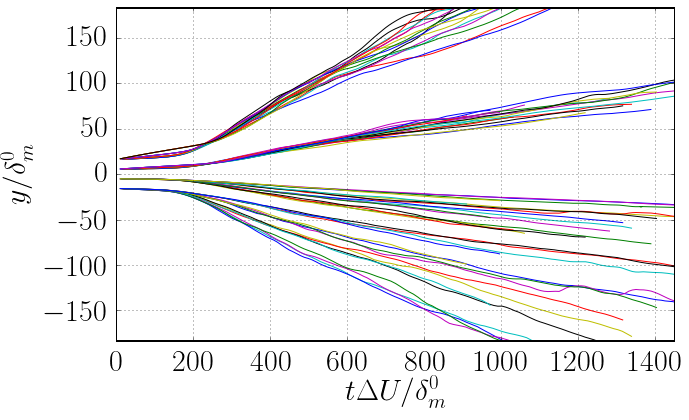

In [25]:
vlim      = [4,4.0,4.0,4.0]
posumin = [[] for x in range(njobs)]
posumax = [[] for x in range(njobs)]
posu0 = [[] for x in range(njobs)]
posrho10 = [[] for x in range(njobs)]
posepmax =[[] for x in range(njobs)]
posurmsmax =[[] for x in range(njobs)]
tmax_phys=[[] for x in range(njobs)]
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
xi = np.linspace(-2,2,200) #vector x to interpolate (chi)
for path,ijob in zip(p_folders,range(len(p_folders))):
    with h5py.File(path,"r") as f:
        um = np.array(f['um'])
        bet = np.array(f['bet'])
        w3m = np.array(f['w3m'])
        urms = np.array(f['urms'])
        rhom = np.array(f['rhom'])
        rum = np.array(f['rum'])
        umax=np.max(um[:,0])
        umin=np.min(um[:,0])
        y = np.array(f['y'])
        time = np.array(f['time'])
        ddtmp =np.array(f['dw'])
        mag = um[0,-1]
        #mag = np.max(rum/rhom)
        getlim = False
        for i in range(len(time)):
            yxi = y/ddtmp[i]
            scaled = np.interp(xi,yxi,um[:,i])
            #scaled = np.interp(xi,yxi,urms[:,i])
            #scaledrho = np.interp(xi,yxi,rhom[:,i])
        #ep = stats[ijob][ista]['epR'][:]
        #epmax = ep.max()
        #posep = (y[where(ep==epmax)]/dmtmp)
        #posurms= (y[where(urms==urms.max())]/dmtmp)
        #posdudy = (y[where(dudy==dudy.max())]/dmtmp)
            pos1 = np.interp(-0.99*mag,-scaled,xi)
            pos2 = np.interp(0.99*mag,-scaled,xi)
            #Asking for at least 2 vortices on Z
            #if (getlim == False and 2*np.pi/bet/ddtmp[i]/2.0<=2.0):
            #    tmax_phys[ijob] = time[i]
            #    getlim=True
            val = vlim[lgroup[ijob]]
            if (getlim == False and val*pos2*ddtmp[i]>=y[-1]):
                tmax_phys[ijob] = time[i]
                getlim=True
        #pos0 = np.interp(0.0,-scaled,xi)
        #pos10 = np.interp(-1.0,-scaledrho,xi)
        #posu0[ijob]  = r_[posu0[ijob]  , pos0]
            posumin[ijob]= r_[posumin[ijob], pos2]
            posumax[ijob]= r_[posumax[ijob], pos1]
    plt.plot(time,posumin[ijob]*ddtmp)
    plt.plot(time,posumax[ijob]*ddtmp)
    plt.plot(time,posumin[ijob]*ddtmp*3)
    plt.plot(time,posumax[ijob]*ddtmp*3)

plt.plot([0.0,1450],[y[0],y[0]],'k-',lw=3.0)
plt.plot([0.0,1450],[y[-1],y[-1]],'k-',lw=3.0)
#plt.plot([0.0,1450],[0.33*y[-1],0.33*y[-1]],'k--')

#plt.plot([0.0,1450],[0.33*y[0],0.33*y[0]],'k--')
plt.xlabel(r'$t\Delta U/\delta_m^0$')
plt.ylabel(r'$y/\delta_m^0$')
plt.grid('on')
plt.xlim([0,1450])
plt.ylim([y[0],y[-1]])

print lcases[0]
print ncases
tmaxcases=np.zeros(ncases)
Dtcases=np.zeros(ncases)
tmaxcases = 1/tmaxcases #infinite value initialization
Dtcases = 1/Dtcases
for icase in range(ncases):
    for ijob in lcases[icase]:
        path = p_folders[ijob];
        with h5py.File(path,"r") as f:
            #lkeys[icase] = f.keys()
            #for name in f:
                #print name
            time = np.array(f['time'])
        tmaxcases[icase] = min(tmaxcases[icase],tmax_phys[ijob])
        Dtcases[icase]   = min(Dtcases[icase],np.min(np.diff(time)))
    if tmaxcases[icase] == 0.0:
        tmaxcases[icase]= 1450
    icase = icase +1
    
#Rectify s=1 for be the minimum of all cases
tmaxcases[0] = min(tmaxcases[0],tmaxcases[1])
print tmaxcases

# Checks profiles collapse for different ranges - TO-DO

In [26]:
SS1=[450,450,500,550]
#SS1=[650,650,740,750]
SS2 = np.array(tmaxcases)
#SS2[1]=SS2[1]-50
#SS1[1]=640
#print SS2[1]
#SS2[1]=SS2[1]-10
#SS2[0]=700
SS1j=np.zeros(len(lgroup))
SS2j=np.zeros(len(lgroup))
for icase in range(ncases):
    for ijob in lcases[icase]:
        SS1j[ijob ] = SS1[icase]
        SS2j[ijob ] = SS2[icase]
        
    print SS1j[lcases[icase]]
    print SS2j[lcases[icase]]

[ 450.  450.  450.  450.]
[ 680.5614624  680.5614624  680.5614624  680.5614624]
[ 450.  450.  450.  450.]
[ 680.5614624  680.5614624  680.5614624  680.5614624]
[ 500.  500.  500.  500.]
[ 660.31518555  660.31518555  660.31518555  660.31518555]
[ 550.  550.  550.  550.]
[ 639.152771  639.152771  639.152771  639.152771]


In [27]:
l_job_color=['k','b','g','r','y','m']
l_job_style=['k','b','g','r','y','m']

In [28]:
print l_job_style
DTSS = np.zeros(ncases)
dwmin = np.zeros(ncases)

['k', 'b', 'g', 'r', 'y', 'm']


[ 450.  450.  450.  450.]
[ 680.5614624  680.5614624  680.5614624  680.5614624]
/share/drive/toni/VDML/s10/02/h5.stats
Max of standard deviation = 4.21557319741 o/o
Number of profiles = 7
Giving std-deviation error


/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in divide


0
/share/drive/toni/VDML/s10/03/h5.stats
Max of standard deviation = 3.82514523696 o/o
Number of profiles = 5
Giving std-deviation error
1
/share/drive/toni/VDML/s10/04/newman/h5.stats
Max of standard deviation = 2.22220524886 o/o
Number of profiles = 8
Giving std-deviation error
2
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 2.39308768746 o/o
Number of profiles = 6
Giving std-deviation error
3
DTSS[0]/dw = 10.0323016779
figure saved!


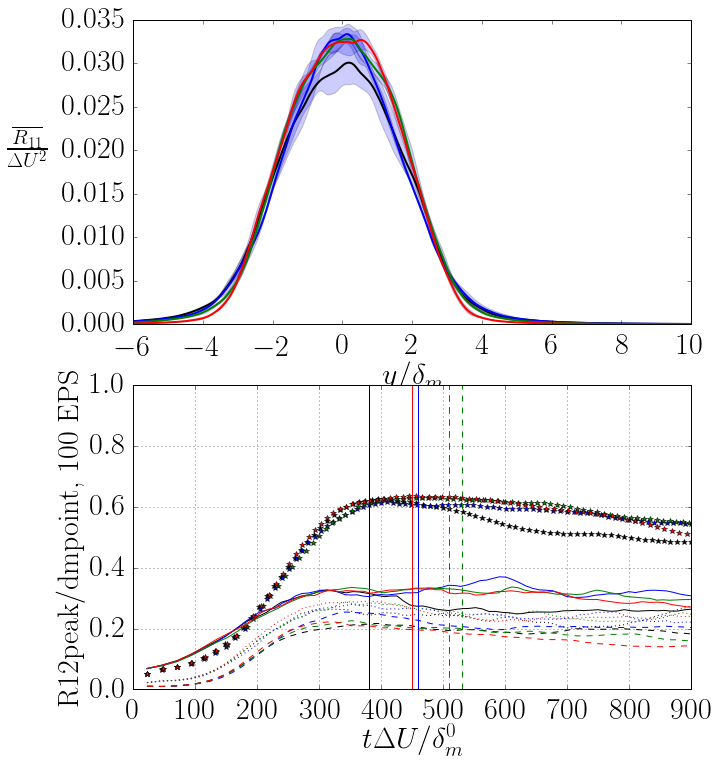

In [29]:
icase = 0
print SS1j[lcases[icase]]
print SS2j[lcases[icase]]

#SS1j[lcases[icase][0]] = 450
SS1j[lcases[icase][0]] = 380#450
SS1j[lcases[icase][1]] = 460
SS1j[lcases[icase][2]] = 450
#SS1j[lcases[icase][4]] = 450#750
SS1j[lcases[icase][3]] = 450
     
#SS2j[lcases[icase][0]] = 500
SS2j[lcases[icase][0]] = 450#500
SS2j[lcases[icase][1]] = 510
SS2j[lcases[icase][2]] = 530
#SS2j[lcases[icase][4]] = 500#820
SS2j[lcases[icase][3]] = 510

variable = 'R11' #any vector variable available
scaling  = 'dm' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\frac{\overline{R_{11}}}{\Delta U^2}$'
xlabel=r'$y/\delta_m$'
#figname = 'rhom_ave.eps'
figname = 'kk2'
derivative = False
PRINT = True
#SS1j[lcases[icase][3]]=550
#SS2j[lcases[icase][3]]=600
#SS1j[lcases[icase][0]]=400
#SS2j[lcases[icase][0]]=550
fig = plt.figure(figsize=(xlen,2*ylen)) #Define figure with size
ax =fig.add_subplot(2,1,1)
ax2=fig.add_subplot(2,1,2)
ax.set_xlabel(xlabel);
ax.set_ylabel(ylabel,rotation='horizontal',labelpad=35);
if scaling=='dm':
    ax.set_xlim([-6,10])
else:
    ax.set_xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in [icase]:
    DTSS[icase] = 0.0
    dwmin[icase]= 100.0
    #print ycases[icase], fSS[icase]
    for ijob in lcases[icase]:
        yxi,fSS,errorSS = getSScase3(p_folders,[ijob],variable,scaling,SS1j,SS2j,500,derivative,'std',True)
    #DT = fSS[-1]-fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    #fSS=fSS/DT
    #errorSS = errorSS/DT
        ax.plot(yxi,fSS,l_case_style[icase],color=l_job_color[ijob-lcases[icase][0]],lw=2.0)
    #print "MAX RELATIVE ERROR OF THE MEAN of case %s = %s"%(icase,np.nanmax(errorSS)/np.nanmax(fSS)*100)
        ax.fill_between(yxi,fSS+2*errorSS,fSS-2*errorSS,alpha=0.2)
        path = p_folders[ijob]
        with h5py.File(path,"r") as f:
            EPS = np.array(f['EPS'])
            dmpoint = np.array(f['dmpoint'])
            dw = np.array(f['dw'])
            time = np.array(f['time'])
            iSS1 = np.where(time>=SS1j[ijob])[0][0]
            iSS2 = np.where(time>=SS2j[ijob])[0][0]
            DTSS[icase] += time[iSS2]-time[iSS1]
            dwmin[icase] = min(dwmin[icase],dw[iSS1])
            R11peak = np.max(np.array(f['R11']),axis=0)
            R22peak = np.max(np.array(f['R22']),axis=0)
            R33peak = np.max(np.array(f['R33']),axis=0)
            R12peak = np.max(np.array(f['R12']),axis=0)
            y = np.array(f['y'])
            dd = np.array(f['dm'])
            ep = np.array(f['epR'])
            EPS2=np.zeros(len(time))
            iy1=200;iy2=-200
            for it in range(len(time)):
                kk = ep[iy1:iy2,it]#*dd[it]
                EPS2[it] = np.trapz(kk,y[iy1:iy2])
                R12peak[it]=np.abs(R12peak[it])/dmpoint[it]
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
        ax2.plot(time,100*EPS,'*',color=l_job_color[ijob-lcases[icase][0]])
        #ax2.plot(time,dmpoint,color=l_job_color[ijob-lcases[icase][0]])
        #ax2.plot(time,R11peak,color=l_job_color[ijob-lcases[icase][0]])
        #ax2.plot(time,EPS2,color=l_job_color[ijob-lcases[icase][0]])
        ax2.plot(time,10*R11peak,color=l_job_color[ijob-lcases[icase][0]])
        ax2.plot(time,10*R22peak,color=l_job_color[ijob-lcases[icase][0]],ls='dashed')
        ax2.plot(time,10*R33peak,color=l_job_color[ijob-lcases[icase][0]],ls='dotted')
        ax2.plot([SS1j[ijob],SS1j[ijob]],[0,1], color=l_job_color[ijob-lcases[icase][0]])
        ax2.plot([SS2j[ijob],SS2j[ijob]],[0,1], color=l_job_color[ijob-lcases[icase][0]],ls='dashed')
        print ijob
        ax2.set_ylim([0.0,1.0])
        ax2.set_xlim([0.0,700])
        #ax2.plot([SS2j[ijob],SS2j[ijob]],[0,np.max(dmpoint)], color=l_job_color[ijob-lcases[icase][0]])
ax2.set_xlabel(r'$t\Delta U /\delta_m^0$')
ax2.set_ylabel(r'R12peak/dmpoint, 100 EPS')
ax2.set_xlim(right=900)
print "DTSS[%s]/dw = %s"%(icase,DTSS[icase]/dwmin[icase])
ax.yaxis.label.set_fontsize(30)     
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

# s = 2

[ 450.  450.  450.  450.]
[ 680.5614624  680.5614624  680.5614624  680.5614624]
/share/drive/toni/VDML/s20/01/h5.stats
Max of standard deviation = 4.71250847531 o/o
Number of profiles = 10
Giving std-deviation error
4
/share/drive/toni/VDML/s20/02/h5.stats
Max of standard deviation = 4.10520583366 o/o
Number of profiles = 8
Giving std-deviation error


/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in divide


5
/share/drive/toni/VDML/s20/03/h5.stats
Max of standard deviation = 2.57308616473 o/o
Number of profiles = 7
Giving std-deviation error
6
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 1.91260995952 o/o
Number of profiles = 6
Giving std-deviation error
7
DTSS[1]/dw = 10.2478449453
figure saved!


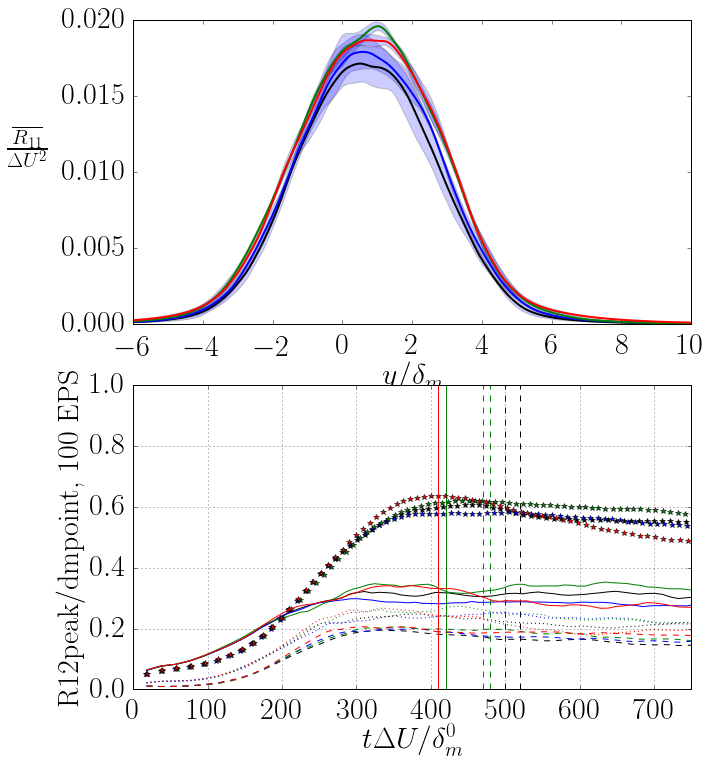

In [30]:
icase = 1
print SS1j[lcases[icase]]
print SS2j[lcases[icase]]

SS1j[lcases[icase][0]] = 420
SS1j[lcases[icase][1]] = 420
SS1j[lcases[icase][2]] = 420
SS1j[lcases[icase][3]] = 410
     
SS2j[lcases[icase][0]] = 520
SS2j[lcases[icase][1]] = 500
SS2j[lcases[icase][2]] = 480
SS2j[lcases[icase][3]] = 470

variable = 'R22' #any vector variable available
scaling  = 'dm' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\frac{\overline{R_{11}}}{\Delta U^2}$'
xlabel=r'$y/\delta_m$'
#figname = 'rhom_ave.eps'
figname = 'kk2'
derivative = False
PRINT = True
#SS1j[lcases[icase][3]]=550
#SS2j[lcases[icase][3]]=600
#SS1j[lcases[icase][0]]=400
#SS2j[lcases[icase][0]]=550
fig = plt.figure(figsize=(xlen,2*ylen)) #Define figure with size
ax =fig.add_subplot(2,1,1)
ax2=fig.add_subplot(2,1,2)
ax.set_xlabel(xlabel);
ax.set_ylabel(ylabel,rotation='horizontal',labelpad=35);
if scaling=='dm':
    ax.set_xlim([-6,10])
else:
    ax.set_xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in [icase]:
    DTSS[icase] = 0.0
    dwmin[icase]= 100.0
    #print ycases[icase], fSS[icase]
    for ijob in lcases[icase]:
        yxi,fSS,errorSS = getSScase3(p_folders,[ijob],variable,scaling,SS1j,SS2j,500,derivative,'std',True)
    #DT = fSS[-1]-fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    #fSS=fSS/DT
    #errorSS = errorSS/DT
        ax.plot(yxi,fSS,l_case_style[icase],color=l_job_color[ijob-lcases[icase][0]],lw=2.0)
    #print "MAX RELATIVE ERROR OF THE MEAN of case %s = %s"%(icase,np.nanmax(errorSS)/np.nanmax(fSS)*100)
        ax.fill_between(yxi,fSS+2*errorSS,fSS-2*errorSS,alpha=0.2)
        path = p_folders[ijob]
        with h5py.File(path,"r") as f:
            EPS = np.array(f['EPS'])
            dmpoint = np.array(f['dmpoint'])
            dw = np.array(f['dw'])
            time = np.array(f['time'])
            iSS1 = np.where(time>=SS1j[ijob])[0][0]
            iSS2 = np.where(time>=SS2j[ijob])[0][0]
            DTSS[icase] += time[iSS2]-time[iSS1]
            dwmin[icase] = min(dwmin[icase],dw[iSS1])
            R11peak = np.max(np.array(f['R11']),axis=0)
            R22peak = np.max(np.array(f['R22']),axis=0)
            R33peak = np.max(np.array(f['R33']),axis=0)
            R12peak = np.max(np.array(f['R12']),axis=0)
            y = np.array(f['y'])
            dd = np.array(f['dm'])
            ep = np.array(f['epR'])
            EPS2=np.zeros(len(time))
            iy1=200;iy2=-200
            for it in range(len(time)):
                kk = ep[iy1:iy2,it]#*dd[it]
                EPS2[it] = np.trapz(kk,y[iy1:iy2])
                R12peak[it]=np.abs(R12peak[it])/dmpoint[it]
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
        ax2.plot(time,100*EPS,'*',color=l_job_color[ijob-lcases[icase][0]])
        #ax2.plot(time,dmpoint,color=l_job_color[ijob-lcases[icase][0]])
        #ax2.plot(time,R11peak,color=l_job_color[ijob-lcases[icase][0]])
        #ax2.plot(time,EPS2,color=l_job_color[ijob-lcases[icase][0]])
        ax2.plot(time,10*R11peak,color=l_job_color[ijob-lcases[icase][0]])
        ax2.plot(time,10*R22peak,color=l_job_color[ijob-lcases[icase][0]],ls='dashed')
        ax2.plot(time,10*R33peak,color=l_job_color[ijob-lcases[icase][0]],ls='dotted')
        #ax2.plot([SS1j[ijob],SS1j[ijob]],[0,np.max(dmpoint)], color=l_job_color[ijob-lcases[icase][0]])
        print ijob
        ax2.set_ylim([0.0,1.0])
        ax2.plot([SS1j[ijob],SS1j[ijob]],[0,1], color=l_job_color[ijob-lcases[icase][0]])
        ax2.plot([SS2j[ijob],SS2j[ijob]],[0,1], color=l_job_color[ijob-lcases[icase][0]],ls='dashed')
ax2.set_xlabel(r'$t\Delta U /\delta_m^0$')
ax2.set_ylabel(r'R12peak/dmpoint, 100 EPS')
ax2.set_xlim(right=900)
ax2.set_xlim(0,750)
ax.yaxis.label.set_fontsize(30)    
print "DTSS[%s]/dw = %s"%(icase,DTSS[icase]/dwmin[icase])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

# s = 4

[ 500.  500.  500.  500.]
[ 660.31518555  660.31518555  660.31518555  660.31518555]
/share/drive/toni/VDML/s40/01/h5.stats
Max of standard deviation = 3.65475371865 o/o
Number of profiles = 7
Giving std-deviation error
8
/share/drive/toni/VDML/s40/02/h5.stats


/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in divide


Max of standard deviation = 3.23462585437 o/o
Number of profiles = 9
Giving std-deviation error
9
/share/drive/toni/VDML/s40/03/h5.stats
Max of standard deviation = 2.25049414679 o/o
Number of profiles = 7
Giving std-deviation error
10
/share/drive/toni/VDML/s40/04/h5.stats
Max of standard deviation = 3.2291966908 o/o
Number of profiles = 8
Giving std-deviation error
11
DTSS[2]/dw = 9.81194236988
figure saved!


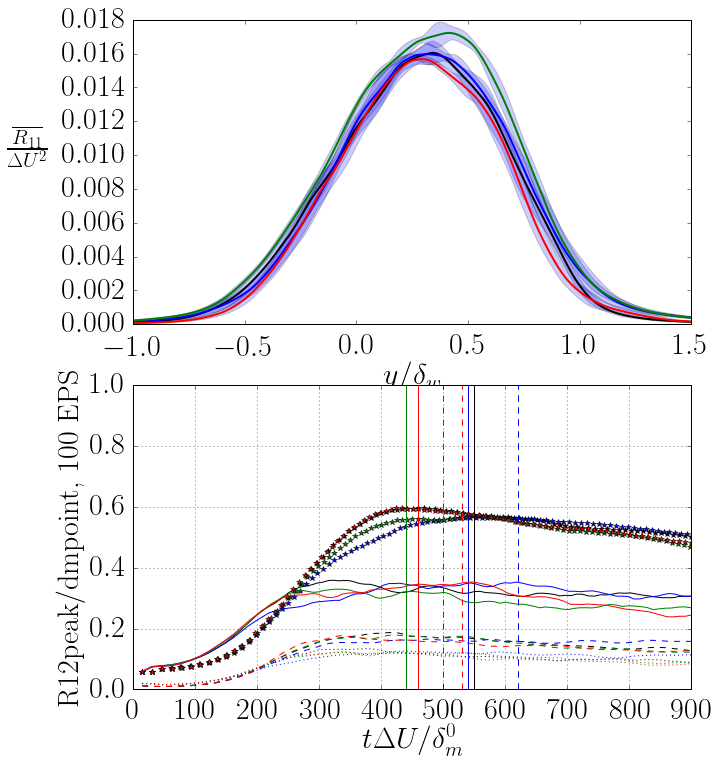

In [31]:
icase = 2
print SS1j[lcases[icase]]
print SS2j[lcases[icase]]



SS1j[lcases[icase][0]] = 550
SS1j[lcases[icase][1]] = 540#450
SS1j[lcases[icase][2]] = 440
SS1j[lcases[icase][3]] = 460

     
SS2j[lcases[icase][0]] = 620
SS2j[lcases[icase][1]] = 620
SS2j[lcases[icase][2]] = 500
SS2j[lcases[icase][3]] = 530


variable = 'R22' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\frac{\overline{R_{11}}}{\Delta U^2}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'kk2'
derivative = False
PRINT = True
#SS1j[lcases[icase][3]]=550
#SS2j[lcases[icase][3]]=600
#SS1j[lcases[icase][0]]=400
#SS2j[lcases[icase][0]]=550
fig = plt.figure(figsize=(xlen,2*ylen)) #Define figure with size
ax =fig.add_subplot(2,1,1)
ax2=fig.add_subplot(2,1,2)
ax.set_xlabel(xlabel);
ax.set_ylabel(ylabel,rotation='horizontal',labelpad=35);
if scaling=='dm':
    ax.set_xlim([-6,10])
else:
    ax.set_xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in [icase]:
    DTSS[icase] = 0.0
    dwmin[icase]= 100.0
    #print ycases[icase], fSS[icase]
    for ijob in lcases[icase]:
        yxi,fSS,errorSS = getSScase3(p_folders,[ijob],variable,scaling,SS1j,SS2j,500,derivative,'std',True)
    #DT = fSS[-1]-fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    #fSS=fSS/DT
    #errorSS = errorSS/DT
        ax.plot(yxi,fSS,l_case_style[icase],color=l_job_color[ijob-lcases[icase][0]],lw=2.0)
    #print "MAX RELATIVE ERROR OF THE MEAN of case %s = %s"%(icase,np.nanmax(errorSS)/np.nanmax(fSS)*100)
        ax.fill_between(yxi,fSS+2*errorSS,fSS-2*errorSS,alpha=0.2)
        path = p_folders[ijob]
        with h5py.File(path,"r") as f:
            EPS = np.array(f['EPS'])
            dmpoint = np.array(f['dmpoint'])
            dw = np.array(f['dw'])
            time = np.array(f['time'])
            iSS1 = np.where(time>=SS1j[ijob])[0][0]
            iSS2 = np.where(time>=SS2j[ijob])[0][0]
            DTSS[icase] += time[iSS2]-time[iSS1]
            dwmin[icase] = min(dwmin[icase],dw[iSS1])
            R11peak = np.max(np.array(f['R11']),axis=0)
            R22peak = np.max(np.array(f['R22']),axis=0)
            R12peak = np.max(np.array(f['R12']),axis=0)
            R33peak = np.max(np.array(f['R12']),axis=0)
            y = np.array(f['y'])
            dd = np.array(f['dm'])
            ep = np.array(f['epR'])
            EPS2=np.zeros(len(time))
            iy1=200;iy2=-200
            for it in range(len(time)):
                kk = ep[iy1:iy2,it]#*dd[it]
                EPS2[it] = np.trapz(kk,y[iy1:iy2])
                R12peak[it]=np.abs(R12peak[it])/dmpoint[it]
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
        ax2.plot(time,100*EPS,'*',color=l_job_color[ijob-lcases[icase][0]])
        #ax2.plot(time,dmpoint,color=l_job_color[ijob-lcases[icase][0]])
        #ax2.plot(time,R11peak,color=l_job_color[ijob-lcases[icase][0]])
        #ax2.plot(time,EPS2,color=l_job_color[ijob-lcases[icase][0]])
        ax2.plot(time,10*R11peak,color=l_job_color[ijob-lcases[icase][0]])
        ax2.plot(time,10*R22peak,color=l_job_color[ijob-lcases[icase][0]],ls='dashed')
        ax2.plot(time,10*R33peak,color=l_job_color[ijob-lcases[icase][0]],ls='dotted')
        ax2.plot([SS1j[ijob],SS1j[ijob]],[0,1], color=l_job_color[ijob-lcases[icase][0]])
        ax2.plot([SS2j[ijob],SS2j[ijob]],[0,1], color=l_job_color[ijob-lcases[icase][0]],ls='dashed')
        print ijob
        ax2.set_ylim([0.0,1.0])
        #ax2.plot([SS2j[ijob],SS2j[ijob]],[0,np.max(dmpoint)], color=l_job_color[ijob-lcases[icase][0]])
ax2.set_xlabel(r'$t\Delta U /\delta_m^0$')
ax2.set_ylabel(r'R12peak/dmpoint, 100 EPS')
print "DTSS[%s]/dw = %s"%(icase,DTSS[icase]/dwmin[icase])
ax2.set_xlim(right=900)
ax.yaxis.label.set_fontsize(30)     
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

# s=8

[ 550.  550.  550.  550.]
[ 639.152771  639.152771  639.152771  639.152771]
/share/drive/toni/VDML/s80/01/h5.stats
Max of standard deviation = 4.88469508193 o/o
Number of profiles = 15
Giving std-deviation error
12
/share/drive/toni/VDML/s80/02/h5.stats
Max of standard deviation = 4.19790688951 o/o
Number of profiles = 8
Giving std-deviation error


/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:41: RuntimeWarning: invalid value encountered in divide


13
/share/drive/toni/VDML/s80/03/h5.stats
Max of standard deviation = 3.66758855047 o/o
Number of profiles = 11
Giving std-deviation error
14
/share/drive/toni/VDML/s80/04/h5.stats
Max of standard deviation = 4.95539749792 o/o
Number of profiles = 8
Giving std-deviation error
15
DTSS[3]/dw = 10.5436413063
figure saved!


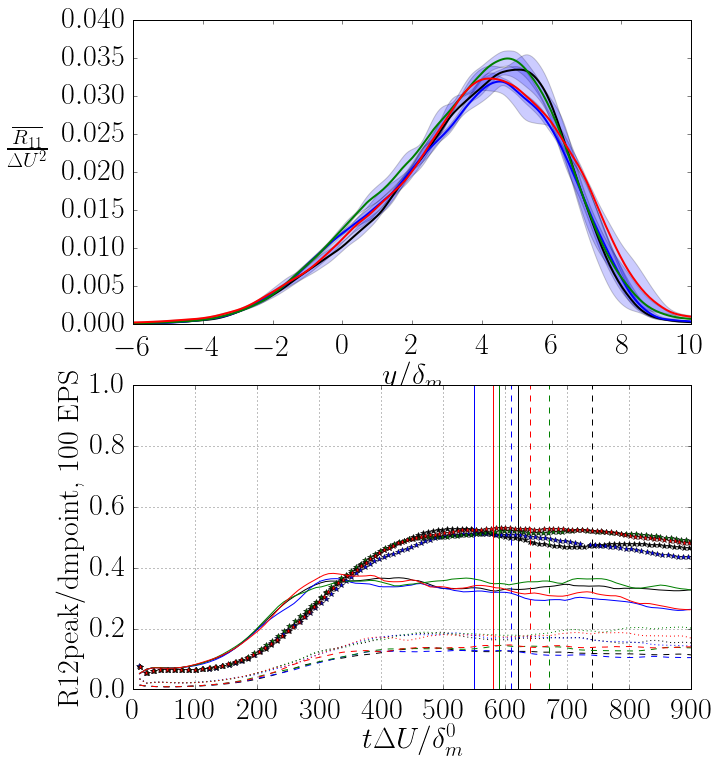

In [32]:
icase = 3
print SS1j[lcases[icase]]
print SS2j[lcases[icase]]
SS1j[lcases[icase][0]] = 620
SS1j[lcases[icase][1]] = 550#450
SS1j[lcases[icase][2]] = 590
SS1j[lcases[icase][3]] = 580

     
SS2j[lcases[icase][0]] = 740
SS2j[lcases[icase][1]] = 610#500
SS2j[lcases[icase][2]] = 670#680#580
SS2j[lcases[icase][3]] = 640


variable = 'R11' #any vector variable available
scaling  = 'dm' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\frac{\overline{R_{11}}}{\Delta U^2}$'
xlabel=r'$y/\delta_m$'
#figname = 'rhom_ave.eps'
figname = 'kk2'
derivative = False
PRINT = True
#SS1j[lcases[icase][3]]=550
#SS2j[lcases[icase][3]]=600
#SS1j[lcases[icase][0]]=400
#SS2j[lcases[icase][0]]=550
fig = plt.figure(figsize=(xlen,2*ylen)) #Define figure with size
ax =fig.add_subplot(2,1,1)
ax2=fig.add_subplot(2,1,2)
ax.set_xlabel(xlabel);
ax.set_ylabel(ylabel,rotation='horizontal',labelpad=35);
if scaling=='dm':
    ax.set_xlim([-6,10])
else:
    ax.set_xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in [icase]:
    DTSS[icase] = 0.0
    dwmin[icase]= 100.0
    #print ycases[icase], fSS[icase]
    for ijob in lcases[icase]:
        yxi,fSS,errorSS = getSScase3(p_folders,[ijob],variable,scaling,SS1j,SS2j,500,derivative,'std',True)
    #DT = fSS[-1]-fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    #fSS=fSS/DT
    #errorSS = errorSS/DT
        ax.plot(yxi,fSS,l_case_style[icase],color=l_job_color[ijob-lcases[icase][0]],lw=2.0)
    #print "MAX RELATIVE ERROR OF THE MEAN of case %s = %s"%(icase,np.nanmax(errorSS)/np.nanmax(fSS)*100)
        ax.fill_between(yxi,fSS+2*errorSS,fSS-2*errorSS,alpha=0.2)
        path = p_folders[ijob]
        with h5py.File(path,"r") as f:
            EPS = np.array(f['EPS'])
            dmpoint = np.array(f['dmpoint'])
            dw = np.array(f['dw'])
            time = np.array(f['time'])
            iSS1 = np.where(time>=SS1j[ijob])[0][0]
            iSS2 = np.where(time>=SS2j[ijob])[0][0]
            DTSS[icase] += time[iSS2]-time[iSS1]
            dwmin[icase] = min(dwmin[icase],dw[iSS1])
            R11peak = np.max(np.array(f['R11']),axis=0)
            R22peak = np.max(np.array(f['R22']),axis=0)
            R33peak = np.max(np.array(f['R33']),axis=0)
            R12peak = np.max(np.array(f['R12']),axis=0)
            y = np.array(f['y'])
            dd = np.array(f['dm'])
            ep = np.array(f['epR'])
            EPS2=np.zeros(len(time))
            iy1=200;iy2=-200
            for it in range(len(time)):
                kk = ep[iy1:iy2,it]#*dd[it]
                EPS2[it] = np.trapz(kk,y[iy1:iy2])
                R12peak[it]=np.abs(R12peak[it])/dmpoint[it]
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
        ax2.plot(time,100*EPS,'*',color=l_job_color[ijob-lcases[icase][0]])
        #ax2.plot(time,dmpoint,color=l_job_color[ijob-lcases[icase][0]])
        #ax2.plot(time,R11peak,color=l_job_color[ijob-lcases[icase][0]])
        #ax2.plot(time,EPS2,color=l_job_color[ijob-lcases[icase][0]])
        ax2.plot(time,10*R11peak,color=l_job_color[ijob-lcases[icase][0]])
        ax2.plot(time,10*R22peak,color=l_job_color[ijob-lcases[icase][0]],ls='dashed')
        ax2.plot(time,10*R33peak,color=l_job_color[ijob-lcases[icase][0]],ls='dotted')
        ax2.plot([SS1j[ijob],SS1j[ijob]],[0,1], color=l_job_color[ijob-lcases[icase][0]])
        ax2.plot([SS2j[ijob],SS2j[ijob]],[0,1], color=l_job_color[ijob-lcases[icase][0]],ls='dashed')
        print ijob
        ax2.set_ylim([0.0,1.0])
        #ax2.plot([SS2j[ijob],SS2j[ijob]],[0,np.max(dmpoint)], color=l_job_color[ijob-lcases[icase][0]])
ax2.set_xlabel(r'$t\Delta U /\delta_m^0$')
ax2.set_ylabel(r'R12peak/dmpoint, 100 EPS')
ax2.set_xlim(right=900)
ax.yaxis.label.set_fontsize(30)     

print "DTSS[%s]/dw = %s"%(icase,DTSS[icase]/dwmin[icase])

if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

In [33]:
for icase in range(ncases):
    print DTSS[icase]/dwmin[icase]

10.0323016779
10.2478449453
9.81194236988
10.5436413063


31 profiles plot
figure saved!


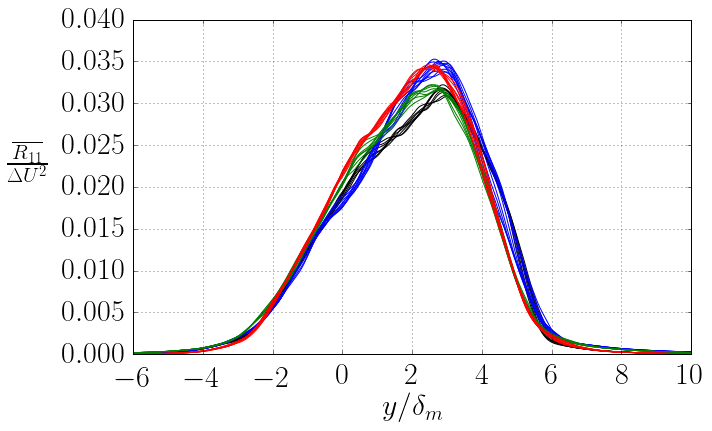

In [34]:
from scipy.special import erf
variable = 'R11' #any vector variable available
scaling  = 'dm' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\frac{\overline{R_{11}}}{\Delta U^2}$'
xlabel=r'$y/\delta_m$'
#figname = 'rhom_ave.eps'
figname = 'R11_s4_all_dm'
derivative = False
PRINT = True
Ntimes=41
icase=2

fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=35);
if scaling=='dm':
    plt.xlim([-6,10])
    yxi = np.linspace(-6,10,300)
else:
    plt.xlim([-1,1.5])
    yxi = np.linspace(-1,1.5,300)
#plt.ylim([0.0,1.1])
plt.grid('on')
#print "SHOWING 2*ERROR OF THE MEAN (95% confidence)"
#for icase in range(len(lcases)):

for icase in [icase]:
    count = 0
    [tint,deltaint,deltastd] = gettimeaverage(p_folders,lcases[icase],scaling,SS1j,SS2j,Ntimes)
    #print ycases[icase], fSS[icase]
    for ijob in lcases[icase]:
        path = p_folders[ijob]
        with h5py.File(path,"r") as f:
            time = np.array(f['time']);
            fun = np.array(f[variable]);
            y = np.array(f['y'])
            if variable=='rum':
                rhom = np.array(f['rhom'])
                fun = np.divide(fun,rhom)
            #print "computed rum/rhom"
            delta = np.array(f[scaling])
            it1 = where(time>=SS1j[ijob])[0][0]
            it2 = where(time>=SS2j[ijob])[0][0]
            #print "SS1[%s]  = %s" %(ijob,SS1[ijob])
            #print "SS2[%s] = %s" %(ijob,SS2[ijob])
            for itime in range(it1,it2):
                dd = delta[itime]
                #dd = np.interp(time[itime],tint,deltaint)
                #edelta = 0.01*dd
                #edelta = np.interp(time[itime],tint,deltastd)
                funint = np.interp(yxi,y/dd,fun[:,itime])
                plt.plot(yxi,funint,color=l_job_color[ijob-lcases[icase][0]])
                count += 1
        
    print "%s profiles plot"%(count)
    #yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    #fSS=fSS/DT
    #errorSS = errorSS/DT
    #plt.plot(yxi,fSS,l_case_style[icase],lw=2.0)
    #print "MAX RELATIVE ERROR OF THE MEAN of case %s = %s"%(icase,np.nanmax(errorSS)/np.nanmax(fSS)*100)
    #plt.fill_between(yxi,fSS+2*errorSS,fSS-2*errorSS,alpha=0.2)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
ax.yaxis.label.set_fontsize(30)    
#plt.plot(yxi,-0.5*erf(yxi/2.5),'k--')

#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(ums20pantano[:,0],ums20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(ums40pantano[:,0],ums40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(ums80pantano[:,0],ums80pantano[:,1],'o',color=l_case_color[3],markevery=2)   
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

31 profiles plot
figure saved!


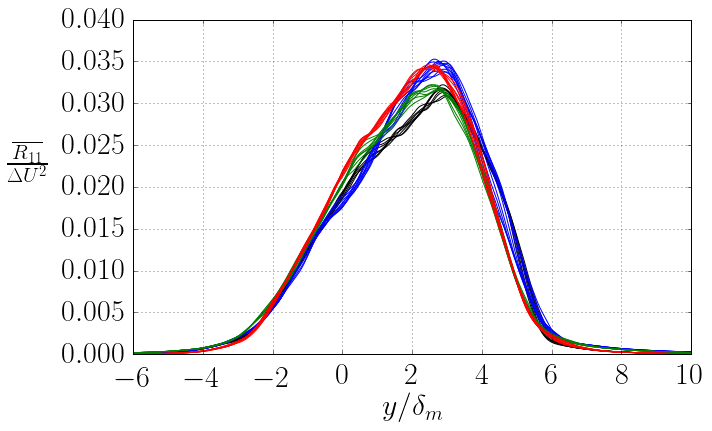

In [35]:
from scipy.special import erf
variable = 'R11' #any vector variable available
scaling  = 'dm' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\frac{\overline{R_{11}}}{\Delta U^2}$'
xlabel=r'$y/\delta_m$'
#figname = 'rhom_ave.eps'
figname = 'R11_s4_all_dm'
derivative = False
PRINT = True
Ntimes=41
icase=2

fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=35);
if scaling=='dm':
    plt.xlim([-6,10])
    yxi = np.linspace(-6,10,300)
else:
    plt.xlim([-1,1.5])
    yxi = np.linspace(-1,1.5,300)
#plt.ylim([0.0,1.1])
plt.grid('on')
#print "SHOWING 2*ERROR OF THE MEAN (95% confidence)"
#for icase in range(len(lcases)):

for icase in [icase]:
    count = 0
    [tint,deltaint,deltastd] = gettimeaverage(p_folders,lcases[icase],scaling,SS1j,SS2j,Ntimes)
    #print ycases[icase], fSS[icase]
    for ijob in lcases[icase]:
        path = p_folders[ijob]
        with h5py.File(path,"r") as f:
            time = np.array(f['time']);
            fun = np.array(f[variable]);
            y = np.array(f['y'])
            if variable=='rum':
                rhom = np.array(f['rhom'])
                fun = np.divide(fun,rhom)
            #print "computed rum/rhom"
            delta = np.array(f[scaling])
            it1 = where(time>=SS1j[ijob])[0][0]
            it2 = where(time>=SS2j[ijob])[0][0]
            #print "SS1[%s]  = %s" %(ijob,SS1[ijob])
            #print "SS2[%s] = %s" %(ijob,SS2[ijob])
            for itime in range(it1,it2):
                dd = delta[itime]
                #dd = np.interp(time[itime],tint,deltaint)
                #edelta = 0.01*dd
                #edelta = np.interp(time[itime],tint,deltastd)
                funint = np.interp(yxi,y/dd,fun[:,itime])
                plt.plot(yxi,funint,color=l_job_color[ijob-lcases[icase][0]])
                count += 1
        
    print "%s profiles plot"%(count)
    #yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    #fSS=fSS/DT
    #errorSS = errorSS/DT
    #plt.plot(yxi,fSS,l_case_style[icase],lw=2.0)
    #print "MAX RELATIVE ERROR OF THE MEAN of case %s = %s"%(icase,np.nanmax(errorSS)/np.nanmax(fSS)*100)
    #plt.fill_between(yxi,fSS+2*errorSS,fSS-2*errorSS,alpha=0.2)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
ax.yaxis.label.set_fontsize(30)    
#plt.plot(yxi,-0.5*erf(yxi/2.5),'k--')

#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(ums20pantano[:,0],ums20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(ums40pantano[:,0],ums40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(ums80pantano[:,0],ums80pantano[:,1],'o',color=l_case_color[3],markevery=2)   
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

In [36]:

print SS1j
print SS2j

for icase in range(len(lcases)):
    SS1[icase]=2000
    SS2[icase]=0.0
    for ijob in lcases[icase]:
        SS1[icase]=min(SS1j[ijob],SS1[icase])
        SS2[icase]=max(SS2j[ijob],SS2[icase])
        
print SS1
print SS2

[ 380.  460.  450.  450.  420.  420.  420.  410.  550.  540.  440.  460.
  620.  550.  590.  580.]
[ 450.  510.  530.  510.  520.  500.  480.  470.  620.  620.  500.  530.
  740.  610.  670.  640.]
[380.0, 410.0, 440.0, 550.0]
[ 530.  520.  620.  740.]


In [37]:
tmax=np.max(SS2)+30


# $\zeta$ vs time

['/share/drive/toni/VDML/s10/02/h5.stats', '/share/drive/toni/VDML/s10/03/h5.stats', '/share/drive/toni/VDML/s10/04/newman/h5.stats', '/share/drive/toni/VDML/s10/06/h5.stats']
['/share/drive/toni/VDML/s20/01/h5.stats', '/share/drive/toni/VDML/s20/02/h5.stats', '/share/drive/toni/VDML/s20/03/h5.stats', '/share/drive/toni/VDML/s20/04/h5.stats']
['/share/drive/toni/VDML/s40/01/h5.stats', '/share/drive/toni/VDML/s40/02/h5.stats', '/share/drive/toni/VDML/s40/03/h5.stats', '/share/drive/toni/VDML/s40/04/h5.stats']
['/share/drive/toni/VDML/s80/01/h5.stats', '/share/drive/toni/VDML/s80/02/h5.stats', '/share/drive/toni/VDML/s80/03/h5.stats', '/share/drive/toni/VDML/s80/04/h5.stats']
figure saved at /share/drive/toni/VDML/JFM_201706/EPS_vs_time.pdf


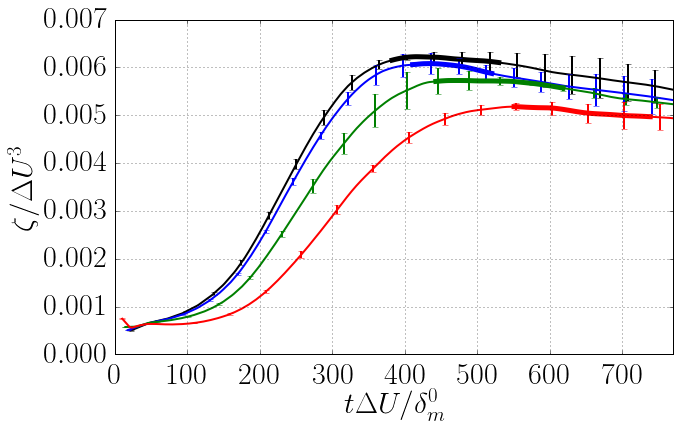

In [38]:
variable = 'EPS'
xlabel = r'$t\Delta U/\delta_m^0$'
ylabel = r'$\zeta/\Delta U^3$'
figname = variable+'_vs_time'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.grid('on')
plt.xlabel(xlabel)
plt.ylabel(ylabel)
for icase in range(ncases):
    print p_folders[lcases[icase][0]:lcases[icase][-1]+1]
    time,fun,fstd = gettimeaverage(p_folders,lcases[icase],variable,np.zeros(len(lgroup)),SS2j+250,Npoints)
    plt.errorbar(time,fun,yerr=fstd,errorevery=Npoints/20,lw=2.0,color=l_case_color[icase])
    it1=np.where(time>=SS1[icase])[0][0]
    it2=np.where(time>=SS2[icase])[0][0]
    plt.plot(time[it1:it2],fun[it1:it2],lw=5.0,alpha=1.0,color=l_case_color[icase])
plt.ylim(bottom=0.0)
plt.xlim(right=tmax)
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure saved at %s"%(pathname)

figure saved at /share/drive/toni/VDML/JFM_201706/EPSall_vs_time.pdf


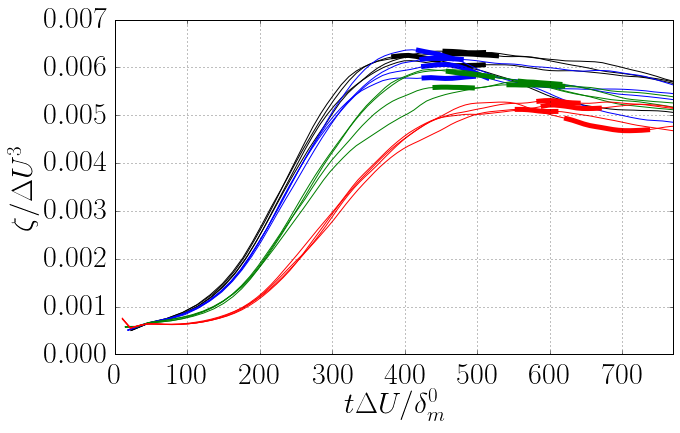

In [39]:
variable = 'EPS'
xlabel = r'$t\Delta U/\delta_m^0$'
ylabel = r'$\zeta/\Delta U^3$'
figname = variable+'all_vs_time'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.grid('on')
plt.xlabel(xlabel)
plt.ylabel(ylabel)
for icase in range(ncases):
    for ijob in lcases[icase]:
        path = p_folders[ijob]
        with h5py.File(path,"r") as f:
            time = np.array(f['time']);
            fun = np.array(f[variable]);
    #plt.errorbar(time,fun,yerr=fstd,errorevery=Npoints/20,lw=2.0,color=l_case_color[icase])
        plt.plot(time,fun,l_case_color[icase])
        it1=np.where(time>=SS1j[ijob])[0][0]
        it2=np.where(time>=SS2j[ijob])[0][0]
        plt.plot(time[it1:it2],fun[it1:it2],lw=5.0,alpha=1.0,color=l_case_color[icase])
plt.ylim(bottom=0.0)
plt.xlim(right=tmax)
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure saved at %s"%(pathname)

['/share/drive/toni/VDML/s10/02/h5.stats', '/share/drive/toni/VDML/s10/03/h5.stats', '/share/drive/toni/VDML/s10/04/newman/h5.stats', '/share/drive/toni/VDML/s10/06/h5.stats']
['/share/drive/toni/VDML/s20/01/h5.stats', '/share/drive/toni/VDML/s20/02/h5.stats', '/share/drive/toni/VDML/s20/03/h5.stats', '/share/drive/toni/VDML/s20/04/h5.stats']
['/share/drive/toni/VDML/s40/01/h5.stats', '/share/drive/toni/VDML/s40/02/h5.stats', '/share/drive/toni/VDML/s40/03/h5.stats', '/share/drive/toni/VDML/s40/04/h5.stats']
['/share/drive/toni/VDML/s80/01/h5.stats', '/share/drive/toni/VDML/s80/02/h5.stats', '/share/drive/toni/VDML/s80/03/h5.stats', '/share/drive/toni/VDML/s80/04/h5.stats']
figure saved at /share/drive/toni/VDML/JFM_201706/dm_vs_time.pdf


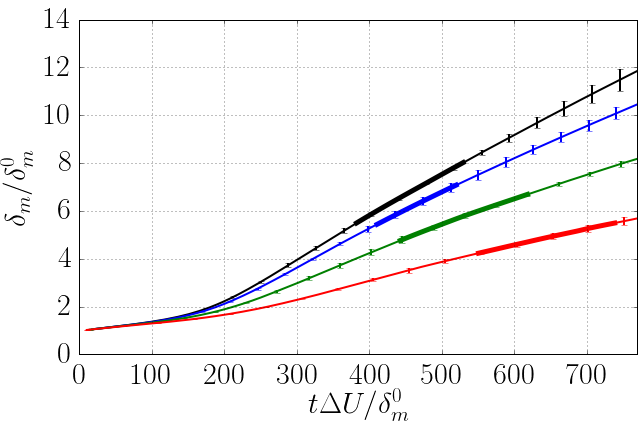

In [40]:
variable = 'dm'
xlabel = r'$t\Delta U/\delta_m^0$'
#ylabel = r'$\zeta/\Delta U^3$'
ylabel = r'$\delta_m/\delta_m^0$'
figname = variable+'_vs_time'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.grid('on')
plt.xlabel(xlabel)
plt.ylabel(ylabel)
for icase in range(ncases):
    print p_folders[lcases[icase][0]:lcases[icase][-1]+1]
    time,fun,fstd = gettimeaverage(p_folders,lcases[icase],variable,np.zeros(len(lgroup)),SS2j+250,Npoints)
    plt.errorbar(time,fun,yerr=fstd,errorevery=Npoints/20,lw=2.0,color=l_case_color[icase])
    it1=np.where(time>=SS1[icase])[0][0]
    it2=np.where(time>=SS2[icase])[0][0]
    plt.plot(time[it1:it2],fun[it1:it2],lw=5.0,alpha=1.0,color=l_case_color[icase])
plt.ylim(bottom=0.0)
plt.xlim(right=tmax)
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure saved at %s"%(pathname)

# $Re_\lambda$ vs time

['/share/drive/toni/VDML/s10/02/h5.stats', '/share/drive/toni/VDML/s10/03/h5.stats', '/share/drive/toni/VDML/s10/04/newman/h5.stats', '/share/drive/toni/VDML/s10/06/h5.stats']
['/share/drive/toni/VDML/s20/01/h5.stats', '/share/drive/toni/VDML/s20/02/h5.stats', '/share/drive/toni/VDML/s20/03/h5.stats', '/share/drive/toni/VDML/s20/04/h5.stats']
['/share/drive/toni/VDML/s40/01/h5.stats', '/share/drive/toni/VDML/s40/02/h5.stats', '/share/drive/toni/VDML/s40/03/h5.stats', '/share/drive/toni/VDML/s40/04/h5.stats']
['/share/drive/toni/VDML/s80/01/h5.stats', '/share/drive/toni/VDML/s80/02/h5.stats', '/share/drive/toni/VDML/s80/03/h5.stats', '/share/drive/toni/VDML/s80/04/h5.stats']
figure saved at /share/drive/toni/VDML/JFM_201706/Relambda_vs_time.pdf


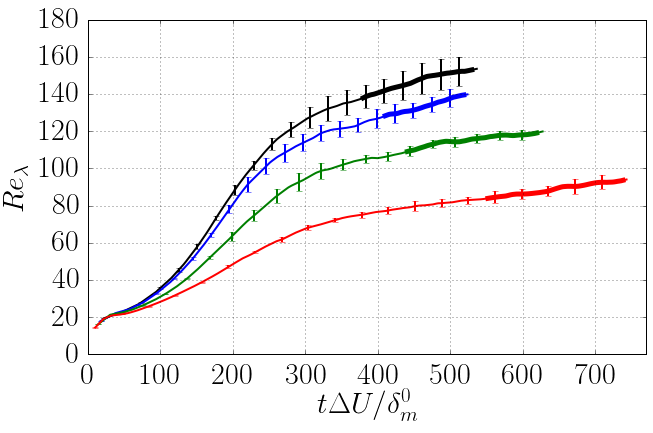

In [41]:
variable = 'Relambda'
xlabel = r'$t\Delta U/\delta_m^0$'
#ylabel = r'$\zeta/\Delta U^3$'
ylabel = r'$Re_\lambda$'
figname = variable+'_vs_time'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.grid('on')
plt.xlabel(xlabel)
plt.ylabel(ylabel)
for icase in range(ncases):
    print p_folders[lcases[icase][0]:lcases[icase][-1]+1]
    time,fun,fstd = gettimeaverage(p_folders,lcases[icase],variable,np.zeros(len(lgroup)),SS2j,Npoints)
    plt.errorbar(time,fun,yerr=fstd,errorevery=Npoints/20,lw=2.0,color=l_case_color[icase])
    it1=np.where(time>=SS1[icase])[0][0]
    it2=np.where(time>=SS2[icase])[0][0]
    plt.plot(time[it1:it2],fun[it1:it2],lw=5.0,alpha=1.0,color=l_case_color[icase])
plt.ylim(bottom=0.0)
plt.xlim(right=tmax)
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure saved at %s"%(pathname)

# $\delta_w$ vs time

['/share/drive/toni/VDML/s10/02/h5.stats', '/share/drive/toni/VDML/s10/03/h5.stats', '/share/drive/toni/VDML/s10/04/newman/h5.stats', '/share/drive/toni/VDML/s10/06/h5.stats']
['/share/drive/toni/VDML/s20/01/h5.stats', '/share/drive/toni/VDML/s20/02/h5.stats', '/share/drive/toni/VDML/s20/03/h5.stats', '/share/drive/toni/VDML/s20/04/h5.stats']
['/share/drive/toni/VDML/s40/01/h5.stats', '/share/drive/toni/VDML/s40/02/h5.stats', '/share/drive/toni/VDML/s40/03/h5.stats', '/share/drive/toni/VDML/s40/04/h5.stats']
['/share/drive/toni/VDML/s80/01/h5.stats', '/share/drive/toni/VDML/s80/02/h5.stats', '/share/drive/toni/VDML/s80/03/h5.stats', '/share/drive/toni/VDML/s80/04/h5.stats']
figure saved at /share/drive/toni/VDML/JFM_201706/dw_vs_time.pdf


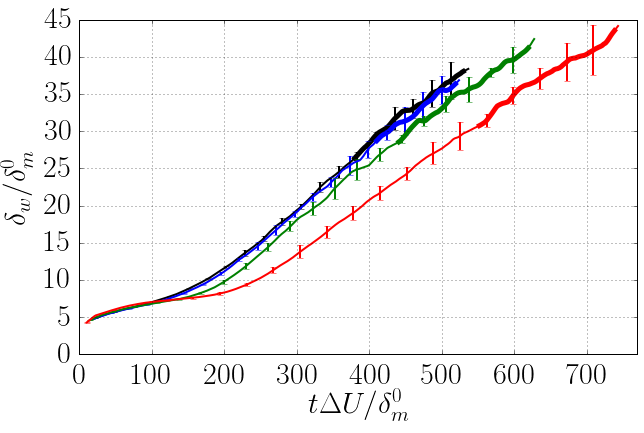

In [42]:
variable = 'dw'
xlabel = r'$t\Delta U/\delta_m^0$'
#ylabel = r'$\zeta/\Delta U^3$'
ylabel = r'$\delta_w/\delta_m^0$'
figname = variable+'_vs_time'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.grid('on')
plt.xlabel(xlabel)
plt.ylabel(ylabel)
for icase in range(ncases):
    print p_folders[lcases[icase][0]:lcases[icase][-1]+1]
    time,fun,fstd = gettimeaverage(p_folders,lcases[icase],variable,np.zeros(len(lgroup)),SS2j,Npoints)
    plt.errorbar(time,fun,yerr=fstd,errorevery=Npoints/20,lw=2.0,color=l_case_color[icase])
    it1=np.where(time>=SS1[icase])[0][0]
    it2=np.where(time>=SS2[icase])[0][0]
    plt.plot(time[it1:it2],fun[it1:it2],lw=5.0,alpha=1.0,color=l_case_color[icase])
plt.ylim(bottom=0.0)
plt.xlim(right=tmax)
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure saved at %s"%(pathname)

# Dyeta vs time

In [43]:
Dx = 461./1535
print Dx

0.300325732899


['/share/drive/toni/VDML/s10/02/h5.stats', '/share/drive/toni/VDML/s10/03/h5.stats', '/share/drive/toni/VDML/s10/04/newman/h5.stats', '/share/drive/toni/VDML/s10/06/h5.stats']
Lx=[ 460.9989624]
Lx=[ 460.9989624]
Lx=[ 460.9989624]
Lx=[ 460.9989624]
['/share/drive/toni/VDML/s20/01/h5.stats', '/share/drive/toni/VDML/s20/02/h5.stats', '/share/drive/toni/VDML/s20/03/h5.stats', '/share/drive/toni/VDML/s20/04/h5.stats']
Lx=[ 460.9989624]
Lx=[ 460.9989624]
Lx=[ 460.9989624]
Lx=[ 460.9989624]
['/share/drive/toni/VDML/s40/01/h5.stats', '/share/drive/toni/VDML/s40/02/h5.stats', '/share/drive/toni/VDML/s40/03/h5.stats', '/share/drive/toni/VDML/s40/04/h5.stats']
Lx=[ 460.9989624]
Lx=[ 460.9989624]
Lx=[ 460.9989624]
Lx=[ 460.9989624]
['/share/drive/toni/VDML/s80/01/h5.stats', '/share/drive/toni/VDML/s80/02/h5.stats', '/share/drive/toni/VDML/s80/03/h5.stats', '/share/drive/toni/VDML/s80/04/h5.stats']
Lx=[ 460.9989624]
Lx=[ 460.9989624]
Lx=[ 460.9989624]
Lx=[ 460.9989624]
figure saved at /share/drive/

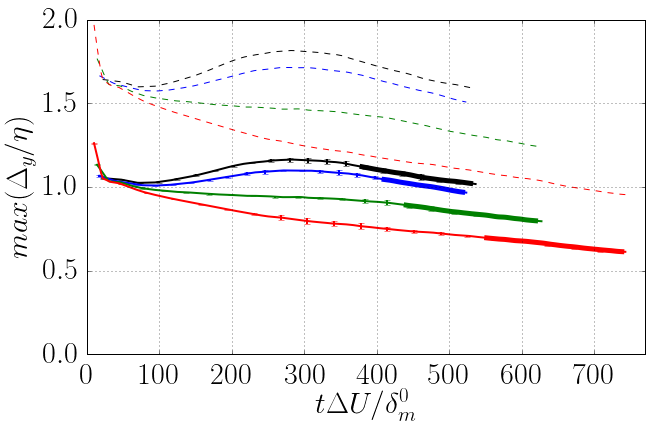

In [44]:
variable = 'dyeta'
xlabel = r'$t\Delta U/\delta_m^0$'
#ylabel = r'$\zeta/\Delta U^3$'
ylabel = r'$max(\Delta_y/\eta)$'
figname = variable+'_vs_time'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.grid('on')
plt.xlabel(xlabel)
plt.ylabel(ylabel)
for icase in range(ncases):
    print p_folders[lcases[icase][0]:lcases[icase][-1]+1]
    time,fun,fstd = gettimeaverage(p_folders,lcases[icase],variable,np.zeros(len(lgroup)),SS2j,Npoints)
    time,fun2,fstd2 = gettimeaverage(p_folders,lcases[icase],'eta',np.zeros(len(lgroup)),SS2j,Npoints)
    plt.errorbar(time,fun,yerr=fstd,errorevery=Npoints/20,lw=2.0,color=l_case_color[icase])
    plt.plot(time,Dx/fun2,ls='dashed',color=l_case_color[icase])
    it1=np.where(time>=SS1[icase])[0][0]
    it2=np.where(time>=SS2[icase])[0][0]
    plt.plot(time[it1:it2],fun[it1:it2],lw=5.0,alpha=1.0,color=l_case_color[icase])
plt.ylim(bottom=0.0)
plt.xlim(right=tmax)
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure saved at %s"%(pathname)

# $Re_{\delta_w}$ vs time

['/share/drive/toni/VDML/s10/02/h5.stats', '/share/drive/toni/VDML/s10/03/h5.stats', '/share/drive/toni/VDML/s10/04/newman/h5.stats', '/share/drive/toni/VDML/s10/06/h5.stats']
['/share/drive/toni/VDML/s20/01/h5.stats', '/share/drive/toni/VDML/s20/02/h5.stats', '/share/drive/toni/VDML/s20/03/h5.stats', '/share/drive/toni/VDML/s20/04/h5.stats']
['/share/drive/toni/VDML/s40/01/h5.stats', '/share/drive/toni/VDML/s40/02/h5.stats', '/share/drive/toni/VDML/s40/03/h5.stats', '/share/drive/toni/VDML/s40/04/h5.stats']
['/share/drive/toni/VDML/s80/01/h5.stats', '/share/drive/toni/VDML/s80/02/h5.stats', '/share/drive/toni/VDML/s80/03/h5.stats', '/share/drive/toni/VDML/s80/04/h5.stats']
figure saved at /share/drive/toni/VDML/JFM_201706/Redw_vs_time.pdf


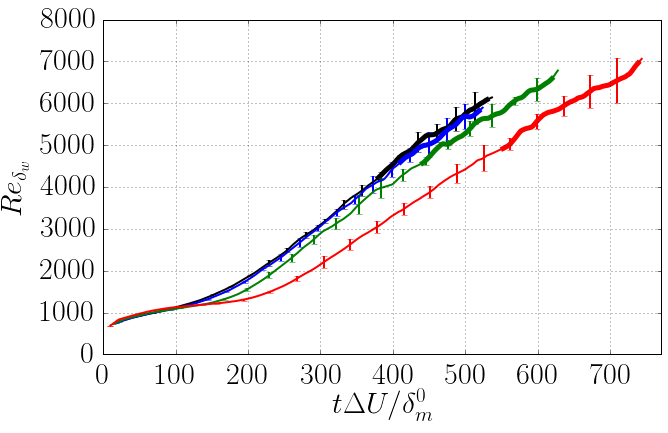

In [45]:
variable = 'dw'
xlabel = r'$t\Delta U/\delta_m^0$'
#ylabel = r'$\zeta/\Delta U^3$'
ylabel = r'$Re_{\delta_w}$'
figname = 'Re'+variable+'_vs_time'
Re=160.0
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.grid('on')
plt.xlabel(xlabel)
plt.ylabel(ylabel)
for icase in range(ncases):
    print p_folders[lcases[icase][0]:lcases[icase][-1]+1]
    time,fun,fstd = gettimeaverage(p_folders,lcases[icase],variable,np.zeros(len(lgroup)),SS2j,Npoints)
    fun = fun*Re
    fstd =Re*fstd
    plt.errorbar(time,fun,yerr=fstd,errorevery=Npoints/20,lw=2.0,color=l_case_color[icase])
    it1=np.where(time>=SS1[icase])[0][0]
    it2=np.where(time>=SS2[icase])[0][0]
    plt.plot(time[it1:it2],fun[it1:it2],lw=5.0,alpha=1.0,color=l_case_color[icase])
plt.ylim(bottom=0.0)
plt.xlim(right=tmax)
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure saved at %s"%(pathname)

# $\dot{\delta}_m/\Delta U $ vs time

['/share/drive/toni/VDML/s10/02/h5.stats', '/share/drive/toni/VDML/s10/03/h5.stats', '/share/drive/toni/VDML/s10/04/newman/h5.stats', '/share/drive/toni/VDML/s10/06/h5.stats']
['/share/drive/toni/VDML/s20/01/h5.stats', '/share/drive/toni/VDML/s20/02/h5.stats', '/share/drive/toni/VDML/s20/03/h5.stats', '/share/drive/toni/VDML/s20/04/h5.stats']
['/share/drive/toni/VDML/s40/01/h5.stats', '/share/drive/toni/VDML/s40/02/h5.stats', '/share/drive/toni/VDML/s40/03/h5.stats', '/share/drive/toni/VDML/s40/04/h5.stats']
['/share/drive/toni/VDML/s80/01/h5.stats', '/share/drive/toni/VDML/s80/02/h5.stats', '/share/drive/toni/VDML/s80/03/h5.stats', '/share/drive/toni/VDML/s80/04/h5.stats']
figure saved at /share/drive/toni/VDML/JFM_201706/dmpoint_vs_time.pdf


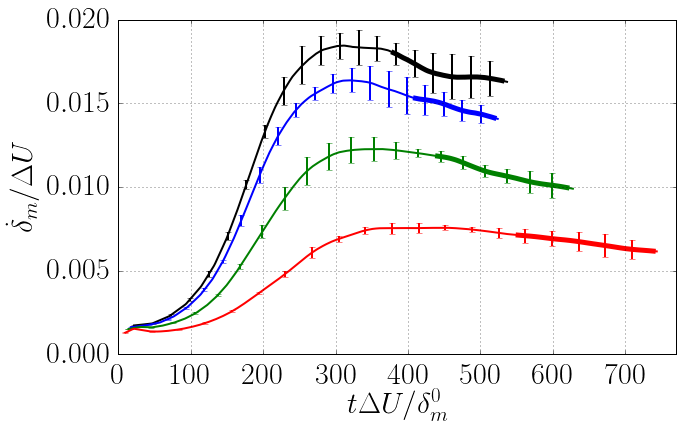

In [46]:
variable = 'dmpoint'
xlabel = r'$t\Delta U/\delta_m^0$'
#ylabel = r'$\zeta/\Delta U^3$'
ylabel = r'$\dot{\delta}_m/\Delta U$'
figname = variable+'_vs_time'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.grid('on')
plt.xlabel(xlabel)
plt.ylabel(ylabel)
for icase in range(ncases):
    print p_folders[lcases[icase][0]:lcases[icase][-1]+1]
    time,fun,fstd = gettimeaverage(p_folders,lcases[icase],variable,np.zeros(len(lgroup)),SS2j,Npoints)
    plt.errorbar(time,fun,yerr=fstd,errorevery=Npoints/20,lw=2.0,color=l_case_color[icase])
    it1=np.where(time>=SS1[icase])[0][0]
    it2=np.where(time>=SS2[icase])[0][0]
    plt.plot(time[it1:it2],fun[it1:it2],lw=5.0,alpha=1.0,color=l_case_color[icase])
plt.ylim(bottom=0.0)
plt.xlim(right=tmax)
#SAVING
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure saved at %s"%(pathname)

# $\dot{\delta_m}$ discussion

In [47]:
variable = 'dmpoint' #Pantano definition-Lacks drhodt!

### Additional term negelected within dmpoint (viscous):

$\frac{-1}{\rho_0 \Delta U^2}\int_{-\infty}^\infty 2 \mu \frac{\partial \overline{u}}{\partial y} \frac{\partial \tilde{u}}{\partial y} dy$

## Dw

In [48]:
import uncertainties as unc  
import uncertainties.unumpy as unumpy 

s = 1.0, Dw = 4.833+/-0.014,  Cdelta = 0.1626+/-0.0028 ,dmpoint = 0.01682+/-0.00028
d(dm)/dt =0.0170470703882 +/- 0.000208397549569 
Difference between slope of mean(dm) and mean(dmpoint)=-1.34 %
s = 2.0, Dw = 5.21+/-0.04,  Cdelta = 0.1529+/-0.0021 ,dmpoint = 0.01467+/-0.00017
d(dm)/dt =0.014949896635 +/- 0.000409614141285 
Difference between slope of mean(dm) and mean(dmpoint)=-1.89 %
s = 4.0, Dw = 6.113+/-0.030,  Cdelta = 0.1315+/-0.0018 ,dmpoint = 0.01075+/-0.00014
d(dm)/dt =0.0108939612716 +/- 0.000217912136845 
Difference between slope of mean(dm) and mean(dmpoint)=-1.29 %
s = 8.0, Dw = 7.67+/-0.05,  Cdelta = 0.1018+/-0.0023 ,dmpoint = 0.00664+/-0.00014
d(dm)/dt =0.00671945425546 +/- 0.000205227073534 
Difference between slope of mean(dm) and mean(dmpoint)=-1.26 %


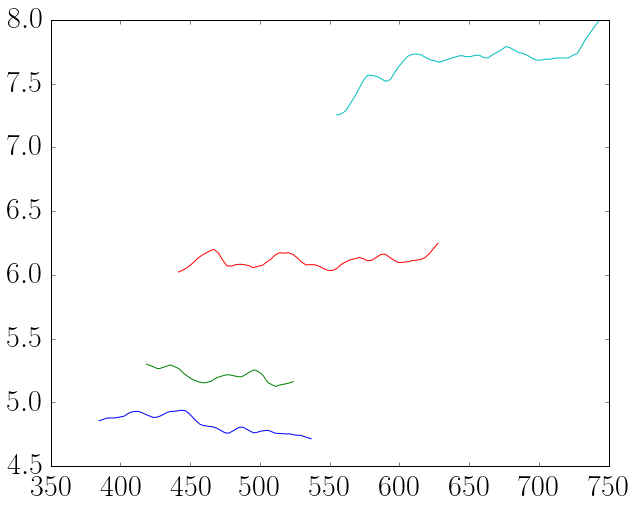

In [49]:
#Preparing plot
vs = [1.0,2.0,4.0,8.]
Dw= unumpy.uarray(np.zeros(ncases), np.zeros(ncases))
Cdelta= unumpy.uarray(np.zeros(ncases), np.zeros(ncases))
vdmp = unumpy.uarray(np.zeros(ncases), np.zeros(ncases))
#fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
from scipy.stats import linregress
#ax=fig.add_subplot(1,1,1)
#Plot all jobs in the same graph
#time_int = np.linspace(tmin,tmax,Npoints)


#errorCdelta = [0 for i in range(njobs)]
vtime = [0 for i in range(njobs)]
mu = 1.0/160
for icase in range(ncases):
    time,dm,dmstd = gettimeaverage(p_folders,lcases[icase],'dm',SS1j,SS2j,60)
    #rho0=0.5*(np.array(f['rhom'][0,-1])+np.array(f['rhom'])[-1,-1])
    slope = linregress(time,dm)
    mdm = slope.slope
    mdmstd = dmstd.max()/dm.max()*mdm
    
    #print mdm
    #Now we dont have the std deviation, we have the error of the mean
    dm = unumpy.uarray(dm,np.sqrt(len(lcases[icase]))*dmstd)
    time,dw,dwstd = gettimeaverage(p_folders,lcases[icase],'dw',SS1j,SS2j,60)
    #slope = linregress(time,dw)
    #mdw = slope.slope
    dw = unumpy.uarray(dw,np.sqrt(len(lcases[icase]))*dmstd)
    plt.plot(time,unumpy.nominal_values(dw/dm))
    Dw[icase]= np.mean(dw/dm)
    time,dmpoint,dmpointstd = gettimeaverage(p_folders,lcases[icase],'dmpoint',SS1j,SS2j,60)
    dmpoint = unumpy.uarray(dmpoint,np.sqrt(len(lcases[icase]))*dmpointstd)
    Cdelta[icase] = 2.0*Dw[icase]*np.mean(dmpoint)
    vdmp[icase] = np.mean(dmpoint)
    print "s = %s, Dw = %s,  Cdelta = %s ,dmpoint = %s" %(vs[icase],Dw[icase],Cdelta[icase],vdmp[icase])
    kk2 = (unumpy.nominal_values(vdmp[icase])-mdm)/unumpy.nominal_values(vdmp[icase])
    print "d(dm)/dt =%s +/- %s " %(mdm,mdmstd)
    print "Difference between slope of mean(dm) and mean(dmpoint)=%s"%(np.round(kk2*100,2)),'%'

In [50]:
Dwratio = [1,5.21/4.833,6.11/4.83,7.67/4.83]
print Dwratio

[1, 1.0780053796813573, 1.2650103519668738, 1.5879917184265009]


In [51]:
print vdmp

[0.016821203211995043+/-0.0002830611712747864
 0.014672522544513547+/-0.00017040340917390742
 0.010754697179303543+/-0.00013852961004838496
 0.006636117756263703+/-0.00014324161384345074]


In [52]:
print vdmp

[0.016821203211995043+/-0.0002830611712747864
 0.014672522544513547+/-0.00017040340917390742
 0.010754697179303543+/-0.00013852961004838496
 0.006636117756263703+/-0.00014324161384345074]


In [53]:
Dwn = unumpy.nominal_values(Dw)
nDw = unumpy.nominal_values(Dw)

In [54]:
def ram(s):
    return 2.0*np.sqrt(s)/(s+1.0)
def lam(s):
    return (s-1.0)/(s+1.0)
def ram3(s,Dw1):
    return 2.0*np.sqrt(s)/(s+1.0)*(1-0.047*lam(s)*Dw1*np.log(s))
lambdas = lam(np.array([1.0,2.0,4.0,8.0]))

In [55]:
vskk = np.linspace(1,64,256);

0.0237978783297
[ 0.          0.33333333  0.6         0.77777778]
[ 4.8330539   5.21007416  6.1128746   7.66807523]
figure saved at /share/drive/toni/VDML/JFM_201706/ratiodm_vs_s.pdf!


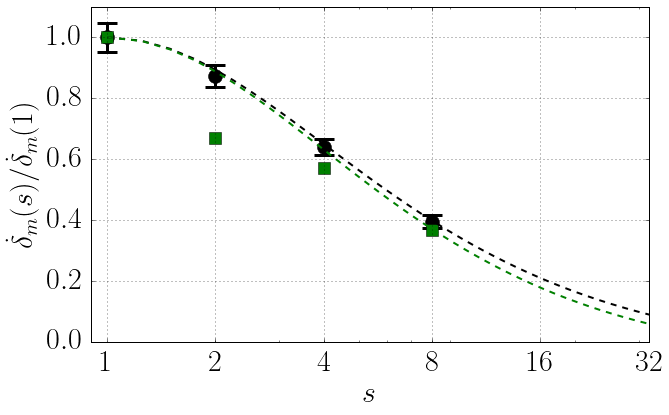

In [56]:
figname = 'ratiodm_vs_s'
ylabel = r'$\dot{\delta}_m(s)/\dot{\delta}_m(1)$'
xlabel = r'$s$'
fformat = '.pdf'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)

#-----------
vs = [1,2,4,8];

vs = np.array(vs)
vs2=np.linspace(1,10,21)
ramshaw = 2*np.sqrt(vs)/(vs+1.0)

#dwpoint = [0,0,0,0]
#dmratio = [0,0,0,0]
#Cdelta = [0,0,0,0]
#for icase in range(ncases):
    #dwpoint[icase] = vdmpoint[icase]/vdmpoint[0]*vDw[icase]/vDw[0]
#    dmratio[icase] = vdmpoint[icase]/vdmpoint[0]
#    Cdelta[icase]  = 2*vdmpoint[icase]*vDw[icase]
kk = np.zeros(ncases)
kke = np.zeros(ncases)
for icase in range(ncases):
    if icase==0:
        kk[icase]=unumpy.nominal_values(vdmp[icase]/vdmp[icase])
        kke[icase]=np.sqrt(2.0)*unumpy.std_devs(vdmp[icase])/unumpy.nominal_values(vdmp[icase])
        
    else:
        kk[icase]=unumpy.nominal_values(vdmp[icase]/vdmp[0])
        kke[icase]=unumpy.std_devs(vdmp[icase]/vdmp[0])
#plt.plot(vs,unumpy.nominal_values(dwpoint[:]),'*')
#plt.plot(vs,kk,'g')
for icase in range(0,ncases):
    nsamples = len(lcases[icase])
    
    #Using 95% of Confidence
    #https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3487226/
    (_,caps,_) = ax.errorbar(vs[icase],kk[icase],yerr=2*kke[icase],marker='o',mfc='k', \
               ms=14.0,color='k',capsize=10,lw=3.0)
    for cap in caps:
        #cap.set_color('red')
        cap.set_markeredgewidth(3)
#plt.plot(vs, kk,'r^-',lw=2.0,ms=10)
print kke[0]
#plt.plot(vs, kk+kke,'b-')
#plt.plot(vs, kk-kke,'b-')
#plt.fill_between(vs,kk+kke,kk-kke,alpha=0.2)
plt.plot(pantanodotdm[0],pantanodotdm[1],'gs',ms=12)
#plt.plot(vs,fpant,'k^',ms=10)
#plt.plot(vs2,ramshaw,'--')
plt.ylim([0,1.1])
#plt.xlim([0,10])
plt.xscale('log')
#plt.plot(vs,dmpoint_lam/dmpoint_lam[0],'y^',ms=12)
plt.xlim([0.9,32])
#plt.plot(vs,dmpoint_lam/dmpoint_lam[0],'*')
ax.set_xticks([1,2, 4, 8,16,32])
ax.get_xaxis().set_major_formatter(plt.matplotlib.ticker.ScalarFormatter())
plt.xlabel(xlabel)
plt.ylabel(ylabel)
#Test APPROX
print lambdas
#Formula from OScar with shifting and not changing the slope
#test = ramshaw*(1.0-2*lambdas*Dy_shift_dw+lambdas*2*Dy_shift_dw**3)
#My formula with changing slope but chaning sign...
#test = ramshaw-2*Dy_shift_dw/5.0
print nDw
#test = ramshaw/nDw*nDw[0]

#test = ramshaw-2*Dy_shift_pantano/Dwpant/4.8
plt.plot(vskk,ram3(vskk,nDw[0]),'k--',lw=2.0)
plt.plot(vskk,ram3(vskk,DwPant[0]),'g--',lw=2.0)
#plt.plot(vs,nDw[0]/nDw)
#plt.plot(vs,1.0-Dy_shift_dw,'k--',lw=2.0)
#plt.plot(vs,1.0-Dy_shift_dw,'k--',lw=2.0)
#plt.plot(vs,1.0/(1.0-LAMBDAS/lambdas**0.5),'g--',lw=2.0)
#plt.plot(vs,1.0/(1.0-LAMBDAS*Dy_shift),'b--',lw=2.0)
#plt.plot(vs,1-Dy_shift_dw,'g--',lw=2.0)
#plt.plot(vs,1.0/(1-LAMBDAS*Dy_shift_pantano),'k--',ls='dotted',lw=2.0)
#plt.plot(vs,1.0-Dy_shift_pantano/Dwpant,'k--',ls='dotted',lw=2.0)
#plt.plot(vs,myformula,'k--',ls='dotted',lw=2.0)
#plt.plot(vs,1.0-Dy_lam_shift_dw,'g--',ms=10)
plt.grid('on')
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure saved at %s!"%(pathname)

0.0237978783297
[ 0.          0.33333333  0.6         0.77777778]
[ 4.8330539   5.21007416  6.1128746   7.66807523]
figure saved at /share/drive/toni/VDML/JFM_201706/dmratio.pdf!


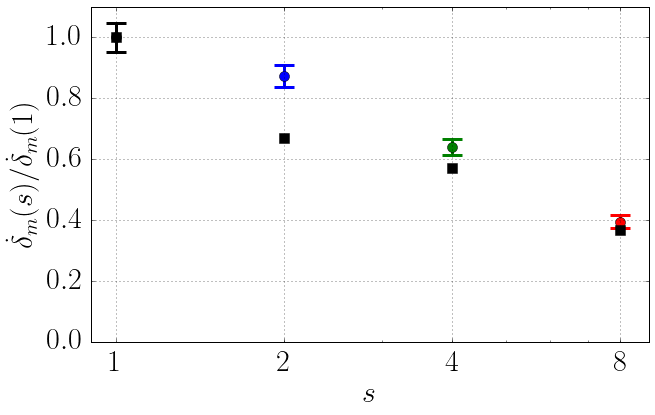

In [57]:
figname = 'dmratio'
ylabel = r'$\dot{\delta}_m(s)/\dot{\delta}_m(1)$'
xlabel = r'$s$'
fformat = '.pdf'
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)

#-----------
vs = [1,2,4,8];

vs = np.array(vs)
vs2=np.linspace(1,10,21)
ramshaw = 2*np.sqrt(vs)/(vs+1.0)

#dwpoint = [0,0,0,0]
#dmratio = [0,0,0,0]
#Cdelta = [0,0,0,0]
#for icase in range(ncases):
    #dwpoint[icase] = vdmpoint[icase]/vdmpoint[0]*vDw[icase]/vDw[0]
#    dmratio[icase] = vdmpoint[icase]/vdmpoint[0]
#    Cdelta[icase]  = 2*vdmpoint[icase]*vDw[icase]
kk = np.zeros(ncases)
kke = np.zeros(ncases)
for icase in range(ncases):
    if icase==0:
        kk[icase]=unumpy.nominal_values(vdmp[icase]/vdmp[icase])
        kke[icase]=np.sqrt(2.0)*unumpy.std_devs(vdmp[icase])/unumpy.nominal_values(vdmp[icase])
        
    else:
        kk[icase]=unumpy.nominal_values(vdmp[icase]/vdmp[0])
        kke[icase]=unumpy.std_devs(vdmp[icase]/vdmp[0])
#plt.plot(vs,unumpy.nominal_values(dwpoint[:]),'*')
#plt.plot(vs,kk,'g')
for icase in range(0,ncases):
    nsamples = len(lcases[icase])
    
    #Using 95% of Confidence
    #https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3487226/
    (_,caps,_) = ax.errorbar(vs[icase],kk[icase],yerr=2*kke[icase],marker='o',mfc=l_case_color[icase], \
               ms=10.0,color=l_case_color[icase],capsize=10,lw=3.0)
    for cap in caps:
        #cap.set_color('red')
        cap.set_markeredgewidth(3)
#plt.plot(vs, kk,'r^-',lw=2.0,ms=10)
print kke[0]
#plt.plot(vs, kk+kke,'b-')
#plt.plot(vs, kk-kke,'b-')
#plt.fill_between(vs,kk+kke,kk-kke,alpha=0.2)
plt.plot(pantanodotdm[0],pantanodotdm[1],'ks',ms=10)
#plt.plot(vs,fpant,'k^',ms=10)
#plt.plot(vs2,ramshaw,'--')
plt.ylim([0,1.1])
#plt.xlim([0,10])
plt.xscale('log')
#plt.plot(vs,dmpoint_lam/dmpoint_lam[0],'y^',ms=12)
plt.xlim([0.9,9])
#plt.plot(vs,dmpoint_lam/dmpoint_lam[0],'*')
ax.set_xticks([1,2, 4, 8])
ax.get_xaxis().set_major_formatter(plt.matplotlib.ticker.ScalarFormatter())
plt.xlabel(xlabel)
plt.ylabel(ylabel)
#Test APPROX
print lambdas
print nDw

plt.grid('on')
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure saved at %s!"%(pathname)

NameError: name 'Dy_shift_dw' is not defined

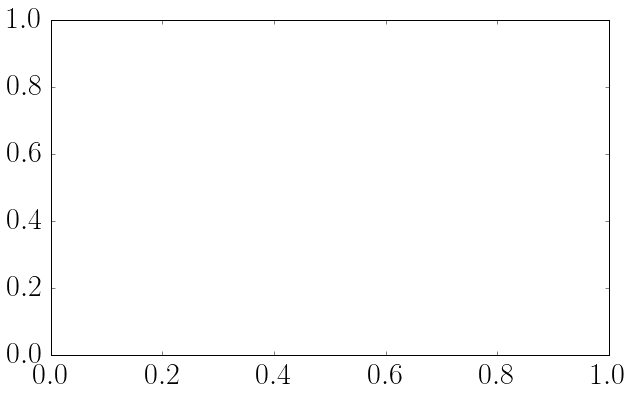

In [58]:
figname = 'ratiodm_vs_lambdaD'
xlabel = r'$ \lambda(s) \Delta/\delta_w$'
ylabel = r'$\delta_m (s)/ \delta_w (s) $'

fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)

#-----------
vs = [1,2,4,8];

vs = np.array(vs)
vs2=np.linspace(1,10,21)
ramshaw = 2*np.sqrt(vs)/(vs+1.0)

#dwpoint = [0,0,0,0]
#dmratio = [0,0,0,0]
#Cdelta = [0,0,0,0]
#for icase in range(ncases):
    #dwpoint[icase] = vdmpoint[icase]/vdmpoint[0]*vDw[icase]/vDw[0]
#    dmratio[icase] = vdmpoint[icase]/vdmpoint[0]
#    Cdelta[icase]  = 2*vdmpoint[icase]*vDw[icase]
kk = np.zeros(ncases)
kke = np.zeros(ncases)
for icase in range(ncases):
    if icase==0:
        kk[icase]=unumpy.nominal_values(vdmp[icase]/vdmp[icase])
        kke[icase]=np.sqrt(2.0)*unumpy.std_devs(vdmp[icase])/unumpy.nominal_values(vdmp[icase])
        
    else:
        kk[icase]=unumpy.nominal_values(vdmp[icase]/vdmp[0])
        kke[icase]=unumpy.std_devs(vdmp[icase]/vdmp[0])
#plt.plot(vs,unumpy.nominal_values(dwpoint[:]),'*')
#plt.plot(vs,kk,'g')
#for icase in range(0,ncases):
#    nsamples = len(lcases[icase])
    
    #Using 95% of Confidence
    #https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3487226/
#    (_,caps,_) = ax.errorbar(vs[icase],kk[icase],yerr=2*kke[icase],marker='o',mfc=l_case_color[icase], \
#               ms=10.0,color=l_case_color[icase],capsize=10,lw=3.0)
#    for cap in caps:
        #cap.set_color('red')
#        cap.set_markeredgewidth(3)
#plt.plot(vs, kk,'r^-',lw=2.0,ms=10)
#plt.plot(vs, kk+kke,'b-')
#plt.plot(vs, kk-kke,'b-')
#plt.fill_between(vs,kk+kke,kk-kke,alpha=0.2)
#plt.plot(pantanodotdm[0],pantanodotdm[1],'ks',ms=10)
#plt.plot(vs,fpant,'k^',ms=10)
#plt.plot(vs2,ramshaw,'--')
#plt.ylim([0,1.1])

#plt.xscale('log')
plt.plot(lambdas*Dy_shift_dw,1.0/nDw,'ko',ms=14)
k=0.2
slope = linregress(lambdas*Dy_shift_dw,1.0/nDw)
k = -slope.slope
print slope
print "rvalue square of M=0 is %s" %(slope.rvalue**2)
test = 1.0/nDw[0] - k*lambdas*Dy_shift_dw
plt.plot(lambdas*Dy_shift_dw,test,'k-',lw=2.0)

slope = linregress(lambdas*Dy_shift_pantano/DwPant,1.0/np.array(DwPant))
k2 = -slope.slope
print slope
print "rvalue square of M=0.7 is %s" %(slope.rvalue**2)

#test = 1.0/nDw[0] - k/4.0*lambdas*np.log(vs)
#plt.plot(lambdas*np.log(vs)/4.0,test,'k-',lw=1.0)
#plt.plot(lambdas*Dy_shift_lam_dw,1.0/DwPant,'ks',ms=12)
#plt.xlim([0.9,9])
#plt.plot(vs,dmpoint_lam/dmpoint_lam[0],'*')
#ax.set_xticks([1,2, 4, 8])
#ax.get_xaxis().set_major_formatter(plt.matplotlib.ticker.ScalarFormatter())
plt.xlabel(xlabel)
plt.ylabel(ylabel)
#plt.yscale('log')
#plt.ylim([10^(-3),2*10^(-2)])

#Test from TOY PROBLEM CUBIC RELATION
#toyDw1=6

#test = test +lambdas/3*Dy_shift_dw**3
#test = 1/4.8 - (1.0/3.0)/toyDw1*4.8*lambdas*Dy_shift_dw*(1.0-Dy_shift_dw**2)
#test = 1.0/4.8*(1-lambdas*Dy_shift_dw)
#plt.plot(lambdas*Dy_shift_dw,test,'b--',lw=2.0)

#PANTANO
plt.plot(lambdas*Dy_shift_pantano/DwPant,1.0/np.array(DwPant),'gs',ms=12)
test = 1.0/DwPant[0] - k2*lambdas*Dy_shift_pantano/DwPant
#test = 1.0/DwPant[0]*(1.0-np.array(lambdas)*np.array(Dy_shift_pantano)/np.array(DwPant))
plt.plot(lambdas*Dy_shift_pantano/DwPant,test,'g-',lw=2.0)

#LAMINAR
slope = linregress(lambdas*Dy_lam_shift_dw,1.0/np.array(DwLam))
k2 = -slope.slope
plt.plot(lambdas*Dy_lam_shift_dw,1.0/np.array(DwLam),'y^',ms=14)
print slope
print "rvalue square of laminar SS is %s" %(slope.rvalue**2)
print k, k2
test = 1.0/DwLam[0] - k2*lambdas*Dy_lam_shift_dw
plt.plot(lambdas*Dy_lam_shift_dw,test,'y-',lw=2.0)


#test = test -lambdas/6*Dy_shift_dw**4
#plt.plot(vs,test/test[0],'g--',lw=2.0)
#plt.plot(vs,1.0-Dy_shift_dw,'k--',lw=2.0)
#plt.plot(vs,1.0-Dy_shift_dw,'k--',lw=2.0)
#plt.plot(vs,1.0/(1.0-LAMBDAS/lambdas**0.5),'g--',lw=2.0)
#plt.plot(vs,1.0/(1.0-LAMBDAS*Dy_shift),'b--',lw=2.0)
#plt.plot(vs,1-Dy_shift_dw,'g--',lw=2.0)
#plt.plot(vs,1.0/(1-LAMBDAS*Dy_shift_pantano),'k--',ls='dotted',lw=2.0)
#plt.plot(vs,1.0-Dy_shift_pantano/Dwpant,'k--',ls='dotted',lw=2.0)
#plt.plot(vs,myformula,'k--',ls='dotted',lw=2.0)
#plt.plot(vs,1.0-Dy_lam_shift_dw,'g--',ms=10)
plt.grid('on')
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure saved at %s!"%(pathname)

In [ ]:
print CdeltaPant

In [ ]:
print fpant

In [ ]:
figname = 'ramshaw'
ylabel = r'$\dot{\delta_w}(s)/\dot{\delta_w}(1)$'
xlabel = r'$s$'

fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)

vs = np.array(vs)
vs2=np.linspace(1,10,21)
ramshaw = 2*np.sqrt(vs2)/(vs2+1.0)

#dwpoint = [0,0,0,0]
#Cdelta = [0,0,0,0]
#for icase in range(ncases):
#    dwpoint[icase] = vdmpoint[icase]/vdmpoint[0]*vDw[icase]/vDw[0]
#    Cdelta[icase]  = 2*vdmpoint[icase]*vDw[icase]
kk = np.zeros(ncases)
kke = np.zeros(ncases)
for icase in range(ncases):
    if icase==0:
        kk[icase]=unumpy.nominal_values(Cdelta[icase]/Cdelta[icase])
        kke[icase]=np.sqrt(2.0)*unumpy.std_devs(Cdelta[icase])/unumpy.nominal_values(Cdelta[icase])
    else:
        kk[icase]=unumpy.nominal_values(Cdelta[icase]/Cdelta[0])
        kke[icase]=unumpy.std_devs(Cdelta[icase]/Cdelta[0])

#plt.plot(vs,unumpy.nominal_values(dwpoint[:]),'*')
for icase in range(0,ncases):
    (_,caps,_)=ax.errorbar(vs[icase],kk[icase],yerr=2.0*kke[icase],marker='o',mfc=l_case_color[icase], \
                ms=12.0,fmt='o',color=l_case_color[icase],capsize=10,lw=3.0)

    for cap in caps:
        #cap.set_color('red')
        cap.set_markeredgewidth(3)
#plt.plot(vs, kk,'ko',lw=2.0,ms=10)
#plt.plot(pantanodotdm[0],pantanodotdm[1],'k^',ms=10)
#plt.fill_between(vs,kk+kke,kk-kke,alpha=0.2)
#PANTANO
plt.plot(vs,fpant,'ks',ms=10)
#PANTANO
#plt.plot(vs,1.0-lambdas*Dy_shift_dw,'r-^',ms=10)
kk = np.array([0.0,0.26,0.5,0.6])
LAMBDAS = (1-np.sqrt(vs))/(1+np.sqrt(vs))
#plt.plot(vs,1.0/(1.0+Dy_shift_dw*lambdas),'r-^',ms=10)
#plt.plot(vs,1.0/(1.0+Dy_shift_dw),'r-^',ms=10)
#plt.plot(vs,1.0/(1.0+lambdas*Dy_lam_shift_dw/0.5),'r-o',ms=10)
#plt.plot(7,0.7,'bd',ms=12)
#plt.plot(7,0.7,'*')
plt.plot(vs2,ramshaw,'--',lw=2.0,color='k')
plt.ylim([0,1.1])
#plt.xlim([0,10])
plt.xscale('log')
plt.xlim([0.9,9])
print Cdelta
ax.set_xticks([1,2, 4, 8])
ax.get_xaxis().set_major_formatter(plt.matplotlib.ticker.ScalarFormatter())
plt.xlabel(xlabel)
plt.ylabel(ylabel)
#plt.plot(vs,1.0-lambdas*Dy_shift_dw,'b--',lw=2.0)
#plt.plot(vs,1.0+LAMBDAS*Dy_shift_pantano/Dwpant,'k--',ls='dotted',lw=2.0)
plt.grid('on')
#plt.plot(vs,dmpoint_lam/dmpoint_lam[0]*Dw_lam/Dw_lam[0],'y^',ms=12)
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure saved at %s!"%(pathname)

# Check pcolors of Rij

In [ ]:
def pcolorintime(path,variable,tmin,tmax,scaling = 'dm',Npoints=500,derivative=False):
    """
    Plot pcolor in time
    """
    lim = 12.0;
    if scaling == 'dw':
        lim=2.0
    ydelta = np.linspace(-lim,lim,Npoints)
    funintcum = np.zeros(Npoints);
    nacum = 0
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);

        fun = np.array(f[variable]);
        if variable=='rum':
            rhom = np.array(f['rhom'])
            fun = np.divide(fun,rhom)
            #print "computed rum/rhom"
        y = np.array(f['y'])
        delta = np.array(f[scaling])
        it1=where(time>=tmin)[0][0]
        it2=where(time>=tmax)[0][0]
        fyjob = [np.zeros(Npoints) for i in range(it2-it1)]
        for itime in range(it1,it2):
            dd = delta[itime]
            if derivative == True:
                funint = np.interp(ydelta,y/dd,dd*der1(y,fun[:,itime]))
                if itime==it1:
                    print "Taking derivative and multiplying by scaling"
            else:
                if (variable=='w1m'  or  variable=='w2m' or variable=='w3m' \
                or variable[0:2] =='ep'):
                    funint = np.interp(ydelta,y/dd,dd*fun[:,itime])
                    if itime==it1: #First time
                        print "Multiplying by scaling"
                elif (variable=='w1rms' or variable=='w2rms' or variable=='w3rms'):
                    #RogersandMoserscaling
                    funint = np.interp(ydelta,y/dd,dd*fun[:,itime]**2)
                    if itime==it1: #First time
                        print "Showing (w_i w_i) delta /DU3"
                else:
                    funint = np.interp(ydelta,y/dd,fun[:,itime])
            fyjob[itime-it1] = funint
            
    return ydelta,time[it1:it2],fyjob
            

In [ ]:
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator
from mpl_toolkits.axes_grid1 import make_axes_locatable
fformat='.pdf'
variable='w3rms'
variable='R12'
variable='R22'
variable='R33'
#variable='R11'
#variable='w3rms'
PRINT=True
scaling = 'dw'
NC=30
#minval=0.0
#maxval=0.035
#-----------
scase = [1,2,4,8]

#fig = plt.figure(figsize=(xlen,1.5*ylen*len(lcases[icase]))) #Define figure with size
Npointsy = 300
Ntbins=40
cmap = plt.get_cmap('PiYG')
cmap = plt.get_cmap('RdBu')
for icase in range(ncases):
    nruns = len(lcases[icase])
    pc = list(np.zeros(nruns+1))
    print nruns,pc
    fig , axv = plt.subplots(nruns+1,1,figsize=(xlen,1.5*ylen*(nruns+1)))
    timebin = np.linspace(0,SS2[icase],Ntbins)
    matrixcum = np.zeros([Ntbins,Npointsy])
    matrixcount = np.zeros([Ntbins])
    Dtbin = np.diff(timebin)[1]
    i = 0
    for ijob in lcases[icase]:
        figname = 'contours_'+variable+'_s'+ str(scase[icase])+'_'+scaling
        t11 = 10; t12 = SS2[icase]; 
        yxi,timef,ff = pcolorintime(p_folders[ijob],variable,t11,t12,scaling,Npointsy)
        ff = np.array(ff)
        #Now see positions where to keep profiles within
        itbins = np.round(timef/Dtbin)+1
        jff = 0
        for it in range(Ntbins-1):
            while (it==itbins[jff]):
                matrixcum[it,:] += ff[jff,:]
                matrixcount[it] += 1
                jff += 1
    
        levels = MaxNLocator(nbins=NC).tick_values(np.nanmin(ff), np.nanmax(ff))
        print len(timef),np.shape(ff)
        pc[i] = axv[i].contourf(timef,yxi,np.transpose(ff),levels=levels,cmap=cmap)
        if scaling == 'dm':
            if scase[icase]==1:
                axv[i].set_ylim([-5,5])
            else:
                axv[i].set_ylim([-5,10])
            axv[i].set_ylabel(r'$y/\delta_m$')
        else:
            if scase[icase]==1:
                axv[i].set_ylim([-1,1])
            else:
                axv[i].set_ylim([-1,1.5])
            axv[i].set_ylabel(r'$y/\delta_w$')
        axv[i].set_xlabel(r'$\tau$')
        stitle="%s s=%s run = %s" % (variable,scase[icase],i+1)
        axv[i].set_title(stitle)
        divider = make_axes_locatable(axv[i])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        c = plt.colorbar(pc[i],cax=cax) 
        i += 1
    #Calculated ENSEMBLED
    ensembled = np.zeros([Ntbins,Npointsy])
    for it in range(Ntbins):
        ensembled[it,:] = matrixcum[it,:]/matrixcount[it]
    levels = MaxNLocator(nbins=NC).tick_values(np.nanmin(ensembled), np.nanmax(ensembled))
    pc[i] = axv[i].contourf(timebin,yxi,np.transpose(ensembled),levels=levels,cmap=cmap)
    if scaling == 'dm':
        if scase[icase]==1:
            axv[i].set_ylim([-5,5])
        else:
            axv[i].set_ylim([-5,10])
        axv[i].set_ylabel(r'$y/\delta_m$')
    else:
        if scase[icase]==1:
            axv[i].set_ylim([-1,1])
        else:
            axv[i].set_ylim([-1,1.5])
        axv[i].set_ylabel(r'$y/\delta_w$')
    axv[i].set_xlabel(r'$\tau$')
    stitle="%s s=%s run = %s" % (variable,scase[icase],'ALL')
    axv[i].set_title(stitle)
    divider = make_axes_locatable(axv[i])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    c = plt.colorbar(pc[i],cax=cax) 
    fig.tight_layout()
    if PRINT == True:
        pathname = save_folder + figname+ fformat
        print pathname
        fig.savefig(pathname,bbox_inches='tight') 

# AVAREGED PROFILES

In [ ]:
fformat ='.pdf'

In [ ]:
Dyu = [0,0,0,0]
DyuPantano = [0,0,0,0]
Dyulam = [0,0,0,0]
Dyrholam = [0,0,0,0]
Dyu_dw = [0,0,0,0]
DyuPantano_dw = [0,0,0,0]
Dyulam_dw = [0,0,0,0]
Dyrholam_dw= [0,0,0,0]

In [ ]:
from scipy.special import erf
variable = 'rum' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\frac{\tilde{u}}{\Delta U}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'umf_ave_dw'
derivative = False
PRINT = True


fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=15);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,2000,derivative)
    #DT = fSS[-1]-fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    #fSS=fSS/DT
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.2)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
ax.yaxis.label.set_fontsize(30)    
#plt.plot(yxi,-0.5*erf(yxi/2.5),'k--')

plt.plot(UselfRM[:,0]/4.8,-UselfRM[:,1],'o',color=l_case_color[0])

plt.plot(ums20pantano[:,0]/DwPant[1],ums20pantano[:,1],'o',color=l_case_color[1],markevery=2)

plt.plot(ums40pantano[:,0]/DwPant[2],ums40pantano[:,1],'o',color=l_case_color[2],markevery=2)

plt.plot(ums80pantano[:,0]/DwPant[3],ums80pantano[:,1],'o',color=l_case_color[3],markevery=2)   
#plt.plot(UselfRM[:,0]/4.8,-UselfRM[:,1],'o',color=l_case_color[0])
for icase in range(ncases):
    #dmtmp = calcdmcomp(y_int,lam_U[:,icase],lam_U[:,icase]*lam_rho[:,icase],lam_rho[:,icase])
    plt.plot(y_int,lam_U[:,icase],color=l_case_color[icase],ls='dashed')
    iu0 = np.where(lam_U[:,icase]<=0.0)[0][0]
    Dyulam_dw[icase] = y_int[iu0]

if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

In [ ]:
from scipy.special import erf
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
variable = 'rum' #any vector variable available
scaling  = 'dm' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\frac{\tilde{u}}{\Delta U}$'
xlabel=r'$y/\delta_m$'
#figname = 'rhom_ave.eps'
figname = 'umf_ave_dm'
derivative = False
PRINT = True


fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=15);
#PREPARE zOOMED PLOT
axins = zoomed_inset_axes(ax, 2, loc=1)
x1, x2, y1, y2 = -3.8, -1.3, 0.35, 0.52
#PLOT ZOOM IN
axins.set_xlim(x1, x2)
axins.set_ylim(y1, y2)
plt.xticks(visible=False)
plt.yticks(visible=False)
mark_inset(ax, axins, loc1=2, loc2=4, fc="none", ec="0.5")
ax.grid('on')

if scaling=='dm':
    ax.set_xlim([-6,10])
else:
    ax.set_xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,2000,derivative)
    #DT = fSS[-1]-fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    #fSS=fSS/DT
    #errorSS = errorSS/DT
    iu0 = np.where(fSS<=0.0)[0][0]
    Dyu[icase] = yxi[iu0]

    print Dyu[icase]
    ax.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    axins.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    ax.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.2)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
ax.yaxis.label.set_fontsize(30)    

#plt.plot(yxi,-0.5*erf(yxi/2.5),'k--')

ax.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
axins.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
ax.plot(ums20pantano[:,0],ums20pantano[:,1],'o',color=l_case_color[1],markevery=2)
axins.plot(ums20pantano[:,0],ums20pantano[:,1],'o',color=l_case_color[1],markevery=2)
kkpant = np.interp(yxi,ums20pantano[:,0],ums20pantano[:,1])
iu0 = np.where(kkpant<=0.0)[0][0]
DyuPantano[1]=yxi[iu0]
ax.plot(ums40pantano[:,0],ums40pantano[:,1],'o',color=l_case_color[2],markevery=2)
axins.plot(ums40pantano[:,0],ums40pantano[:,1],'o',color=l_case_color[2],markevery=2)
kkpant = np.interp(yxi,ums40pantano[:,0],ums40pantano[:,1])
iu0 = np.where(kkpant<=0.0)[0][0]
DyuPantano[2]=yxi[iu0]
ax.plot(ums80pantano[:,0],ums80pantano[:,1],'o',color=l_case_color[3],markevery=2)   
axins.plot(ums80pantano[:,0],ums80pantano[:,1],'o',color=l_case_color[3],markevery=2)  
kkpant = np.interp(yxi,ums80pantano[:,0],ums80pantano[:,1])
iu0 = np.where(kkpant<=0.0)[0][0]
DyuPantano[3]=yxi[iu0]
dmpoint_lam = [0.0,0,0,0]
Dw_lam = [0.0,0,0,0]
for icase in range(ncases):
    #dmtmp = calcdmcomp(y_int,lam_U[:,icase],lam_U[:,icase]*lam_rho[:,icase],lam_rho[:,icase])
    #print "dm = %s"%(dmtmp)
    #dmpoint_lam[icase]=(np.trapz(2/160.0*(der1(y_int/dmtmp,lam_U[:,icase]))**2,y_int/dmtmp))
    #Dw_lam[icase] = 1.0/dmtmp
    ax.plot(y_int*DwLam[icase],lam_U[:,icase],color=l_case_color[icase],ls='dashed',lw=2.0)
    axins.plot(y_int*DwLam[icase],lam_U[:,icase],color=l_case_color[icase],ls='dashed',lw=2.0)
    iu0 = np.where(lam_U[:,icase]<=0.0)[0][0]
    Dyulam[icase] = y_int[iu0]*DwLam[icase]
    


if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

In [ ]:
print Dyu,DyuPantano,Dyulam

In [ ]:
print Dyu,DyuPantano,Dyulam

In [ ]:
from scipy.special import erf
variable = 'rum' #any vector variable available
scaling  = 'dm' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\delta_m$'
xlabel=r'$y/\delta_m'
#figname = 'rhom_ave.eps'
figname = 'dmfunc_ave_dw'
derivative = False
PRINT = True
um_rogers = np.loadtxt('/data2/toni/work/db/um_rogers.dat')

fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=15);

if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,2000,derivative)
    yxi,rho,errorSS2 = getSScase3(p_folders,lcases[icase],'rhom',scaling,SS1j,SS2j,2000,derivative)
    #DT = fSS[-1]-fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    #fSS=fSS/DT
    #errorSS = errorSS/DT
    iu0 = np.where(fSS<=0.0)[0][0]
    Dyu_dw[icase] = yxi[iu0]
    plt.plot(yxi,rho*(0.25-fSS**2),l_job_style[icase],lw=2.0)
    #plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.2)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
ax.yaxis.label.set_fontsize(30)    
#plt.plot(yxi,-0.5*erf(yxi/2.5),'k--')



    
#plt.plot(ums20pantano[:,0],ums20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(ums40pantano[:,0],ums40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(ums80pantano[:,0],ums80pantano[:,1],'o',color=l_case_color[3],markevery=2)   
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

In [ ]:
from scipy.special import erf
variable = 'rum' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\delta_m$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'dmfunc_ave_dw'
derivative = False
PRINT = True
um_rogers = np.loadtxt('/data2/toni/work/db/um_rogers.dat')

fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=15);

if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,2000,derivative)
    yxi,rho,errorSS2 = getSScase3(p_folders,lcases[icase],'rhom',scaling,SS1j,SS2j,2000,derivative)
    #DT = fSS[-1]-fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    #fSS=fSS/DT
    #errorSS = errorSS/DT
    iu0 = np.where(fSS<=0.0)[0][0]
    Dyu_dw[icase] = yxi[iu0]
    plt.plot(yxi,rho*(0.25-fSS**2),l_job_style[icase],lw=2.0)
    #plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.2)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
ax.yaxis.label.set_fontsize(30)    
#plt.plot(yxi,-0.5*erf(yxi/2.5),'k--')



    
#plt.plot(ums20pantano[:,0],ums20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(ums40pantano[:,0],ums40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(ums80pantano[:,0],ums80pantano[:,1],'o',color=l_case_color[3],markevery=2)   
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 0.0 o/o
Number of profiles = 26
Giving std-deviation error
-15.0
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 0.429209294849 o/o
Number of profiles = 31
Giving std-deviation error
-0.187593796898
/share/drive/toni/VDML/s40/01/h5.stats
/share/drive/toni/VDML/s40/02/h5.stats
/share/drive/toni/VDML/s40/03/h5.stats
/share/drive/toni/VDML/s40/04/h5.stats
Max of standard deviation = 1.03233431975 o/o
Number of profiles = 31
Giving std-deviation error
-0.382691345673
/share/drive/toni/VDML/s80/01/h5.stats
/share/drive/toni/VDML/s80/02/h5.stats
/share/drive/toni/VDML/s80/03/h5.stats
/share/drive/toni/VDML/s80/04/h5.stats
Max of standard deviation = 0.676009284198 o/o
Nu

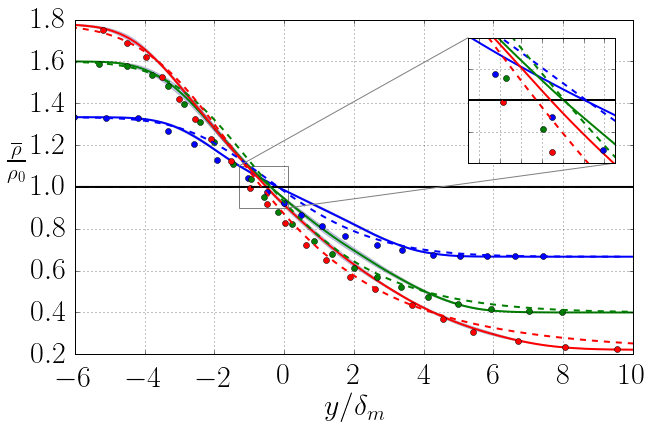

In [78]:
variable = 'rhom' #any vector variable available
scaling  = 'dm' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\frac{\overline{\rho}}{\rho_0}$'
xlabel=r'$y/\delta_m$'
#figname = 'rhom_ave.eps'
figname = 'rhom_ave_dm'
derivative = False
vDrho = np.zeros(len(lcases))
Dyrho = [0.0,0.0,0.0,0.0]
DyrhoPantano = [0.0,0.0,0.0,0.0]
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
#PREPARE zOOMED PLOT

plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=15);
if scaling=='dm':
    ax.set_xlim([-6,10])
else:
    ax.set_xlim([-1,1.5])
    
axins = zoomed_inset_axes(ax, 3, loc=1)
x1, x2, y1, y2 = -1.3, 0.1, 0.9, 1.1
#plt.ylim([0.0,1.1])
axins.grid('on')



for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,2000,derivative)
    vDrho[icase]=np.abs(fSS[-1]-fSS[0])
    #DT = fSS[-1]-fSS[0]
    irho0 = np.where(fSS<=1.0)[0][0]
    Dyrho[icase] = yxi[irho0]
    print Dyrho[icase]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    #fSS=fSS/DT
    #errorSS = errorSS/DT
    ax.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    axins.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    ax.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.2)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
Dyrho[0]=0.0
ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
ax.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
axins.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
kkpant = np.interp(yxi,rhos20pantano[:,0],rhos20pantano[:,1])
iu0 = np.where(kkpant<=1.0)[0][0]
DyrhoPantano[1]=yxi[iu0]
ax.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
axins.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
kkpant = np.interp(yxi,rhos40pantano[:,0],rhos40pantano[:,1])
iu0 = np.where(kkpant<=1.0)[0][0]
DyrhoPantano[2]=yxi[iu0]
ax.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
axins.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
kkpant = np.interp(yxi,rhos80pantano[:,0],rhos80pantano[:,1])
iu0 = np.where(kkpant<=1.0)[0][0]
DyrhoPantano[3]=yxi[iu0]


#LAMINAR
for icase in range(ncases):
    dmtmp = calcdmcomp(y_int,lam_U[:,icase],lam_U[:,icase]*lam_rho[:,icase],lam_rho[:,icase])
    ax.plot(y_int/dmtmp,lam_rho[:,icase],color=l_case_color[icase],ls='dashed',lw=2.0)
    axins.plot(y_int/dmtmp,lam_rho[:,icase],color=l_case_color[icase],ls='dashed',lw=2.0)
    iu0 = np.where(lam_rho[:,icase]<=1.0)[0][0]
    Dyrholam[icase] = y_int[iu0]/dmtmp

#PLOT ZOOM IN
axins.set_xlim(x1, x2)
axins.set_ylim(y1, y2)
plt.xticks(visible=False)
plt.yticks(visible=False)
mark_inset(ax, axins, loc1=2, loc2=4, fc="none", ec="0.5")
ax.grid('on')
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

In [79]:
print DyrhoPantano

[0.0, -0.71285642821410633, -0.68284142071035525, -0.96798399199599672]


In [80]:
print DyrhoPantano

[0.0, -0.71285642821410633, -0.68284142071035525, -0.96798399199599672]


/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 0.0 o/o
Number of profiles = 26
Giving std-deviation error
0.0
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 0.556231418765 o/o
Number of profiles = 31
Giving std-deviation error
-0.187593796898
/share/drive/toni/VDML/s40/01/h5.stats
/share/drive/toni/VDML/s40/02/h5.stats
/share/drive/toni/VDML/s40/03/h5.stats
/share/drive/toni/VDML/s40/04/h5.stats
Max of standard deviation = 1.39307777463 o/o
Number of profiles = 31
Giving std-deviation error
-0.382691345673
/share/drive/toni/VDML/s80/01/h5.stats
/share/drive/toni/VDML/s80/02/h5.stats
/share/drive/toni/VDML/s80/03/h5.stats
/share/drive/toni/VDML/s80/04/h5.stats
Max of standard deviation = 0.948926813981 o/o
Numb

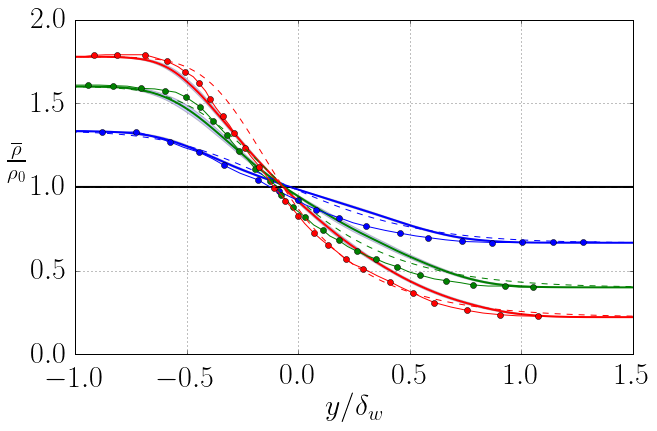

In [81]:
variable = 'rhom' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\frac{\overline{\rho}}{\rho_0}$'
xlabel=r'$y/\delta_w$'
Dyrho_dw = [0.0,0.0,0.0,0.0]
#figname = 'rhom_ave.eps'
figname = 'rhom_ave_dw'
derivative = False
vDrho = np.zeros(len(lcases))
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=15);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,2000,derivative)
    vDrho[icase]=np.abs(fSS[-1]-fSS[0])
    #DT = fSS[-1]-fSS[0]
    irho0 = np.where(fSS<=1.0)[0][0]
    Dyrho_dw[icase] = yxi[irho0]
    print Dyrho[icase]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    #fSS=fSS/DT
    #errorSS = errorSS/DT
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.2)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
Dyrho[0]=0.0
ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
plt.plot(rhos20pantano[:,0]/DwPant[1],rhos20pantano[:,1],'o-',color=l_case_color[1],markevery=2)
#kkpant = np.interp(yxi,rhos20pantano[:,0],rhos20pantano[:,1])
#iu0 = np.where(kkpant<=1.0)[0][0]
#DyrhoPantano[1]=yxi[iu0]
plt.plot(rhos40pantano[:,0]/DwPant[2],rhos40pantano[:,1],'o-',color=l_case_color[2],markevery=2)
#kkpant = np.interp(yxi,rhos40pantano[:,0],rhos40pantano[:,1])
#iu0 = np.where(kkpant<=1.0)[0][0]
#DyrhoPantano[2]=yxi[iu0]
plt.plot(rhos80pantano[:,0]/DwPant[3],rhos80pantano[:,1],'o-',color=l_case_color[3],markevery=2) 
#kkpant = np.interp(yxi,rhos80pantano[:,0],rhos80pantano[:,1])
#iu0 = np.where(kkpant<=1.0)[0][0]
#DyrhoPantano[3]=yxi[iu0]

#LAMINAR
for icase in range(ncases):
    #dmtmp = calcdmcomp(y_int,lam_U[:,icase],lam_U[:,icase]*lam_rho[:,icase],lam_rho[:,icase])
    dmtmp=1.0
    plt.plot(y_int/dmtmp,lam_rho[:,icase],color=l_case_color[icase],ls='dashed')
    iu0 = np.where(lam_rho[:,icase]<=1.0)[0][0]
    Dyrholam_dw[icase] = y_int[iu0]/dmtmp
plt.ylim([0,2])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

In [82]:
nDw = unumpy.nominal_values(Dw)
Dy_shift = ((np.array(Dyu)-np.array(Dyrho)))
Dy_shift_dw = np.divide((np.array(Dyu)-np.array(Dyrho)),nDw)
print np.array(DyuPantano)
print np.array(DyrhoPantano)
Dy_shift_pantano = np.array(DyuPantano)-np.array(DyrhoPantano)
#print np.array(Dyu_dw)-np.array(Dyrho_dw)

[ 0.          0.72786393  1.67333667  3.53426713]
[ 0.         -0.71285643 -0.68284142 -0.96798399]


In [83]:
#Dy_shift = np.subtract(Dyu,Dyrho)
#Dy_shift_dw = np.subtract(Dyu_dw,Dyrho_dw)
Dy_lam_shift = np.subtract(Dyulam,Dyrholam)
Dy_lam_shift_dw = np.subtract(Dyulam_dw,Dyrholam_dw)
#print Dy_shift,Dy_lam_shift

In [84]:
print Dy_shift,Dy_shift_pantano

[ 0.00750375  0.96048024  2.20610305  3.94697349] [ 0.          1.44072036  2.35617809  4.50225113]


In [85]:
print Dy_shift,Dy_shift_pantano

[ 0.00750375  0.96048024  2.20610305  3.94697349] [ 0.          1.44072036  2.35617809  4.50225113]


figure saved at /share/drive/toni/VDML/JFM_201706/shifting_dm.pdf!


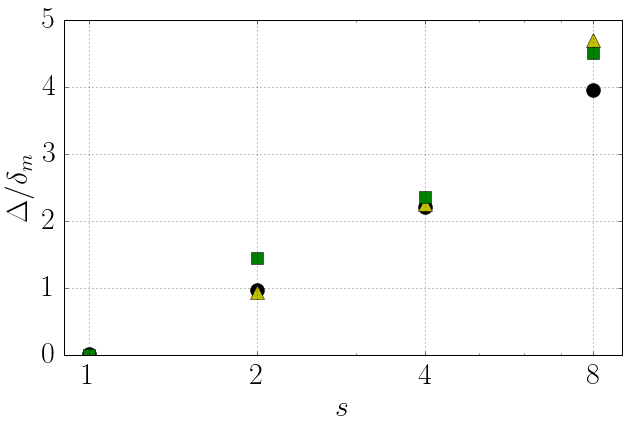

In [86]:
figname = 'shifting_dm'
ylabel = r'$\Delta/\delta_m $'
xlabel = r'$s$'
Dy_lam_shift[0]=0.0
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
vs = np.array(vs)



plt.plot(vs,Dy_shift,'o',color='k',ms=14)
plt.plot(vs,Dy_lam_shift,'y^',ms=14)
#plt.plot(vs,np.multiply(-1,Dyrho),'--',lw=2.0,color='k')
#PANTANO
plt.plot(vs,Dy_shift_pantano,'s',lw=1.0,color='g',ms=12)
#plt.plot(vs,np.multiply(-1,DyrhoPantano),'--',lw=1.0,color='g')

#plt.xlim([0,10])
plt.xscale('log')
plt.xlim([0.9,9])
#plt.ylim([1,10])
ax.set_xticks([1,2, 4, 8])
#plt.plot(7,3.6/0.5*0.3,'d',lw=1.0,color='b',ms=14)
#plt.plot(7,3.6/0.5*0.7,'d',lw=1.0,color='b',ms=14)
ax.get_xaxis().set_major_formatter(plt.matplotlib.ticker.ScalarFormatter())
plt.xlabel(xlabel)
plt.ylabel(ylabel)
#plt.yscale('log')
plt.grid('on')
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure saved at %s!"%(pathname)

0.0237978783297
[ 0.          0.33333333  0.6         0.77777778]
[ 4.8330539   5.21007416  6.1128746   7.66807523]
figure saved at /share/drive/toni/VDML/JFM_201706/dmratio2.pdf!


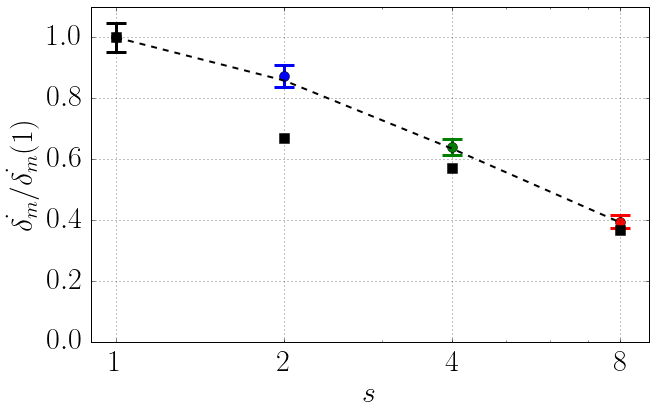

In [87]:
figname = 'dmratio2'
ylabel = r'$\dot{\delta_m}/\dot{\delta_m}(1)$'
xlabel = r'$s$'

fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)

#-----------
vs = [1,2,4,8];

vs = np.array(vs)
vs2=np.linspace(1,10,21)
ramshaw = 2*np.sqrt(vs)/(vs+1.0)

#dwpoint = [0,0,0,0]
#dmratio = [0,0,0,0]
#Cdelta = [0,0,0,0]
#for icase in range(ncases):
    #dwpoint[icase] = vdmpoint[icase]/vdmpoint[0]*vDw[icase]/vDw[0]
#    dmratio[icase] = vdmpoint[icase]/vdmpoint[0]
#    Cdelta[icase]  = 2*vdmpoint[icase]*vDw[icase]
kk = np.zeros(ncases)
kke = np.zeros(ncases)
for icase in range(ncases):
    if icase==0:
        kk[icase]=unumpy.nominal_values(vdmp[icase]/vdmp[icase])
        kke[icase]=np.sqrt(2.0)*unumpy.std_devs(vdmp[icase])/unumpy.nominal_values(vdmp[icase])
        
    else:
        kk[icase]=unumpy.nominal_values(vdmp[icase]/vdmp[0])
        kke[icase]=unumpy.std_devs(vdmp[icase]/vdmp[0])
#plt.plot(vs,unumpy.nominal_values(dwpoint[:]),'*')
#plt.plot(vs,kk,'g')
for icase in range(0,ncases):
    nsamples = len(lcases[icase])
    
    #Using 95% of Confidence
    #https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3487226/
    (_,caps,_) = ax.errorbar(vs[icase],kk[icase],yerr=2*kke[icase],marker='o',mfc=l_case_color[icase], \
               ms=10.0,color=l_case_color[icase],capsize=10,lw=3.0)
    for cap in caps:
        #cap.set_color('red')
        cap.set_markeredgewidth(3)
#plt.plot(vs, kk,'r^-',lw=2.0,ms=10)
print kke[0]
#plt.plot(vs, kk+kke,'b-')
#plt.plot(vs, kk-kke,'b-')
#plt.fill_between(vs,kk+kke,kk-kke,alpha=0.2)
plt.plot(pantanodotdm[0],pantanodotdm[1],'ks',ms=10)
#plt.plot(vs,fpant,'k^',ms=10)
#plt.plot(vs2,ramshaw,'--')
plt.ylim([0,1.1])
#plt.xlim([0,10])
plt.xscale('log')
#plt.plot(vs,dmpoint_lam/dmpoint_lam[0],'y^',ms=12)
plt.xlim([0.9,9])
#plt.plot(vs,dmpoint_lam/dmpoint_lam[0],'*')
ax.set_xticks([1,2, 4, 8])
ax.get_xaxis().set_major_formatter(plt.matplotlib.ticker.ScalarFormatter())
plt.xlabel(xlabel)
plt.ylabel(ylabel)
#Test APPROX
print lambdas
#Formula from OScar with shifting and not changing the slope
#test = ramshaw*(1.0-2*lambdas*Dy_shift_dw+lambdas*2*Dy_shift_dw**3)
#My formula with changing slope but chaning sign...
#test = ramshaw-2*Dy_shift_dw/5.0
print nDw
#test = ramshaw/nDw*nDw[0]
test = ramshaw-2*Dy_shift_dw/4.8
test = ramshaw-0.46*Dy_shift_dw
#test = ramshaw-0.45*Dy_shift_pantano/Dwpant
#test = ramshaw-2*Dy_shift_pantano/Dwpant/4.8
plt.plot(vs,test,'k--',lw=2.0)
#plt.plot(vs,nDw[0]/nDw)
#plt.plot(vs,1.0-Dy_shift_dw,'k--',lw=2.0)
#plt.plot(vs,1.0-Dy_shift_dw,'k--',lw=2.0)
#plt.plot(vs,1.0/(1.0-LAMBDAS/lambdas**0.5),'g--',lw=2.0)
#plt.plot(vs,1.0/(1.0-LAMBDAS*Dy_shift),'b--',lw=2.0)
#plt.plot(vs,1-Dy_shift_dw,'g--',lw=2.0)
#plt.plot(vs,1.0/(1-LAMBDAS*Dy_shift_pantano),'k--',ls='dotted',lw=2.0)
#plt.plot(vs,1.0-Dy_shift_pantano/Dwpant,'k--',ls='dotted',lw=2.0)
#plt.plot(vs,myformula,'k--',ls='dotted',lw=2.0)
#plt.plot(vs,1.0-Dy_lam_shift_dw,'g--',ms=10)
plt.grid('on')
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure saved at %s!"%(pathname)

In [88]:
#From Pantano analysis, by inspection we infer this model for the growth rate reduction as a function of shifting
lambdas =  (vs-1.0)/(vs+1.0)
model_dwred =  2.0*np.sqrt(vs)/(vs+1.0)*(1.0 - 2*np.array(lambdas)*np.array(Dy_shift_dw))
print model_dwred
#model_dwred_pantano = 1 - lambdas*Dy_shift_pantano/Dwpant
#print model_dwred
#print kk
#print model_dwred_pantano

[ 1.          0.82693744  0.45354124  0.12527538]


In [89]:
Dwpant = DwPant
print Dwpant
print 1.0/lambdas-Dwpant[0]/Dwpant*(1.0/lambdas-Dy_shift_pantano/Dwpant)

[ 5.41666667  5.80431177  7.55360624  8.88388388]
[        nan  0.43199543  0.69518764  0.81078904]


/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in divide
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in subtract
  This is separate from the ipykernel package so we can avoid doing imports until


[ 1.          0.81564941  0.63910546  0.48527194]
LinregressResult(slope=0.24824859381101377, intercept=0.0068840774081032063, rvalue=0.99917718422146884, pvalue=0.00082281577853116062, stderr=0.007125350620506894)
LinregressResult(slope=0.22853412687670169, intercept=0.029121251090918315, rvalue=0.97805456434309046, pvalue=0.02194543565690954, stderr=0.034424228616454847)
LinregressResult(slope=0.23476320104245244, intercept=0.014428857715430954, rvalue=0.99702851240125956, pvalue=0.0029714875987404406, stderr=0.012825861337551082)
figure saved at /share/drive/toni/VDML/JFM_201706/shifting_dw.pdf!


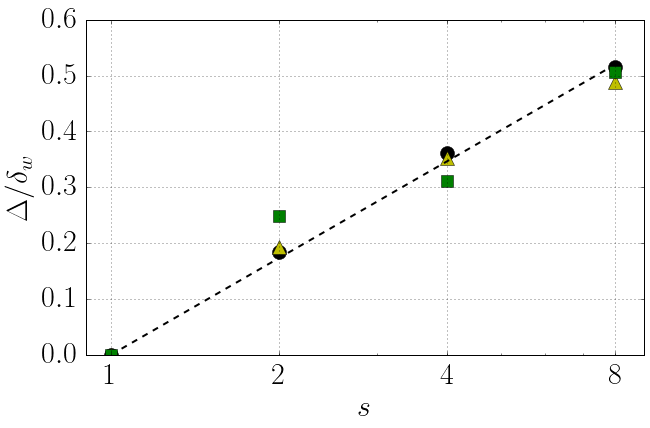

In [90]:
figname = 'shifting_dw'
ylabel = r'$\Delta/\delta_w $'
xlabel = r'$s$'
Dy_lam_shift_dw[0]=0.0
Dy_shift_dw[0]=0.0
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
vs = np.array(vs)

#model = (1.0-kk)/lambdas

plt.plot(vs,Dy_shift_dw,'o',lw=2.0,color='k',ms=14)
plt.plot(vs,Dy_lam_shift_dw,'y^',ms=14)

plt.plot(vs,0.25*np.log(vs),'k--',lw=2.0)
#plt.plot(vs,np.multiply(-1,Dyrho),'--',lw=2.0,color='k')
#PANTANO

plt.plot(vs,Dy_shift_pantano/Dwpant,'s',lw=1.0,color='g',ms=12)
#plt.plot(7,0.3,'bd',ms=14)
#plt.plot(7,0.7,'bd',ms=14)
#plt.plot(vs,model,'r.-')
#plt.plot(vs,np.multiply(-1,DyrhoPantano),'--',lw=1.0,color='g')
print 1-Dy_shift_dw
#plt.xlim([0,10])
plt.xscale('log')
#plt.yscale('log')
plt.xlim([0.9,9])
ax.set_xticks([1,2, 4, 8])
ax.get_xaxis().set_major_formatter(plt.matplotlib.ticker.ScalarFormatter())
plt.xlabel(xlabel)
plt.ylabel(ylabel)
plt.ylim([0.0,0.6])
wop = linregress(np.log(vs),Dy_shift_dw)
print wop
wop = linregress(np.log(vs),Dy_shift_pantano/Dwpant)
print wop
wop = linregress(np.log(vs),Dy_lam_shift_dw)
print wop
plt.grid('on')
if PRINT == True:
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "figure saved at %s!"%(pathname)

In [91]:
xfactor = Dwn/Dwn[0]
print xfactor
# FORMULA = 1.0+2*Dy/dw1=1.0+2*Dy/dw*xfactor
myformula = 1-Dwn[0]/2.0*(Dy_shift_dw**2)#+2/3.0*(lambdas/2)*Dy_shift_dw)
print myformula

[ 1.          1.0780087   1.2648058   1.58659005]
[ 1.          0.91787399  0.68525977  0.35975333]


In [92]:
print model_dwred
print kk

[ 1.          0.82693744  0.45354124  0.12527538]
[ 1.          0.87226356  0.63935362  0.3945091 ]


/share/drive/toni/VDML/s10/02/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s10/03/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s10/04/newman/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s10/06/h5.stats
Multiplying by scaling
Max of standard deviation = 4.46867081509 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s20/02/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s20/03/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s20/04/h5.stats
Multiplying by scaling
Max of standard deviation = 4.29057931912 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s40/02/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s40/03/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s40/04/h5.stats
Multiplying by scaling
Max of standard deviation = 3.59524260535 o/o
Number of

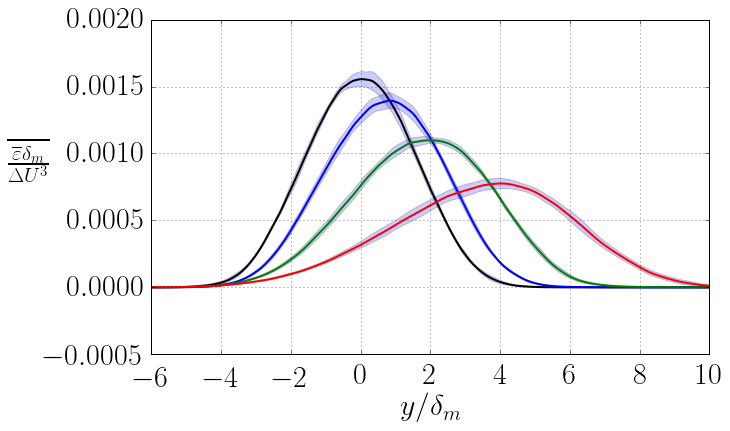

In [93]:
variable = 'epR' #any vector variable available
scaling  = 'dm' #can be dw or dm
xlabel =r'$y/\delta_m$'
ylabel =r'$\overline{\frac{\overline{\varepsilon} \delta_m}{\Delta U^3}}$'
figname='epsy_ave.eps'
derivative = False
#figname='epsy_ave.eps'


fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=15);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    errorSS = errorSS
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.2)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

#ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
#plt.ylim([0,2])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s10/02/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s10/03/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s10/04/newman/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s10/06/h5.stats
Multiplying by scaling
Max of standard deviation = 7.04939775698 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s20/02/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s20/03/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s20/04/h5.stats
Multiplying by scaling
Max of standard deviation = 6.22448214339 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s40/02/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s40/03/h5.stats
Multiplying by scaling
/share/drive/toni/VDML/s40/04/h5.stats
Multiplying by scaling
Max of standard deviation = 5.21795843204 o/o
Number of

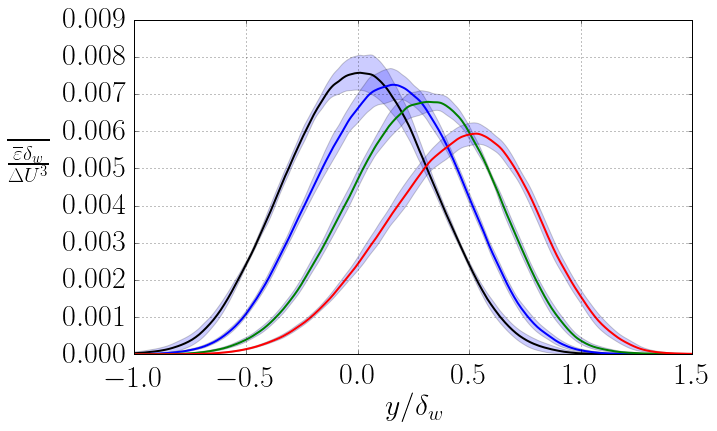

In [94]:
variable = 'epR' #any vector variable available
scaling  = 'dw' #can be dw or dm
xlabel =r'$y/\delta_w$'
ylabel =r'$\overline{\frac{\overline{\varepsilon} \delta_w}{\Delta U^3}}$'
figname='epsy_ave_dw'
derivative = False
#figname='epsy_ave.eps'


fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=35);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    errorSS = errorSS
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.2)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

#ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
plt.ylim(bottom=0)
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 2.01117708763 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 0.0 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 2.12071088424 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 0.556164477988 o/o
Number of profiles = 31
Giving std

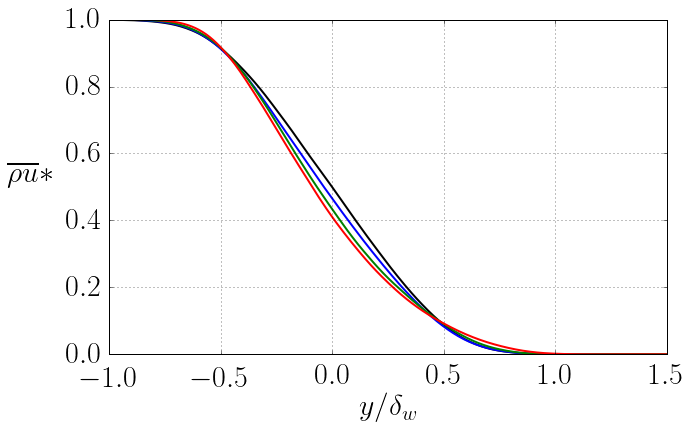

In [95]:
variable = 'rum' #any vector variable available
scaling  = 'dw' #can be dw or dm
xlabel =r'$y/\delta_w$'
ylabel =r'$\overline{\rho u}*$'
figname='kk_ave2_dw'
derivative = False
#figname='epsy_ave.eps'


fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=35);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    yxi,rhofSS,errorSSrho = getSScase3(p_folders,lcases[icase],'rhom',scaling,SS1j,SS2j,500,derivative)
    Dkk = np.nanmax(fSS*rhofSS)-np.nanmin(fSS*rhofSS)
    #Dkk = 1.0
    errorSS = errorSS
    plt.plot(yxi,(fSS*rhofSS-np.nanmin(fSS*rhofSS))/Dkk,l_job_style[icase],lw=2.0)
    #plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.2)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

#ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
#plt.ylim(bottom=0)
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

In [96]:
64.0/(461/2.0/np.pi)

0.8722860296301378

/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 2.79471299954 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 0.0 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 0.637851618666 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 0.556164477988 o/o
Number of profiles = 31
Giving st

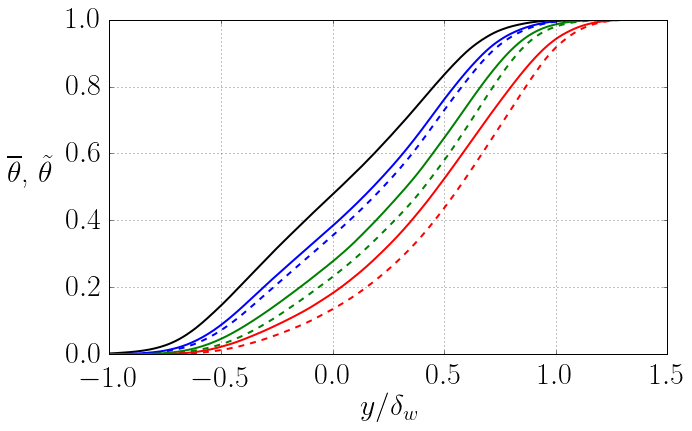

In [59]:
variable = 'Tm' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\overline{\theta}$, $\tilde{\theta}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'TmTf_ave_dw'
derivative = False
vTmin = np.zeros(ncases)


fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=35);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in range(0,len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    yxi,rhom,errorSSr = getSScase3(p_folders,lcases[icase],'rhom',scaling,SS1j,SS2j,500,derivative)
    DT = fSS[-1]-fSS[0]
    Tf = 1.0/rhom
    DT2 = Tf[-1]-Tf[0]
    Tmin = fSS[0]
    Tmin2 = Tf[0]
    vTmin[icase]=Tmin
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=(fSS-Tmin)/DT
    fSS2=(Tf-Tmin)/DT
    errorSS = errorSS/DT
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.plot(yxi,fSS2,l_job_style[icase],lw=2.0,ls='dashed')
    #plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.2)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

#ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
plt.ylim([0,1])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

In [60]:
print vTmin

[ -4.87814954e-17   7.50000000e-01   6.25000000e-01   5.62500000e-01]


/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 2.79471299954 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 0.0 o/o
Number of profiles = 26
Giving std-deviation error
143 359
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 0.637851618666 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 0.556164477988 o/o
Number of profiles = 31
G

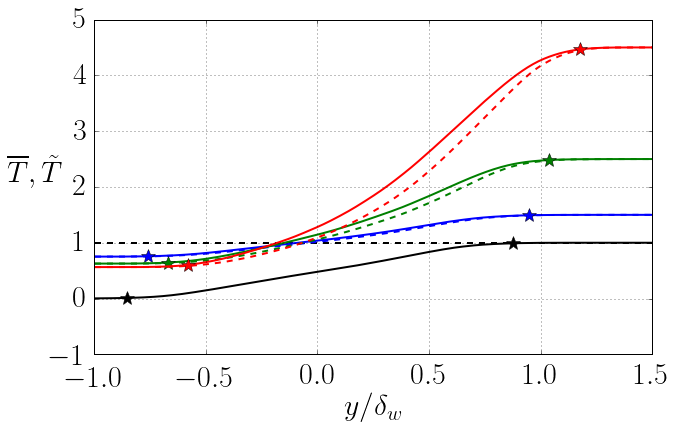

In [63]:
variable = 'Tm' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\overline{T}, \tilde{T}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'Tmvstheta'
derivative = False

vDT =np.zeros(len(lcases))

fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=15);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    yxi2,fSS2,errorSS2 = getSScase3(p_folders,lcases[icase],'rhom',scaling,SS1j,SS2j,500,derivative)
    DT = fSS[-1]-fSS[0]
    vDT[icase] = DT
    Tmin = fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    #fSS=(fSS-Tmin)
    #errorSS = errorSS/DT
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    marg = 0.01*DT
    im0 = np.where(fSS>=(fSS[0]+marg))[0][0]
    
    im1 = np.where(fSS>=(fSS[-1]-marg))[0][0]
    print im0,im1
    plt.plot([yxi[im0],yxi[im1]],[fSS[im0],fSS[im1]],'*',color=l_job_style[icase],ms=14)
    #Drho = np.abs(fSS2[-1]-fSS2[0])
    plt.plot(yxi2,1.0/fSS2,l_job_style[icase],lw=2.0,ls='dashed')
    #plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.2)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

#ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
#plt.ylim([0,1])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    print pathname
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 13.4098307643 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 7.47354056288 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
/share/drive/toni/VDML/s40/02/h5.stats
/share/drive/toni/VDML/s40/03/h5.stats
/share/drive/toni/VDML/s40/04/h5.stats
Max of standard deviation = 6.60834232505 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s80/01/h5.stats
/share/drive/toni/VDML/s80/02/h5.stats
/share/drive/toni/VDML/s80/03/h5.stats
/share/drive/toni/VDML/s80/04/h5.stats
Max of standard deviation = 6.14616222267 o/o
Number of profiles = 42
Giving s

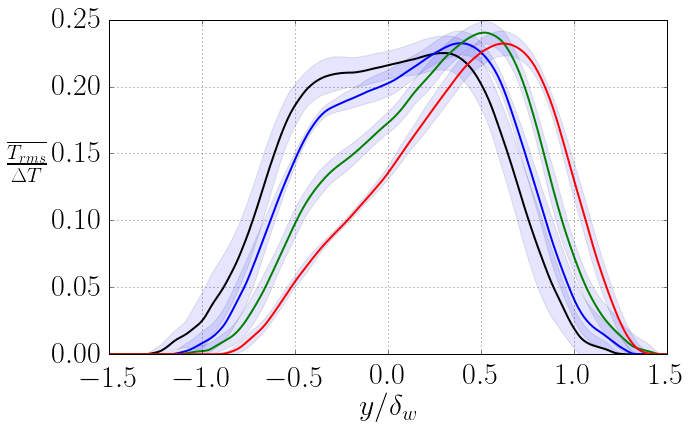

In [100]:
variable = 'Trms' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\frac{\overline{T_{rms}}}{\Delta T}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'Trms_ave_dw'
derivative = False



fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=25);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1.5,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #Tmin = fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=fSS/vDT[icase]
    errorSS = errorSS/vDT[icase]
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

#ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
plt.ylim(bottom=0)
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

In [101]:
def getSScase3TT(p_folders,lcases,variable,scaling,SS1,SS2,Npoints=500,derivative=False,ferror='std',fdmean= False):
    """
    returns one for case wanted to compute, using its own scaling for each run!
    Distribution of runs is given in lcases[icase](ex. lcases = [0,1,2] o [3,5]]
    only for one case at a time
    return only one profile per case and its Error of the mean.
    http://teacher.nsrl.rochester.edu/phy_labs/AppendixB/AppendixB.html
    """
    nruns = len(lcases)
    fycases = [[] for i in range(ncases)]
    ycases = [[] for i in range(ncases)]
    ferrorcases = [[] for i in range(ncases)]
    funint = np.zeros(Npoints);
    dfunint = np.zeros(Npoints);
    lim = 15.0;
    if scaling == 'dw':
        lim=2.0
    ydelta = np.linspace(-lim,lim,Npoints)
    nacum = 0
    fcum  = np.zeros(Npoints)
    fcum2 = np.zeros(Npoints)
    dfcum = np.zeros(Npoints)
    icount = 1
    damax = 0.0
    #Obtain dispersion on scaling
    Ntimes= 50
    [tint,deltaint,deltastd] = gettimeaverage(p_folders,lcases,scaling,SS1,SS2,Ntimes)
    #---------------------------------------
    for ijob in lcases:
        path = p_folders[ijob]
        print path
        with h5py.File(path,"r") as f:
            time = np.array(f['time']);
            y = np.array(f['y']);
            if variable=='Trms2':
                fun = np.array(f['Trms'])**2;
            else:
                fun = np.array(f[variable]);
            Tm= np.array(f['Tm']);
            DT = Tm[-1,0]-Tm[0,0]
            ds=DT/np.abs(np.max(der1(y,Tm),axis=0))
            y = np.array(f['y'])
            if variable=='rum':
                rhom = np.array(f['rhom'])
                fun = np.divide(fun,rhom)
            #print "computed rum/rhom"
            delta = np.array(ds)
            
            it1 = where(time>=SS1[ijob])[0][0]
            it2 = where(time>=SS2[ijob])[0][0]
            #print "SS1[%s]  = %s" %(ijob,SS1[ijob])
            #print "SS2[%s] = %s" %(ijob,SS2[ijob])
            for itime in range(it1,it2):
                dd = delta[itime]
                if fdmean == True:
                    dd = np.interp(time[itime],tint,deltaint)
                #edelta = 0.01*dd
                edelta = np.interp(time[itime],tint,deltastd)
                if derivative == True:
                    #ed = der1(y,fun[:,itime])*y/dd**2
                    funint = np.interp(ydelta,y/dd,dd*der1(y,fun[:,itime]))
                    dfunint = 0.0*funint#funint**2/dd**2*edelta**2
                    if itime==it1:
                        print "Taking derivative and multiplying by scaling"
                else:
                    if variable=='w3m' or variable[0:2] =='ep':
                        #ed = fun[:,itime]*y/dd**2
                        funint = np.interp(ydelta,y/dd,dd*fun[:,itime])
                        #edint   = np.interp(ydelta,y/dd,ed)
                        #dfunint = edint**2*edelta**2
                        dfunint = 0.0*funint
                        if itime==it1: #First time
                            print "Multiplying by scaling"
                    else:
                        funint = np.interp(ydelta,y/dd,fun[:,itime])
                        dfunint = 0.0*funint
                nacum+= 1
                fcum  = fcum  + funint
                fcum2 = fcum2 + funint**2
                dfcum = dfcum + dfunint
                #damax = max(damax,np.max(np.abs(funint)))
    funmean = fcum/nacum
    e1square = np.abs(fcum2-nacum*funmean**2)/(nacum-1)
    #e1square = np.abs(fcum2/nacum-funmean**2)
    #e2square = np.mean(dfcum)
    e2square = dfcum/nacum
    #funstd  = np.sqrt((e1square+e2square)/nacum)
    funstd = np.sqrt((e1square+e2square))
    #calculate ERROR of the mean= std/sqrt(N)
    print "Max of standard deviation = %s o/o" %(np.nanmax(np.abs(funstd))/np.nanmax(np.abs(funmean))*100)
    print "Number of profiles = %s" %(nacum)
    if ferror == 'std':
        print "Giving std-deviation error"
        return ydelta,funmean,funstd
    #funstd = np.sqrt(e2square+)
    else: 
        print "Giving error of the mean"
        return ydelta,funmean,funstd/np.sqrt(nacum)

/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 10.5052685067 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 10.2275274728 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
/share/drive/toni/VDML/s40/02/h5.stats
/share/drive/toni/VDML/s40/03/h5.stats
/share/drive/toni/VDML/s40/04/h5.stats
Max of standard deviation = 9.09378889288 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s80/01/h5.stats
/share/drive/toni/VDML/s80/02/h5.stats
/share/drive/toni/VDML/s80/03/h5.stats
/share/drive/toni/VDML/s80/04/h5.stats
Max of standard deviation = 12.0247968015 o/o
Number of profiles = 42
Giving s

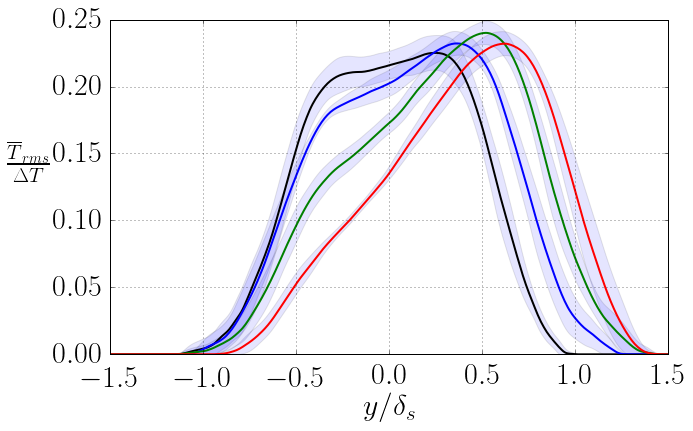

In [102]:
variable = 'Trms' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\frac{\overline{T}_{rms}}{\Delta T}$'
xlabel=r'$y/\delta_s$'
#figname = 'rhom_ave.eps'
figname = 'Trms_ave_ds'
derivative = False



fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=25);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1.5,1.5])
#plt.ylim([0.0,1.1])
vy0 = [0,0.3]
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3TT(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #Tmin = fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=fSS/vDT[icase]
    errorSS = errorSS/vDT[icase]
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

#ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
plt.ylim(bottom=0)
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 13.4098307643 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 7.47354056288 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
/share/drive/toni/VDML/s40/02/h5.stats
/share/drive/toni/VDML/s40/03/h5.stats
/share/drive/toni/VDML/s40/04/h5.stats
Max of standard deviation = 6.60834232505 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s80/01/h5.stats
/share/drive/toni/VDML/s80/02/h5.stats
/share/drive/toni/VDML/s80/03/h5.stats
/share/drive/toni/VDML/s80/04/h5.stats
Max of standard deviation = 6.14616222267 o/o
Number of profiles = 42
Giving s

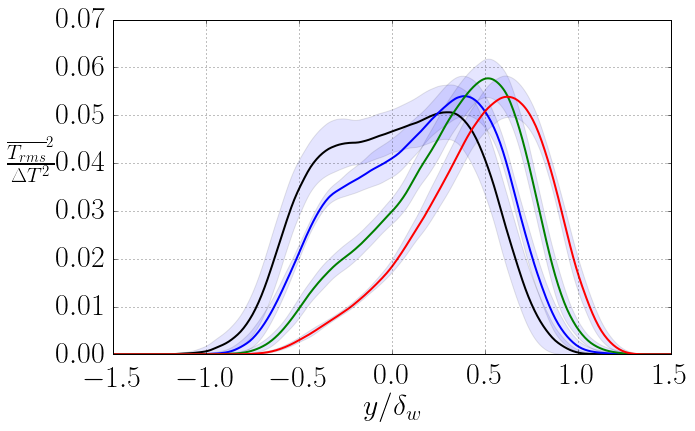

In [103]:
variable = 'Trms' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
#ylabel =r'$\frac{\overline{T^\prime T^\prime}}{\Delta T^2}$'
ylabel =r'$\frac{\overline{T_{rms}}^2}{\Delta T^2}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'Trms2_ave_dw'
derivative = False
PRINT = True



fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=25);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1.5,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #Tmin = fSS[0]
    errorSS = 2.0*fSS*errorSS/vDT[icase]**2
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=fSS**2/vDT[icase]**2
    
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

#ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
plt.ylim(bottom=0.0)
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 13.589497801 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 9.65508011594 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
/share/drive/toni/VDML/s40/02/h5.stats
/share/drive/toni/VDML/s40/03/h5.stats
/share/drive/toni/VDML/s40/04/h5.stats
Max of standard deviation = 9.98438634114 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s80/01/h5.stats
/share/drive/toni/VDML/s80/02/h5.stats
/share/drive/toni/VDML/s80/03/h5.stats
/share/drive/toni/VDML/s80/04/h5.stats
Max of standard deviation = 12.338905829 o/o
Number of profiles = 42
Giving std

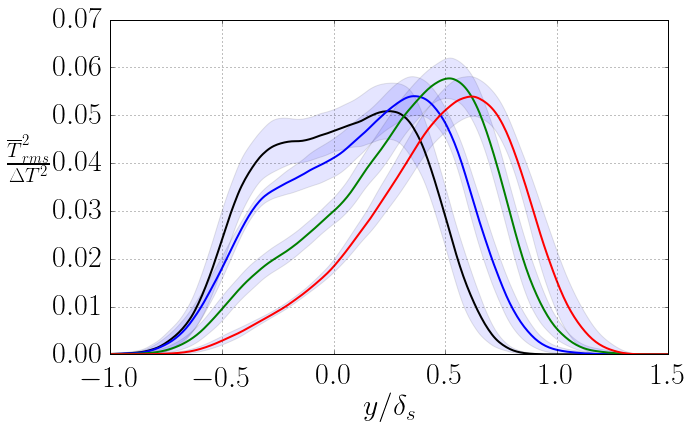

In [104]:
variable = 'Trms2' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\frac{\overline{T}_{rms}^2}{\Delta T^2}$'
xlabel=r'$y/\delta_s$'
#figname = 'rhom_ave.eps'
figname = 'Trms2_ave_ds'
derivative = False
PRINT = True



fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=25);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3TT(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #Tmin = fSS[0]
    errorSS = errorSS/vDT[icase]**2
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=fSS/vDT[icase]**2
    
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

#ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
plt.ylim(bottom=0.0)
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

In [105]:

icase = 0
print SS1j[lcases[icase][0]:lcases[icase][-1]+1]
print SS2j[lcases[icase][0]:lcases[icase][-1]+1]

[ 380.  460.  450.  450.]
[ 450.  510.  530.  510.]


In [106]:

icase = 1
print SS1j[lcases[icase][0]:lcases[icase][-1]+1]
print SS2j[lcases[icase][0]:lcases[icase][-1]+1]

[ 420.  420.  420.  410.]
[ 520.  500.  480.  470.]


/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 5.20811150818 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 3.44906058841 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
/share/drive/toni/VDML/s40/02/h5.stats
/share/drive/toni/VDML/s40/03/h5.stats
/share/drive/toni/VDML/s40/04/h5.stats
Max of standard deviation = 5.33613367882 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s80/01/h5.stats
/share/drive/toni/VDML/s80/02/h5.stats
/share/drive/toni/VDML/s80/03/h5.stats
/share/drive/toni/VDML/s80/04/h5.stats
Max of standard deviation = 5.27279604233 o/o
Number of profiles = 42
Giving s

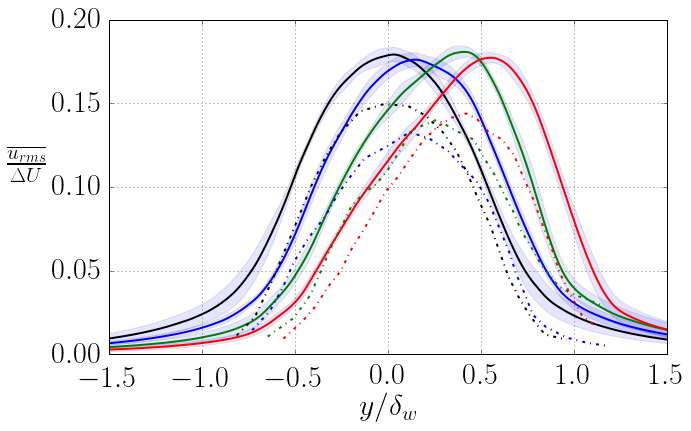

In [107]:
variable = 'urms' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel= r'$\frac{\overline{u_{rms}}}{\Delta U}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'urms_SS_dw'
derivative = False
PRINT = True


fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=25);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1.5,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
#plt.plot(urmsRM[:,0]/4.8,urmsRM[:,1],'o',color='k')
#plt.plot(R11BM[:,0],R11BM[:,1]**2,'^',color='k')
#yxit,fSSt,errorSSt = getSScase3(p_folders_test_s1,[0],variable,scaling,[350],[500],500,derivative)
#yxit2,fSSt2,errorSSt2 = getSScase3(p_folders_test_s1,[0],variable,scaling,[SS1[0]],[730],500,derivative)
#print SS1[0]
#plt.plot(yxit,fSSt,l_job_style[0],lw=2.0,ls='dashed')
#plt.plot(yxit2,fSSt2,l_job_style[0],lw=2.0,ls='dotted')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #Tmin = fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=fSS
    errorSS = errorSS
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

ax.yaxis.label.set_fontsize(30)
plt.plot(ups1pantano[:,0]/Dwpant[0],ups1pantano[:,1],'-.',color=l_case_color[0],markevery=2,lw=2.0)
plt.plot(ups2pantano[:,0]/Dwpant[1],ups2pantano[:,1],'-.',color=l_case_color[1],markevery=2,lw=2.0)
plt.plot(ups4pantano[:,0]/Dwpant[2],ups4pantano[:,1],'-.',color=l_case_color[2],markevery=2,lw=2.0) 
plt.plot(ups8pantano[:,0]/Dwpant[3],ups8pantano[:,1],'-.',color=l_case_color[3],markevery=2,lw=2.0) 
#plt.ylim([0,0.035])
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
#plt.ylim([0,2])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 5.20811150818 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 2.01117708763 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 3.44906058841 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 2.18057947035 o/o
Number of profiles = 31
G

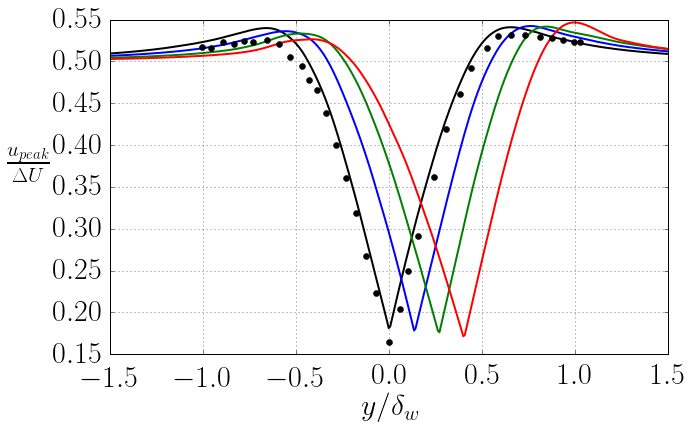

In [108]:
variable = 'urms' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel= r'$\frac{u_{peak}}{\Delta U}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'urms_kk_dw'
derivative = False
PRINT = True


fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=25);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1.5,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
#plt.plot(urmsRM[:,0]/4.8,urmsRM[:,1],'o',color='k')
#plt.plot(R11BM[:,0],R11BM[:,1]**2,'^',color='k')
#yxit,fSSt,errorSSt = getSScase3(p_folders_test_s1,[0],variable,scaling,[350],[500],500,derivative)
#yxit2,fSSt2,errorSSt2 = getSScase3(p_folders_test_s1,[0],variable,scaling,[SS1[0]],[730],500,derivative)
#print SS1[0]
#plt.plot(yxit,fSSt,l_job_style[0],lw=2.0,ls='dashed')
#plt.plot(yxit2,fSSt2,l_job_style[0],lw=2.0,ls='dotted')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    yxi,um,errorSS = getSScase3(p_folders,lcases[icase],'um',scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #Tmin = fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=fSS
    errorSS = errorSS
    #plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.plot(yxi,np.abs(np.array(um))+np.abs(fSS),l_job_style[icase],lw=2.0)
    #plt.plot(yxi,np.abs(np.array(um))-0.5+np.abs(fSS),l_job_style[icase],lw=2.0,ls='dashed')
    #plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])
#plt.plot(urmsRM[:,0]/4.8,urmsRM[:,1],'o',color='k')
#plt.plot(R11BM[:,0],R11BM[:,1]**2,'^',color='k')
#R11BM2 = np.interp(yxi,R11BM[:,0])
urmsRM2 =np.sqrt( np.interp(um_rogers[:,0],urmsRM[:,0],urmsRM[:,1]))
plt.plot(um_rogers[:,0]/4.8,np.abs(um_rogers[:,1])+np.abs(urmsRM2),'o',color=l_case_color[0])
ax.yaxis.label.set_fontsize(30)
#plt.plot(ups1pantano[:,0]/Dwpant[0],ups1pantano[:,1],'-.',color=l_case_color[0],markevery=2,lw=2.0)
#plt.plot(ups2pantano[:,0]/Dwpant[1],ups2pantano[:,1],'-.',color=l_case_color[1],markevery=2,lw=2.0)
#plt.plot(ups4pantano[:,0]/Dwpant[2],ups4pantano[:,1],'-.',color=l_case_color[2],markevery=2,lw=2.0) 
#plt.plot(ups8pantano[:,0]/Dwpant[3],ups8pantano[:,1],'-.',color=l_case_color[3],markevery=2,lw=2.0) 
#plt.ylim([0,0.035])
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
#plt.ylim([0,2])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 13.4098307643 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 7.47354056288 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 0.637851618666 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
/share/drive/toni/VDML/s40/02/h5.stats
/share/drive/toni/VDML/s40/03/h5.stats
/share/drive/toni/VDML/s40/04/h5.stats
Max of standard deviation = 6.60834232505 o/o
Number of profiles = 31
Giving 

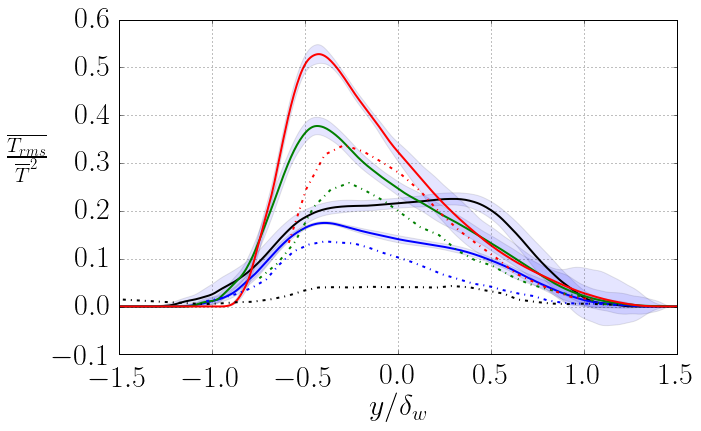

In [109]:
variable = 'Trms' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel= r'$\frac{\overline{T_{rms}}}{\overline{T}^2}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'rhop_SS_dw'
derivative = False
PRINT = True


fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=25);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1.5,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
#plt.plot(urmsRM[:,0]/4.8,urmsRM[:,1],'o',color='k')
#plt.plot(R11BM[:,0],R11BM[:,1]**2,'^',color='k')
#yxit,fSSt,errorSSt = getSScase3(p_folders_test_s1,[0],variable,scaling,[350],[500],500,derivative)
#yxit2,fSSt2,errorSSt2 = getSScase3(p_folders_test_s1,[0],variable,scaling,[SS1[0]],[730],500,derivative)
#print SS1[0]
#plt.plot(yxit,fSSt,l_job_style[0],lw=2.0,ls='dashed')
#plt.plot(yxit2,fSSt2,l_job_style[0],lw=2.0,ls='dotted')
icase = 0
yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
for icase in range(1,len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    yxi,Tm,errorTm = getSScase3(p_folders,lcases[icase],'Tm',scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #Tmin = fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=fSS/Tm**2
    errorSS = errorSS
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

ax.yaxis.label.set_fontsize(30)
plt.plot(rhops1pantano[:,0]/Dwpant[0],rhops1pantano[:,1],'-.',color=l_case_color[0],markevery=2,lw=2.0)
plt.plot(rhops2pantano[:,0]/Dwpant[1],rhops2pantano[:,1],'-.',color=l_case_color[1],markevery=2,lw=2.0)
plt.plot(rhops4pantano[:,0]/Dwpant[2],rhops4pantano[:,1],'-.',color=l_case_color[2],markevery=2,lw=2.0) 
plt.plot(rhops8pantano[:,0]/Dwpant[3],rhops8pantano[:,1],'-.',color=l_case_color[3],markevery=2,lw=2.0) 
#plt.ylim([0,0.035])
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
#plt.ylim([0,2])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

In [110]:
Dwpant = 5.*np.divide(fpant,[1.0,0.67,0.57,0.37])
print Dwpant

[ 5.          5.35782625  6.9725596   8.2005082 ]


/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 5.60285527604 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 5.84022717634 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
/share/drive/toni/VDML/s40/02/h5.stats
/share/drive/toni/VDML/s40/03/h5.stats
/share/drive/toni/VDML/s40/04/h5.stats
Max of standard deviation = 7.07940369969 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s80/01/h5.stats
/share/drive/toni/VDML/s80/02/h5.stats
/share/drive/toni/VDML/s80/03/h5.stats
/share/drive/toni/VDML/s80/04/h5.stats
Max of standard deviation = 6.19236991286 o/o
Number of profiles = 42
Giving s

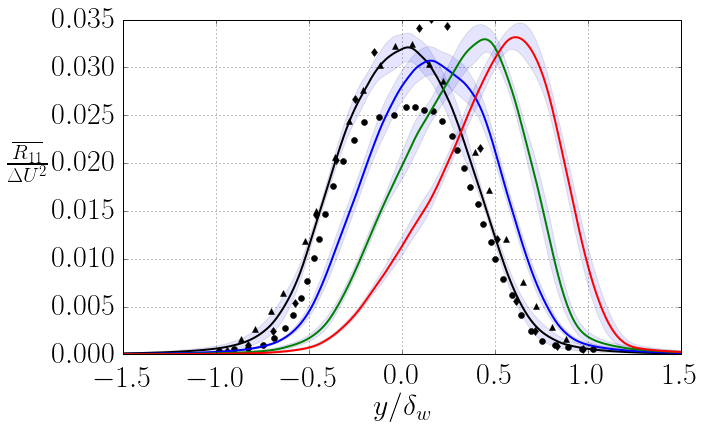

In [111]:
variable = 'R11' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel= r'$\frac{\overline{R_{11}}}{\Delta U^2}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'R11_SS_dw'
derivative = False
PRINT = True


fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=25);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1.5,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
plt.plot(urmsRM[:,0]/4.8,urmsRM[:,1],'o',color='k')
plt.plot(R11BM[:,0],R11BM[:,1]**2,'^',color='k')
plt.plot(R11SJ[:,0],R11SJ[:,1]**2,'d',color='k')
#yxit,fSSt,errorSSt = getSScase3(p_folders_test_s1,[0],variable,scaling,[350],[500],500,derivative)
#yxit2,fSSt2,errorSSt2 = getSScase3(p_folders_test_s1,[0],variable,scaling,[SS1[0]],[730],500,derivative)
#print SS1[0]
#plt.plot(yxit,fSSt,l_job_style[0],lw=2.0,ls='dashed')
#plt.plot(yxit2,fSSt2,l_job_style[0],lw=2.0,ls='dotted')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #Tmin = fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=fSS
    errorSS = errorSS
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

ax.yaxis.label.set_fontsize(30)
plt.ylim([0,0.035])

#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
#plt.ylim([0,2])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 7.89204012645 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 6.35027425696 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
/share/drive/toni/VDML/s40/02/h5.stats
/share/drive/toni/VDML/s40/03/h5.stats
/share/drive/toni/VDML/s40/04/h5.stats
Max of standard deviation = 6.92939751642 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s80/01/h5.stats
/share/drive/toni/VDML/s80/02/h5.stats
/share/drive/toni/VDML/s80/03/h5.stats
/share/drive/toni/VDML/s80/04/h5.stats
Max of standard deviation = 9.19587474451 o/o
Number of profiles = 42
Giving s

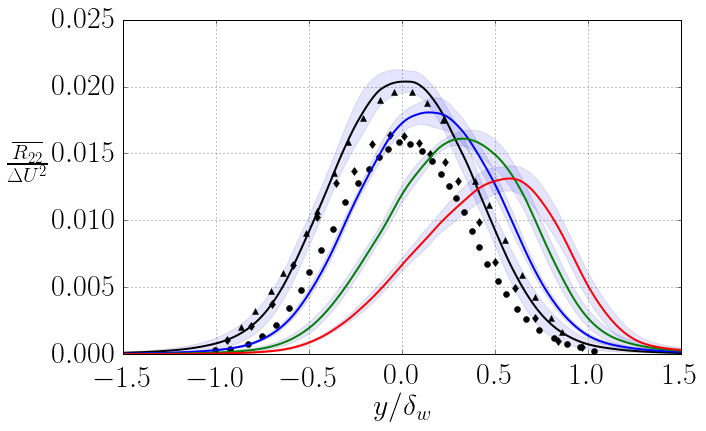

In [112]:
variable = 'R22' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel= r'$\frac{\overline{R_{22}}}{\Delta U^2}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'R22_SS_dw'
derivative = False
PRINT = True



fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=25);


#yxit,fSSt,errorSSt = getSScase3(p_folders_test_s1,[0],variable,scaling,[350],[500],500,derivative)
#yxit2,fSSt2,errorSSt2 = getSScase3(p_folders_test_s1,[0],variable,scaling,[SS1[0]],[730],500,derivative)
#print SS1[0]
#plt.plot(yxit,fSSt,l_job_style[0],lw=2.0,ls='dashed')
#plt.plot(yxit2,fSSt2,l_job_style[0],lw=2.0,ls='dotted')

if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1.5,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
plt.plot(vrmsRM[:,0]/4.8,vrmsRM[:,1],'o',color='k')
plt.plot(R22BM[:,0],R22BM[:,1]**2,'^',color='k')
plt.plot(R22SJ[:,0],R22SJ[:,1]**2,'d',color='k')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #Tmin = fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=fSS
    errorSS = errorSS
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
plt.ylim([0,0.025])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 3.86418841484 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 6.89084079145 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
/share/drive/toni/VDML/s40/02/h5.stats
/share/drive/toni/VDML/s40/03/h5.stats
/share/drive/toni/VDML/s40/04/h5.stats
Max of standard deviation = 7.54894989343 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s80/01/h5.stats
/share/drive/toni/VDML/s80/02/h5.stats
/share/drive/toni/VDML/s80/03/h5.stats
/share/drive/toni/VDML/s80/04/h5.stats
Max of standard deviation = 7.04019896341 o/o
Number of profiles = 42
Giving s

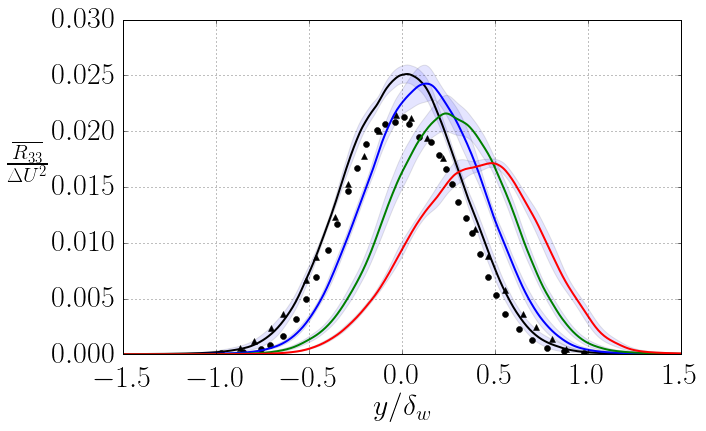

In [113]:
variable = 'R33' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel= r'$\frac{\overline{R_{33}}}{\Delta U^2}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'R33_SS_dw'
derivative = False
PRINT = True



fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=25);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1.5,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
plt.plot(wrmsRM[:,0]/4.8,wrmsRM[:,1],'o',color='k')
plt.plot(R33BM[:,0],R33BM[:,1]**2,'^',color='k')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #Tmin = fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=fSS
    errorSS = errorSS
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
#plt.ylim([0,2])
plt.ylim([0,0.030])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

In [114]:
print 0.017/0.025, 0.0135/0.02

0.68 0.675


/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 6.50961073698 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 5.89661025843 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
/share/drive/toni/VDML/s40/02/h5.stats
/share/drive/toni/VDML/s40/03/h5.stats
/share/drive/toni/VDML/s40/04/h5.stats
Max of standard deviation = 7.74352277487 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s80/01/h5.stats
/share/drive/toni/VDML/s80/02/h5.stats
/share/drive/toni/VDML/s80/03/h5.stats
/share/drive/toni/VDML/s80/04/h5.stats
Max of standard deviation = 8.86344782268 o/o
Number of profiles = 42
Giving s

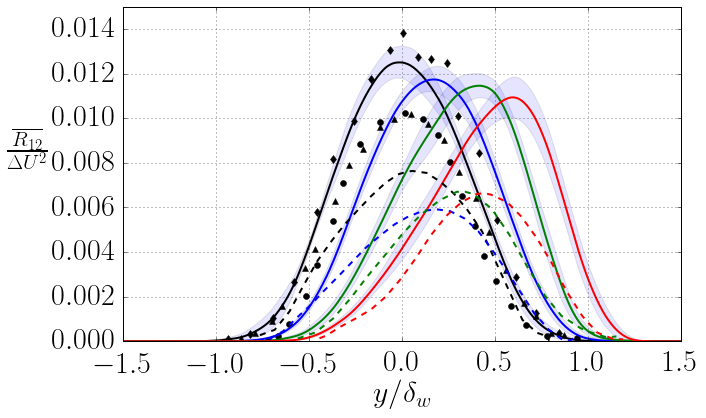

In [115]:
variable = 'R12' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel= r'$\frac{\overline{R_{12}}}{\Delta U^2}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'R12_SS_dw'
derivative = False
fformat = '.pdf'


fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=25);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1.5,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
plt.plot(R12RM[:,0],R12RM[:,1]**2,'o',color='k')
plt.plot(R12BM[:,0],R12BM[:,1]**2,'^',color='k')
plt.plot(R12SJ[:,0],R12SJ[:,1]**2,'d',color='k')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #yxi,ruv,errorSS2 = getSScase3(p_folders,lcases[icase],'ruv',scaling,SS1j,SS2j,500,derivative)
    #yxi,rum,errorSS2 = getSScase3(p_folders,lcases[icase],'rum',scaling,SS1j,SS2j,500,derivative)
    #yxi,rvm,errorSS2 = getSScase3(p_folders,lcases[icase],'rvm',scaling,SS1j,SS2j,500,derivative)
    #yxi,rhom,errorSS2 = getSScase3(p_folders,lcases[icase],'rhom',scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #Tmin = fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=fSS
    errorSS = errorSS
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    #ftest = np.divide(np.subtract(ruv,rum*rvm),rhom)
    #plt.plot(yxi,ftest,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
plt.plot(R12s1pantano[:,0]/Dwpant[0],R12s1pantano[:,1],'--',color=l_case_color[0],markevery=2,lw=2.0)
plt.plot(R12s2pantano[:,0]/Dwpant[1],R12s2pantano[:,1],'--',color=l_case_color[1],markevery=2,lw=2.0)
plt.plot(R12s4pantano[:,0]/Dwpant[2],R12s4pantano[:,1],'--',color=l_case_color[2],markevery=2,lw=2.0) 
plt.plot(R12s8pantano[:,0]/Dwpant[3],R12s8pantano[:,1],'--',color=l_case_color[3],markevery=2,lw=2.0) 
#plt.ylim([0,2])
plt.ylim([0,0.015])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print pathname
    #Save with STD
    #pathname = save_folder + figname + 'std' + fformat
    #fig.savefig(pathname,bbox_inches='tight')

In [116]:
print vdmp

[0.016821203211995043+/-0.0002830611712747863
 0.014672522544513547+/-0.00017040340917390742
 0.010754697179303543+/-0.000138529610048385
 0.006636117756263703+/-0.00014324161384345074]


In [117]:
print vdmp

[0.016821203211995043+/-0.0002830611712747863
 0.014672522544513547+/-0.00017040340917390742
 0.010754697179303543+/-0.000138529610048385
 0.006636117756263703+/-0.00014324161384345074]


/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 2.01117708763 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 6.50961073698 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 2.18057947035 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 5.89661025843 o/o
Number of profiles = 31
G

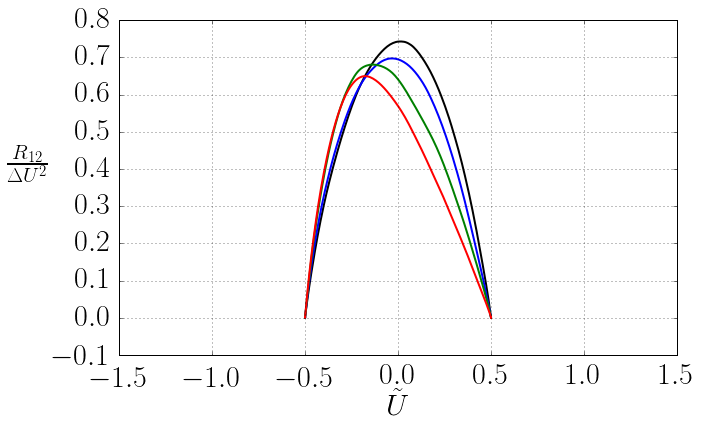

In [118]:
variable = 'R12' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel= r'$\frac{R_{12}}{\Delta U^2}$'
xlabel=r'$\tilde{U}$'
#figname = 'rhom_ave.eps'
figname = 'R12_vs_uf'
derivative = False



fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=25);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1.5,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
#plt.plot(R12RM[:,0],R12RM[:,1]**2,'o',color='k')
#plt.plot(R12BM[:,0],R12BM[:,1]**2,'^',color='k')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,U,errorSSU = getSScase3(p_folders,lcases[icase],'um',scaling,SS1j,SS2j,500,derivative)
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #yxi,ruv,errorSS2 = getSScase3(p_folders,lcases[icase],'ruv',scaling,SS1j,SS2j,500,derivative)
    #yxi,rum,errorSS2 = getSScase3(p_folders,lcases[icase],'rum',scaling,SS1j,SS2j,500,derivative)
    #yxi,rvm,errorSS2 = getSScase3(p_folders,lcases[icase],'rvm',scaling,SS1j,SS2j,500,derivative)
    #yxi,rhom,errorSS2 = getSScase3(p_folders,lcases[icase],'rhom',scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #Tmin = fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=fSS
    errorSS = errorSS
    plt.plot(U,fSS/0.01682120321199504,l_job_style[icase],lw=2.0)
    #ftest = np.divide(np.subtract(ruv,rum*rvm),rhom)
    #plt.plot(yxi,ftest,l_job_style[icase],lw=2.0)
    #plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(R12s1pantano[:,0]/Dwpant[0],R12s1pantano[:,1],'-.',color=l_case_color[0],markevery=2,lw=2.0)
#plt.plot(R12s2pantano[:,0]/Dwpant[1],R12s2pantano[:,1],'-.',color=l_case_color[1],markevery=2,lw=2.0)
#plt.plot(R12s4pantano[:,0]/Dwpant[2],R12s4pantano[:,1],'-.',color=l_case_color[2],markevery=2,lw=2.0) 
#plt.plot(R12s8pantano[:,0]/Dwpant[3],R12s8pantano[:,1],'-.',color=l_case_color[3],markevery=2,lw=2.0) 
#plt.ylim([0,2])
#plt.ylim([0,0.015])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

### Calculating first and last file to average for each job

$\delta_m(t) = \frac{1}{\rho_0 \Delta U^2} \int_{-\infty}^\infty {\overline{ \rho } \left( 
\frac{1}{2}  \Delta U - \tilde{u} \right) \left( \frac{1}{2}  \Delta U + \tilde{u} \right) dy}$

## Gradients 

/share/drive/toni/VDML/s10/02/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s10/03/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s10/04/newman/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s10/06/h5.stats
Taking derivative and multiplying by scaling
Max of standard deviation = 7.44506841194 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/02/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/03/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/04/h5.stats
Taking derivative and multiplying by scaling
Max of standard deviation = 6.92127197395 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s40/02/h5.stats
Taki

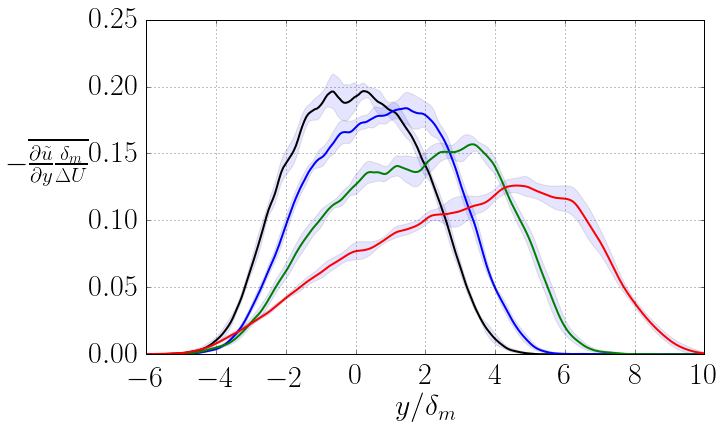

In [119]:
variable = 'rum' #any vector variable available
scaling  = 'dm' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel= r'$-\overline{\frac{\partial \tilde{u}}{\partial y}\frac{\delta_m}{\Delta U}}$'
xlabel=r'$y/\delta_m$'
#figname = 'rhom_ave.eps'
figname = 'dufdy_ave_dm'
derivative = True



fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=40);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1.5,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
#plt.plot(R12RM[:,0],R12RM[:,1]**2,'o',color='k')
#plt.plot(R12BM[:,0],R12BM[:,1]**2,'^',color='k')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #Tmin = fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=-fSS
    errorSS = errorSS
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
plt.ylim(bottom=0.0)
#plt.ylim([0,0.012])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s10/02/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s10/03/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s10/04/newman/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s10/06/h5.stats
Taking derivative and multiplying by scaling
Max of standard deviation = 6.69362287671 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/02/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/03/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/04/h5.stats
Taking derivative and multiplying by scaling
Max of standard deviation = 6.05993247302 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s40/02/h5.stats
Taki

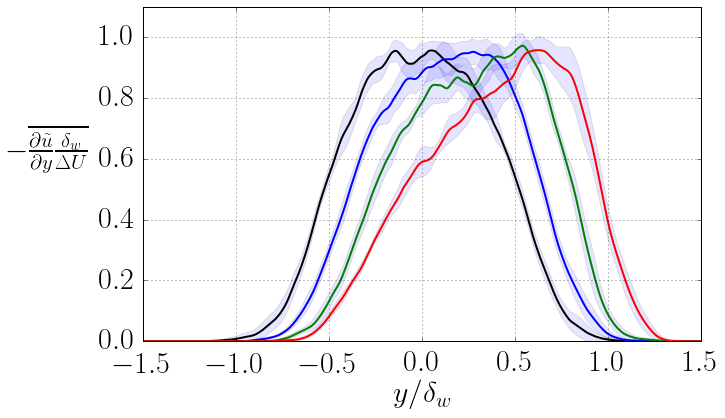

In [120]:
variable = 'rum' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel= r'$-\overline{\frac{\partial \tilde{u}}{\partial y}\frac{\delta_w}{\Delta U}}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'dufdy_ave_dw'
derivative = True



fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=50);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1.5,1.5])
plt.ylim([0.0,1.1])
plt.grid('on')
#plt.plot(R12RM[:,0],R12RM[:,1]**2,'o',color='k')
#plt.plot(R12BM[:,0],R12BM[:,1]**2,'^',color='k')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #Tmin = fSS[0]
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=-fSS
    errorSS = errorSS
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
plt.ylim(bottom=0.0)
#plt.ylim([0,0.012])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s20/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/02/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/03/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/04/h5.stats
Taking derivative and multiplying by scaling
Max of standard deviation = 7.28070905418 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s40/02/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s40/03/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s40/04/h5.stats
Taking derivative and multiplying by scaling
Max of standard deviation = 11.3447345421 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s80/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s80/02/h5.stats
Taking deri

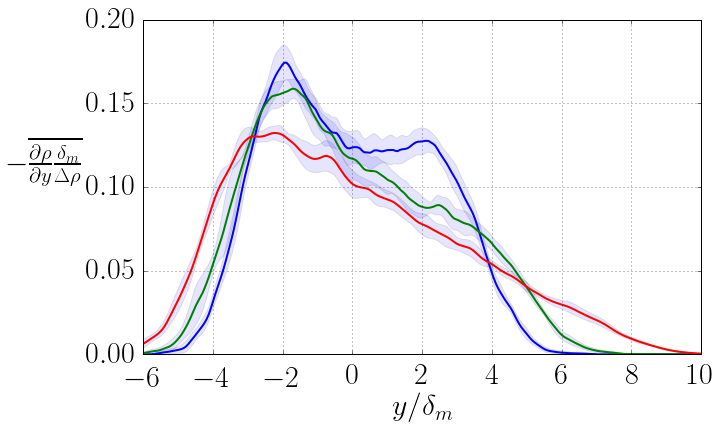

In [121]:
variable = 'rhom' #any vector variable available
scaling  = 'dm' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
#ylabel= r'$-\overline{\frac{\partial \overline{\rho}}{\partial y}\frac{\delta_m}{\Delta \rho}}$'
ylabel= r'$-\overline{\frac{\partial \rho}{\partial y}\frac{\delta_m}{\Delta \rho}}$'
xlabel=r'$y/\delta_m$'
#figname = 'rhom_ave.eps'
figname = 'drhomdy_ave_dm'
derivative = True



fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=40);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1.5,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
#plt.plot(R12RM[:,0],R12RM[:,1]**2,'o',color='k')
#plt.plot(R12BM[:,0],R12BM[:,1]**2,'^',color='k')
for icase in range(1,len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #Drho = np.abs(fSS[-1]-fSS[0])
    #Tmin = fSS[0]
    #Drhody = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=-fSS/vDrho[icase]
    errorSS = errorSS/vDrho[icase]
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
plt.ylim(bottom=0.0)
#plt.ylim([0,0.012])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s20/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/02/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/03/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/04/h5.stats
Taking derivative and multiplying by scaling
Max of standard deviation = 7.24244385039 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s40/02/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s40/03/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s40/04/h5.stats
Taking derivative and multiplying by scaling
Max of standard deviation = 12.3418827173 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s80/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s80/02/h5.stats
Taking deri

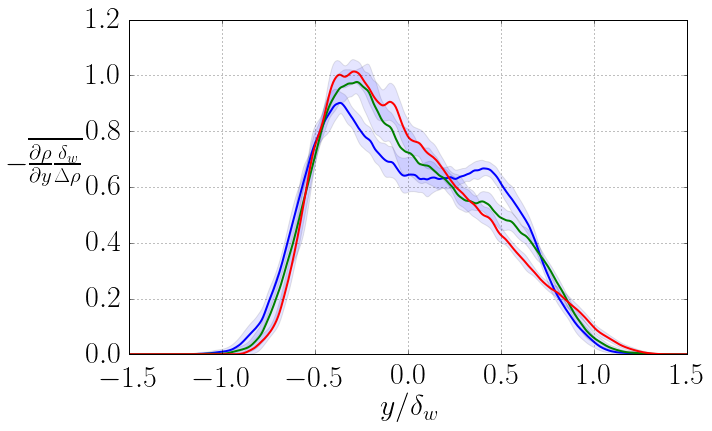

In [122]:
variable = 'rhom' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel= r'$-\overline{\frac{\partial \rho}{\partial y}\frac{\delta_w}{\Delta \rho}}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'drhomdy_ave_dw'
derivative = True



fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=40);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1.5,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
#plt.plot(R12RM[:,0],R12RM[:,1]**2,'o',color='k')
#plt.plot(R12BM[:,0],R12BM[:,1]**2,'^',color='k')
for icase in range(1,len(lcases)):
    #print ycases[icase], fSS[icase]
    #yxi,TmSS,erhomSS = getSScase3(p_folders,lcases[icase],'rhom',scaling,SS1j,SS2j,500,False)
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #Drho = np.abs(fSS[-1]-fSS[0])
    #Tmin = fSS[0]
    rhoref=vDrho[icase]
    #Drhody = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=-fSS/rhoref#/vDrho[icase]
    errorSS = errorSS/rhoref#/vDrho[icase]
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
plt.ylim(bottom=0.0)
#plt.ylim([0,0.012])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s20/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/02/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/03/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/04/h5.stats
Taking derivative and multiplying by scaling
Max of standard deviation = 8.01271384616 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s40/02/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s40/03/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s40/04/h5.stats
Taking derivative and multiplying by scaling
Max of standard deviation = 13.3388799601 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s80/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s80/02/h5.stats
Taking deri

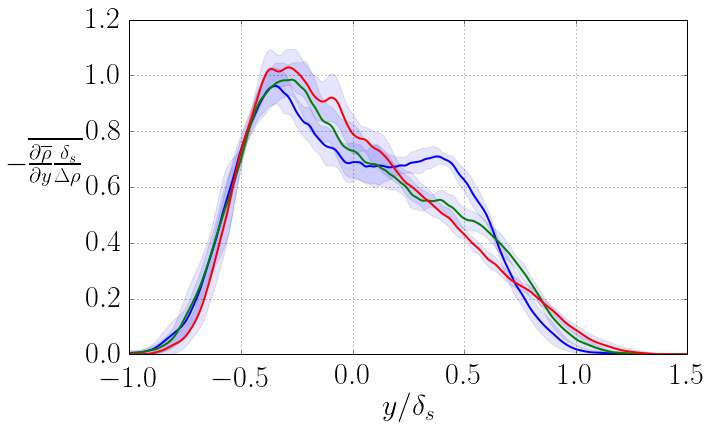

In [123]:
variable = 'rhom' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel= r'$-\overline{\frac{\partial \overline{\rho}}{\partial y}\frac{\delta_s}{\Delta \rho}}$'
xlabel=r'$y/\delta_s$'
#figname = 'rhom_ave.eps'
figname = 'drhomdy_ave_ds'
derivative = True



fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=40);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
#plt.plot(R12RM[:,0],R12RM[:,1]**2,'o',color='k')
#plt.plot(R12BM[:,0],R12BM[:,1]**2,'^',color='k')
for icase in range(1,len(lcases)):
    #print ycases[icase], fSS[icase]
    #yxi,TmSS,erhomSS = getSScase3(p_folders,lcases[icase],'rhom',scaling,SS1j,SS2j,500,False)
    yxi,fSS,errorSS = getSScase3TT(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #Drho = np.abs(fSS[-1]-fSS[0])
    #Tmin = fSS[0]
    rhoref=vDrho[icase]
    #Drhody = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=-fSS/rhoref#/vDrho[icase]
    errorSS = errorSS/rhoref#/vDrho[icase]
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
plt.ylim(bottom=0.0)
#plt.ylim([0,0.012])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s10/02/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s10/03/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s10/04/newman/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s10/06/h5.stats
Taking derivative and multiplying by scaling
Max of standard deviation = 12.5279974154 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/02/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/03/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/04/h5.stats
Taking derivative and multiplying by scaling
Max of standard deviation = 6.96733635856 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s40/02/h5.stats
Taki

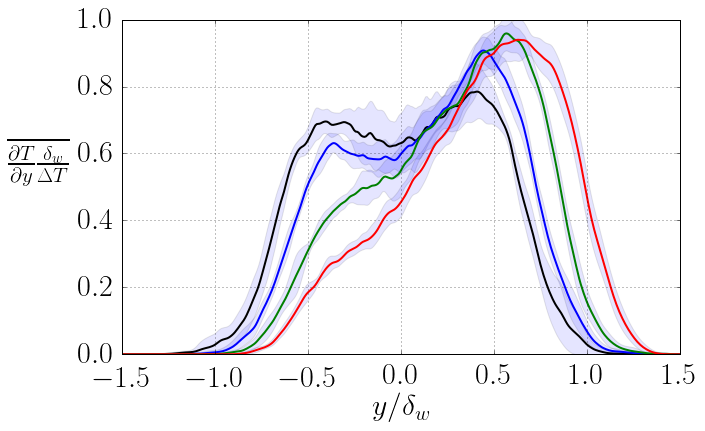

In [124]:
variable = 'Tm' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel= r'$\overline{\frac{\partial T}{\partial y}\frac{\delta_w}{\Delta T}}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'dTmdy_ave_dw'
derivative = True



fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=40);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1.5,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
#plt.plot(R12RM[:,0],R12RM[:,1]**2,'o',color='k')
#plt.plot(R12BM[:,0],R12BM[:,1]**2,'^',color='k')
for icase in range(0,len(lcases)):
    #print ycases[icase], fSS[icase]
    #yxi,TmSS,erhomSS = getSScase3(p_folders,lcases[icase],'rhom',scaling,SS1j,SS2j,500,False)
    yxi,fSS,errorSS = getSScase3(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #Drho = np.abs(fSS[-1]-fSS[0])
    #Tmin = fSS[0]
    rhoref=vDT[icase]
    #Drhody = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=fSS/rhoref#/vDrho[icase]
    errorSS = errorSS/rhoref#/vDrho[icase]
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
plt.ylim(bottom=0.0)
plt.ylim(top=1.0)
#plt.ylim([0,0.012])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s10/02/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s10/03/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s10/04/newman/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s10/06/h5.stats
Taking derivative and multiplying by scaling
Max of standard deviation = 12.0791841165 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/02/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/03/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s20/04/h5.stats
Taking derivative and multiplying by scaling
Max of standard deviation = 8.20693967832 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
Taking derivative and multiplying by scaling
/share/drive/toni/VDML/s40/02/h5.stats
Taki

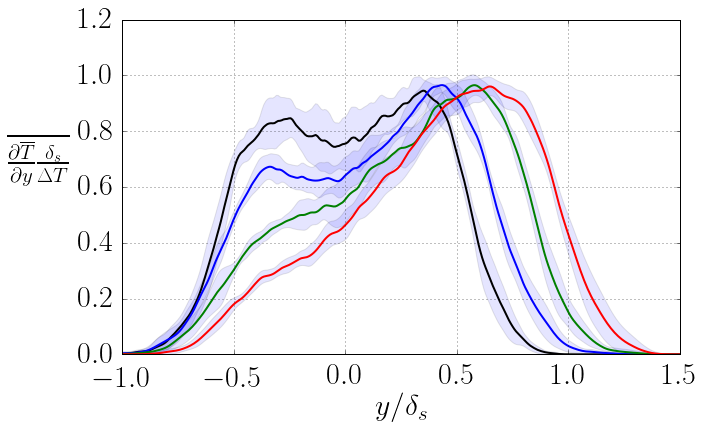

In [125]:
variable = 'Tm' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel= r'$\overline{\frac{\partial \overline{T}}{\partial y}\frac{\delta_s}{\Delta T}}$'
xlabel=r'$y/\delta_s$'
#figname = 'rhom_ave.eps'
figname = 'dTmdy_ave_ds'
derivative = True



fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=40);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
#plt.plot(R12RM[:,0],R12RM[:,1]**2,'o',color='k')
#plt.plot(R12BM[:,0],R12BM[:,1]**2,'^',color='k')
for icase in range(0,len(lcases)):
    #print ycases[icase], fSS[icase]
    #yxi,TmSS,erhomSS = getSScase3(p_folders,lcases[icase],'rhom',scaling,SS1j,SS2j,500,False)
    yxi,fSS,errorSS = getSScase3TT(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #Drho = np.abs(fSS[-1]-fSS[0])
    #Tmin = fSS[0]
    rhoref=vDT[icase]
    #Drhody = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=fSS/rhoref#/vDrho[icase]
    errorSS = errorSS/rhoref#/vDrho[icase]
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
plt.ylim(bottom=0.0)
#plt.ylim([0,0.012])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

# STATISTICS FROM FIELD

In [126]:
Kuref=np.loadtxt('/share/drive/toni/python/Ku.dat')
Suref=np.loadtxt('/share/drive/toni/python/Su.dat')
Kvref=np.loadtxt('/share/drive/toni/python/Kv.dat')
Svref=np.loadtxt('/share/drive/toni/python/Sv.dat')
Ktref=np.loadtxt('/share/drive/toni/python/Kt.dat')
Stref=np.loadtxt('/share/drive/toni/python/St.dat')

In [127]:
#print Kuref

## Density

In [134]:
#print Dwcase
Dwcase=[1.0,1.0,1.0,1.0] #Using dw!

In [135]:
p_root = '/share/drive/toni/VDML/'
cases = ['s20','s20','s40','s80']
p_folder_stats = [p_root + cases[i]+'/rhostats.txt' for i in range(len(cases))]
stat=[]
for case,i in zip(p_folder_stats,range(len(cases))):
    stat.append(np.loadtxt(case) )
l_width=2.0
l_job_color=['k','b','g','r']

0.75 0.75
0.625 1.875
0.5625 3.9375


(-1.0, 1.5)

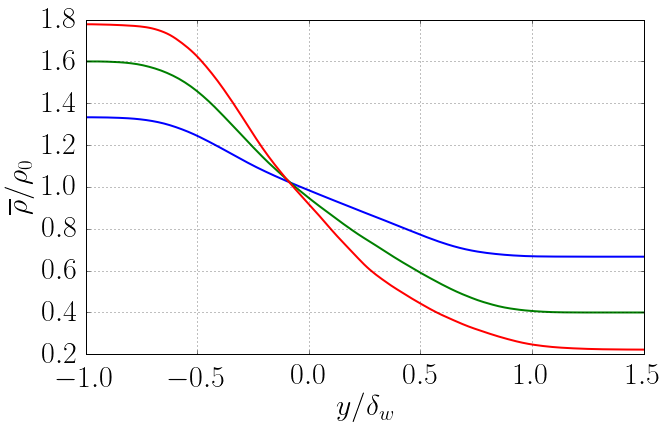

In [136]:
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
lamb = [0 for i in range(len(cases))]
Tmin = [0 for i in range(len(cases))]
Tmax = [0 for i in range(len(cases))]
DT = [0 for i in range(len(cases))]
s = [1,2,4,8]
for i in range(1,len(cases)):
    lamb[i] = (s[i]-1.0)/(s[i]+1.0)
    Tmax[i]=1.0/(1-lamb[i])
    Tmin[i] = 1.0/(1.0+lamb[i])
    DT[i]=Tmax[i]- Tmin[i]
    print Tmin[i],DT[i]
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    plt.plot(stat[i][0,:],stat[i][1,:],lw=l_width,color=l_job_color[i]);plt.grid('on')
plt.xlabel(r'$y/\delta_w$')
#ylabel=r'$\frac{T-T_{min}}{\Delta T}$'
ylabel=r'$\overline{\rho}/\rho_0$'
plt.ylabel(ylabel)
plt.xlim([-1.0,1.5])

/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in sqrt
  # This is added back by InteractiveShellApp.init_path()


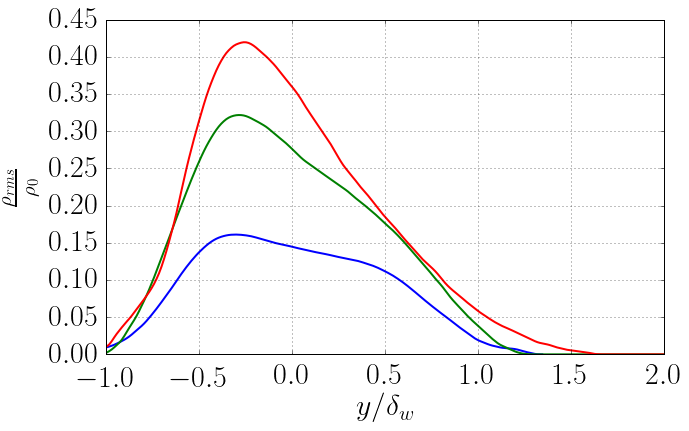

In [137]:
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
column=2
for i in range(1,len(cases)):
    Tmax[i]=1.0/(1-lamb[i])
    Tmin[i] = 1.0/(1.0+lamb[i])
    #DT[i]=Tmax[i]- Tmin[i]
    #if i == 0:
    #    Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    rhom = stat[i][1,:]
    plt.plot(stat[i][0,:],(np.sqrt(stat[i][column,:])),lw=l_width,color=l_job_color[i]);plt.grid('on')
    #plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    #plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
#plt.ylim([0.0,0.25])
plt.xlim([-1,2])
#plt.xlim([np.min(ymin),np.max(ymax)])
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$\frac{\rho_{rms}}{\rho_0}$')

/share/drive/toni/VDML/s10/02/h5.stats
/share/drive/toni/VDML/s10/03/h5.stats
/share/drive/toni/VDML/s10/04/newman/h5.stats
/share/drive/toni/VDML/s10/06/h5.stats
Max of standard deviation = 13.589497801 o/o
Number of profiles = 26
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 9.65508011594 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
/share/drive/toni/VDML/s40/02/h5.stats
/share/drive/toni/VDML/s40/03/h5.stats
/share/drive/toni/VDML/s40/04/h5.stats
Max of standard deviation = 9.98438634114 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s80/01/h5.stats
/share/drive/toni/VDML/s80/02/h5.stats
/share/drive/toni/VDML/s80/03/h5.stats
/share/drive/toni/VDML/s80/04/h5.stats
Max of standard deviation = 12.338905829 o/o
Number of profiles = 42
Giving std

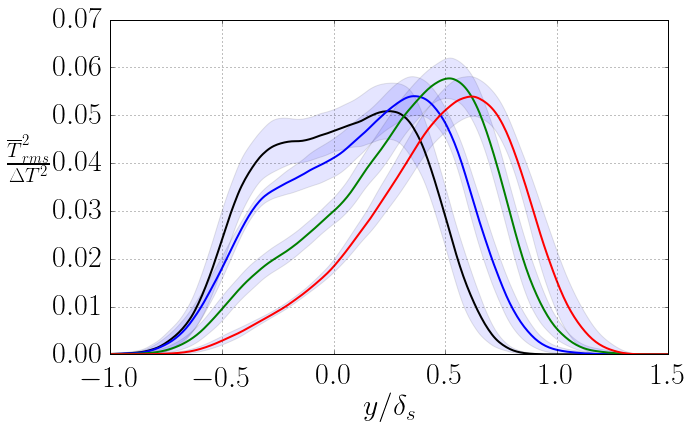

In [89]:
variable = 'Trms2' #any vector variable available
scaling  = 'dw' #can be dw or dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\frac{\overline{T}_{rms}^2}{\Delta T^2}$'
xlabel=r'$y/\delta_s$'
#figname = 'rhom_ave.eps'
figname = 'Trms2_ave_ds'
derivative = False
PRINT = True



fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=25);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in range(len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3TT(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #Tmin = fSS[0]
    errorSS = errorSS/vDT[icase]**2
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=fSS/vDT[icase]**2
    
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    plt.fill_between(yxi,fSS+errorSS,fSS-errorSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

#ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
plt.ylim(bottom=0.0)
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 10.2275274728 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s20/01/h5.stats
/share/drive/toni/VDML/s20/02/h5.stats
/share/drive/toni/VDML/s20/03/h5.stats
/share/drive/toni/VDML/s20/04/h5.stats
Max of standard deviation = 0.967010282904 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
/share/drive/toni/VDML/s40/02/h5.stats
/share/drive/toni/VDML/s40/03/h5.stats
/share/drive/toni/VDML/s40/04/h5.stats
Max of standard deviation = 9.09378889288 o/o
Number of profiles = 31
Giving std-deviation error
/share/drive/toni/VDML/s40/01/h5.stats
/share/drive/toni/VDML/s40/02/h5.stats
/share/drive/toni/VDML/s40/03/h5.stats
/share/drive/toni/VDML/s40/04/h5.stats
Max of standard deviation = 1.69732684395 o/o
Number of profiles = 31
Giving std-dev

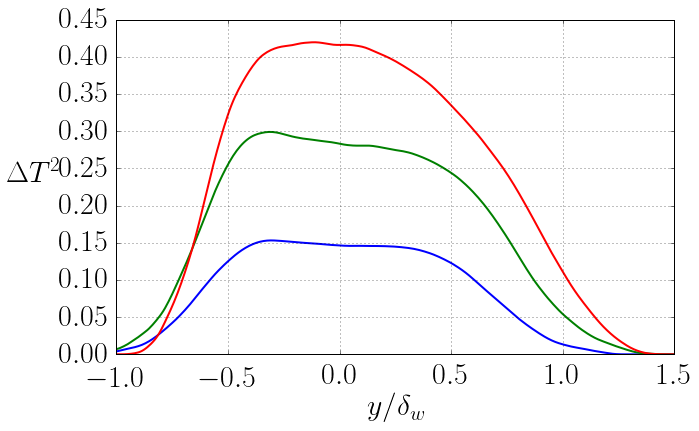

In [111]:
variable = 'Trms' #any vector variable available
scaling  = 'dw' #can be dw r dm
#ylabel =r'$\frac{\partial{\overline{T}}}{\partial{y}} \delta_m / \Delta T$'
ylabel =r'$\frac{\overline{T}^\{\prime}}{\Delta T^2}$'
xlabel=r'$y/\delta_w$'
#figname = 'rhom_ave.eps'
figname = 'TpTm_ave_dw'
derivative = False
PRINT = True



fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
plt.xlabel(xlabel);
plt.ylabel(ylabel,rotation='horizontal',labelpad=25);
if scaling=='dm':
    plt.xlim([-6,10])
else:
    plt.xlim([-1,1.5])
#plt.ylim([0.0,1.1])
plt.grid('on')
for icase in range(1,len(lcases)):
    #print ycases[icase], fSS[icase]
    yxi,fSS,errorSS = getSScase3TT(p_folders,lcases[icase],variable,scaling,SS1j,SS2j,500,derivative)
    yxi,Tm,errorSST = getSScase3TT(p_folders,lcases[icase],'Tm',scaling,SS1j,SS2j,500,derivative)
    #DT = fSS[-1]-fSS[0]
    #Tmin = fSS[0]
    #errorSS = errorSS/vDT[icase]**2
    #DT = np.nanmax(fSS)-np.nanmin(fSS)
    fSS=fSS/Tm
    
    plt.plot(yxi,fSS,l_job_style[icase],lw=2.0)
    #plt.fill_between(yxi,fSS,fSS,alpha=0.1)
    #plt.fill_between(ycases[icase][0], -(fSS[icase]-errorSS[icase]), -(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

#ax.yaxis.label.set_fontsize(30)
#plt.margins(1)
#plt.plot(UselfRM[:,0],-UselfRM[:,1],'o',color=l_case_color[0])
#plt.plot(rhos20pantano[:,0],rhos20pantano[:,1],'o',color=l_case_color[1],markevery=2)
#plt.plot(rhos40pantano[:,0],rhos40pantano[:,1],'o',color=l_case_color[2],markevery=2)
#plt.plot(rhos80pantano[:,0],rhos80pantano[:,1],'o',color=l_case_color[3],markevery=2) 
plt.ylim(bottom=0.0)
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    #Save with STD
    pathname = save_folder + figname + 'std' + fformat
    fig.savefig(pathname,bbox_inches='tight')

figure saved!
/share/drive/toni/VDML/JFM_201706/rhorms_ave_dw.pdf


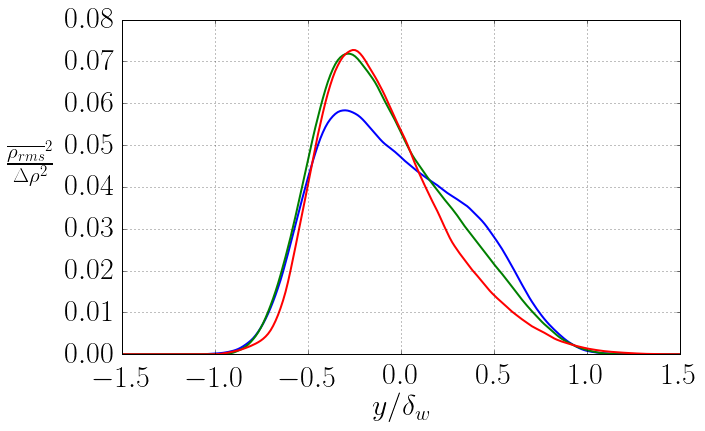

In [142]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname='rhorms_ave_dw'
column=2
for i in range(1,len(cases)):
    #Tmax[i]=1.0/(1-lamb[i])
    #Tmin[i] = 1.0/(1.0+lamb[i])
    #DT[i]=Tmax[i]- Tmin[i]
    #if i == 0:
    #    Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    rhom = stat[i][1,:]
    Drho = rhom[-1]-rhom[0]
    plt.plot(stat[i][0,:],(stat[i][column,:])/Drho**2,lw=l_width,color=l_job_color[i]);plt.grid('on')
    #plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    #plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
#plt.ylim([0.0,0.25])
plt.xlim([-1.5,1.5])

ylabel =r'$\frac{\overline{\rho_{rms}}^2}{\Delta \rho^2}$'
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(ylabel,rotation='horizontal',labelpad=35);
#plt.ylabel(ylabel)
plt.ylim(bottom=0.0)
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    fig.savefig(pathname,bbox_inches='tight')
    print pathname

## Temperature

In [130]:
p_root = '/share/drive/toni/VDML/'
cases = ['s10','s20','s40','s80']
p_folder_stats = [p_root + cases[i]+'/Tstats.txt' for i in range(len(cases))]
stat=[]
for case,i in zip(p_folder_stats,range(len(cases))):
    stat.append(np.loadtxt(case) )
l_width=2.0
l_job_color=['k','b','g','r']

1.0 0.0
0.75 0.75
0.625 1.875
0.5625 3.9375


(-1.0, 1.5)

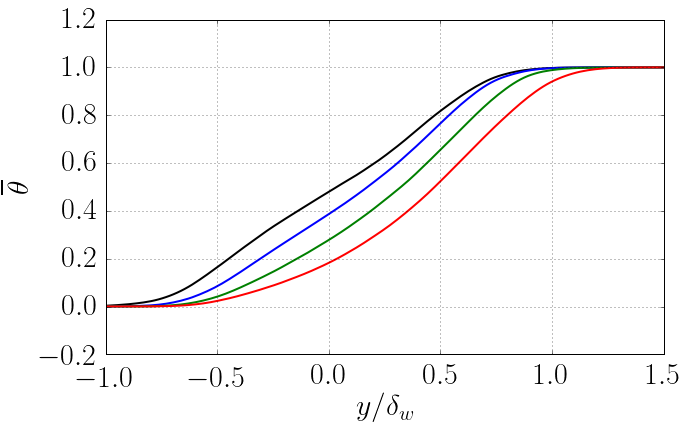

In [131]:
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
lamb = [0 for i in range(len(cases))]
Tmin = [0 for i in range(len(cases))]
Tmax = [0 for i in range(len(cases))]
DT = [0 for i in range(len(cases))]
s = [1,2,4,8]
for i in range(len(cases)):
    lamb[i] = (s[i]-1.0)/(s[i]+1.0)
    Tmax[i]=1.0/(1-lamb[i])
    Tmin[i] = 1.0/(1.0+lamb[i])
    DT[i]=Tmax[i]- Tmin[i]
    print Tmin[i],DT[i]
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    plt.plot(stat[i][0,:],(stat[i][1,:]-Tmin[i])/DT[i],lw=l_width,color=l_job_color[i]);plt.grid('on')
plt.xlabel(r'$y/\delta_w$')
#ylabel=r'$\frac{T-T_{min}}{\Delta T}$'
ylabel=r'$\overline{\theta}}$'
plt.ylabel(ylabel)
plt.xlim([-1.0,1.5])

/usr/local/lib/python2.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in sqrt
  # Remove the CWD from sys.path while we load stuff.


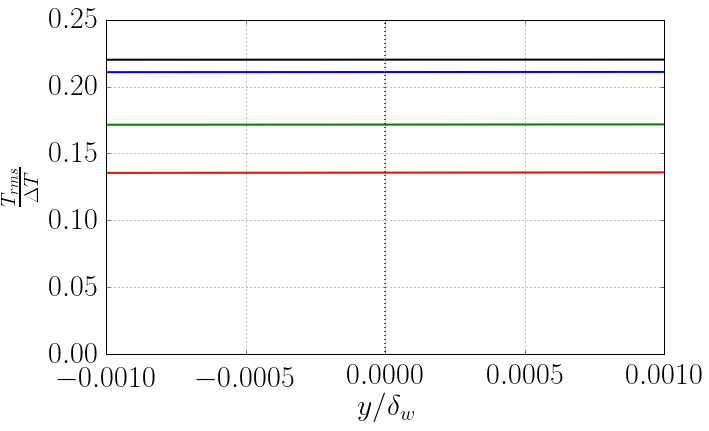

In [132]:
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
column=2
for i in range(len(cases)):
    Tmax[i]=1.0/(1-lamb[i])
    Tmin[i] = 1.0/(1.0+lamb[i])
    DT[i]=Tmax[i]- Tmin[i]
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    plt.plot(stat[i][0,:],(np.sqrt(stat[i][column,:]))/DT[i],lw=l_width,color=l_job_color[i]);plt.grid('on')
    plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
plt.ylim([0.0,0.25])
plt.xlim([np.min(ymin),np.max(ymax)])
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$\frac{T_{rms}}{\Delta T}$')

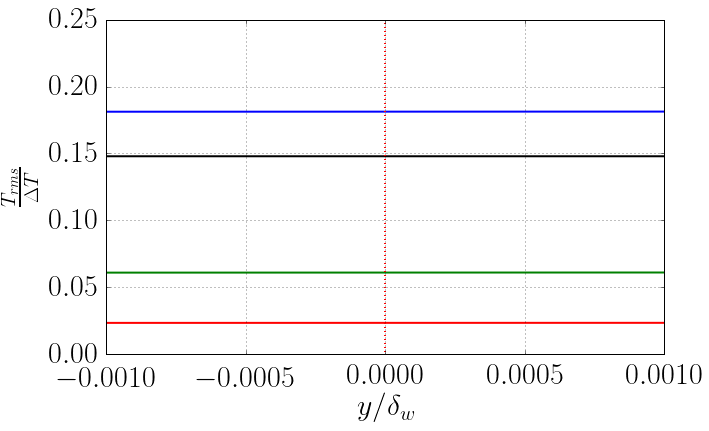

In [129]:
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
column=2
for i in range(len(cases)):
    Tmax[i]=1.0/(1-lamb[i])
    Tmin[i] = 1.0/(1.0+lamb[i])
    DT[i]=Tmax[i]- Tmin[i]
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    plt.plot(stat[i][0,:],(np.sqrt(stat[i][column,:]))/DT[i],lw=l_width,color=l_job_color[i]);plt.grid('on')
    plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
plt.ylim([0.0,0.25])
plt.xlim([np.min(ymin),np.max(ymax)])
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$\frac{T_{rms}}{\Delta T}$')

In [117]:
print SS1,SS2

[380.0, 410.0, 440.0, 550.0] [ 530.  520.  620.  740.]


NameError: name 'Dwcase' is not defined

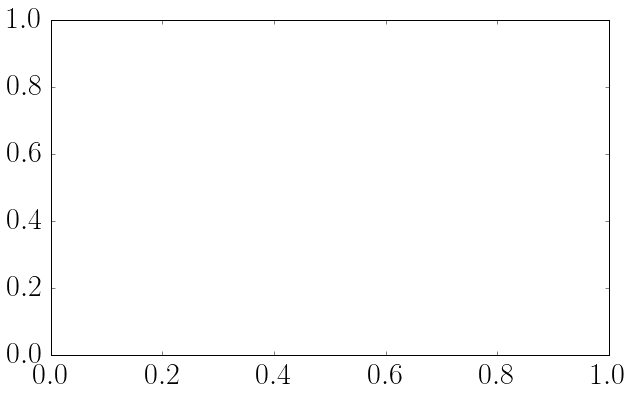

In [118]:
figname = 'skewT_dw2'
column=3
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
for i in range(len(cases)):
    yyy[i,:] = stat[i][0,:]*Dwcase[i]
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    ibot = where(umm[i,:]>mllim*0.5)[0][-1]
    itop = where(umm[i,:]<-mllim*0.5)[0][0]
    if i == 2 or i==3:
        itop=round(itop*1.3)
    print itop
    plt.plot(yyy[i,ibot:itop],(stat[i][column,ibot:itop]),lw=l_width,color=l_job_color[i]);plt.grid('on')    
    #plt.plot(Dwcase[i]*stat[i][0,:],(stat[i][column,:]),lw=l_width,color=l_job_color[i]);plt.grid('on')
    plt.plot([-10.0,10.0],[0.0,0.0],'k--',lw=l_width)
    plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    #plt.plot(Stref[:,0],Stref[:,1],'k*',lw=2.0)
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$S_\theta$')
plt.grid('off')
plt.xlim([np.min(ymin),np.max(ymax)]);plt.ylim([-3,3])
plt.xlim([-1.0,1.25])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    figo.savefig(pathname,bbox_inches='tight')

In [ ]:
column=4
figname = 'kurtT_dw2'
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
for i in range(len(cases)):
    yyy[i,:] = stat[i][0,:]*Dwcase[i]
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    ibot = where(umm[i,:]>mllim*0.5)[0][-1]
    itop = where(umm[i,:]<-mllim*0.5)[0][0]
    itop = where(umm[i,:]<-mllim*0.5)[0][0]
    if i == 2 or i==3:
        itop=round(itop*1.3)
    plt.plot(yyy[i,ibot:itop],(stat[i][column,ibot:itop]),lw=l_width,color=l_job_color[i]);plt.grid('on') 
    plt.plot([-10.0,10.0],[3.0,3.0],'k--',lw=l_width)
    plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    #plt.plot(Ktref[:,0],Ktref[:,1],'k*',lw=2.0)
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$K_\theta$')
plt.grid('off')
plt.xlim([np.min(ymin),np.max(ymax)]);plt.ylim([2,10])
plt.xlim([-1.0,1.25])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    figo.savefig(pathname,bbox_inches='tight')

# Comparison

NameError: name 'Dwcase' is not defined

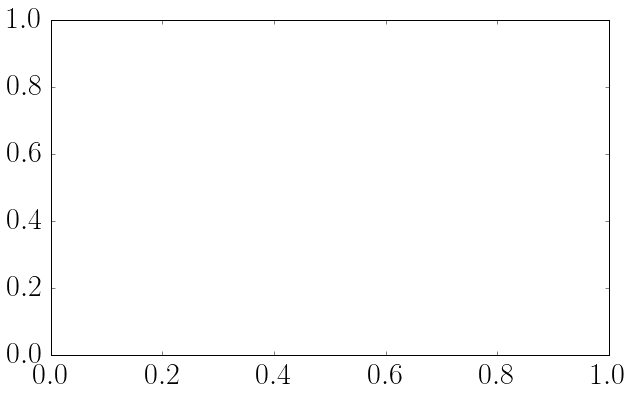

In [119]:
figname = 'skewT_comp'
column=3
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
for i in range(1):
    yyy[i,:] = stat[i][0,:]*Dwcase[i]
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    ibot = where(umm[i,:]>mllim*0.5)[0][-1]
    itop = where(umm[i,:]<-mllim*0.5)[0][0]
    plt.plot(yyy[i,ibot:itop],(stat[i][column,ibot:itop]),lw=l_width,color=l_job_color[i]);plt.grid('on')    
    #plt.plot(Dwcase[i]*stat[i][0,:],(stat[i][column,:]),lw=l_width,color=l_job_color[i]);plt.grid('on')
    plt.plot([-10.0,10.0],[0.0,0.0],'k--',lw=l_width)
    plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot(Stref[:,0],Stref[:,1],'k*',lw=2.0)
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$S_\theta$')
plt.grid('off')
plt.xlim([np.min(ymin),np.max(ymax)]);plt.ylim([-3,3])
plt.xlim([-1.0,1.])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    figo.savefig(pathname,bbox_inches='tight')

In [ ]:
column=4
figname = 'kurtT_comp'
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
for i in range(1):
    yyy[i,:] = stat[i][0,:]*Dwcase[i]
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    ibot = where(umm[i,:]>mllim*0.5)[0][-1]
    itop = where(umm[i,:]<-mllim*0.5)[0][0]
    plt.plot(yyy[i,ibot:itop],(stat[i][column,ibot:itop]),lw=l_width,color=l_job_color[i]);plt.grid('on') 
    plt.plot([-10.0,10.0],[3.0,3.0],'k--',lw=l_width)
    plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot(Ktref[:,0],Ktref[:,1],'k*',lw=2.0)
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$K_\theta$')
plt.grid('off')
plt.xlim([np.min(ymin),np.max(ymax)]);plt.ylim([0,15])
plt.xlim([-1.0,1.0])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    figo.savefig(pathname,bbox_inches='tight')
    print pathname

## U

In [120]:
p_root = '/share/drive/toni/VDML/'
cases = ['s10','s20','s40','s80']
p_folder_stats = [p_root + cases[i]+'/ustats.txt' for i in range(len(cases))]
stat=[]
for case,i in zip(p_folder_stats,range(len(cases))):
    stat.append(np.loadtxt(case) )

NameError: name 'Dwcase' is not defined

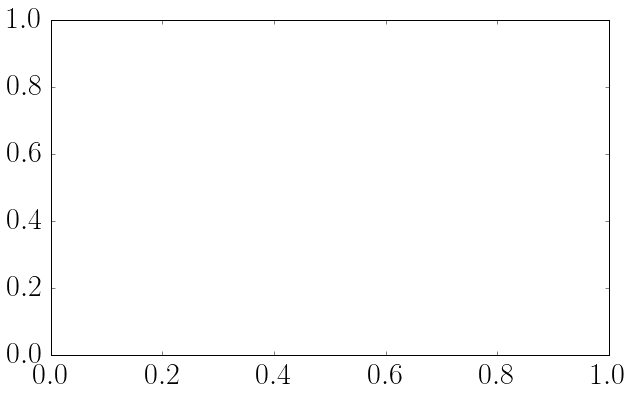

In [121]:
figname = 'skewu_dw2'
column=3
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
umm = np.zeros([shape(stat)[0],shape(stat)[2]])
yyy = np.zeros([shape(stat)[0],shape(stat)[2]])
ymin = np.zeros([shape(stat)[0]])
ymax = np.zeros([shape(stat)[0]])
mllim=0.98
for i in range(len(cases)):
    yyy[i,:] = stat[i][0,:]*Dwcase[i]
    umm[i,:] = stat[i][1,:]
    ibot = where(umm[i,:]>mllim*0.5)[0][-1]
    itop = where(umm[i,:]<-mllim*0.5)[0][0]
    ymin[i]=yyy[i,ibot]
    ymax[i]=yyy[i,itop]
    print ymin[i],ymax[i]
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    plt.plot(yyy[i,ibot:itop],(stat[i][column,ibot:itop]),lw=l_width,color=l_job_color[i]);plt.grid('on')
    plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([-10.0,10.0],[0.0,0.0],'k--',lw=l_width)
    #plt.plot(Suref[:,0],Suref[:,1],'k*',lw=2.0)
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$S_u$')
plt.grid('off')
plt.xlim([np.min(ymin),np.max(ymax)]);plt.ylim([-3,3])
plt.xlim([-1,1.25])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    figo.savefig(pathname,bbox_inches='tight')

IndexError: index -1 is out of bounds for axis 0 with size 0

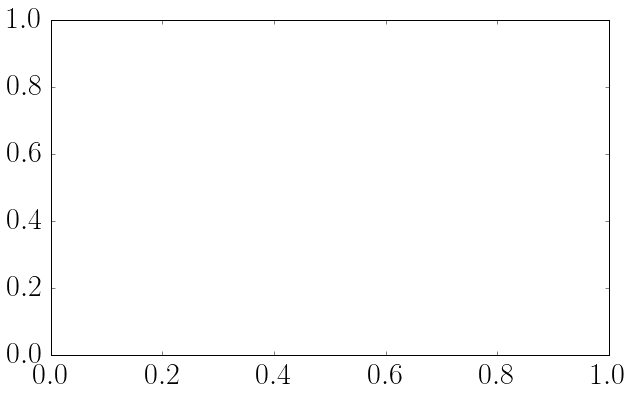

In [122]:
column=4
figname = 'kurtu_dw2'
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
for i in range(len(cases)):
    ibot = where(umm[i,:]>mllim*0.5)[0][-1]
    itop = where(umm[i,:]<-mllim*0.5)[0][0]
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    plt.plot(Dwcase[i]*stat[i][0,ibot:itop],(stat[i][column,ibot:itop]),lw=l_width,color=l_job_color[i]);plt.grid('on')
    plt.plot([-10.0,10.0],[3.0,3.0],'k--',lw=l_width)
    plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$K_u$')
plt.grid('off')
plt.xlim([np.min(ymin),np.max(ymax)]);plt.ylim([2,10])
plt.xlim([-1,1.25])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    figo.savefig(pathname,bbox_inches='tight')

# Comparison

NameError: name 'Dwcase' is not defined

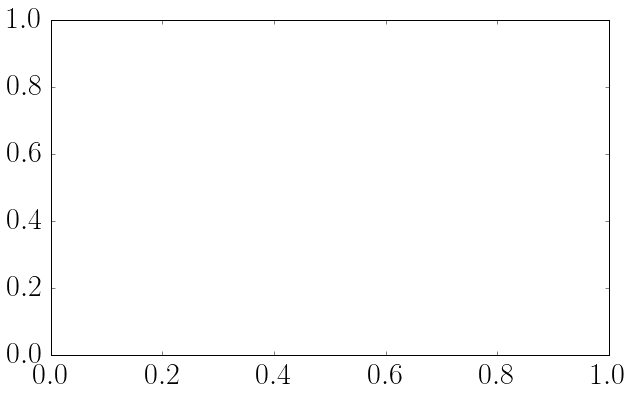

In [123]:
figname = 'skewu_comp'
column=3
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
for i in range(1):
    yyy[i,:] = stat[i][0,:]*Dwcase[i]
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    ibot = where(umm[i,:]>mllim*0.5)[0][-1]
    itop = where(umm[i,:]<-mllim*0.5)[0][0]
    plt.plot(yyy[i,ibot:itop],(stat[i][column,ibot:itop]),lw=l_width,color=l_job_color[i]);plt.grid('on')    
    #plt.plot(Dwcase[i]*stat[i][0,:],(stat[i][column,:]),lw=l_width,color=l_job_color[i]);plt.grid('on')
    plt.plot([-10.0,10.0],[0.0,0.0],'k--',lw=l_width)
    plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot(Suref[:,0],Suref[:,1],'k*',lw=2.0)
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$S_u$')
plt.grid('off')
plt.xlim([np.min(ymin),np.max(ymax)]);plt.ylim([-3,3])
plt.xlim([-1.0,1.])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    figo.savefig(pathname,bbox_inches='tight')

NameError: name 'Dwcase' is not defined

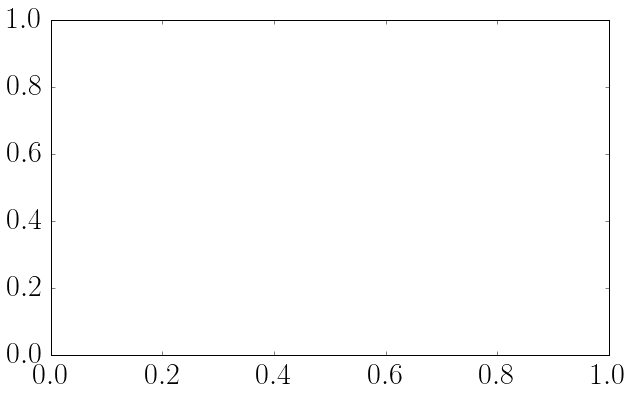

In [124]:
column=4
figname = 'kurtu_comp'
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
for i in range(1):
    yyy[i,:] = stat[i][0,:]*Dwcase[i]
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    ibot = where(umm[i,:]>mllim*0.5)[0][-1]
    itop = where(umm[i,:]<-mllim*0.5)[0][0]
    plt.plot(yyy[i,ibot:itop],(stat[i][column,ibot:itop]),lw=l_width,color=l_job_color[i]);plt.grid('on') 
    plt.plot([-10.0,10.0],[3.0,3.0],'k--',lw=l_width)
    plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot(Kuref[:,0],Kuref[:,1],'k*',lw=2.0)
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$K_u$')
plt.grid('off')
plt.xlim([np.min(ymin),np.max(ymax)]);plt.ylim([0,15])
plt.xlim([-1.0,1.0])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    figo.savefig(pathname,bbox_inches='tight')

# $v$

In [125]:
p_root = '/share/drive/toni/VDML/'
cases = ['s10','s20','s40','s80']
p_folder_stats = [p_root + cases[i]+'/vstats.txt' for i in range(len(cases))]
stat=[]
for case,i in zip(p_folder_stats,range(len(cases))):
    stat.append(np.loadtxt(case) )

NameError: name 'Dwcase' is not defined

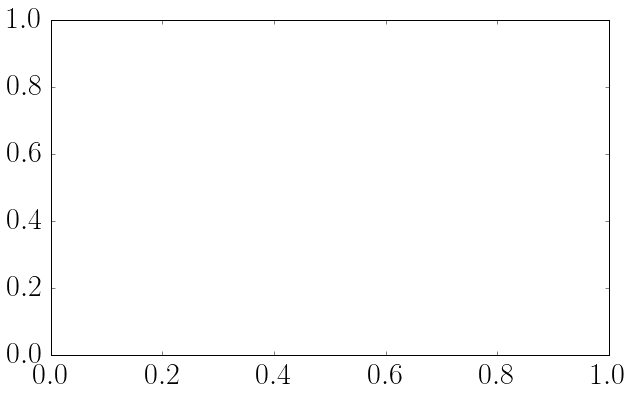

In [126]:
figname = 'skewv_dw2'
column=3
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
for i in range(len(cases)):
    yyy[i,:] = stat[i][0,:]*Dwcase[i]
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    ibot = where(umm[i,:]>mllim*0.5)[0][-1]
    itop = where(umm[i,:]<-mllim*0.5)[0][0]
    plt.plot(yyy[i,ibot:itop],(stat[i][column,ibot:itop]),lw=l_width,color=l_job_color[i]);plt.grid('on')    
    #plt.plot(Dwcase[i]*stat[i][0,:],(stat[i][column,:]),lw=l_width,color=l_job_color[i]);plt.grid('on')
    plt.plot([-10.0,10.0],[0.0,0.0],'k--',lw=l_width)
    plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$S_v$')
plt.grid('off')
plt.xlim([np.min(ymin),np.max(ymax)]);plt.ylim([-3,3])
plt.xlim([-1.0,1.25])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    figo.savefig(pathname,bbox_inches='tight')

In [ ]:
column=4
figname = 'kurtv_dw2'
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
for i in range(len(cases)):
    yyy[i,:] = stat[i][0,:]*Dwcase[i]
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    ibot = where(umm[i,:]>mllim*0.5)[0][-1]
    itop = where(umm[i,:]<-mllim*0.5)[0][0]
    plt.plot(yyy[i,ibot:itop],(stat[i][column,ibot:itop]),lw=l_width,color=l_job_color[i]);plt.grid('on') 
    plt.plot([-10.0,10.0],[3.0,3.0],'k--',lw=l_width)
    plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$K_v$')
plt.grid('off')
plt.xlim([np.min(ymin),np.max(ymax)]);plt.ylim([2,10])
plt.xlim([-1.0,1.25])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    figo.savefig(pathname,bbox_inches='tight')

# Comparison

NameError: name 'Dwcase' is not defined

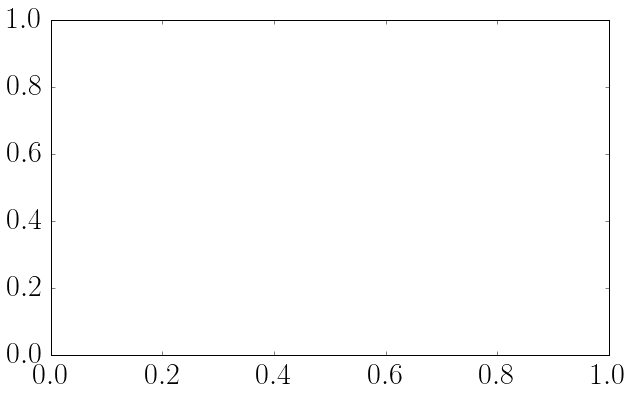

In [127]:
figname = 'skewv_comp'
column=3
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
for i in range(1):
    yyy[i,:] = stat[i][0,:]*Dwcase[i]
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    ibot = where(umm[i,:]>mllim*0.5)[0][-1]
    itop = where(umm[i,:]<-mllim*0.5)[0][0]
    plt.plot(yyy[i,ibot:itop],(stat[i][column,ibot:itop]),lw=l_width,color=l_job_color[i]);plt.grid('on')    
    #plt.plot(Dwcase[i]*stat[i][0,:],(stat[i][column,:]),lw=l_width,color=l_job_color[i]);plt.grid('on')
    plt.plot([-10.0,10.0],[0.0,0.0],'k--',lw=l_width)
    plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot(Svref[:,0],Svref[:,1],'k*',lw=2.0)
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$S_v$')
plt.grid('off')
plt.xlim([np.min(ymin),np.max(ymax)]);plt.ylim([-3,3])
plt.xlim([-1.0,1.])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    figo.savefig(pathname,bbox_inches='tight')

figure saved!


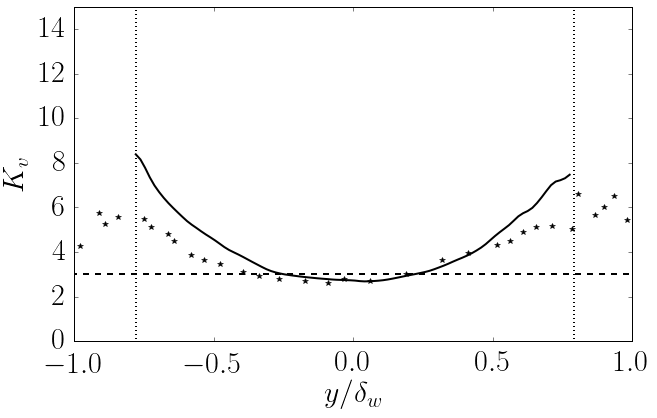

In [58]:
column=4
figname = 'kurtv_comp'
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
for i in range(1):
    yyy[i,:] = stat[i][0,:]*Dwcase[i]
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    ibot = where(umm[i,:]>mllim*0.5)[0][-1]
    itop = where(umm[i,:]<-mllim*0.5)[0][0]
    plt.plot(yyy[i,ibot:itop],(stat[i][column,ibot:itop]),lw=l_width,color=l_job_color[i]);plt.grid('on') 
    plt.plot([-10.0,10.0],[3.0,3.0],'k--',lw=l_width)
    plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot(Kvref[:,0],Kvref[:,1],'k*',lw=2.0)
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$K_v$')
plt.grid('off')
plt.xlim([np.min(ymin),np.max(ymax)]);plt.ylim([0,15])
plt.xlim([-1.0,1.0])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    figo.savefig(pathname,bbox_inches='tight')

# w

In [59]:
p_root = '/share/drive/toni/VDML/'
cases = ['s10','s20','s40','s80']
p_folder_stats = [p_root + cases[i]+'/wstats.txt' for i in range(len(cases))]
stat=[]
for case,i in zip(p_folder_stats,range(len(cases))):
    stat.append(np.loadtxt(case) )

figure saved!


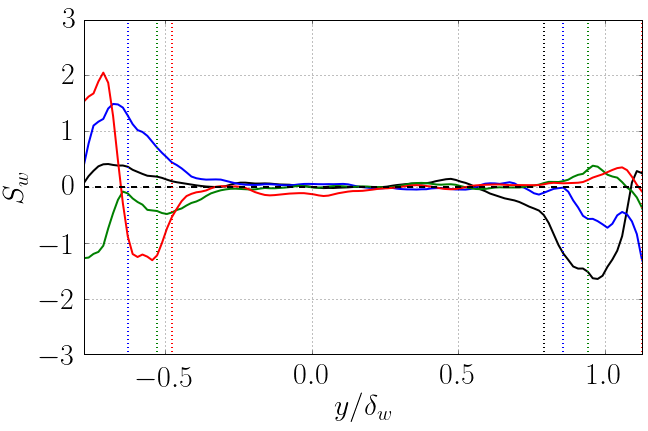

In [60]:
figname = 'skeww_dw'
column=3
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
for i in range(len(cases)):
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    plt.plot(stat[i][0,:],(stat[i][column,:]),lw=l_width,color=l_job_color[i]);plt.grid('on')
    plt.plot([-2.0,2.0],[0.0,0.0],'k--',lw=l_width)
    plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$S_w$')
plt.xlim([np.min(ymin),np.max(ymax)]);plt.ylim([-3,3])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    figo.savefig(pathname,bbox_inches='tight')

figure saved!
/share/drive/toni/VDML/JFM_201706/kurtw_dw.pdf


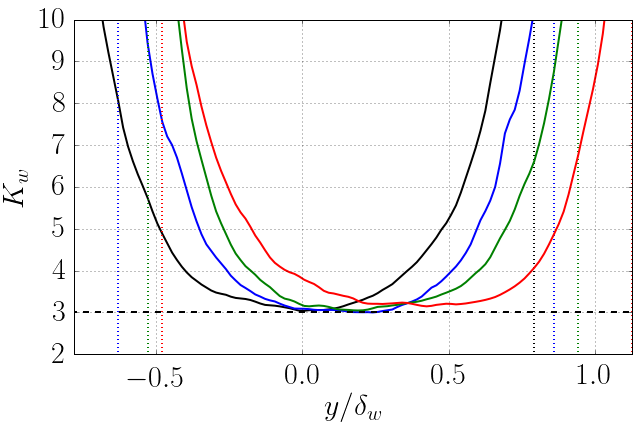

In [61]:
column=4
figname = 'kurtw_dw'
figo = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=figo.add_subplot(1,1,1)
for i in range(len(cases)):
    if i == 0:
        Tmin[i]=0;Tmax[i]=1.0;DT[i]=1.0
    plt.plot(stat[i][0,:],(stat[i][column,:]),lw=l_width,color=l_job_color[i]);plt.grid('on')
    plt.plot([-2.0,2.0],[3.0,3.0],'k--',lw=l_width)
    plt.plot([ymin[i],ymin[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
    plt.plot([ymax[i],ymax[i]],[-5,20],color=l_job_color[i],ls='dotted',lw=2.0)
plt.xlabel(r'$y/\delta_w$')
plt.ylabel(r'$K_w$')
plt.xlim([np.min(ymin),np.max(ymax)]);plt.ylim([2,10])
if PRINT == True:
    print "figure saved!"
    pathname = save_folder + figname + fformat
    figo.savefig(pathname,bbox_inches='tight')
    print pathname

# SPECTRA

In [128]:
vDT = [1.0, 0.7499999999999998, 1.875, 3.9375]

In [129]:
Tmin=[0, 0.75, 0.625, 0.5625]
vTmin = Tmin

# Prepare paths to planes to read

In [130]:
lcases = [[0,1,2,3],[4,5,6,7],[8,9,10,11],[12,13,14,15]]
#lcases = [[0],[4],[8],[12]]

In [131]:
fnplane='mid'
p_folders_spe = []
vplanes=[]
nmaxplanes=[]
for ijob,path in zip(range(len(p_folders)),p_folders):
    print ijob
    p_folders_spe.append(path[0:-5]+fnplane+'.spes')
    #p_folders_spe[ijob]=path[0:-5]+fnplane+'.spes'
    print p_folders_spe[ijob]
    path = p_folders_spe[ijob]
    with h5py.File(path,"r") as f:
        v=np.array(f['jsp'])
        vplanes.append(v)
        nmaxplanes.append(len(v))
    #New sorted planes trick
    vplanes[ijob]=sorted(vplanes[ijob])
print vplanes
print nmaxplanes
#scaling = 'dm'
p_folders_spe=[['']*nmaxplanes[ijob] for ijob in range(len(p_folders))]
for ijob,path in zip(range(len(p_folders)),p_folders):
    with h5py.File(path,"r") as g:
        my = len(np.array(g['y']))
        time=np.array(g['time'])
        dd=np.array(g[scaling])
        midplane = my/2+1
        #print "midplane=%s"%midplane
    for nplane,jj in zip(vplanes[ijob],range(nmaxplanes[ijob])):
        if nplane==midplane: #Lastplane
            #print "This is midplane"
            fnplane='mid'
        else:
            fnplane="%03d"%nplane
        p_folders_spe[ijob][jj]=path[0:-5]+fnplane+'.spes'
        #print "Reading spe file: %s" %(pathSPE)

0
/share/drive/toni/VDML/s10/02/h5.mid.spes
1
/share/drive/toni/VDML/s10/03/h5.mid.spes
2
/share/drive/toni/VDML/s10/04/newman/h5.mid.spes
3
/share/drive/toni/VDML/s10/06/h5.mid.spes
4
/share/drive/toni/VDML/s20/01/h5.mid.spes
5
/share/drive/toni/VDML/s20/02/h5.mid.spes
6
/share/drive/toni/VDML/s20/03/h5.mid.spes
7
/share/drive/toni/VDML/s20/04/h5.mid.spes
8
/share/drive/toni/VDML/s40/01/h5.mid.spes
9
/share/drive/toni/VDML/s40/02/h5.mid.spes
10
/share/drive/toni/VDML/s40/03/h5.mid.spes
11
/share/drive/toni/VDML/s40/04/h5.mid.spes
12
/share/drive/toni/VDML/s80/01/h5.mid.spes
13
/share/drive/toni/VDML/s80/02/h5.mid.spes
14
/share/drive/toni/VDML/s80/03/h5.mid.spes
15
/share/drive/toni/VDML/s80/04/h5.mid.spes
[[125, 145, 165, 185, 205, 225, 245, 265, 285, 305, 325, 345, 365, 385, 405, 426, 445, 465, 485, 505, 525, 545, 565, 585, 605, 625, 645, 665, 685, 705, 725], [125, 145, 165, 185, 205, 225, 245, 265, 285, 305, 325, 345, 365, 385, 405, 426, 445, 465, 485, 505, 525, 545, 565, 585, 605,

In [132]:
#sumaxis=0 #sum z -> then you get x
sumaxis=0
scaling = 'dw'
Nydbins = 31;
if scaling=='dw':
    ydmin = -2
    ydmax = 2 
    ydbin = np.linspace(ydmin,ydmax,Nydbins)
else: 
    print "I do not recommend using dm..."
    
#matrix = np.zeros([Nkbins,Nydbins])
#countM = np.zeros([Nkbins,Nydbins])
#kmax = 0.0;
m_time  =[]#for ijob
m_delta =[] #for ijob
m_y     =[] #for ijob

m_ydbin =[]
m_kdbin =[]
m_spectra = []
m_count =[]
m_f00 = []
m_count00 = []
for icase in range(ncases):
    dmin = 100;
    dmax = 0;
    for ijob in lcases[icase]:
        tmin = SS1j[ijob]
        tmax = SS2j[ijob]
        path = p_folders[ijob]
        with h5py.File(path,"r") as f:
            time  = np.array(f['time'])
            y   = np.array(f['y'])
            delta = np.array(f[scaling] )
            alp = np.array(f['alp'])
            bet = np.array(f['bet'])
            it1 = where(time>=tmin)[0][0]
            it2 = where(time>=tmax)[0][0]
            m_y.append(y)
            m_delta.append(delta)
            m_time.append(time)
        dmax = max(delta[it1],dmax)
        dmin = min(delta[it1],dmin)
        #dmin = min(delta[it2],dmin)
        #TEST 2
        #dmax = max(delta[it2],dmax)
    if sumaxis ==0:
        nx = 512
        m = 256
        k1 = alp*dmax
        #print k1
        kdend = k1*(m-1)
        kdbin = np.linspace(0,kdend,m)
        #print kdbin[1]
        #kdend = m*alp*dmax
        #kdbin = np.linspace(0,kdend,m)
       
    else:
        nz=192
        m =64
        k1 = bet*dmax
        kdend = k1*(m-1)
        #kdend = m*bet*dmax
        kdbin = np.linspace(0,kdend,m)
    print "Largest structure = %s, smallest = %s" %(2*np.pi/kdbin[1],2*np.pi/kdbin[-1])
    m_ydbin.append(ydbin)
    m_kdbin.append(kdbin)
    
    m_spectra.append(np.zeros([len(ydbin),len(kdbin)]))
    m_count.append(np.zeros([len(ydbin),len(kdbin)]))
    m_f00.append(np.zeros(len(ydbin)))
    m_count00.append(np.zeros(len(ydbin)))
#print "lambda min = %s, lambda max=%s"%(np.min(lbin),np.max(lbin))
#print kbin/np.min(np.diff(kbin))

Largest structure = 13.618761755, smallest = 0.053406909885
Largest structure = 14.9763191952, smallest = 0.058730662987
Largest structure = 12.3363528393, smallest = 0.0483778544052
Largest structure = 13.1191841958, smallest = 0.051447779691


In [133]:
lnamevariable=['u','v','w','uvre','uvim','ome1','ome2','ome3','rhou','rhov','rhow','T']
#variable = 0 #u
variable = 1 #v
variable=11#T
fformat = '.pdf'
figname = 'yvslambdaE'+lnamevariable[variable]*2
#figname = 'yvslambdazE'+lnamevariable[variable]*2
print figname

yvslambdaETT


In [57]:


    #for icases in range(ncases):
for icase in [0,1,2,3]:
#for icase in [0]:
    print np.shape(m_spectra[icase])
    ydbin = m_ydbin[icase]
    kdbin = m_kdbin[icase]
    m_spectra[icase]=np.zeros([len(ydbin),len(kdbin)])
    m_count[icase]=np.zeros([len(ydbin),len(kdbin)])
    for ijob in lcases[icase]:
        tmin=SS1j[ijob]
        tmax=SS2j[ijob]
        it1 = where(time>=tmin)[0][0]
        it2 = where(time>=tmax)[0][0]
        path = p_folders[ijob]
        y = m_y[ijob]
        for nplane in range(0,nmaxplanes[ijob]):
            path = p_folders_spe[ijob][nplane] 
            with h5py.File(path,"r") as f:
                funSPE = np.array(f['SPEC'][:,variable,:,it1:it2]);
                fun00 = np.array(f['SPEC'][0,variable,0,it1:it2]);
                if sumaxis ==0:
                    kv = np.array(f['kx'])
                else:
                    kv = np.array(f['kz'])
            funSPE[0,0,:]=0.0 #Clean 00 mode
            fun = np.sum(funSPE,axis=sumaxis)
            #print np.shape(fun)
            #print path
            #print plane_y
            plane_y = y[vplanes[ijob][nplane]]
            for it in range(it1,it2):
                ii = np.digitize(plane_y/m_delta[ijob][it],ydbin,right=False)
                m_f00[icase][ii-1] += fun00[it-it1]
                m_count00[icase][ii-1]+=1
                for ikv in range(len(kv)):
                    jj = np.digitize(kv[ikv]*m_delta[ijob][it],kdbin,right=False)
                    m_spectra[icase][ii-1,jj-1] += fun[ikv,it-it1]
                    m_count[icase][ii-1,jj-1] += 1

(31, 256)


KeyboardInterrupt: 

In [521]:
Lx=461
Lz=173
m_Lxdelta=[]
m_Lzdelta=[]
for icase in range(ncases):
    dmax = 0.0
    for ijob in lcases[icase]:
        itmax = np.where(m_time[ijob]>=SS1j[ijob])[0][0]
        dmax = max(dmax,m_delta[ijob][itmax])
    print dmax
    m_Lxdelta.append(Lx/dmax)
    m_Lzdelta.append(Lz/dmax)

33.8502832479
30.7818605905
37.3691453541
35.1393027286


In [522]:
#Divide by count
m_Ruu = []
for icase in [0,1,2,3]:
    lenx,leny = np.shape(m_spectra[icase])
    for i in range(lenx):
        m_f00[icase][i] = m_f00[icase][i]/m_count00[icase][i]
        for j in range(leny):
            if m_count[icase][i,j]==0:
                m_count[icase][i,j] = 1
            m_spectra[icase][i,j]=m_spectra[icase][i,j]/m_count[icase][i,j]
    m_Ruu.append(np.sum(m_spectra[icase],axis=1))
#NOW lets normalize the eneregy in the 0,k modes by the integral of the spectrum at each plane
#for icase in range(ncases):
#    for iydbin in range(len(m_ydbin[icase])):
#        m_spectra[icase][iydbin,0] = m_spectra[icase][iydbin,0]/np.sum(m_spectra[icase][iydbin,:])

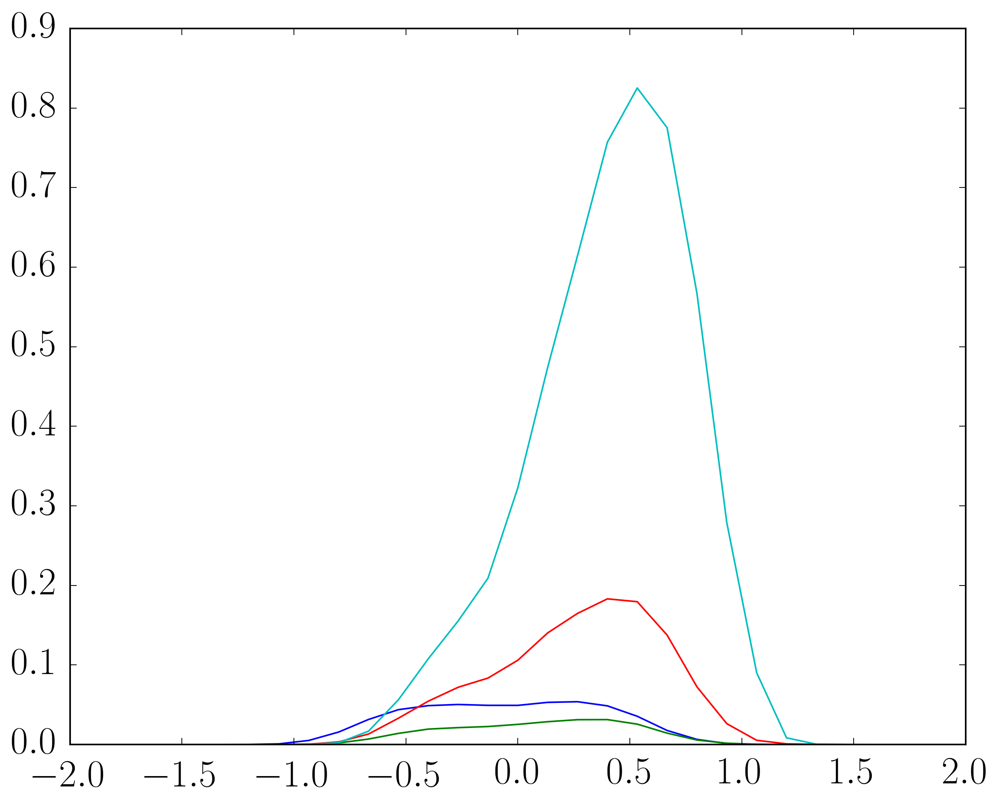

In [523]:
for icase in [0,1,2,3]:
    #plt.plot(ydbin,m_Ruu[icase])
    plt.plot(ydbin,m_Ruu[icase])

In [524]:
for icase in range(ncases):
    fname = save_folder+'spectra2_'+lnamevariable[variable]+'_'+str(sumaxis)+'_s'+'%0i'%vs[icase]+'.h5'
    print fname
    with h5py.File(fname,"w",libver='latest') as f:
        f['ydbin'] = m_ydbin[icase]
        f['kdbin'] = m_kdbin[icase]
        f['spectra'] = m_spectra[icase]
    #np.savetxt(fname,[np.transpose(m_ydbin[icase]),np.transpose(m_kdbin[icase]),np.transpose(m_spectra[icase])])

/share/drive/toni/VDML/JFM/spectra2_T_1_s1.h5
/share/drive/toni/VDML/JFM/spectra2_T_1_s2.h5
/share/drive/toni/VDML/JFM/spectra2_T_1_s4.h5
/share/drive/toni/VDML/JFM/spectra2_T_1_s8.h5


# READ

In [160]:
#Loading cases
lnamevariable=['u','v','w','uvre','uvim','ome1','ome2','ome3','rhou','rhov','rhow','T']
lnameaxis=['x','z']
variable =11
#variable = 0
#emax = 0.005
emax = 0.01
dmflag = False
sumaxis = 1
numin = 0.2
nummin = 0.2
nummax = 0.4
figname = 'spec_%s_%s'%(lnamevariable[variable],lnameaxis[sumaxis])
print figname

spec_T_z


In [161]:
read_folder = '/share/drive/toni/VDML/JFM/'
for icase in range(ncases):
    fname = read_folder+'spectra_'+lnamevariable[variable]+'_'+str(sumaxis)+'_s'+'%0i'%vs[icase]+'.h5'
    #fname = save_folder+'spectra2_'+lnamevariable[variable]+'_'+str(sumaxis)+'_s'+'%0i'%vs[icase]+'.h5'
    print fname
    with h5py.File(fname,"r",libver='latest') as f:
        m_ydbin[icase]   = np.array(f['ydbin'] )
        m_kdbin[icase]   = np.array(f['kdbin'] )
        m_spectra[icase] = np.array(f['spectra'])
    #np.savetxt(fname,[np.transpose(m_ydbin[icase]),np.transpose(m_kdbin[icase]),np.transpose(m_spectra[icase])])

/share/drive/toni/VDML/JFM/spectra_T_1_s1.h5
/share/drive/toni/VDML/JFM/spectra_T_1_s2.h5
/share/drive/toni/VDML/JFM/spectra_T_1_s4.h5
/share/drive/toni/VDML/JFM/spectra_T_1_s8.h5


In [162]:
#Divide by count
m_Ruu = []
for icase in [0,1,2,3]:
    lenx,leny = np.shape(m_spectra[icase])
    m_Ruu.append(np.sum(m_spectra[icase],axis=1))
#NOW lets normalize the eneregy in the 0,k modes by the integral of the spectrum at each plane
#for icase in range(ncases):
#    for iydbin in range(len(m_ydbin[icase])):
#        m_spectra[icase][iydbin,0] = m_spectra[icase][iydbin,0]/np.sum(m_spectra[icase][iydbin,:])

maximorum=0.0288281743373
levels=[0.0057656348674605378, 0.011531269734921076]
40\%
/share/drive/toni/VDML/JFM_201706/spec_T_z_40_.pdf figure saved!


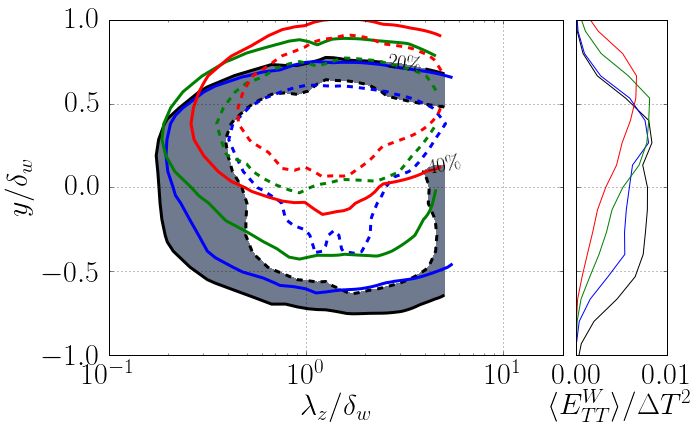

In [163]:
from matplotlib import gridspec
from scipy.interpolate import griddata
#figname = 'yvslambdaE'+lnamevariable[variable]*2
maximorum = 0.0
if variable == 11:
    fact = np.divide(1,np.multiply(vDT,vDT))
else:
    fact = np.ones(len(vDT))
    
for icase in [0,1,2,3]:
    kk = m_kdbin[icase][1:]*m_spectra[icase][:,1:]*fact[icase]
    maximorum =max(np.max(kk),maximorum)
        
print "maximorum=%s"%maximorum 


# plot it
fig = plt.figure(figsize=(xlen,ylen))
#fig = plt.figure(figsize=(8, 6)) 
gs = gridspec.GridSpec(1, 2, width_ratios=[5, 1]) 
ax = plt.subplot(gs[0])
#ax0.plot(x, y)
ax2 = plt.subplot(gs[1],sharey=ax)
#ax1.plot(y, x)
plt.setp(ax2.get_yticklabels(), visible=False)
gs.update(wspace=0.05)
    
#fig,(ax,ax2) = plt.subplots(1,2,sharey=True)
#ax = fig.add_subplot(111)
ax.grid('on')
ax2.grid('on')
vcolors=['black','blue','green','red']

ax.set_xscale('log')
ax.set_xlabel(r'$\lambda_%s / \delta_w$'%(lnameaxis[sumaxis]))
ax.set_ylabel(r'$y/\delta_w$')
ax.set_ylim([-1.,1.])
ax.set_xlim([0.1,20])
if dmflag == True:
    ax.set_xlabel(r'$\lambda_%s / \delta_m$'%(lnameaxis[sumaxis]))
    ax.set_ylabel(r'$y/\delta_m$')
    ax.set_ylim([-10.,10])
    ax.set_xlim([1,200])

origin = 'lower'
#Special for s=1
f0max=0.0

levels=[maximorum*nummin,maximorum*nummax]
print "levels=%s"%(levels)

icase=0
deltamax=0.0
Z2 = m_kdbin[icase][1:]*m_spectra[icase][:,1:]*fact[icase]
#Interpolate to grid
Np = 43
method='linear'
x = 2*np.pi/m_kdbin[icase][1:]
y = m_ydbin[icase]


kxi = np.linspace(np.min(x),np.max(x),Np)
ydi = np.linspace(np.min(y),np.max(y),Np)
y2 = y + np.diff(y)[0]*0.5
XI,YI = np.meshgrid(kxi,ydi)
X2,Y2 = np.meshgrid(x,y2)

zi = griddata((X2.flatten(),Y2.flatten()),Z2.flatten(),(XI,YI),method=method)

f0 = m_spectra[icase][:,0]*fact[icase]
if dmflag == True:
    CS4=ax.contourf(kxi*nDw[0],ydi*nDw[0],zi,levels=levels,                  #alpha=0.5,
                      cmap=plt.cm.bone,origin=origin)
    CSF=ax.contour(kxi*nDw[0],ydi*nDw[0],zi,linestyles=(['solid','dashed']),\
                     linewidths=(3,),levels=levels,colors=vcolors[icase],hold='on')
    ax2.plot(f0,m_ydbin[icase]*nDw[0],vcolors[icase])
else:
    CS4=ax.contourf(kxi,ydi,zi,levels=levels,                  #alpha=0.5,
                      cmap=plt.cm.bone,origin=origin)
    CSF=ax.contour(kxi,ydi,zi,linestyles=(['solid','dashed']),\
                     linewidths=(3,),levels=levels,colors=vcolors[icase],hold='on')
    ax2.plot(f0,m_ydbin[icase],vcolors[icase])
fmt = {}
strsmin= r'%s'%(str(int(100*nummin))) + '\%'
strsmax = r'%s'%(str(int(100*nummax))) + '\%'
print strsmax
strs = [strsmin,strsmax]
for l, s in zip(CSF.levels, strs):
    fmt[l] = s
# Label every other level using strings
ax.clabel(CSF, CSF.levels[::1], inline=True, fmt=fmt, fontsize=20)



for icase in [1,2,3]:
    Z2 = m_kdbin[icase][1:]*m_spectra[icase][:,1:]*fact[icase]
    #Interpolate to grid
    x = 2*np.pi/m_kdbin[icase][1:]
    y = m_ydbin[icase]
    kxi = np.linspace(np.min(x),np.max(x),Np)
    ydi = np.linspace(np.min(y),np.max(y),Np)
    XI,YI = np.meshgrid(kxi,ydi)
    X2,Y2 = np.meshgrid(x,y)
    zi = griddata((X2.flatten(),Y2.flatten()),Z2.flatten(),(XI,YI),method=method)
    f0 = m_spectra[icase][:,0]*fact[icase]
    if dmflag == True:
        CSF=ax.contour(kxi*nDw[icase],ydi*nDw[icase],zi,linestyles=(['solid','dashed']),\
                    linewidths=(3,),levels=levels,colors=vcolors[icase],hold='on')
        ax2.plot(f0,m_ydbin[icase]*nDw[icase],vcolors[icase])
    else:
        CSF=ax.contour(kxi,ydi,zi,linestyles=(['solid','dashed']),\
                     linewidths=(3,),levels=levels,colors=vcolors[icase],hold='on')
        ax2.plot(f0,m_ydbin[icase],vcolors[icase])
    
    
#ax2.set_ylim([-1.0,1.5])

ax2.set_xlim([0,emax])
ax2.set_xticks([0,emax])

if sumaxis == 0:
    if variable==0:
        ax2.set_xlabel(r'$\langle E_{uu}^L \rangle /\Delta U^2$')
    if variable==1:
        ax2.set_xlabel(r'$\langle E_{vv}^L \rangle /\Delta U^2$')
    if variable==2:
        ax2.set_xlabel(r'$\langle E_{ww}^L \rangle /\Delta U^2$')
    if variable == 11:
        ax2.set_xlabel(r'$\langle E_{TT}^L \rangle /\Delta T^2$')
else:
    if variable==0:
        ax2.set_xlabel(r'$\langle E_{uu}^W \rangle /\Delta U^2$')
    if variable==1:
        ax2.set_xlabel(r'$\langle E_{vv}^W \rangle /\Delta U^2$')
    if variable==2:
        ax2.set_xlabel(r'$\langle E_{ww}^W \rangle /\Delta U^2$')
    if variable == 11:
        ax2.set_xlabel(r'$\langle E_{TT}^W \rangle /\Delta T^2$')
pathname = save_folder + figname +'_%s_'%(str(int(100*nummax)))+ fformat
#pathname = save_folder + figname +'_50_'+ fformat
print "%s figure saved!"%pathname
#plt.tight_layout(fig) 
fig.savefig(pathname,bbox_inches='tight')

#f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
#ax1.plot(x, y)
#ax1.set_title('Sharing Y axis')
#ax2.scatter(x, y)

# For z

levels=[0.1, 0.9]
(25, 255)
/share/drive/toni/VDML/JFM/yvslambdaEscaledvv.eps figure saved!


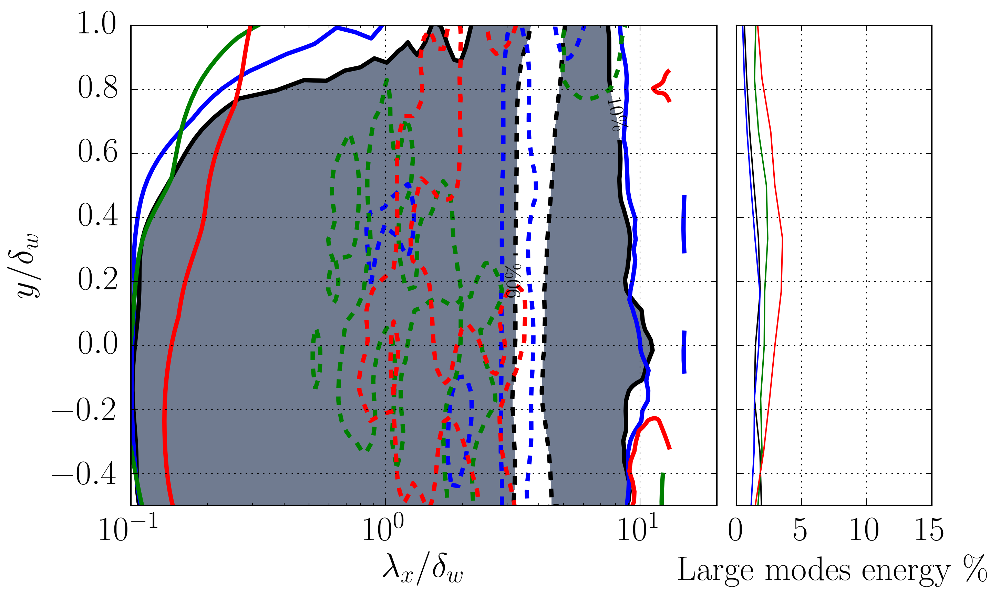

In [116]:
from matplotlib import gridspec
figname = 'yvslambdaEscaled'+lnamevariable[variable]*2
maximorum = 0.0

# plot it
fig = plt.figure(figsize=(xlen,ylen))
#fig = plt.figure(figsize=(8, 6)) 
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1]) 
ax = plt.subplot(gs[0])
#ax0.plot(x, y)
ax2 = plt.subplot(gs[1],sharey=ax)
#ax1.plot(y, x)
plt.setp(ax2.get_yticklabels(), visible=False)
gs.update(wspace=0.05)
    
#fig,(ax,ax2) = plt.subplots(1,2,sharey=True)
#ax = fig.add_subplot(111)
ax.grid('on')
ax2.grid('on')
vcolors=['black','blue','green','red']
ax.set_ylim([-0.5,1])
ax.set_xscale('log')
ax.set_xlabel(r'$\lambda_x / \delta_w$')
ax.set_ylabel(r'$y/\delta_w$')
ax.set_xlim([0.1,20])
origin = 'lower'
#Special for s=1
f0max=0.0
levels=[0.1,0.9]
print "levels=%s"%(levels)
icase=0


#Interpolate to grid
Np = 128
method='cubic'

Z2 = m_kdbin[icase][1:]*m_spectra[icase][:,1:]
print np.shape(Z2)
for iy in range(len(m_ydbin[icase])):
    Z2[iy,:] = Z2[iy,:]/np.max(Z2[iy,:])

x = 2*pi/m_kdbin[icase][1:]
y = m_ydbin[icase]


kxi = np.linspace(np.min(x),np.max(x),Np)
ydi = np.linspace(np.min(y),np.max(y),Np)

XI,YI = np.meshgrid(kxi,ydi)
X2,Y2 = np.meshgrid(x,y)

zi = griddata((X2.flatten(),Y2.flatten()),Z2.flatten(),(XI,YI),method=method)

CS4=ax.contourf(kxi,ydi,zi,levels=levels,                  #alpha=0.5,
                      cmap=plt.cm.bone,origin=origin)
CSF=ax.contour(kxi,ydi,zi,linestyles=(['solid','dashed']),\
                     linewidths=(3,),levels=levels,colors=vcolors[icase],hold='on')
fmt = {}
strs = [r'10\%', r'90\%']
for l, s in zip(CSF.levels, strs):
    fmt[l] = s
# Label every other level using strings
ax.clabel(CSF, CSF.levels[::1], inline=True, fmt=fmt, fontsize=14)

#f0 = m_spectra[icase][:,0]/np.trapz(m_Ruu[icase],m_ydbin[icase])*100
f0 = m_spectra[icase][:,0]/m_Ruu[icase]*100
ax2.plot(f0,m_ydbin[icase],vcolors[icase])

for icase in [1,2,3]:
    Z2 = m_kdbin[icase][1:]*m_spectra[icase][:,1:]
    for iy in range(len(m_ydbin[icase])):
        Z2[iy,:] = Z2[iy,:]/np.max(Z2[iy,:])
    x = 2*pi/m_kdbin[icase][1:]
    y = m_ydbin[icase]
    kxi = np.linspace(np.min(x),np.max(x),Np)
    ydi = np.linspace(np.min(y),np.max(y),Np)
    XI,YI = np.meshgrid(kxi,ydi)
    X2,Y2 = np.meshgrid(x,y)
    zi = griddata((X2.flatten(),Y2.flatten()),Z2.flatten(),(XI,YI),method=method)
        
    CSF=ax.contour(kxi,ydi,zi,linestyles=(['solid','dashed']),\
                     linewidths=(3,),levels=levels,colors=vcolors[icase],hold='on')
    f0 = m_spectra[icase][:,0]/m_Ruu[icase]*100
    ax2.plot(f0,m_ydbin[icase],vcolors[icase])
ax2.set_xlim([0,15])
ax2.set_xticks([0,5,10,15])
ax2.set_xlabel(r'Large modes energy \%')
pathname = save_folder + figname + fformat
print "%s figure saved!"%pathname
#plt.tight_layout(fig) 
fig.savefig(pathname,bbox_inches='tight')

#f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
#ax1.plot(x, y)
#ax1.set_title('Sharing Y axis')
#ax2.scatter(x, y)

In [1814]:
sumaxis=1 #sum z -> then you get x
scaling = 'dw'
Nydbins = 21;
if scaling=='dw':
    ydmin = -2.0
    ydmax = 2.0
    ydbin = np.linspace(ydmin,ydmax,Nydbins)
else: 
    print "I do not recommend using dm..."
    
#matrix = np.zeros([Nkbins,Nydbins])
#countM = np.zeros([Nkbins,Nydbins])
#kmax = 0.0;
m_time  =[]#for ijob
m_delta =[] #for ijob
m_y     =[] #for ijob

m_ydbin =[]
m_kdbin =[]
m_spectra = []
m_count =[]
m_f00 = []
m_count00 = []
for icase in range(ncases):
    dmin = 100;
    dmax = 0;
    for ijob in lcases[icase]:
        tmin = SS1j[ijob]
        tmax = SS2j[ijob]
        path = p_folders[ijob]
        with h5py.File(path,"r") as f:
            time  = np.array(f['time'])
            y   = np.array(f['y'])
            delta = np.array(f[scaling] )
            alp = np.array(f['alp'])
            bet = np.array(f['bet'])
            it1 = where(time>=tmin)[0][0]
            it2 = where(time>=tmax)[0][0]
            m_y.append(y)
            m_delta.append(delta)
            m_time.append(time)
        dmax = max(delta[it1],dmax)
        dmin = min(delta[it1],dmin)
    if sumaxis ==0:
        nx = 512
        m = 140
        kdend = m*alp*dmax
        kdbin = np.linspace(0,kdend,m)
       
    else:
        nz=192
        m = 96
        kdend = m*bet*dmax
        kdbin = np.linspace(0,kdend,m)
    print "Largest structure = %s, smallest = %s" %(2*np.pi/kdbin[1],2*np.pi/kdbin[-1])
    m_ydbin.append(ydbin)
    m_kdbin.append(kdbin)
    
    m_spectra.append(np.zeros([len(ydbin),len(kdbin)]))
    m_count.append(np.zeros([len(ydbin),len(kdbin)]))
    m_f00.append(np.zeros(len(ydbin)))
    m_count00.append(np.zeros(len(ydbin)))
#print "lambda min = %s, lambda max=%s"%(np.min(lbin),np.max(lbin))
#print kbin/np.min(np.diff(kbin))

Largest structure = 5.05750216002, smallest = 0.053236862315
Largest structure = 5.56164822832, smallest = 0.0585436653662
Largest structure = 4.58126297286, smallest = 0.0482238228407
Largest structure = 4.87197721198, smallest = 0.0512839719997


In [1815]:
#lnamevariable=['u','v','w','uvre','uvim','ome1','ome2','ome3','rhou','rhov','rhow','T']
variable = 0 #u
variable= 1 #v
fformat = '.eps'
#figname = 'yvslambdazE'+lnamevariable[variable]*2
print figname

    #for icases in range(ncases):
for icase in [0,1,2,3]:
#for icase in [0]:
    print np.shape(m_spectra[icase])
    ydbin = m_ydbin[icase]
    kdbin = m_kdbin[icase]
    m_spectra[icase]=np.zeros([len(ydbin),len(kdbin)])
    m_count[icase]=np.zeros([len(ydbin),len(kdbin)])
    for ijob in lcases[icase]:
        tmin=SS1j[ijob]
        tmax=SS2j[ijob]
        it1 = where(time>=tmin)[0][0]
        it2 = where(time>=tmax)[0][0]
        path = p_folders[ijob]
        y = m_y[ijob]
        for nplane in range(0,nmaxplanes[ijob]):
            path = p_folders_spe[ijob][nplane] 
            with h5py.File(path,"r") as f:
                funSPE = np.array(f['SPEC'][:,variable,:,it1:it2]);
                fun00 = np.array(f['SPEC'][0,variable,0,it1:it2]);
                if sumaxis ==0:
                    kv = np.array(f['kx'])
                else:
                    kv = np.array(f['kz'])
            funSPE[0,0,:]=0.0 #Clean 00 mode
            fun = np.sum(funSPE,axis=sumaxis)
            #print np.shape(fun)
            #print path
            #print plane_y
            plane_y = y[vplanes[ijob][nplane]]
            for it in range(it1,it2):
                ii = np.digitize(plane_y/m_delta[ijob][it],ydbin,right=False)
                m_f00[icase][ii-1] += fun00[it-it1]
                m_count00[icase][ii-1]+=1
                for ikv in range(len(kv)):
                    jj = np.digitize(kv[ikv]*m_delta[ijob][it],kdbin,right=False)
                    m_spectra[icase][ii-1,jj-1] += fun[ikv,it-it1]
                    m_count[icase][ii-1,jj-1] += 1

yvslambdaEscaleduu
(21, 96)
(21, 96)
(21, 96)


KeyboardInterrupt: 

In [ ]:
#Divide by count
m_Ruu = []
for icase in [0,1,2,3]:
    lenx,leny = np.shape(m_spectra[icase])
    for i in range(lenx):
        m_f00[icase][i] = m_f00[icase][i]/m_count00[icase][i]
        for j in range(leny):
            if m_count[icase][i,j]==0:
                m_count[icase][i,j] = 1
            m_spectra[icase][i,j]=m_spectra[icase][i,j]/m_count[icase][i,j]
    m_Ruu.append(np.sum(m_spectra[icase],axis=1))
#NOW lets normalize the eneregy in the 0,k modes by the integral of the spectrum at each plane
#for icase in range(ncases):
#    for iydbin in range(len(m_ydbin[icase])):
#        m_spectra[icase][iydbin,0] = m_spectra[icase][iydbin,0]/np.sum(m_spectra[icase][iydbin,:])

In [ ]:
from matplotlib import gridspec
variable = 0
figname = 'yvslambdazE'+lnamevariable[variable]*2
maximorum = 0.0
for icase in [0,1,2,3]:
    kk = m_kdbin[icase][1:]*m_spectra[icase][:,1:]
    maximorum =max(np.max(kk),maximorum)
        
print "maximorum=%s"%maximorum 


# plot it
fig = plt.figure(figsize=(xlen,ylen))
#fig = plt.figure(figsize=(8, 6)) 
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1]) 
ax = plt.subplot(gs[0])
#ax0.plot(x, y)
ax2 = plt.subplot(gs[1],sharey=ax)
#ax1.plot(y, x)
plt.setp(ax2.get_yticklabels(), visible=False)
gs.update(wspace=0.05)
    
#fig,(ax,ax2) = plt.subplots(1,2,sharey=True)
#ax = fig.add_subplot(111)
ax.grid('on')
ax2.grid('on')
vcolors=['black','blue','green','red']
ax.set_ylim([-0.5,1.0])
ax.set_xscale('log')
ax.set_xlabel(r'$\lambda_z / \delta_w$')
ax.set_ylabel(r'$y/\delta_w$')
ax.set_xlim([0.1,20])
origin = 'lower'
#Special for s=1
f0max=0.0
levels=[maximorum*0.2,maximorum*0.6]
print "levels=%s"%(levels)
icase=0
deltamax=0.0
Z2 = m_kdbin[icase][1:]*m_spectra[icase][:,1:]
CS4=ax.contourf(2*pi/m_kdbin[icase][1:],m_ydbin[icase],Z2,levels=levels,                  #alpha=0.5,
                      cmap=plt.cm.bone,origin=origin)
CSF=ax.contour(2*pi/m_kdbin[icase][1:],m_ydbin[icase],Z2,linestyles=(['solid','dashed']),\
                     linewidths=(3,),levels=levels,colors=vcolors[icase],hold='on')
fmt = {}
strs = [r'20\%', r'60\%']
for l, s in zip(CSF.levels, strs):
    fmt[l] = s
# Label every other level using strings
ax.clabel(CSF, CSF.levels[::1], inline=True, fmt=fmt, fontsize=14)

f0 = m_spectra[icase][:,0]
ax2.plot(f0,m_ydbin[icase],vcolors[icase])

for icase in [1,2,3]:
    Z2 = m_kdbin[icase][1:]*m_spectra[icase][:,1:]
    CSF=ax.contour(2*pi/m_kdbin[icase][1:],m_ydbin[icase],Z2,linestyles=(['solid','dashed']),\
                     linewidths=(3,),levels=levels,colors=vcolors[icase],hold='on')
    f0 = m_spectra[icase][:,0]
    ax2.plot(f0,m_ydbin[icase],vcolors[icase])
#ax2.set_ylim([-1.0,1])
#ax2.set_xlim([0,15])
ax2.set_xticks([0,0.002,0.004])
ax2.set_xlabel(r'Large modes energy')
pathname = save_folder + figname + fformat
print "%s figure saved!"%pathname
#plt.tight_layout(fig) 
fig.savefig(pathname,bbox_inches='tight')

#f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
#ax1.plot(x, y)
#ax1.set_title('Sharing Y axis')
#ax2.scatter(x, y)

In [ ]:
from matplotlib import gridspec
figname = 'yvslambdazEscaled'+lnamevariable[variable]*2
maximorum = 0.0


# plot it
fig = plt.figure(figsize=(xlen,ylen))
#fig = plt.figure(figsize=(8, 6)) 
gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1]) 
ax = plt.subplot(gs[0])
#ax0.plot(x, y)
ax2 = plt.subplot(gs[1],sharey=ax)
#ax1.plot(y, x)
plt.setp(ax2.get_yticklabels(), visible=False)
gs.update(wspace=0.05)
    
#fig,(ax,ax2) = plt.subplots(1,2,sharey=True)
#ax = fig.add_subplot(111)
ax.grid('on')
ax2.grid('on')
vcolors=['black','blue','green','red']
ax.set_ylim([-0.5,1])
ax.set_xscale('log')
ax.set_xlabel(r'$\lambda_z / \delta_w$')
ax.set_ylabel(r'$y/\delta_w$')
ax.set_xlim([0.1,20])
origin = 'lower'
#Special for s=1
f0max=0.0
levels=[0.2,0.9]
print "levels=%s"%(levels)
icase=0

Z2 = m_kdbin[icase][1:]*m_spectra[icase][:,1:]
print np.shape(Z2)
for iy in range(len(m_ydbin[icase])):
    Z2[iy,:] = Z2[iy,:]/np.max(Z2[iy,:])


CS4=ax.contourf(2*pi/m_kdbin[icase][1:],m_ydbin[icase],Z2,levels=levels,                  #alpha=0.5,
                      cmap=plt.cm.bone,origin=origin)
CSF=ax.contour(2*pi/m_kdbin[icase][1:],m_ydbin[icase],Z2,linestyles=(['solid','dashed']),\
                     linewidths=(3,),levels=levels,colors=vcolors[icase],hold='on')
fmt = {}
strs = [r'20\%', r'90\%']
for l, s in zip(CSF.levels, strs):
    fmt[l] = s
# Label every other level using strings
ax.clabel(CSF, CSF.levels[::1], inline=True, fmt=fmt, fontsize=14)

#f0 = m_spectra[icase][:,0]/np.trapz(m_Ruu[icase],m_ydbin[icase])*100
f0 = m_spectra[icase][:,0]/m_Ruu[icase]*100
ax2.plot(f0,m_ydbin[icase],vcolors[icase])

for icase in [1,2,3]:
    Z2 = m_kdbin[icase][1:]*m_spectra[icase][:,1:]
    for iy in range(len(m_ydbin[icase])):
        Z2[iy,:] = Z2[iy,:]/np.max(Z2[iy,:])
    CSF=ax.contour(2*pi/m_kdbin[icase][1:],m_ydbin[icase],Z2,linestyles=(['solid','dashed']),\
                     linewidths=(2,),levels=levels,colors=vcolors[icase],hold='on')
    #f0 = m_spectra[icase][:,0]/np.trapz(m_Ruu[icase],m_ydbin[icase])*100
    f0 = m_spectra[icase][:,0]/m_Ruu[icase]*100
    ax2.plot(f0,m_ydbin[icase],vcolors[icase])
#ax2.set_ylim([-1.0,1.5])
ax2.set_xlim([0,15])
ax2.set_xticks([0,5,10,15])
ax2.set_xlabel(r'Large modes energy \%')
pathname = save_folder + figname + fformat
print "%s figure saved!"%pathname
#plt.tight_layout(fig) 
fig.savefig(pathname,bbox_inches='tight')

#f, (ax1, ax2) = plt.subplots(1, 2, sharey=True)
#ax1.plot(x, y)
#ax1.set_title('Sharing Y axis')
#ax2.scatter(x, y)

In [165]:
def accumSpectra(path,nplane,y,delta,variable,tmin,tmax, sumaxis,kbin,ydbin,matrix,countM):
    """
    Accum spectra in y/delta bins and kxdelta bins, saved in matrix
    """
    lenkbin,lenydbin=np.shape(matrix)
    planePOS=y[nplane-1]
    #print nplane
    #print "y(nplane)=%s" %planePOS
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        kx = np.array(f['kx'])
        kz = np.array(f['kz'])
        mx = len(kx);
        mz = len(kz);
        funSPE = np.array(f['SPEC'][:,variable,:,:]);
        fun00 = np.array(f['SPEC'][0,variable,0,:])
        #lamxMax=np.pi/kx[1]
        #lamxMin=lamxMax/mx
        #lamzMax=np.pi/kz[1]
        #lamzMin=lamzMax/mz
    #Closing hdf5 files
    funSPE[0,0,:]=0.0 #Clean 00 mode
    fun = np.sum(funSPE,axis=sumaxis)
    it1 = where(time>=tmin)[0][0]
    it2 = where(time>=tmax)[0][0]
    if sumaxis==0:
        kk = kx
        m  = mx
    elif sumaxis==1:
        kk = kz
        m  = mz
    #Get Dkbin supposing linear distribution
    Dk =  np.diff(kbin)[1]
    #Dk =  np.min(np.diff(kbin))
    #For each time --> different y/delta
    for itime in range(it1,it2):
        dd = delta[itime]
        ydm = planePOS/dd;
        outofbounds=False
        #Find ydbin location 
        try:
            jj = where(ydbin>=ydm)[0][0]
        except IndexError:
            #break
            jj = len(ydbin)-1 #Save into last line
            outofbounds=True
        if (ydm-ydbin[0])<=-np.diff(ydbin)[0]/2:#Too far from ydbin minimum
            outofbounds=True
        k1 = np.round((dd/Dk)*kk)
        if k1.any()>len(k1):
            print "Houston we have a problem: k1=%s"%k1
        k1= k1.astype(int)
        iibefore = -1; #First is always new!
        if outofbounds==False:
            #for ii,ikx in zip(k1,range(m)):
                #matrix[ii,jj]+=fun[ikx,itime]
            for ikx in range(m):
                ii = k1[ikx]
                matrix[ii,jj]+=fun[ikx,itime]
                #Count is counting how many lines do we have per grid square
                if ii !=iibefore:
                    countM[ii,jj]+=1
                iibefore = ii
    

    return matrix,countM

In [166]:
def accumSpectraB(path,nplane,y,delta,variable,tmin,tmax, sumaxis,kbin,ydbin,matrix,countM):
    """
    WIP
    Accum spectra in y/delta bins and kxdelta bins, saved in matrix
    """
    lenkbin,lenydbin=np.shape(matrix)
    planePOS=y[nplane-1]
    #print nplane
    #print "y(nplane)=%s" %planePOS
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        kx = np.array(f['kx'])
        kz = np.array(f['kz'])
        mx = len(kx);
        mz = len(kz);
        funSPE = np.array(f['SPEC'][:,variable,:,:]);
        fun00 = np.array(f['SPEC'][0,variable,0,:])
        #lamxMax=np.pi/kx[1]
        #lamxMin=lamxMax/mx
        #lamzMax=np.pi/kz[1]
        #lamzMin=lamzMax/mz
    #Closing hdf5 files
    funSPE[0,0,:]=0.0 #Clean 00 mode
    fun = np.sum(funSPE,axis=sumaxis)
    it1 = where(time>=tmin)[0][0]
    it2 = where(time>=tmax)[0][0]
    if sumaxis==0:
        kk = kx
        m  = mx
    elif sumaxis==1:
        kk = kz
        m  = mz
    #Get Dkbin supposing linear distribution
    Dk =  np.diff(kbin)[1]
    #Dk =  np.min(np.diff(kbin))
    #For each time --> different y/delta
    for itime in range(it1,it2):
        dd = delta[itime]
        ydm = planePOS/dd;
        jj= np.round(ydm-ydbin[0])/(np.diff(ydbin)[0])
        k1 = np.round((dd/Dk)*(kk-kbin[0]))
        k1= k1.astype(int)
        jj=jj.astype(int)
        iibefore = -1; #First is always new!
        if outofbounds==False:
            for ikx in k1:
                if ikx<0:
                    
                    
                else:
                    matrix[ii,jj]+=fun[ikx,itime]
                #Count is counting how many lines do we have per grid square
                if ii !=iibefore:
                    countM[ii,jj]+=1
                iibefore = ii
    

    return matrix,countM

IndentationError: expected an indented block (<ipython-input-166-9f1b8cb3f109>, line 50)

In [167]:
def interp_spectra(kbin,ydbin,vtime,delta,fun,kk,y,vplanes,tmin,tmax):
    """
    For a given spec matrix interp
    vtime=vtcases[icase]      
    """
    matrix = np.zeros([len(kbin),len(ydbin)])
    countM  = np.zeros([len(kbin),len(ydbin)])
    Dk =  kbin[-1]-kbin[-2]
    m = len(kk)
    it1 = where(vtime>=tmin)[0][0]
    it2 = where(vtime<=tmax)[0][-1]
    for itime in range(it1,it2):
        dd = delta[itime]
        ydm = y[vplanes]/dd;#This is a vector
        outofbounds=False
        #Find ydbin location 
        vjj =np.round((ydm-ydbin[0])/np.diff(ydbin)[0]) 
        vjj = vjj.astype(int)
        print vjj
        k1 = np.round((dd/Dk)*kk)
        if k1.any()>len(k1):
            print "Houston we have a problem: k1=%s"%k1
        k1= k1.astype(int)
        for ikx in range(m):
            ii = k1[ikx]
            for jplane in range(len(vplanes)):
                jj = vjj[jplane]
                if jj>=0 and jj<len(ydbin):
                    matrix[ii,jj]+=fun[itime,ikx,jplane]
                #Count is counting how many lines do we have per grid square
                    countM[ii,jj]+=1

   
    

    return matrix/countM

In [168]:
def getSpectra(path,nplane,pathSTA,variable,tmin,tmax, sumaxis,scaling = 'dm',Npoints=500):
    """
    Obtain scaled spectra averaged in the given time span
    """
    with h5py.File(pathSTA,"r") as g:
        delta = np.array(g[scaling])
        y=np.array(g['y'])
    planePOS=y[nplane]
    print "y(nplane)=%s" %planePOS
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        kx = np.array(f['kx'])
        kz = np.array(f['kz'])
        mx = len(kx)-1;
        mz = len(kz)-1;
        funSPE = np.array(f['SPEC'][:,variable,:,:]);
        fun00 = np.array(f['SPEC'][0,variable,0,:])
        #lamxMax=np.pi/kx[1]
        #lamxMin=lamxMax/mx
        #lamzMax=np.pi/kz[1]
        #lamzMin=lamzMax/mz
    #Closing hdf5 files
    funSPE[0,0,:]=0.0 #Clean 00 mode
    fun = np.sum(funSPE,axis=sumaxis)
    it1 = where(time>=tmin)[0][0]
    it2 = where(time>=tmax)[0][0]
    if sumaxis==0:
        kmin = kx[1]*delta[it2]#Kmin scaled with max dm
        kmax = kx[-1]*delta[it1]
        xik = np.logspace(np.log(kmin)/2.0,np.log(kmax)/2.0,Npoints)
        kk = kx
    elif sumaxis==1:
        kmin = kz[1]*delta[it2]#Kmin scaled with max dm
        kmax = kz[-1]*delta[it1]
        xik = np.logspace(np.log(kmin)/2.0,np.log(kmax)/2.0,Npoints)
        kk = kz
    #xik = np.linspace(kmin,kmax,Npoints)
    funintcum = np.zeros(Npoints);
    nacum = 0
    fyjob = [np.zeros(Npoints) for i in range(it2-it1)]
    f00job = [0.0 for i in range(it2-it1)]
    print it1,it2
    print np.shape(fun)
    for itime in range(it1,it2):
        dd = delta[itime]
        if variable==5 or variable==6 or variable==7:
            funint = np.interp(xik,kk*dd,dd**2*kk*fun[:,itime],left=NaN,right=NaN)
        else:
            funint = np.interp(xik,kk*dd,dd*kk*fun[:,itime],left=NaN,right=NaN)
        fyjob[itime-it1] = funint
        f00job[itime-it1] = fun00[itime]
    planedeltaEVO = planePOS/delta[it1:it2]

    return xik,np.mean(fyjob,axis=0),np.std(fyjob,axis=0),time[it1:it2],f00job,planedeltaEVO

In [169]:
def getSpectra2(path,nplane,pathSTA,variable,tmin,tmax, sumaxis,scaling = 'dm',Npoints=500):
    """
    Obtain scaled spectra averaged in the given time span
    """
    with h5py.File(pathSTA,"r") as g:
        delta = np.array(g[scaling])
        y=np.array(g['y'])

    planePOS=y[nplane-1]
    #print nplane
    print "y(nplane)=%s" %planePOS
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        kx = np.array(f['kx'])
        kz = np.array(f['kz'])
        mx = len(kx)-1;
        mz = len(kz)-1;
        funSPE = np.array(f['SPEC'][:,variable,:,:]);
        fun00 = np.array(f['SPEC'][0,variable,0,:])
        #lamxMax=np.pi/kx[1]
        #lamxMin=lamxMax/mx
        #lamzMax=np.pi/kz[1]
        #lamzMin=lamzMax/mz
    #Closing hdf5 files
    funSPE[0,0,:]=0.0 #Clean 00 mode
    fun = np.sum(funSPE,axis=sumaxis)
    it1 = where(time>=tmin)[0][0]
    it2 = where(time>=tmax)[0][0]
    if sumaxis==0:
        kmin = kx[1]*delta[it2]#Kmin scaled with max dm
        kmax = kx[-1]*delta[it1]
        xik = np.logspace(np.log(kmin)/2.0,np.log(kmax)/2.0,Npoints)
        kk = kx
    elif sumaxis==1:
        kmin = kz[1]*delta[it2]#Kmin scaled with max dm
        kmax = kz[-1]*delta[it1]
        xik = np.logspace(np.log(kmin)/2.0,np.log(kmax)/2.0,Npoints)
        kk = kz
    #xik = np.linspace(kmin,kmax,Npoints)
    funintcum = np.zeros(Npoints);
    nacum = 0
    fyjob = [np.zeros(Npoints) for i in range(it2-it1)]
    f00job = [0.0 for i in range(it2-it1)]
    print it1,it2
    print np.shape(fun)
    ydm = np.zeros([it2-it1])
    for itime in range(it1,it2):
        dd = delta[itime]
        if variable==5 or variable==6 or variable==7:
            funint = np.interp(xik,kk*dd,dd**2*kk*fun[:,itime],left=NaN,right=NaN)
        else:
            funint = np.interp(xik,kk*dd,dd*kk*fun[:,itime],left=NaN,right=NaN)
            
        fyjob[itime-it1] = funint
        f00job[itime-it1] = fun00[itime]
        ydm[itime-it1] = planePOS/delta[itime]

    return xik,ydm,fyjob,time[it1:it2],f00job,

# ACCUMULATION SPECTRA

In [170]:
def accumSpectraScaled(path,nplane,y,delta,variable,tmin,tmax, sumaxis,kbin,ydbin,matrix,countM):
    """
    Accum spectra in y/delta bins and kxdelta bins, saved in matrix
    """
    lenkbin,lenydbin=np.shape(matrix)
    planePOS=y[nplane-1]
    #print nplane
    #print "y(nplane)=%s" %planePOS
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        kx = np.array(f['kx'])
        kz = np.array(f['kz'])
        mx = len(kx);
        mz = len(kz);
        funSPE = np.array(f['SPEC'][:,variable,:,:]);
        fun00 = np.array(f['SPEC'][0,variable,0,:])
        #lamxMax=np.pi/kx[1]
        #lamxMin=lamxMax/mx
        #lamzMax=np.pi/kz[1]
        #lamzMin=lamzMax/mz
    #Closing hdf5 files
    funSPE[0,0,:]=0.0 #Clean 00 mode
    fun = np.sum(funSPE,axis=sumaxis)

    it1 = where(time>=tmin)[0][0]
    it2 = where(time>=tmax)[0][0]
    if sumaxis==0:
        kk = kx
        m  = mx
    elif sumaxis==1:
        kk = kz
        m  = mz
    #Get Dkbin supposing linear distribution
    Dk =  kbin[-1]-kbin[-2]
    #For each time --> different y/delta
    for itime in range(it1,it2):
        dd = delta[itime]
        ydm = planePOS/dd;
        maxE= np.max(fun[:,itime])
        fun2 = fun[:,itime]/maxE
        #Find ydbin location 
        jj = where(ydbin>=ydm)[0][0]
        k1 = np.round((dd/Dk)*kk)
        k1= k1.astype(int)
        iibefore = -1; #First is always new!
        for ii,ikx in zip(k1,range(m)):
            matrix[ii,jj]+=fun2[ikx]
            #Count is counting how many lines do we have per grid square
            if ii !=iibefore:
                countM[ii,jj]+=1
            iibefore = ii
 

    return matrix,countM

In [171]:
def getSpectravstime(path,nplane,variable):
    """
    Obtain scaled spectra averaged in the given time span
    """
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        kx = np.array(f['kx'])
        kz = np.array(f['kz'])
        mx = len(kx)-1;
        mz = len(kz)-1;

        
        #funSPE = np.array(f['SPEC'][1:,variable,1:,:]);
        funSPE = np.array(f['SPEC'][:,variable,:,:]);
        fun00 = funSPE[0,0,:]
        for tt in range(len(time)):
            funSPE[0,0,tt]=0.0
        funkx0  = np.sum(funSPE[:,0,:],axis=0)
        res=time*0.0
        for kk,ii in  zip(kx,range(len(kx))):
            res += np.sum(funSPE[:,ii,:],axis=0)
        funRest = res
        #funRest = np.sum(kx[1:]*np.sum(kz[:]*funSPE[1:,0:,:],axis=1),axis=0)
        #lamxMax=np.pi/kx[1]
        #lamxMin=lamxMax/mx
        #lamzMax=np.pi/kz[1]
        #lamzMin=lamzMax/mz
    return kx,kz,time,funkx0,funRest,fun00

# SPECTRA PRINT STREAM

In [172]:
print DT, Tmax

3.9375

NameError: name 'Tmax' is not defined

# Conventional spectra

In [173]:
fnplane='mid'
vplanes=[]
nmaxplanes=[]
for ijob,path in zip(range(len(p_folders)),p_folders):
    print ijob
    p_folders_spe[ijob]=path[0:-5]+fnplane+'.spes'
    print p_folders_spe[ijob]
    path = p_folders_spe[ijob]
    with h5py.File(path,"r") as f:
        v=np.array(f['jsp'])
        vplanes.append(v)
        nmaxplanes.append(len(v))
    #New sorted planes trick
    vplanes[ijob]=sorted(vplanes[ijob])
print vplanes
print nmaxplanes
#scaling = 'dm'
p_folders_spe=[['']*nmaxplanes[ijob] for ijob in range(len(p_folders))]
for ijob,path in zip(range(len(p_folders)),p_folders):
    with h5py.File(path,"r") as g:
        my = len(np.array(g['y']))
        time=np.array(g['time'])
        dd=np.array(g[scaling])
        midplane = my/2+1
        #print "midplane=%s"%midplane
    for nplane,jj in zip(vplanes[ijob],range(nmaxplanes[ijob])):
        if nplane==midplane: #Lastplane
            #print "This is midplane"
            fnplane='mid'
        else:
            fnplane="%03d"%nplane
        p_folders_spe[ijob][jj]=path[0:-5]+fnplane+'.spes'
        #print "Reading spe file: %s" %(pathSPE)

 0
/share/drive/toni/VDML/s10/02/h5.mid.spes
1
/share/drive/toni/VDML/s10/03/h5.mid.spes
2
/share/drive/toni/VDML/s10/04/newman/h5.mid.spes
3
/share/drive/toni/VDML/s10/06/h5.mid.spes
4
/share/drive/toni/VDML/s20/01/h5.mid.spes
5
/share/drive/toni/VDML/s20/02/h5.mid.spes
6
/share/drive/toni/VDML/s20/03/h5.mid.spes
7
/share/drive/toni/VDML/s20/04/h5.mid.spes
8
/share/drive/toni/VDML/s40/01/h5.mid.spes
9
/share/drive/toni/VDML/s40/02/h5.mid.spes
10
/share/drive/toni/VDML/s40/03/h5.mid.spes
11
/share/drive/toni/VDML/s40/04/h5.mid.spes
12
/share/drive/toni/VDML/s80/01/h5.mid.spes
13
/share/drive/toni/VDML/s80/02/h5.mid.spes
14
/share/drive/toni/VDML/s80/03/h5.mid.spes
15
/share/drive/toni/VDML/s80/04/h5.mid.spes
[[125, 145, 165, 185, 205, 225, 245, 265, 285, 305, 325, 345, 365, 385, 405, 426, 445, 465, 485, 505, 525, 545, 565, 585, 605, 625, 645, 665, 685, 705, 725], [125, 145, 165, 185, 205, 225, 245, 265, 285, 305, 325, 345, 365, 385, 405, 426, 445, 465, 485, 505, 525, 545, 565, 585, 605

In [174]:
print vplanes[11]

[125, 145, 165, 185, 205, 225, 245, 265, 285, 305, 325, 345, 365, 385, 405, 426, 445, 465, 485, 505, 525, 545, 565, 585, 605, 625, 645, 665, 685, 705, 725]


# Spectra for s=1

# Spectra for s=4

In [891]:
scaling='dw'
sumaxis=0
variable=0
Npoints=500;
ydeltaBIG=[]
fjob=True
joblist=[8]
count=1
iplane = 0
for ijob in joblist:
    tmin=SS1[ijob]
    tmax=SS2[ijob]
    pathSTA = p_folders[ijob]
    for nplane in range(0,nmaxplanes[ijob],1):
        path = p_folders_spe[ijob][nplane]
        print "opening path= %s" %path
        [xik,ydelta,SPEC,timev,modes00]=getSpectra2(path,vplanes[ijob][nplane],pathSTA,variable,tmin,tmax, sumaxis,scaling)
        itimes=len(ydelta)
        if nplane==0 and fjob==True:
            matrix = np.zeros([itimes,Npoints+1])
            matrix[:,-1]=ydelta
            fjob=False
        else:
            mm = np.zeros([itimes,Npoints+1])
            mm[:,-1] = ydelta
            matrix = r_[matrix,mm]
        matrix[count*iplane*itimes:(count*iplane*itimes+itimes),:-1] = SPEC
        iplane+=1
    count+=1
    
    # scatter with colormap mapping to z value
matrix = matrix[matrix[:,-1].argsort()]
#print matrix[0,-1],matrix[-1,-1]
ydeltaBIG= matrix[:,-1]

opening path= /share/drive/toni/Re160s40/case3/y2/h5.350.spes
y(nplane)=-45.5812948526
25 77
(512, 110)
opening path= /share/drive/toni/Re160s40/case3/y2/h5.375.spes
y(nplane)=-39.9110192661
25 77
(512, 110)
opening path= /share/drive/toni/Re160s40/case3/y2/h5.400.spes
y(nplane)=-34.2415063858
25 77
(512, 110)
opening path= /share/drive/toni/Re160s40/case3/y2/h5.425.spes
y(nplane)=-28.5722681636
25 77
(512, 110)
opening path= /share/drive/toni/Re160s40/case3/y2/h5.450.spes
y(nplane)=-22.9031288419
25 77
(512, 110)
opening path= /share/drive/toni/Re160s40/case3/y2/h5.475.spes
y(nplane)=-17.234025132
25 77
(512, 110)
opening path= /share/drive/toni/Re160s40/case3/y2/h5.500.spes
y(nplane)=-11.564934245
25 77
(512, 110)
opening path= /share/drive/toni/Re160s40/case3/y2/h5.525.spes
y(nplane)=-5.89584797524
25 77
(512, 110)
opening path= /share/drive/toni/Re160s40/case3/y2/h5.550.spes
y(nplane)=-0.226763367946
25 77
(512, 110)
opening path= /share/drive/toni/Re160s40/case3/y2/h5.575.spes
y(n

-1.5919718577 2.37160992097
(1144, 501) (1144,)


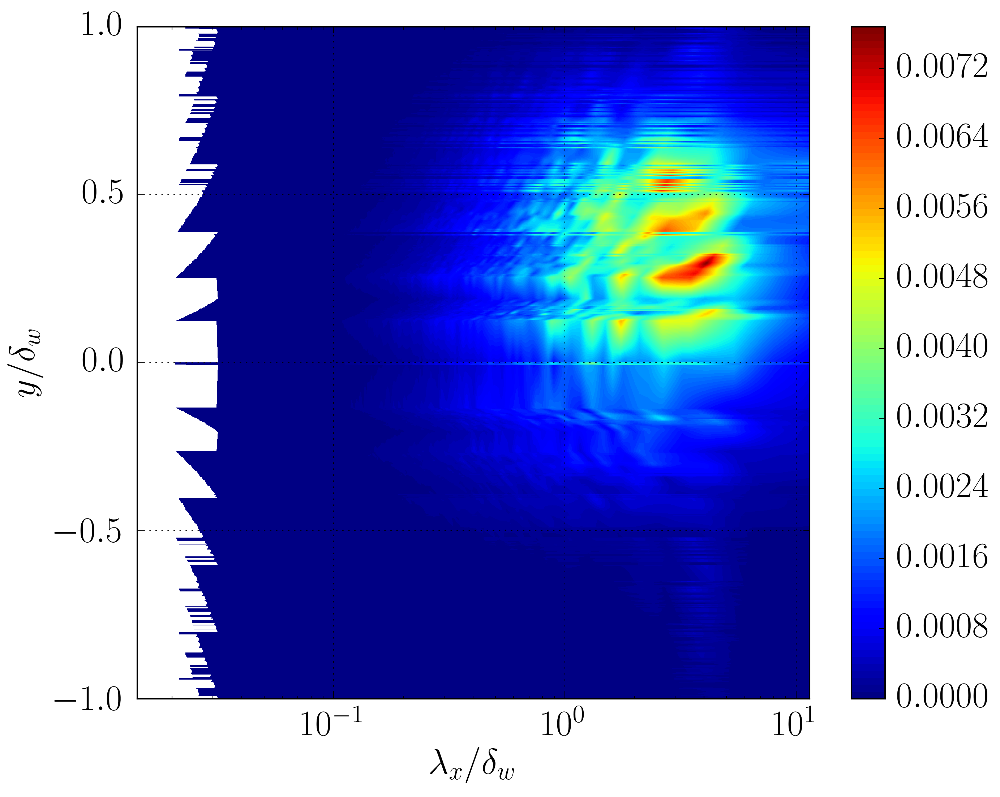

In [892]:
print matrix[0,-1],matrix[-1,-1]
fig = plt.figure()
ax = fig.add_subplot(111)
plt.xlabel(r'$\lambda_x/\delta_w$')
plt.ylabel(r'$y/\delta_w$')
print shape(matrix),shape(ydeltaBIG)
plt.contourf(2*pi/xik,ydeltaBIG,matrix[:,:-1],100)
plt.ylim([-1,1])
plt.xscale('log')
plt.grid('on')
plt.colorbar()

In [919]:
scaling='dw'
sumaxis=0
variable=0
Npoints=500;
ydeltaBIG=[]
fjob=True
joblist=[2]
count=1
iplane = 0
for ijob in joblist:
    tmin=SS1[ijob]
    tmax=SS2[ijob]
    pathSTA = p_folders[ijob]
    for nplane in range(0,nmaxplanes[ijob]-1,1):
        path = p_folders_spe[ijob][nplane]
        print "opening path= %s" %path
        [xik,ydelta,SPEC,timev,modes00]=getSpectra2(path,vplanes[ijob][nplane],pathSTA,variable,tmin,tmax, sumaxis,scaling)
        itimes=len(ydelta)
        if nplane==0 and fjob==True:
            matrix = np.zeros([itimes,Npoints+1])
            matrix[:,-1]=ydelta
            fjob=False
        else:
            mm = np.zeros([itimes,Npoints+1])
            mm[:,-1] = ydelta
            matrix = r_[matrix,mm]
        matrix[count*iplane*itimes:(count*iplane*itimes+itimes),:-1] = SPEC
        iplane+=1
    count+=1
    
    # scatter with colormap mapping to z value
matrix = matrix[matrix[:,-1].argsort()]
#print matrix[0,-1],matrix[-1,-1]
ydeltaBIG= matrix[:,-1]

opening path= /share/drive/toni/Re160s10/case3/h5.170.spes
y(nplane)=-11.4
77 100
(512, 140)
opening path= /share/drive/toni/Re160s10/case3/h5.175.spes
y(nplane)=-10.4
77 100
(512, 140)
opening path= /share/drive/toni/Re160s10/case3/h5.180.spes
y(nplane)=-9.4
77 100
(512, 140)
opening path= /share/drive/toni/Re160s10/case3/h5.185.spes
y(nplane)=-8.4
77 100
(512, 140)
opening path= /share/drive/toni/Re160s10/case3/h5.190.spes
y(nplane)=-7.4
77 100
(512, 140)
opening path= /share/drive/toni/Re160s10/case3/h5.195.spes
y(nplane)=-6.4
77 100
(512, 140)
opening path= /share/drive/toni/Re160s10/case3/h5.200.spes
y(nplane)=-5.4
77 100
(512, 140)
opening path= /share/drive/toni/Re160s10/case3/h5.205.spes
y(nplane)=-4.4
77 100
(512, 140)
opening path= /share/drive/toni/Re160s10/case3/h5.210.spes
y(nplane)=-3.4
77 100
(512, 140)
opening path= /share/drive/toni/Re160s10/case3/h5.215.spes
y(nplane)=-2.4
77 100
(512, 140)
opening path= /share/drive/toni/Re160s10/case3/h5.220.spes
y(nplane)=-1.4
77 1

-0.418438307851 0.278958871901
(460, 501) (460,)


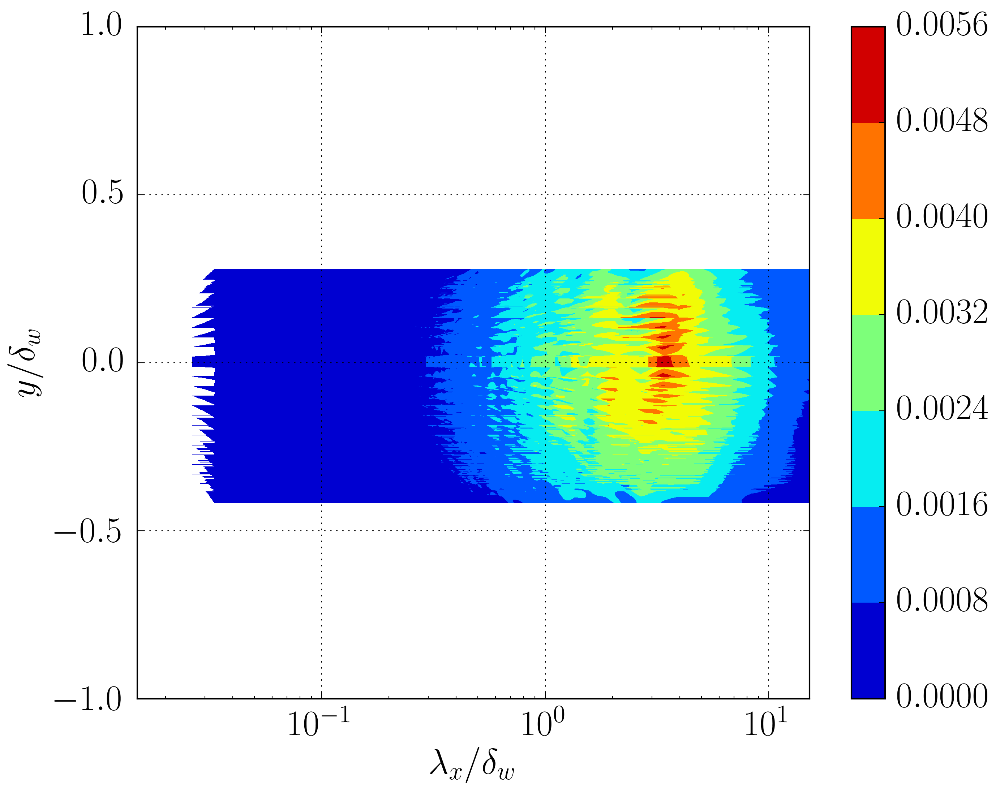

In [920]:
print matrix[0,-1],matrix[-1,-1]
fig = plt.figure()
ax = fig.add_subplot(111)
plt.xlabel(r'$\lambda_x/\delta_w$')
plt.ylabel(r'$y/\delta_w$')
print shape(matrix),shape(ydeltaBIG)
plt.contourf(2*pi/xik,ydeltaBIG,matrix[:,:-1])
plt.xscale('log')
plt.ylim([-1,1])
plt.grid('on')
plt.colorbar()

In [909]:
scaling='dw'
sumaxis=0
variable=0
Npoints=500;
ydeltaBIG=[]
fjob=True
joblist=[9]
count=1
iplane = 0
for ijob in joblist:
    tmin=SS1[ijob]
    tmax=SS2[ijob]
    pathSTA = p_folders[ijob]
    for nplane in range(0,nmaxplanes[ijob]-1,1):
        path = p_folders_spe[ijob][nplane]
        print "opening path= %s" %path
        [xik,ydelta,SPEC,timev,modes00]=getSpectra2(path,vplanes[ijob][nplane],pathSTA,variable,tmin,tmax, sumaxis,scaling)
        itimes=len(ydelta)
        if nplane==0 and fjob==True:
            matrix = np.zeros([itimes,Npoints+1])
            matrix[:,-1]=ydelta
            fjob=False
        else:
            mm = np.zeros([itimes,Npoints+1])
            mm[:,-1] = ydelta
            matrix = r_[matrix,mm]
        matrix[count*iplane*itimes:(count*iplane*itimes+itimes),:-1] = SPEC
        iplane+=1
    count+=1
    
    # scatter with colormap mapping to z value
matrix = matrix[matrix[:,-1].argsort()]
#print matrix[0,-1],matrix[-1,-1]
ydeltaBIG= matrix[:,-1]

opening path= /share/drive/toni/Re160s80/case1/y2/h5.350.spes
y(nplane)=-45.5812948526
88 109
(512, 130)
opening path= /share/drive/toni/Re160s80/case1/y2/h5.375.spes
y(nplane)=-39.9110192661
88 109
(512, 130)
opening path= /share/drive/toni/Re160s80/case1/y2/h5.400.spes
y(nplane)=-34.2415063858
88 109
(512, 130)
opening path= /share/drive/toni/Re160s80/case1/y2/h5.425.spes
y(nplane)=-28.5722681636
88 109
(512, 130)
opening path= /share/drive/toni/Re160s80/case1/y2/h5.450.spes
y(nplane)=-22.9031288419
88 109
(512, 130)
opening path= /share/drive/toni/Re160s80/case1/y2/h5.475.spes
y(nplane)=-17.234025132
88 109
(512, 130)
opening path= /share/drive/toni/Re160s80/case1/y2/h5.500.spes
y(nplane)=-11.564934245
88 109
(512, 130)
opening path= /share/drive/toni/Re160s80/case1/y2/h5.525.spes
y(nplane)=-5.89584797524
88 109
(512, 130)
opening path= /share/drive/toni/Re160s80/case1/y2/h5.550.spes
y(nplane)=-0.226763367946
88 109
(512, 130)
opening path= /share/drive/toni/Re160s80/case1/y2/h5.575

-1.15151199174 1.71544317855
(441, 501) (441,)


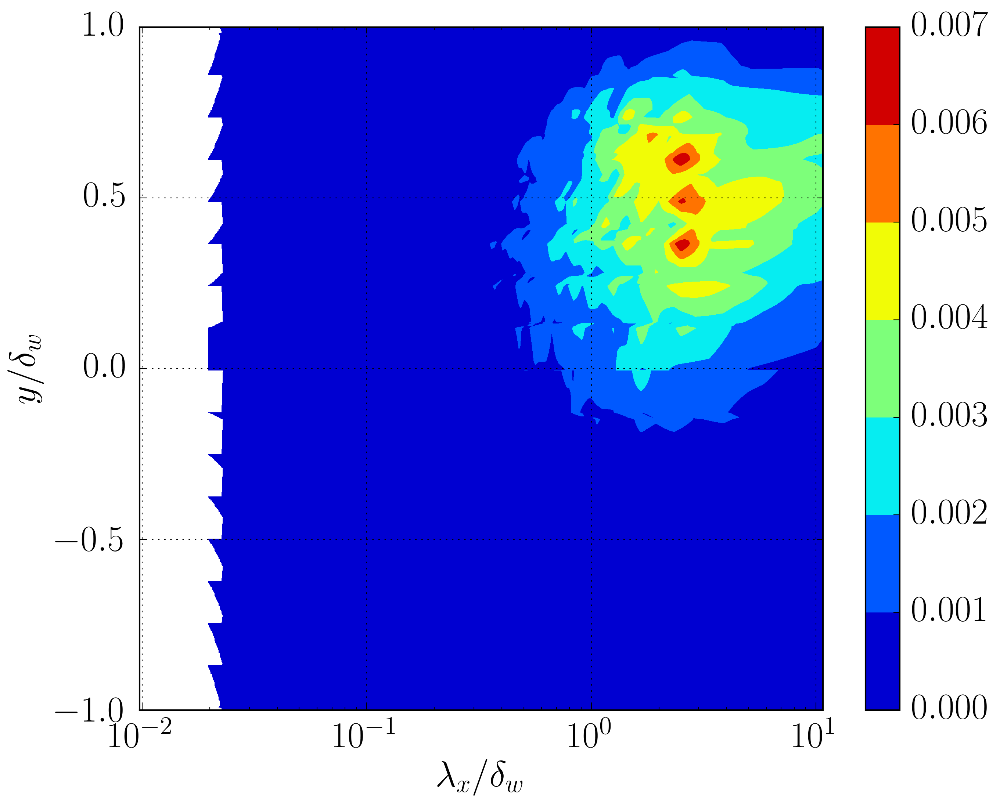

In [910]:
print matrix[0,-1],matrix[-1,-1]
fig = plt.figure()
ax = fig.add_subplot(111)
plt.xlabel(r'$\lambda_x/\delta_w$')
plt.ylabel(r'$y/\delta_w$')
print shape(matrix),shape(ydeltaBIG)
plt.contourf(2*pi/xik,ydeltaBIG,matrix[:,:-1])
plt.ylim([-1,1])
#plt.xlim([0,10])
plt.xscale('log')
plt.grid('on')
plt.colorbar()

In [684]:
print DT

[[], 0.75, 1.875, 3.9375]


# INFINITELY LARGE MODES RATIO EVOLUTION

In [104]:
fnplane='mid'
vplanes=[]
nmaxplanes=[]
for ijob,path in zip(range(len(p_folders)),p_folders):
    print ijob
    p_folders_spe[ijob]=path[0:-5]+fnplane+'.spes'
    print p_folders_spe[ijob]
    path = p_folders_spe[ijob]
    with h5py.File(path,"r") as f:
        v=np.array(f['jsp'])
        vplanes.append(v)
        nmaxplanes.append(len(v))
    #New sorted planes trick
    vplanes[ijob]=sorted(vplanes[ijob])
print vplanes
print nmaxplanes
#scaling = 'dm'
p_folders_spe=[['']*nmaxplanes[ijob] for ijob in range(len(p_folders))]
for ijob,path in zip(range(len(p_folders)),p_folders):
    with h5py.File(path,"r") as g:
        my = len(np.array(g['y']))
        time=np.array(g['time'])
        dd=np.array(g[scaling])
        midplane = my/2+1
        #print "midplane=%s"%midplane
    for nplane,jj in zip(vplanes[ijob],range(nmaxplanes[ijob])):
        if nplane==midplane: #Lastplane
            #print "This is midplane"
            fnplane='mid'
        else:
            fnplane="%03d"%nplane
        p_folders_spe[ijob][jj]=path[0:-5]+fnplane+'.spes'
        #print "Reading spe file: %s" %(pathSPE)

0
/share/drive/toni/VDML/s10/02/h5.mid.spes
1
/share/drive/toni/VDML/s10/03/h5.mid.spes
2
/share/drive/toni/VDML/s10/04/newman/h5.mid.spes
3
/share/drive/toni/VDML/s10/06/h5.mid.spes
4
/share/drive/toni/VDML/s20/01/h5.mid.spes
5
/share/drive/toni/VDML/s20/02/h5.mid.spes
6
/share/drive/toni/VDML/s20/03/h5.mid.spes
7
/share/drive/toni/VDML/s20/04/h5.mid.spes
8
/share/drive/toni/VDML/s40/01/h5.mid.spes
9
/share/drive/toni/VDML/s40/02/h5.mid.spes
10
/share/drive/toni/VDML/s40/03/h5.mid.spes
11
/share/drive/toni/VDML/s40/04/h5.mid.spes
12
/share/drive/toni/VDML/s80/01/h5.mid.spes
13
/share/drive/toni/VDML/s80/02/h5.mid.spes
14
/share/drive/toni/VDML/s80/03/h5.mid.spes
15
/share/drive/toni/VDML/s80/04/h5.mid.spes
[[125, 145, 165, 185, 205, 225, 245, 265, 285, 305, 325, 345, 365, 385, 405, 426, 445, 465, 485, 505, 525, 545, 565, 585, 605, 625, 645, 665, 685, 705, 725], [125, 145, 165, 185, 205, 225, 245, 265, 285, 305, 325, 345, 365, 385, 405, 426, 445, 465, 485, 505, 525, 545, 565, 585, 605,

In [105]:
def getSpectracase(p_folders,nplane,p_foldersSTA,lcases,variable,scaling,SS1,SS2,sumaxis,Npoints=1000):
    """
    returns as many vectors as cases wanted to compute.
    Distribution of cases is given in lcases(ex. lcases = [[0,1,2],[3,5]])
    return only one profile per case
    """
    ncases = len(lcases)
    fycases = [[] for i in range(ncases)]
    vt = []
    f00 = []
    ycases = [[] for i in range(ncases)]
    ferrorcases = [[] for i in range(ncases)]
    for icase in range(ncases):
        vpcases = []
        vpcasesSTA=[]
        nacum = 0
        fy = np.zeros(Npoints)
        yf = [[]for i in range(len(lcases[icase]))]
        fy= [[]for i in range(len(lcases[icase]))]
        ferror = [[] for i in range(len(lcases[icase]))]
        nn=len(lcases[icase])
        for ijob in lcases[icase]:
            vpcases    = vpcases    + [p_folders[ijob]]
            vpcasesSTA = vpcasesSTA + [p_foldersSTA[ijob]]
        for path,i in zip(vpcases,range(len(vpcases))):
            ijob = lcases[icase][i]
            pathSTA = vpcasesSTA[i]
            print ijob
            yf[i],fy[i],ferror[i],tt,kk,ydmEVO = getSpectra(path,nplane,pathSTA,variable,SS1[ijob],SS2[ijob],sumaxis,scaling,Npoints)
            vt.append(tt)
            f00.append(kk)
        ycases[icase]=yf
        print "y/delta evolution with time: %s"%(ydmEVO)
        fycases[icase]=np.mean(fy,axis=0)
        ferrorcases[icase]=np.max(ferror,axis=0)
    return ycases,fycases,ferrorcases,vt,f00,ydmEVO

In [106]:
def getSpectravstime(path,nplane,variable):
    """
    Obtain scaled spectra averaged in the given time span
    """
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        kx = np.array(f['kx'])
        kz = np.array(f['kz'])
        mx = len(kx)-1;
        mz = len(kz)-1;

        
        #funSPE = np.array(f['SPEC'][1:,variable,1:,:]);
        funSPE = np.array(f['SPEC'][:,variable,:,:]);
        #print "shape of funSPE = %s, %s, %s"%(np.shape(funSPE))
        fun00 = funSPE[0,0,:]
        for tt in range(len(time)):
            funSPE[0,0,tt]=0.0
        funkx0  = np.sum(funSPE[:,0,:],axis=0)
        res=time*0.0
        for kk,ii in  zip(kx,range(len(kx))):
            res += np.sum(funSPE[:,ii,:],axis=0)
        funRest = res
        #funRest = np.sum(kx[1:]*np.sum(kz[:]*funSPE[1:,0:,:],axis=1),axis=0)
        #lamxMax=np.pi/kx[1]
        #lamxMin=lamxMax/mx
        #lamzMax=np.pi/kz[1]
        #lamzMin=lamzMax/mz
    return kx,kz,time,funkx0,funRest,fun00

In [107]:
def getSpectrazvstime(path,nplane,variable):
    """
    Obtain scaled spectra averaged in the given time span
    """
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        kx = np.array(f['kx'])
        kz = np.array(f['kz'])
        mx = len(kx)-1;
        mz = len(kz)-1;

        
        #funSPE = np.array(f['SPEC'][1:,variable,1:,:]);
        funSPE = np.array(f['SPEC'][:,variable,:,:]);
        fun00 = funSPE[0,0,:]
        for tt in range(len(time)):
            funSPE[0,0,tt]=0.0
        funkz0  = np.sum(funSPE[0,:,:],axis=0)
        res=time*0.0
        for kk,ii in  zip(kz,range(len(kz))):
            res += np.sum(funSPE[ii,:,:],axis=0)
        funRest = res
        #funRest = np.sum(kx[1:]*np.sum(kz[:]*funSPE[1:,0:,:],axis=1),axis=0)
        #lamxMax=np.pi/kx[1]
        #lamxMin=lamxMax/mx
        #lamzMax=np.pi/kz[1]
        #lamzMin=lamzMax/mz
    return kx,kz,time,funkz0,funRest,fun00

In [108]:
var_ind = {'u':0,'v':1,'w':2,'$uv_{re}$':3,'$uv_{im}$':4,'$\omega_1$':5,'$\omega_2$':6,'$\omega_3$':7,'$\rho u$':8,\
           '$\rho v$':9,'$\rho w$':10,'T':11}
ind_var = {v: k for k, v in var_ind.items()}
var_name = ['u','v','w','$\omega_2$','T']
nvar = len(var_name)+1
print "You will analyse a total of %s variables." %nvar
var_list = []
for j in range(len(var_name)):
    var_list.append(var_ind[var_name[j]])
print var_list

You will analyse a total of 6 variables.
[0, 1, 2, 6, 11]


In [109]:
#Define index of variables SPECTRA
#----------------------------------------
iu = 0 #index of variable
iv = 1
iw = 2
iT = 11
iome1 = 5
iome2 = 6
iome3 = 7

In [110]:
def integralSpectravstime(p_folders_spe,vplanes,y,variable, sumaxis):
    """
    Spectra vs time integrated MAKE SURE PLANE NAMES ARE ORDERED
    """
    if sumaxis==0:
        yplanes = y[np.subtract(vplanes,1)]#Create vector with position of planes
        Dyplanes = y[np.subtract(vplanes,1)] #Create Dyplanes
        for j in range(1,len(Dyplanes)-1):
            Dyplanes[j]=(yplanes[j+1]-yplanes[j-1])/2.0
        Dyplanes[0]=(yplanes[1]-yplanes[0])/2.0
        Dyplanes[-1]=(yplanes[-1]-yplanes[-2])/2.0
        for iplane in range(len(vplanes)):
            #Initializing
            if iplane==0:
                path = p_folders_spe[iplane]
                [kx,kz,time,intSPECtime0,intSPECtimeRest,fun00]=getSpectravstime(path,iplane,variable)
                intSPECtime0 = intSPECtime0*Dyplanes[iplane]
                intSPECtimeRest = intSPECtimeRest*Dyplanes[iplane]
            else:
                path = p_folders_spe[iplane]
                [kx,kz,time,funkx0,funRest,fun00]=getSpectravstime(path,iplane,variable)
                intSPECtime0 += funkx0*Dyplanes[iplane]
                intSPECtimeRest += funRest*Dyplanes[iplane]
    elif sumaxis==1:
        yplanes = y[np.subtract(vplanes,1)]#Create vector with position of planes
        Dyplanes = y[np.subtract(vplanes,1)] #Create Dyplanes
        for j in range(1,len(Dyplanes)-1):
            Dyplanes[j]=(yplanes[j+1]-yplanes[j-1])/2.0
        Dyplanes[0]=(yplanes[1]-yplanes[0])/2.0
        Dyplanes[-1]=(yplanes[-1]-yplanes[-2])/2.0
        for iplane in range(len(vplanes)):
            #Initializing
            if iplane==0:
                path = p_folders_spe[iplane]
                [kx,kz,time,intSPECtime0,intSPECtimeRest,fun00]=getSpectrazvstime(path,iplane,variable)
                intSPECtime0 = intSPECtime0*Dyplanes[iplane]
                intSPECtimeRest = intSPECtimeRest*Dyplanes[iplane]
            else:
                path = p_folders_spe[iplane]
                [kx,kz,time,funkx0,funRest,fun00]=getSpectrazvstime(path,iplane,variable)
                intSPECtime0 += funkx0*Dyplanes[iplane]
                intSPECtimeRest += funRest*Dyplanes[iplane]            
                
    return kx,kz,time,intSPECtime0,intSPECtimeRest
 


ijob=0
/share/drive/toni/VDML/s10/02/h5.stats


KeyboardInterrupt: 

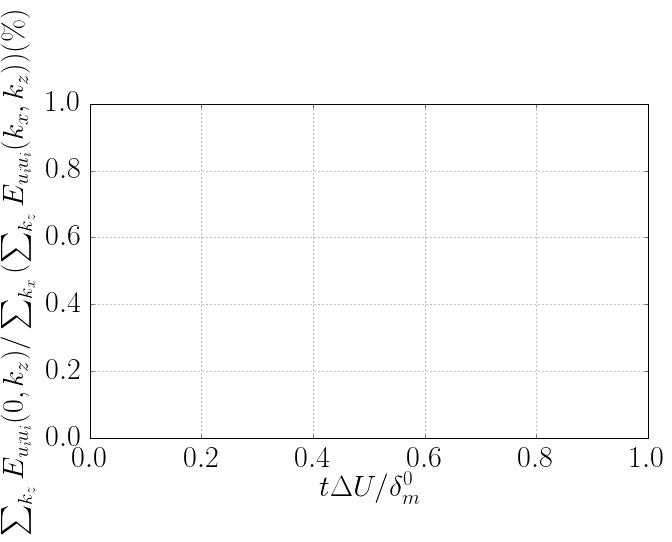

In [111]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=0;
variable=0
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_z}{E_{u_i u_i}(0,k_z)}/\sum_{k_x}{(\sum_{k_z}{E_{u_i u_i}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'modeskx0ratioEnergyALL'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(0,njobs,4):
    print "ijob=%s"%ijob
    #print vplanes[ijob]
    path = p_folders[ijob]
    print path
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,funu1,fun2u] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,0,sumaxis)
    [kx,kz,time,funv1,fun2v] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,1,sumaxis)
    [kx,kz,time,funw1,fun2w] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,2,sumaxis)
    itmax = where(time>=SS2j[ijob])[0][0]
    plt.plot(time[:itmax],((funu1+funv1+funw1)/(fun2u+fun2v+fun2w))[0:itmax]*100,l_job_style[ijob/3],lw=2.0)
if PRINT == True:
    pathname = save_folder + figname+ fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "Figure %s saved!"%pathname

ijob=2
/share/drive/toni/VDML/s10/04/newman/h5.stats
Figure /share/drive/toni/VDML/JFM/modeskx0ratioEnergys1.pdf saved!


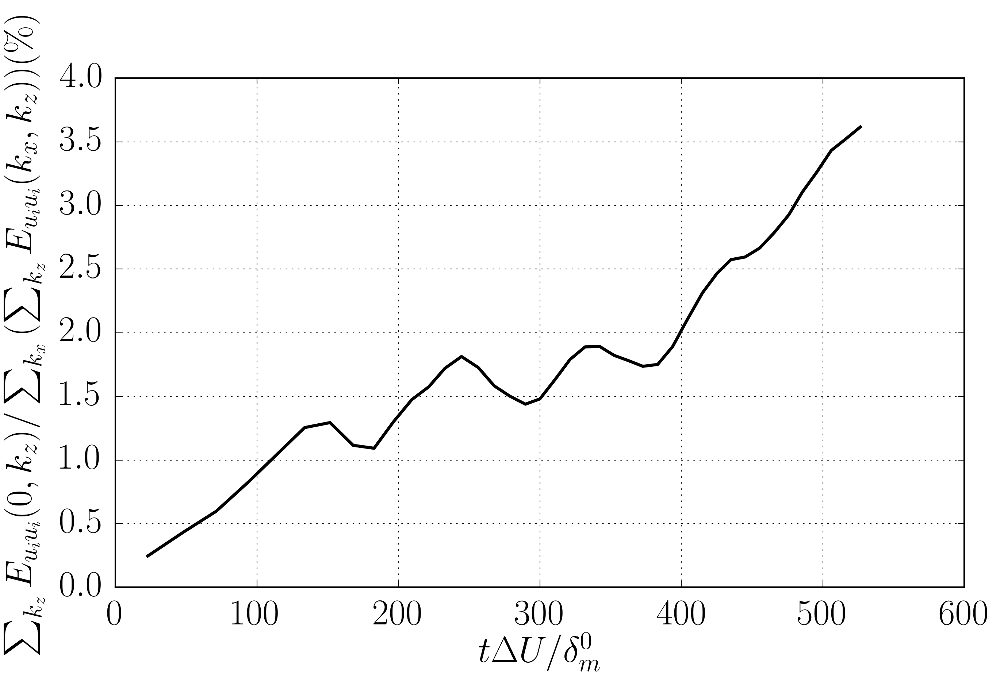

In [655]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=0;
variable=0
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_z}{E_{u_i u_i}(0,k_z)}/\sum_{k_x}{(\sum_{k_z}{E_{u_i u_i}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'modeskx0ratioEnergys1'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(2,3):
    print "ijob=%s"%ijob
    #print vplanes[ijob]
    path = p_folders[ijob]
    print path
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,funu1,fun2u] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,0,sumaxis)
    [kx,kz,time,funv1,fun2v] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,1,sumaxis)
    [kx,kz,time,funw1,fun2w] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,2,sumaxis)
    itmax = where(time>=SS2j[ijob])[0][0]
    plt.plot(time[:itmax],((funu1+funv1+funw1)/(fun2u+fun2v+fun2w))[0:itmax]*100,l_job_style[ijob/3],lw=2.0)
if PRINT == True:
    pathname = save_folder + figname+ fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "Figure %s saved!"%pathname

ijob=12
/share/drive/toni/VDML/s80/01/h5.stats
Figure /share/drive/toni/VDML/JFM/modeskx0ratioEnergyT.pdf saved!


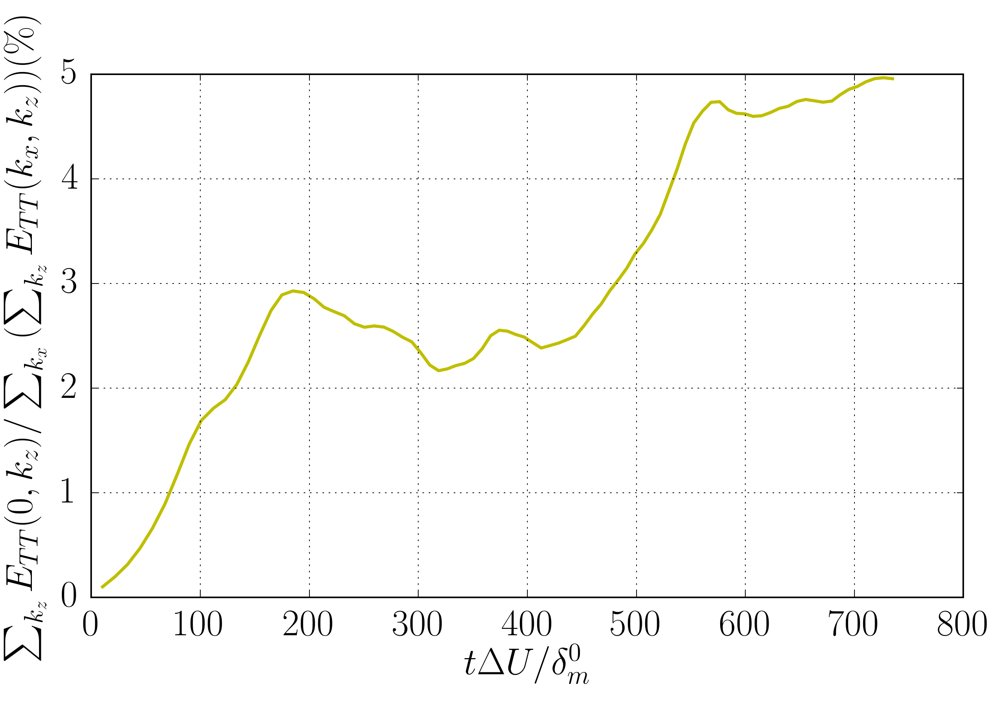

In [486]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=0;
variable=11
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_z}{E_{T T}(0,k_z)}/\sum_{k_x}{(\sum_{k_z}{E_{T T}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'modeskx0ratioEnergyT'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(12,13):
    print "ijob=%s"%ijob
    #print vplanes[ijob]
    path = p_folders[ijob]
    print path
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,funu1,fun2u] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,variable,sumaxis)
    #[kx,kz,time,funv1,fun2v] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,1,sumaxis)
    #[kx,kz,time,funw1,fun2w] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,2,sumaxis)
    itmax = where(time>=SS2j[ijob])[0][0]
    plt.plot(time[:itmax],(funu1/fun2u)[0:itmax]*100,l_job_style[ijob/3],lw=2.0)
if PRINT == True:
    pathname = save_folder + figname+ fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "Figure %s saved!"%pathname

ijob=10
/share/drive/toni/VDML/s40/03/h5.stats
Figure /share/drive/toni/VDML/JFM/modeskx0ratioEnergyTs4.pdf saved!


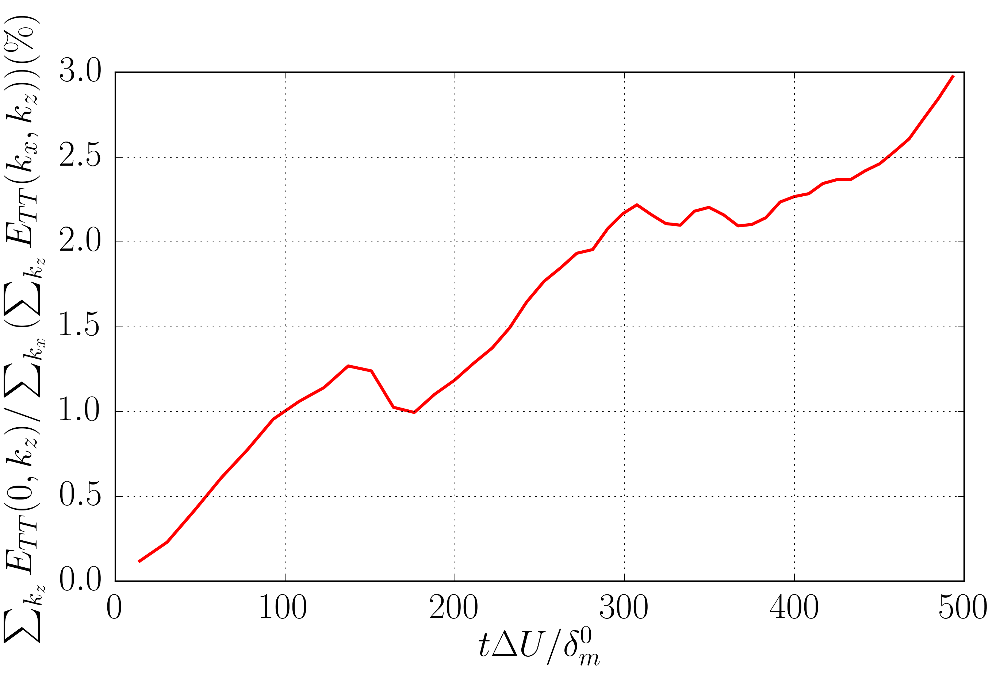

In [487]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=0;
variable=11
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_z}{E_{T T}(0,k_z)}/\sum_{k_x}{(\sum_{k_z}{E_{T T}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'modeskx0ratioEnergyTs4'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(10,11):
    print "ijob=%s"%ijob
    #print vplanes[ijob]
    path = p_folders[ijob]
    print path
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,funu1,fun2u] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,variable,sumaxis)
    #[kx,kz,time,funv1,fun2v] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,1,sumaxis)
    #[kx,kz,time,funw1,fun2w] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,2,sumaxis)
    itmax = where(time>=SS2j[ijob])[0][0]
    plt.plot(time[:itmax],(funu1/fun2u)[0:itmax]*100,l_job_style[ijob/3],lw=2.0)
if PRINT == True:
    pathname = save_folder + figname+ fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "Figure %s saved!"%pathname

ijob=2
/share/drive/toni/VDML/s10/04/newman/h5.stats
Figure /share/drive/toni/VDML/JFM/modeskx0ratioEnergyTs1.pdf saved!


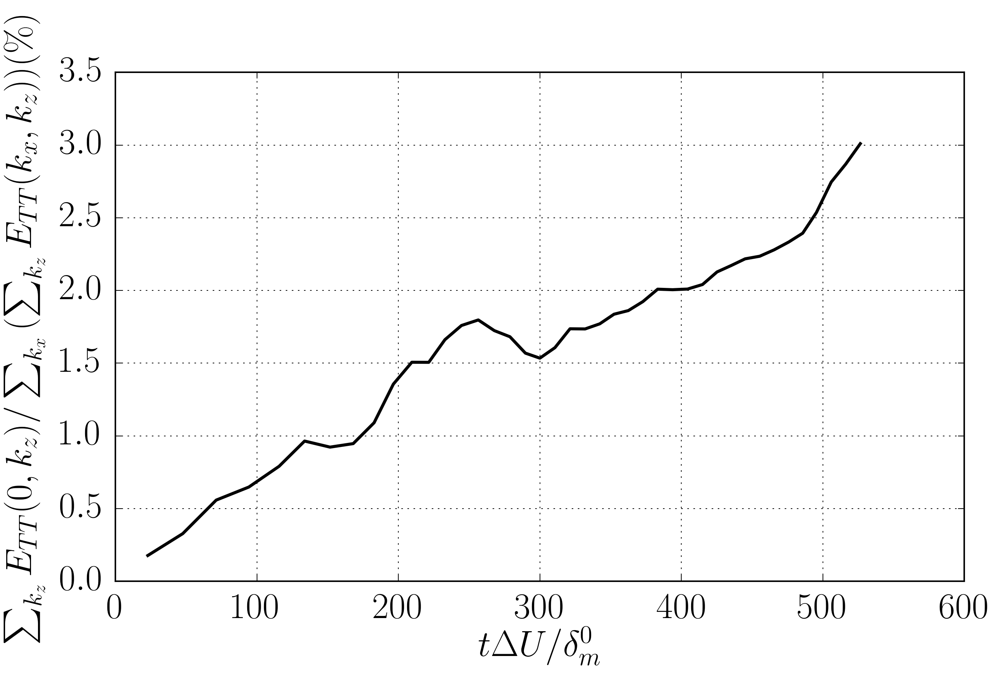

In [654]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=0;
variable=11
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_z}{E_{T T}(0,k_z)}/\sum_{k_x}{(\sum_{k_z}{E_{T T}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'modeskx0ratioEnergyTs1'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(2,3):
    print "ijob=%s"%ijob
    #print vplanes[ijob]
    path = p_folders[ijob]
    print path
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,funu1,fun2u] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,variable,sumaxis)
    #[kx,kz,time,funv1,fun2v] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,1,sumaxis)
    #[kx,kz,time,funw1,fun2w] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,2,sumaxis)
    itmax = where(time>=SS2j[ijob])[0][0]
    plt.plot(time[:itmax],(funu1/fun2u)[0:itmax]*100,l_job_style[ijob/3],lw=2.0)
if PRINT == True:
    pathname = save_folder + figname+ fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "Figure %s saved!"%pathname

ijob=5
/share/drive/toni/VDML/s20/02/h5.stats
Figure /share/drive/toni/VDML/JFM/modeskx0ratioEnergyTs2.pdf saved!


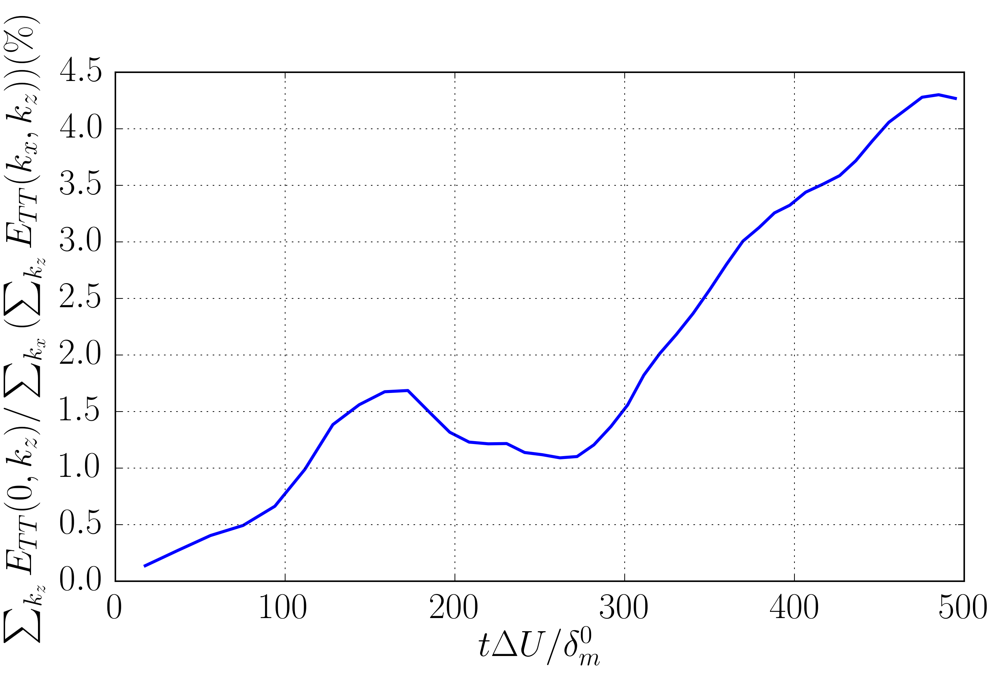

In [492]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=0;
variable=11
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_z}{E_{T T}(0,k_z)}/\sum_{k_x}{(\sum_{k_z}{E_{T T}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'modeskx0ratioEnergyTs2'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(5,6):
    print "ijob=%s"%ijob
    #print vplanes[ijob]
    path = p_folders[ijob]
    print path
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,funu1,fun2u] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,variable,sumaxis)
    #[kx,kz,time,funv1,fun2v] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,1,sumaxis)
    #[kx,kz,time,funw1,fun2w] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,2,sumaxis)
    itmax = where(time>=SS2j[ijob])[0][0]
    plt.plot(time[:itmax],(funu1/fun2u)[0:itmax]*100,l_job_style[ijob/3],lw=2.0)
if PRINT == True:
    pathname = save_folder + figname+ fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "Figure %s saved!"%pathname

ijob=12
Figure /share/drive/toni/VDML/JFM/modeskz0ratioEnergy.eps saved!


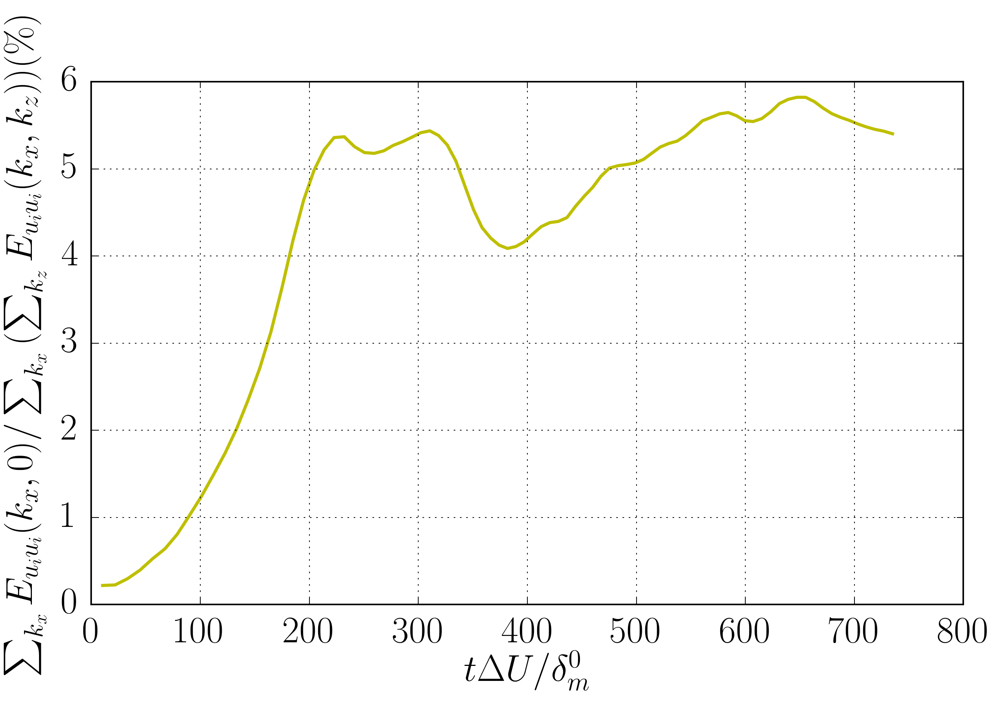

In [1420]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=1;
variable=0
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_x}{E_{u_i u_i}(k_x,0)}/\sum_{k_x}{(\sum_{k_z}{E_{u_i u_i}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'modeskz0ratioEnergy'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(12,13):
    print "ijob=%s"%ijob
    #print vplanes[ijob]
    path = p_folders[ijob]
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,funu1,fun2u] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,0,sumaxis)
    [kx,kz,time,funv1,fun2v] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,1,sumaxis)
    [kx,kz,time,funw1,fun2w] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,2,sumaxis)
    itmax = where(time>=SS2j[ijob])[0][0]
    plt.plot(time[:itmax],((funu1+funv1+funw1)/(fun2u+fun2v+fun2w))[0:itmax]*100,l_job_style[ijob/3],lw=2.0)
if PRINT == True:
    pathname = save_folder + figname+ fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "Figure %s saved!"%pathname

ijob=12
Figure /share/drive/toni/VDML/JFM/modeskz0ratioEnergyT.pdf saved!


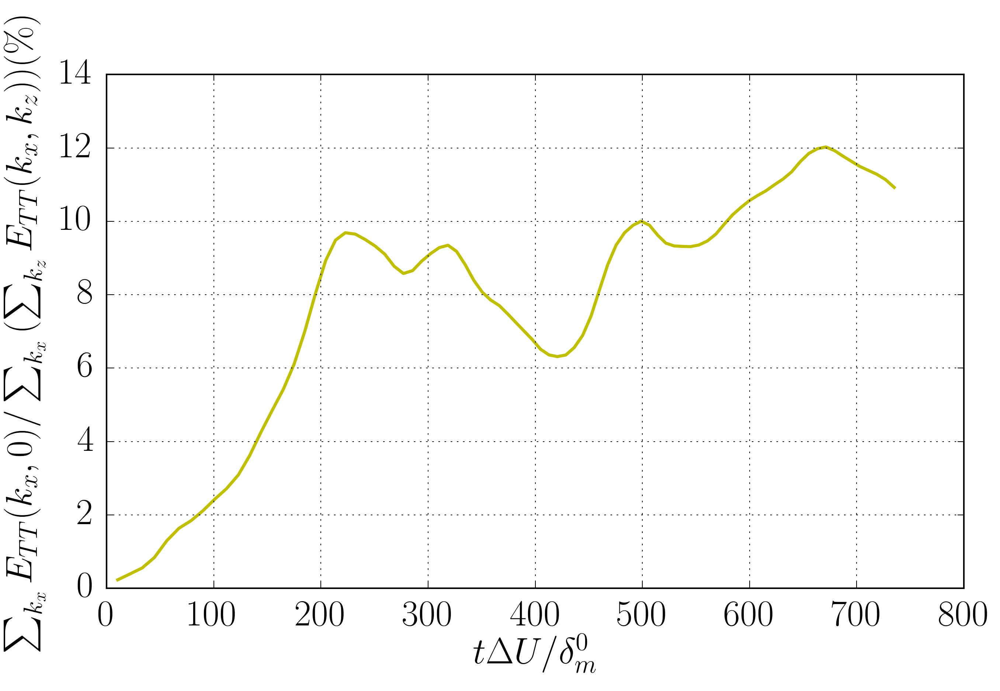

In [488]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=1;
variable=11
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_x}{E_{T T}(k_x,0)}/\sum_{k_x}{(\sum_{k_z}{E_{T T}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'modeskz0ratioEnergyT'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(12,13):
    print "ijob=%s"%ijob
    #print vplanes[ijob]
    path = p_folders[ijob]
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,funu1,fun2u] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,variable,sumaxis)
    #[kx,kz,time,funv1,fun2v] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,1,sumaxis)
    #[kx,kz,time,funw1,fun2w] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,2,sumaxis)
    itmax = where(time>=SS2j[ijob])[0][0]
    plt.plot(time[:itmax],((funu1)/(fun2u))[0:itmax]*100,l_job_style[ijob/3],lw=2.0)
if PRINT == True:
    pathname = save_folder + figname+ fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "Figure %s saved!"%pathname

ijob=10
Figure /share/drive/toni/VDML/JFM/modeskz0ratioEnergyTs4.pdf saved!


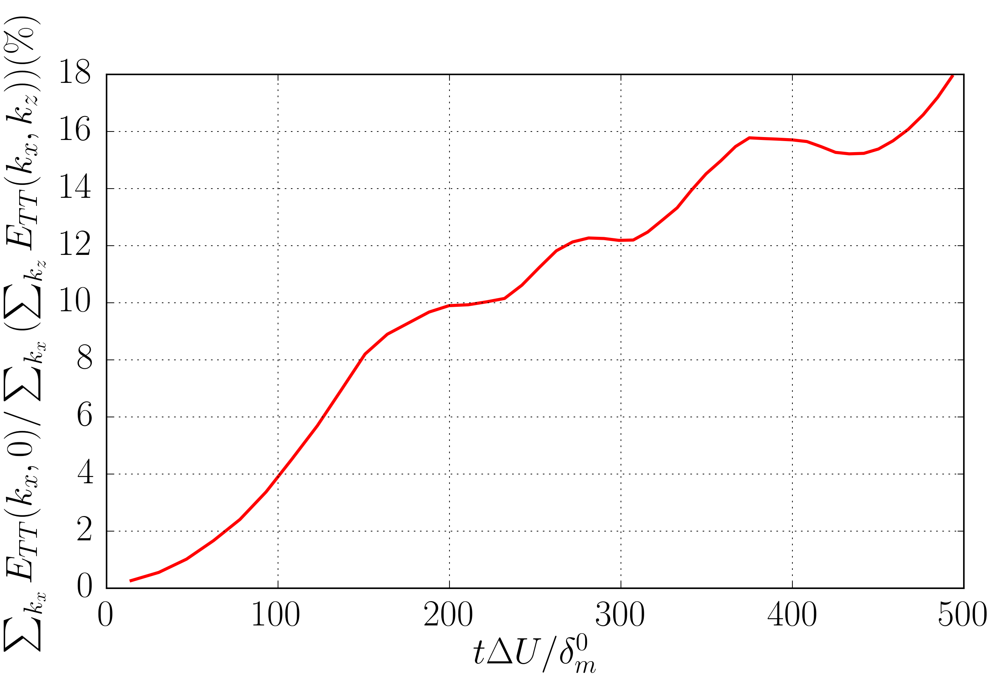

In [489]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=1;
variable=11
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_x}{E_{T T}(k_x,0)}/\sum_{k_x}{(\sum_{k_z}{E_{T T}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'modeskz0ratioEnergyTs4'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(10,11):
    print "ijob=%s"%ijob
    #print vplanes[ijob]
    path = p_folders[ijob]
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,funu1,fun2u] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,variable,sumaxis)
    #[kx,kz,time,funv1,fun2v] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,1,sumaxis)
    #[kx,kz,time,funw1,fun2w] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,2,sumaxis)
    itmax = where(time>=SS2j[ijob])[0][0]
    plt.plot(time[:itmax],((funu1)/(fun2u))[0:itmax]*100,l_job_style[ijob/3],lw=2.0)
if PRINT == True:
    pathname = save_folder + figname+ fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "Figure %s saved!"%pathname

ijob=5
Figure /share/drive/toni/VDML/JFM/modeskz0ratioEnergyTs2.pdf saved!


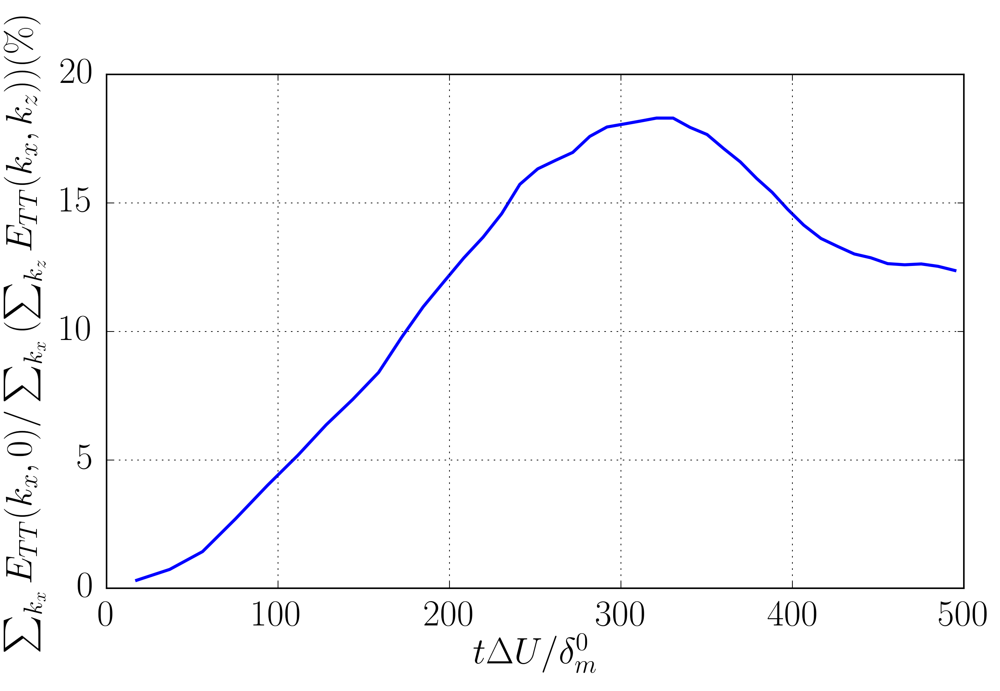

In [491]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=1;
variable=11
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_x}{E_{T T}(k_x,0)}/\sum_{k_x}{(\sum_{k_z}{E_{T T}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'modeskz0ratioEnergyTs2'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(5,6):
    print "ijob=%s"%ijob
    #print vplanes[ijob]
    path = p_folders[ijob]
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,funu1,fun2u] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,variable,sumaxis)
    #[kx,kz,time,funv1,fun2v] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,1,sumaxis)
    #[kx,kz,time,funw1,fun2w] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,2,sumaxis)
    itmax = where(time>=SS2j[ijob])[0][0]
    plt.plot(time[:itmax],((funu1)/(fun2u))[0:itmax]*100,l_job_style[ijob/3],lw=2.0)
if PRINT == True:
    pathname = save_folder + figname+ fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "Figure %s saved!"%pathname

ijob=5
/share/drive/toni/VDML/s20/02/h5.stats
Figure /share/drive/toni/VDML/JFM/modeskz0ratioEnergyTs2.pdf saved!


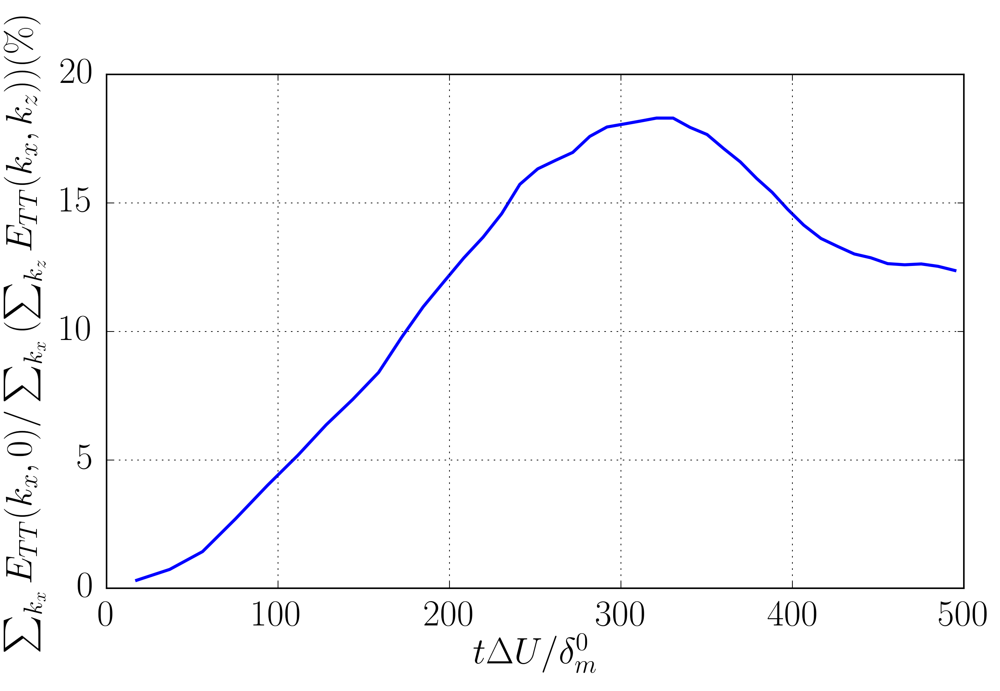

In [490]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=1;
variable=11
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_x}{E_{T T}(k_x,0)}/\sum_{k_x}{(\sum_{k_z}{E_{T T}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'modeskz0ratioEnergyTs2'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(5,6):
    #print vplanes[ijob]
    path = p_folders[ijob]
    print "ijob=%s"%ijob
    print path
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,funu1,fun2u] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,variable,sumaxis)
    #[kx,kz,time,funv1,fun2v] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,1,sumaxis)
    #[kx,kz,time,funw1,fun2w] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,2,sumaxis)
    itmax = where(time>=SS2j[ijob])[0][0]
    plt.plot(time[:itmax],((funu1)/(fun2u))[0:itmax]*100,l_job_style[ijob/3],lw=2.0)
if PRINT == True:
    pathname = save_folder + figname+ fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "Figure %s saved!"%pathname

ijob=0
ijob=1
ijob=2
ijob=3
ijob=4
ijob=5
ijob=6
ijob=7
ijob=8
ijob=9
ijob=10
ijob=11


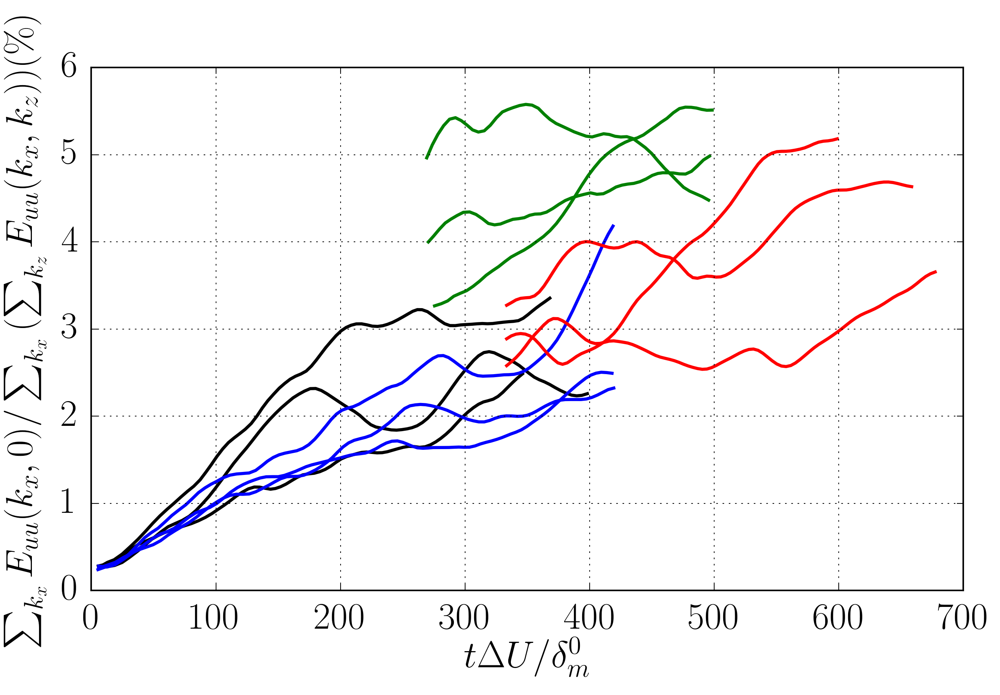

In [641]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=1;
variable=0
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_x}{E_{uu}(k_x,0)}/\sum_{k_x}{(\sum_{k_z}{E_{uu}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'kk'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(njobs):
    print "ijob=%s"%ijob
    #print vplanes[ijob]
    path = p_folders[ijob]
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,fun1,fun2] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,variable,sumaxis)
    itmax = where(time>=SS2[ijob])[0][0]
    plt.plot(time[:itmax],(fun1/fun2)[0:itmax]*100,l_job_style[ijob/3],lw=2.0)

ijob=0
ijob=1
ijob=2
ijob=3
ijob=4
ijob=5
ijob=6
ijob=7
ijob=8
ijob=9
ijob=10
ijob=11


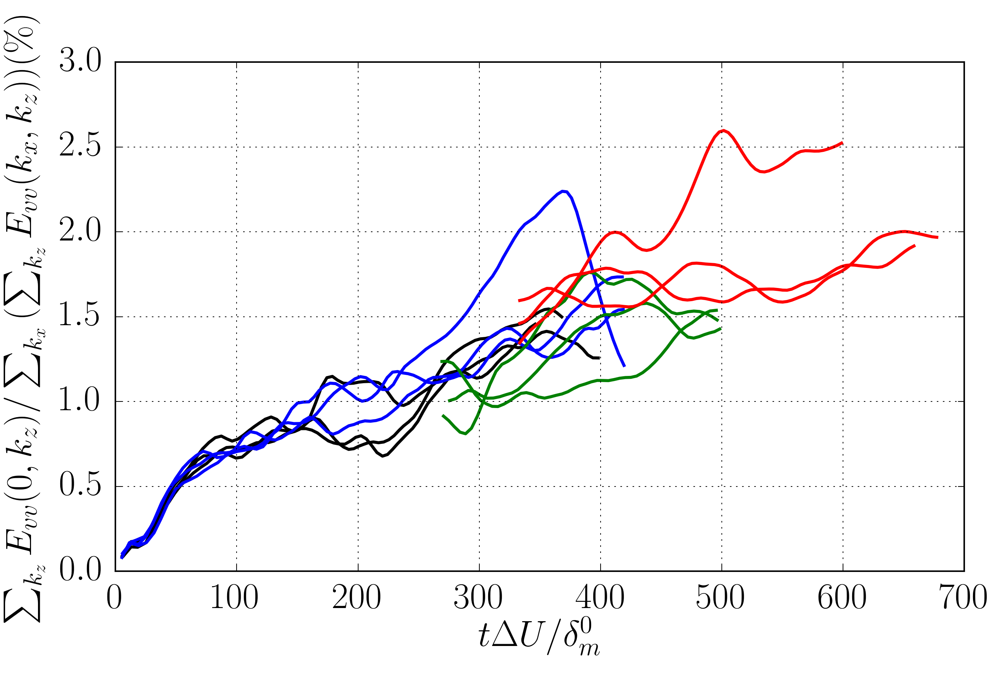

In [642]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=0;
variable=1
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_z}{E_{vv}(0,k_z)}/\sum_{k_x}{(\sum_{k_z}{E_{vv}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'kk'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(njobs):
    print "ijob=%s"%ijob
    #print vplanes[ijob]
    path = p_folders[ijob]
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,fun1,fun2] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,variable,sumaxis)
    itmax = where(time>=SS2[ijob])[0][0]
    plt.plot(time[:itmax],(fun1/fun2)[0:itmax]*100,l_job_style[ijob/3],lw=2.0)

ijob=0
ijob=1
ijob=2
ijob=3
ijob=4
ijob=5
ijob=6
ijob=7
ijob=8
ijob=9
ijob=10
ijob=11


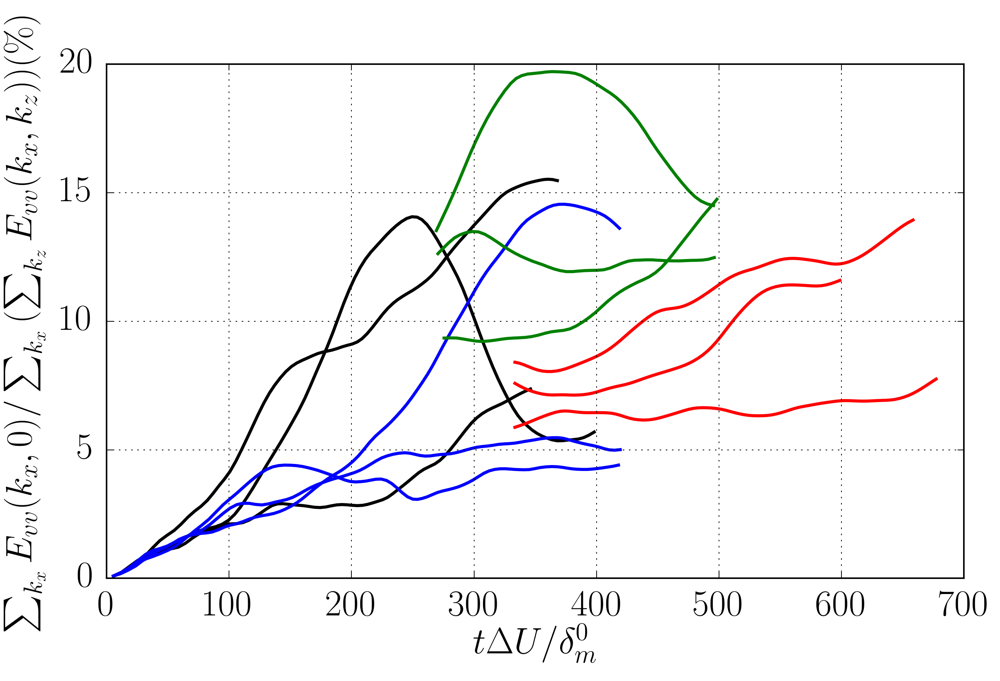

In [643]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=1;
variable=1
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_x}{E_{vv}(k_x,0)}/\sum_{k_x}{(\sum_{k_z}{E_{vv}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'kk'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(njobs):
    print "ijob=%s"%ijob
    #print vplanes[ijob]
    path = p_folders[ijob]
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,fun1,fun2] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,variable,sumaxis)
    itmax = where(time>=SS2[ijob])[0][0]
    plt.plot(time[:itmax],(fun1/fun2)[0:itmax]*100,l_job_style[ijob/3],lw=2.0)

ijob=0
ijob=1
ijob=2
ijob=3
ijob=4


IndexError: index 4 is out of bounds for axis 0 with size 4

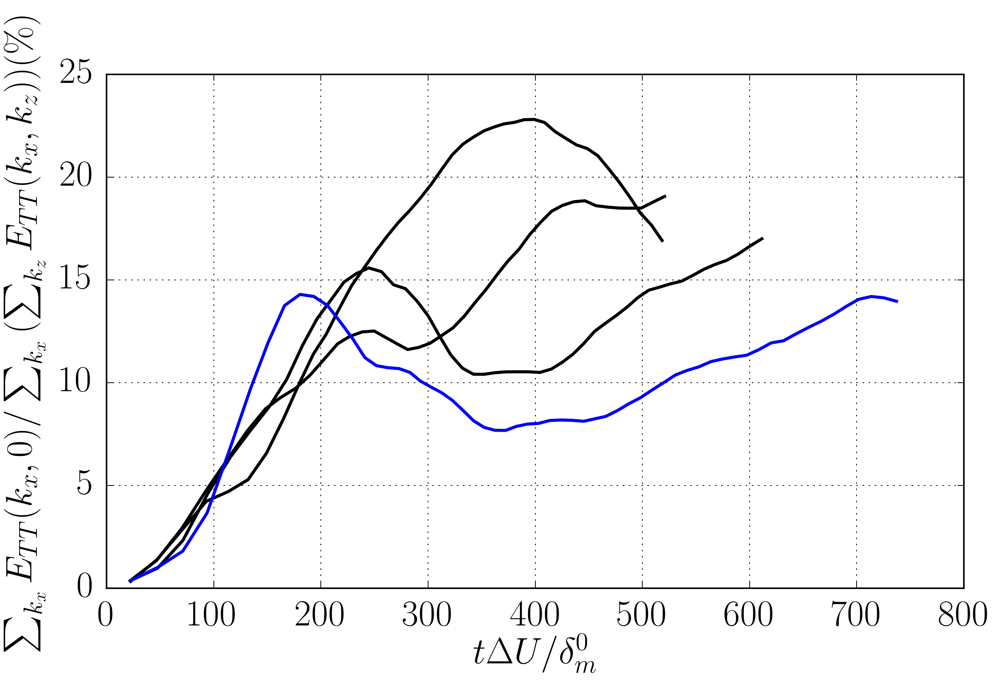

In [656]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=1;
variable=11
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_x}{E_{TT}(k_x,0)}/\sum_{k_x}{(\sum_{k_z}{E_{TT}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'kk'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(njobs):
    print "ijob=%s"%ijob
    #print vplanes[ijob]
    path = p_folders[ijob]
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,fun1,fun2] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,variable,sumaxis)
    itmax = where(time>=SS2j[ijob])[0][0]
    plt.plot(time[:itmax],(fun1/fun2)[0:itmax]*100,l_job_style[ijob/3],lw=2.0)

In [646]:
print SS2

[350, 370, 400, 420.0, 420, 420, 500, 500, 500, 660, 600, 680]


ijob=0
ijob=1
ijob=2
ijob=3
ijob=4
ijob=5
ijob=6
ijob=7
ijob=8
ijob=9
ijob=10
ijob=11


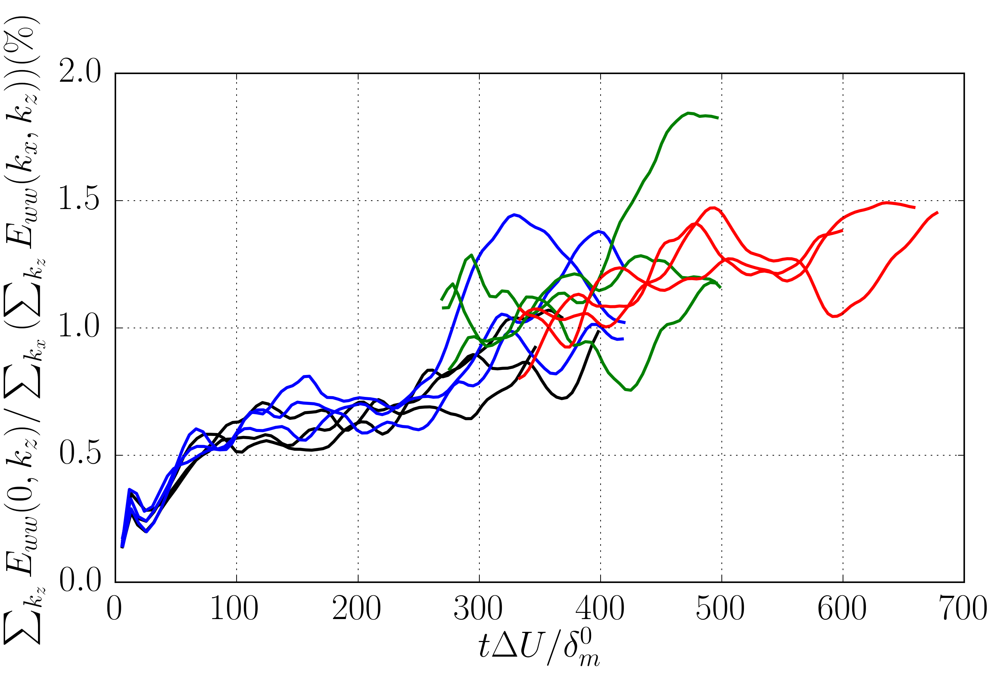

In [644]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=0;
variable=2
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_z}{E_{ww}(0,k_z)}/\sum_{k_x}{(\sum_{k_z}{E_{ww}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'kk'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(njobs):
    print "ijob=%s"%ijob
    #print vplanes[ijob]
    path = p_folders[ijob]
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,fun1,fun2] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,variable,sumaxis)
    itmax = where(time>=SS2[ijob])[0][0]
    plt.plot(time[:itmax],(fun1/fun2)[0:itmax]*100,l_job_style[ijob/3],lw=2.0)

ijob=0
ijob=1
ijob=2
ijob=3
ijob=4
ijob=5
ijob=6
ijob=7
ijob=8
ijob=9
ijob=10
ijob=11


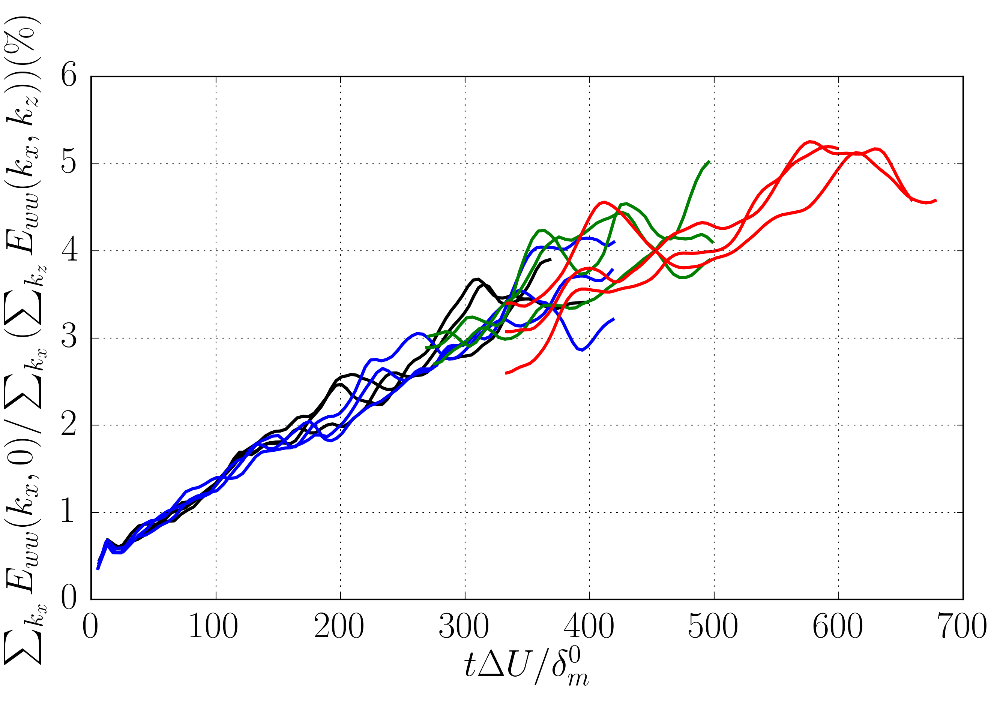

In [645]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
sumaxis=1;
variable=2
#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_x}{E_{ww}(k_x,0)}/\sum_{k_x}{(\sum_{k_z}{E_{ww}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'kk'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(njobs):
    print "ijob=%s"%ijob
    #print vplanes[ijob]
    path = p_folders[ijob]
    with h5py.File(path,"r") as f:
        y=np.array(f['y'])
    [kx,kz,time,fun1,fun2] = integralSpectravstime(p_folders_spe[ijob],vplanes[ijob],y,variable,sumaxis)
    itmax = where(time>=SS2[ijob])[0][0]
    plt.plot(time[:itmax],(fun1/fun2)[0:itmax]*100,l_job_style[ijob/3],lw=2.0)

In [631]:
print p_folders[9]

/share/drive/toni/Re160s80/case1/y2/h5.stats


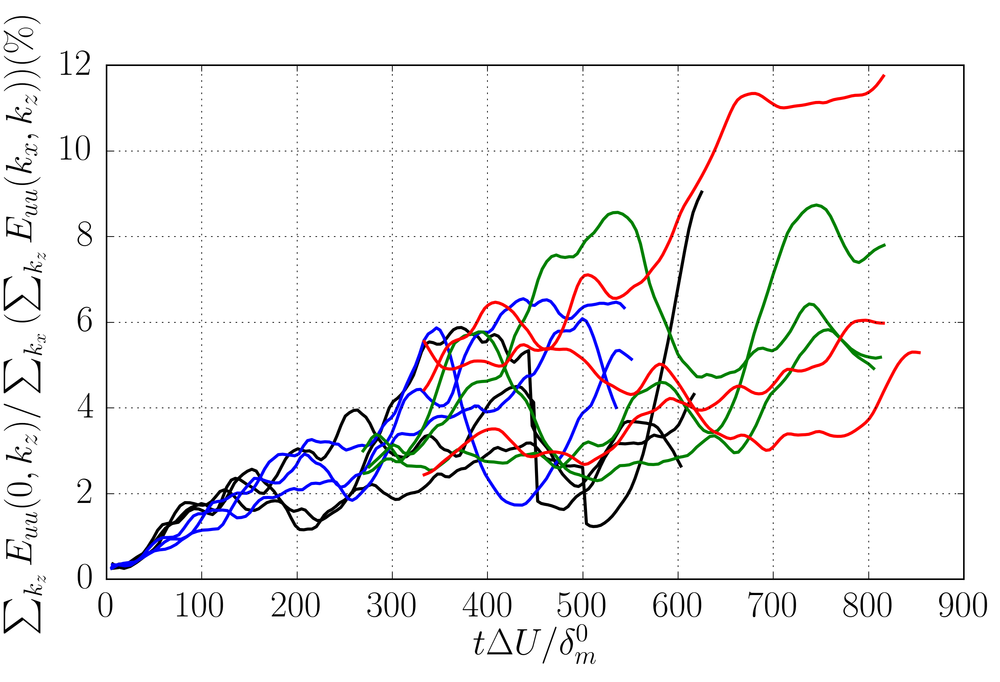

In [69]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)

#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_z}{E_{uu}(0,k_z)}/\sum_{k_x}{(\sum_{k_z}{E_{uu}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'kk'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(njobs):
    [kx,kz,time,fun1,fun2,fun3] = getSpectravstime(p_folders_spe[ijob],-1,0)
    #print fun1-time
    #print ycases[icase], fSS[icase]
    #plt.plot(time,np.divide(fun1,fun2),l_job_style[ijob/3],lw=2.0)
    plt.plot(time,fun1/fun2*100,l_job_style[ijob/3],lw=2.0)
    #plt.plot(time,fun2,l_job_style[ijob/3],lw=1.0)
    #plt.fill_between(ycases[icase][0], np.sqrt(fSS[icase]-errorSS[icase]), np.sqrt(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

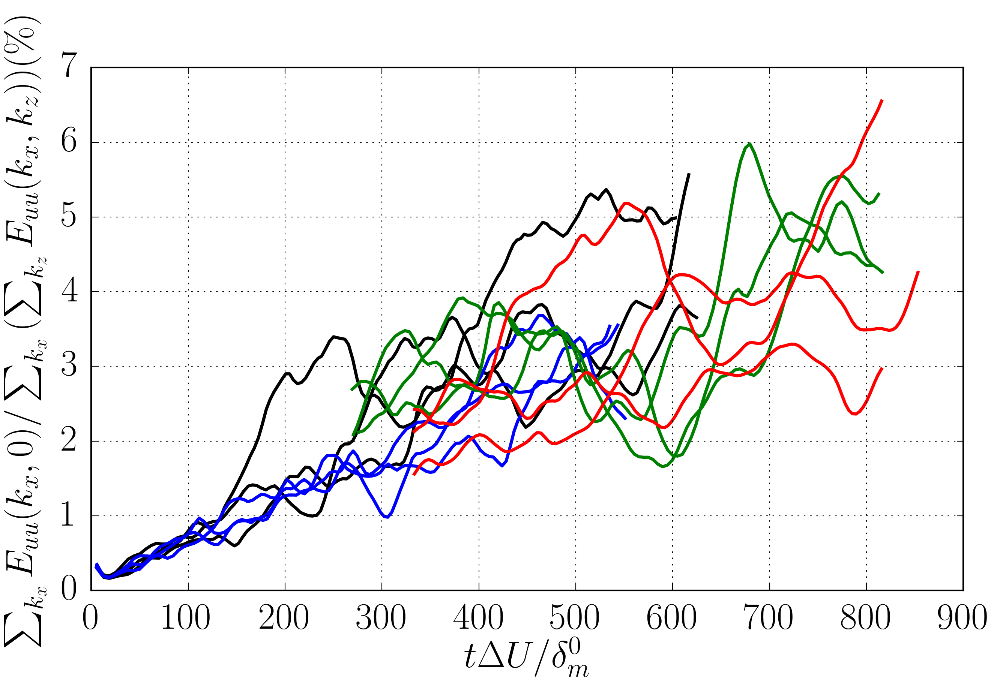

In [71]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)

#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_x}{E_{uu}(k_x,0)}/\sum_{k_x}{(\sum_{k_z}{E_{uu}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'kk'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(njobs):
    [kx,kz,time,fun1,fun2,fun3] = getSpectrazvstime(p_folders_spe[ijob],-1,0)
    #print fun1-time
    #print ycases[icase], fSS[icase]
    #plt.plot(time,np.divide(fun1,fun2),l_job_style[ijob/3],lw=2.0)
    plt.plot(time,fun1/fun2*100,l_job_style[ijob/3],lw=2.0)
    #plt.plot(time,fun2,l_job_style[ijob/3],lw=1.0)
    #plt.fill_between(ycases[icase][0], np.sqrt(fSS[icase]-errorSS[icase]), np.sqrt(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

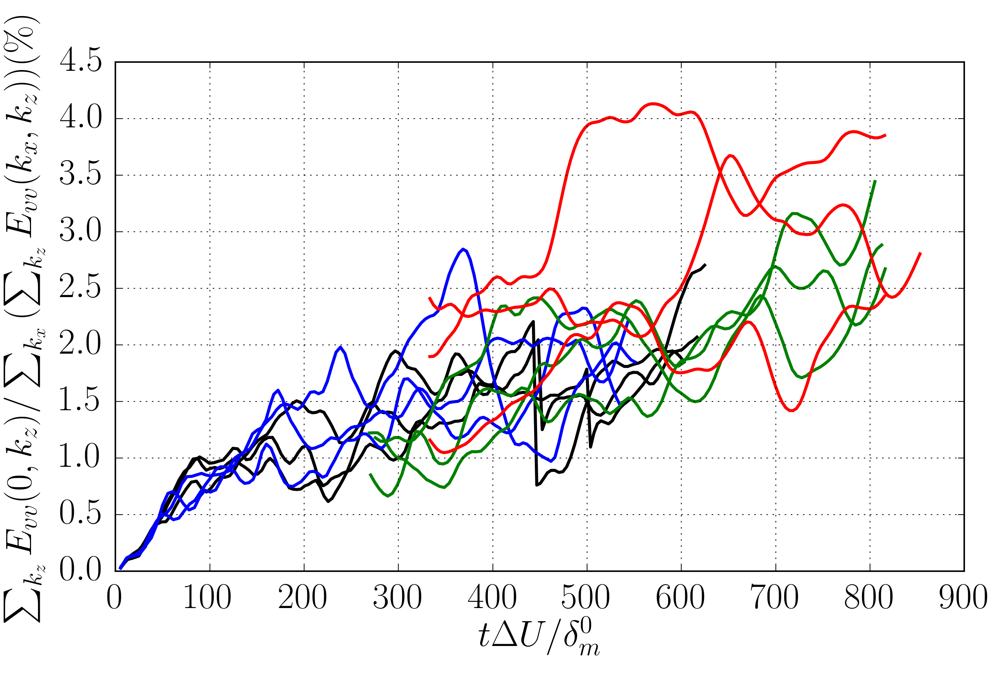

In [76]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)

#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_z}{E_{vv}(0,k_z)}/\sum_{k_x}{(\sum_{k_z}{E_{vv}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'kk'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(njobs):
    [kx,kz,time,fun1,fun2,fun3] = getSpectravstime(p_folders_spe[ijob],-1,1)
    #print fun1-time
    #print ycases[icase], fSS[icase]
    #plt.plot(time,np.divide(fun1,fun2),l_job_style[ijob/3],lw=2.0)
    plt.plot(time,fun1/fun2*100,l_job_style[ijob/3],lw=2.0)
    #plt.plot(time,fun2,l_job_style[ijob/3],lw=1.0)
    #plt.fill_between(ycases[icase][0], np.sqrt(fSS[icase]-errorSS[icase]), np.sqrt(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

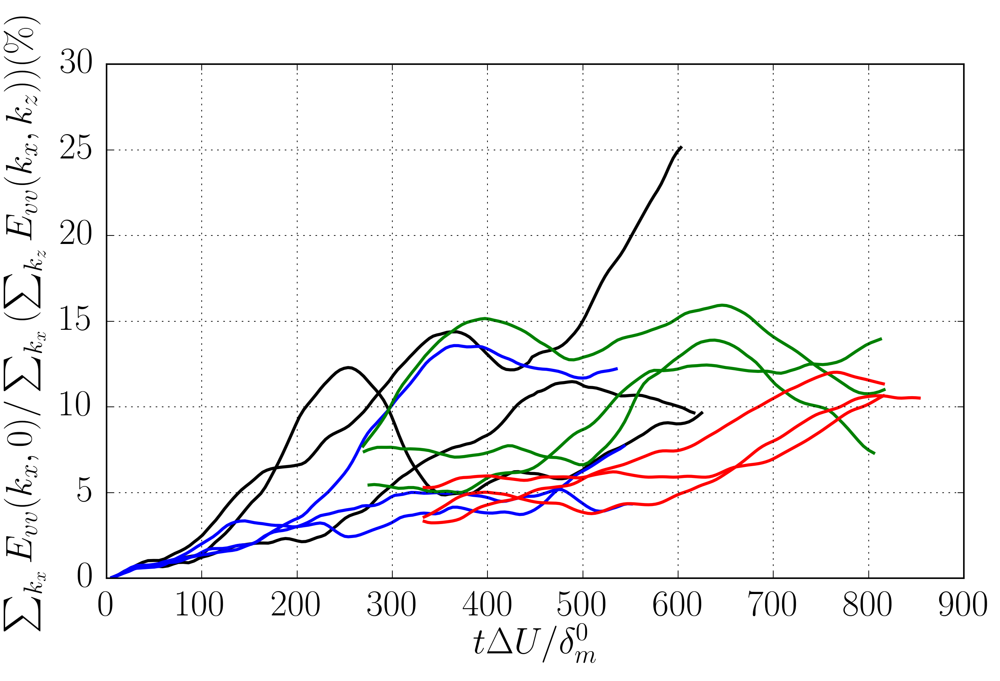

In [72]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)

#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_x}{E_{vv}(k_x,0)}/\sum_{k_x}{(\sum_{k_z}{E_{vv}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'kk'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(njobs):
    [kx,kz,time,fun1,fun2,fun3] = getSpectrazvstime(p_folders_spe[ijob],-1,1)
    #print fun1-time
    #print ycases[icase], fSS[icase]
    #plt.plot(time,np.divide(fun1,fun2),l_job_style[ijob/3],lw=2.0)
    plt.plot(time,fun1/fun2*100,l_job_style[ijob/3],lw=2.0)
    #plt.plot(time,fun2,l_job_style[ijob/3],lw=1.0)
    #plt.fill_between(ycases[icase][0], np.sqrt(fSS[icase]-errorSS[icase]), np.sqrt(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

In [74]:
print SS1

[230, 230, 210, 270.0, 270, 270, 340, 320, 340, 500, 500, 510]


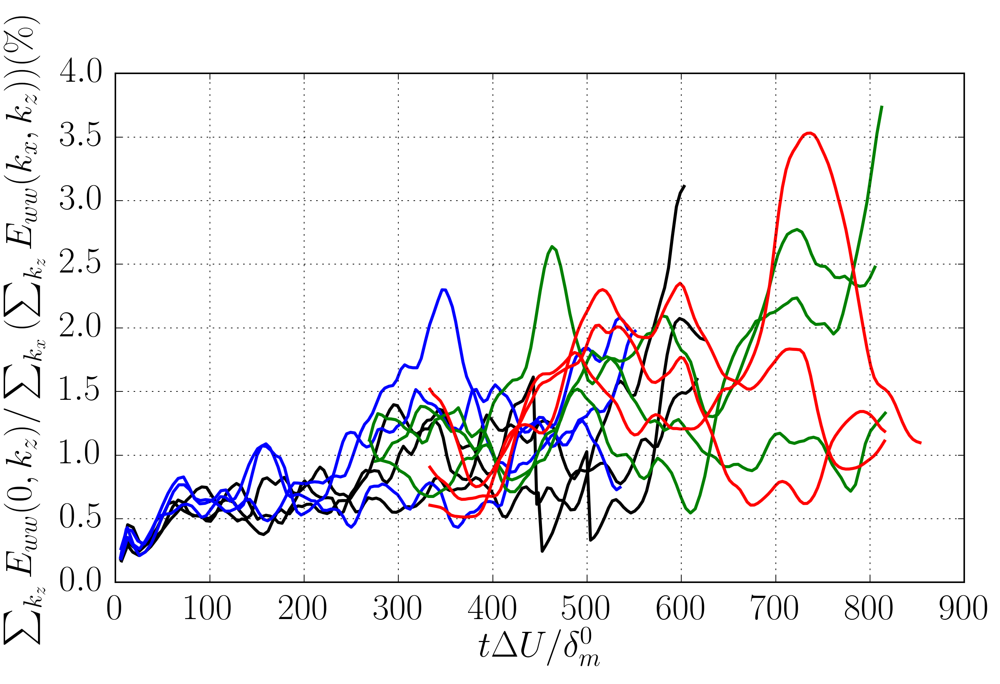

In [394]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)

#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_z}{E_{ww}(0,k_z)}/\sum_{k_x}{(\sum_{k_z}{E_{ww}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'kk'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(njobs):
    [kx,kz,time,fun1,fun2,fun3] = getSpectravstime(p_folders_spe[ijob],-1,2)
    #print fun1-time
    #print ycases[icase], fSS[icase]
    #plt.plot(time,np.divide(fun1,fun2),l_job_style[ijob/3],lw=2.0)
    plt.plot(time,fun1/fun2*100,l_job_style[ijob/3],lw=2.0)
    #plt.plot(time,fun2,l_job_style[ijob/3],lw=1.0)
    #plt.fill_between(ycases[icase][0], np.sqrt(fSS[icase]-errorSS[icase]), np.sqrt(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

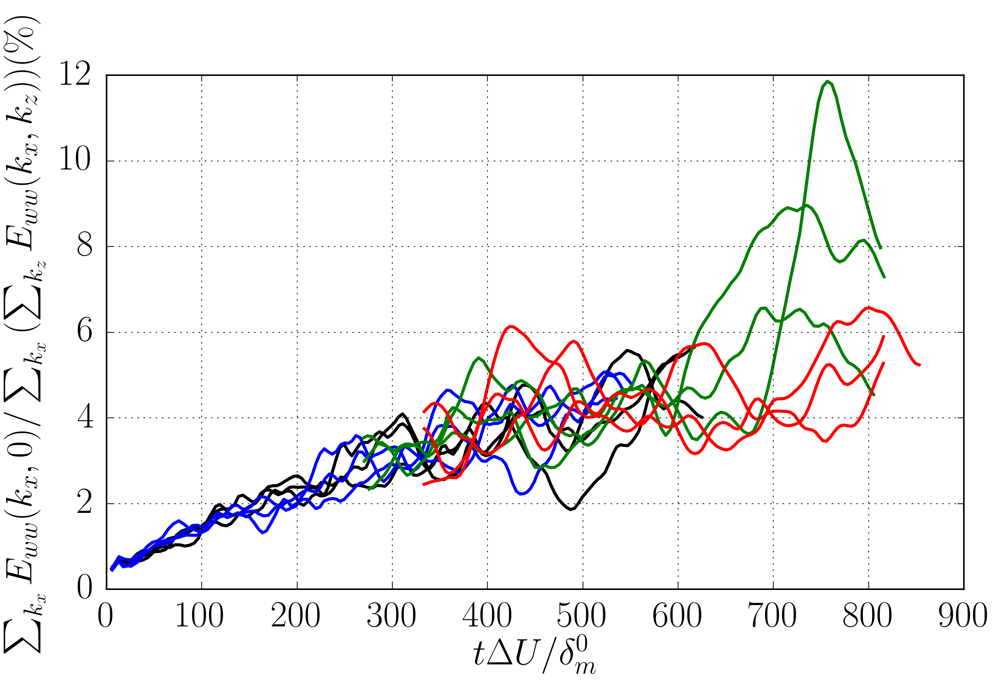

In [75]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)

#ax.set_xscale('log')
xlabel =r'$t \Delta U/\delta_m^0$'
ylabel =r'$\sum_{k_x}{E_{ww}(k_x,0)}/\sum_{k_x}{(\sum_{k_z}{E_{ww}(k_x,k_z)})} (\%) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'kk'
#plt.xlim([-6,10])
#plt.ylim([0.0,0.010])
plt.grid('on')
for ijob in range(njobs):
    [kx,kz,time,fun1,fun2,fun3] = getSpectrazvstime(p_folders_spe[ijob],-1,2)
    #print fun1-time
    #print ycases[icase], fSS[icase]
    #plt.plot(time,np.divide(fun1,fun2),l_job_style[ijob/3],lw=2.0)
    plt.plot(time,fun1/fun2*100,l_job_style[ijob/3],lw=2.0)
    #plt.plot(time,fun2,l_job_style[ijob/3],lw=1.0)
    #plt.fill_between(ycases[icase][0], np.sqrt(fSS[icase]-errorSS[icase]), np.sqrt(fSS[icase]+errorSS[icase]),color=l_job_color[icase],alpha=0.2)
    #ax.errorbar(ycases[icase][0],fSS[icase],yerr=errorSS[icase])

# One-dimensional spectra
From Pope:

$R_{11}(\mathbf{e_1 r_1},t) = \langle u_1^2 \rangle f(r_1,t)$

$R_{22}(\mathbf{e_1 r_1},t) = \langle u_2^2 \rangle g(r_1,t)$

Where f and g are the longitudinal and transverse autocorrelation functions.

$R_{22}(\mathbf{e_1} r_1) = \int_0^\infty E_{22}(k_1) cos(k_1 r_1) dk_1$.

And:

$R_{22}(0) = \langle u_2^2 \rangle= \int_0^\infty E_{22}(k_1)  dk_1$.

In order to obtain the 1D spectra from the 2D spectra, we need to sum all $\textit{z-modes}$ for each $\textit{x-mode}$ and viceversa.

For the integral scale we need to use this:

$L_{11} = \int_0^\infty f(r_1) dr_1 = \cfrac{\pi E_{11}(0)}{2\langle u_1^2 \rangle}$.

In [176]:
def getspectra(path,variable):
    """
    Obtain the spectra for dimension 0 (x) of 1 (z)
    """
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        kx = np.array(f['kx'])
        kz = np.array(f['kz'])
        mx = len(kx)-1;
        mz = len(kz)-1;
        funSPE = np.array(f['SPEC'][:,variable,:,:]);
        #The last distance being half of the box length
    #Clean the 00 mode, we want to analyze perturbations,not velocities.
    mode00 = np.zeros([len(time)])
    for tt in range(len(time)):
        mode00[tt]=funSPE[0,0,tt]
        funSPE[0,0,tt] = 0.0

    #Spectra has already been myltiplied by dkxdkz
   
    Eiik1=np.zeros([len(kx),len(time)])
    for kkx,ii in zip(kx,range(len(kx))):
        for kkz,jj in zip(kz,range(len(kz))):
            kk = (kkx**2+kkz**2)**0.5
            #Eiik1[ii,:]= Eiik1[ii,:]+1.0/(2*3.1416*kk**2)*(1.0-(kkx**2/kk**2))*funSPE[jj,ii,:]
            Eiik1[ii,:]+=funSPE[jj,ii,:]
    #Now we have Eii(k1)
    Eiik3=np.zeros([len(kz),len(time)])
    for kkz,jj in zip(kz,range(len(kz))):
        for kkx,ii in zip(kx,range(len(kx))):
                #kk = (kkx**2+kkz**2)**0.5
            Eiik3[jj,:]+=funSPE[jj,ii,:]
    #Now we have Eii(k1)
        #Scaling    
    return kx,kz,time,Eiik1,Eiik3,mode00

446.245697021
508.307434082
526.492126465
508.721954346
513.607421875
494.73626709
477.856719971
464.865936279
613.973876953
617.928222656
493.140075684
521.137084961
734.974243164
608.504943848
668.321716309
639.152770996


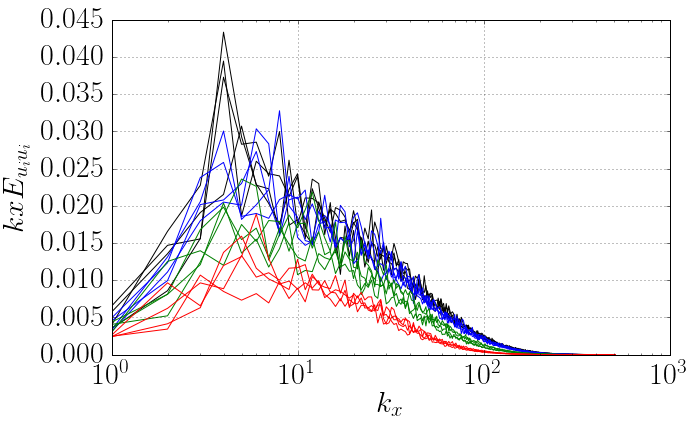

In [177]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)

#ax.set_xscale('log')
xlabel =r'$k_x$'
ylabel =r'$kxE_{u_iu_i} $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'kk'
#plt.xlim([-6,10])
#plt.ylim([-0.5,1])
plt.grid('on')
plt.xscale('log')
#dw_f = 45 dw_0
for ijob in range(0,16):
    imid = len(p_folders_spe[ijob])/2
    [kx,kz,time,Ex,Ez,f00] = getspectra(p_folders_spe[ijob][imid],0)
    [kx,kz,time,Ex2,Ez2,f002] = getspectra(p_folders_spe[ijob][imid],1)
    [kx,kz,time,Ex3,Ez3,f003] = getspectra(p_folders_spe[ijob][imid],2)
    ilim = where(time>SS2j[ijob])[0][0]-1
    #plt.plot(xvect,Rii[:,0])
    plt.plot(kx/kx[1],kx*(Ex[:,ilim]+Ex2[:,ilim]+Ex3[:,ilim])/kx[1],l_job_style[ijob/4])
    print time[ilim]
    


total of runs = 4
508.721954346
total of runs = 4
464.865936279
total of runs = 4
521.137084961
total of runs = 4
639.152770996
figure /share/drive/toni/VDML/JFM_201706/spec1Dux.pdf saved!


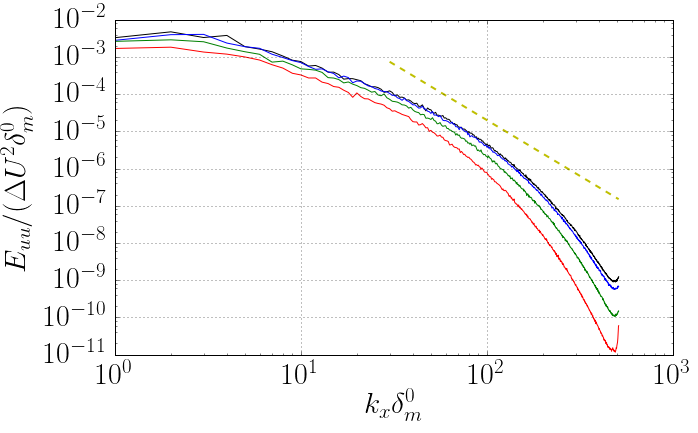

In [185]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname='spec1Dux'
#ax.set_xscale('log')
xlabel =r'$k_x \delta_m^0$'
ylabel =r'$E_{uu}/(\Delta U^2 \delta_m^0) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
#plt.xlim([-6,10])
#plt.ylim([-0.5,1])
plt.grid('on')
plt.xscale('log')
plt.yscale('log')
#dw_f = 45 dw_0

for icase in range(0,ncases):
    ii = 0
    for ijob in lcases[icase]:
        imid = len(p_folders_spe[ijob])/2
        [kx,kz,time,Ex,Ez,f00] = getspectra(p_folders_spe[ijob][imid],0)
        if ii ==0:
            Ekk = np.zeros(len(Ex[:,1]))
    #[kx,kz,time,Ex2,Ez2,f002] = getspectra(p_folders_spe[ijob][imid],1)
    #[kx,kz,time,Ex3,Ez3,f003] = getspectra(p_folders_spe[ijob][imid],2)
        ilim = where(time>SS2j[ijob])[0][0]-1
        Ekk = Ekk + Ex[:,ilim]
        ii += 1
    #plt.plot(xvect,Rii[:,0])
    print "total of runs = %s"%ii
    plt.plot(kx/kx[1],Ekk/ii,l_job_style[icase])
    print time[ilim]
plt.plot(kx[30:]/kx[1],20*(kx[30:]/kx[1])**(-5/2),'y--',lw=2.0)  
if PRINT == True:
    
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')

total of runs = 4
508.721954346
total of runs = 4
464.865936279
total of runs = 4
521.137084961
total of runs = 4
639.152770996
figure /share/drive/toni/VDML/JFM_201706/spec1Dvx.pdf saved!


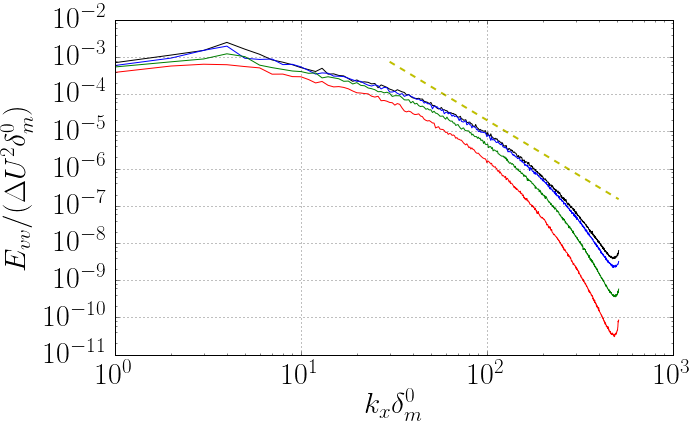

In [186]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname='spec1Dvx'
#ax.set_xscale('log')
xlabel =r'$k_x \delta_m^0$'
ylabel =r'$E_{vv}/(\Delta U^2 \delta_m^0) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
#plt.xlim([-6,10])
#plt.ylim([-0.5,1])
plt.grid('on')
plt.xscale('log')
plt.yscale('log')
#dw_f = 45 dw_0
for icase in range(0,ncases):
    ii = 0
    for ijob in lcases[icase]:
        imid = len(p_folders_spe[ijob])/2
        [kx,kz,time,Ex,Ez,f00] = getspectra(p_folders_spe[ijob][imid],1)
        if ii ==0:
            Ekk = np.zeros(len(Ex[:,1]))
    #[kx,kz,time,Ex2,Ez2,f002] = getspectra(p_folders_spe[ijob][imid],1)
    #[kx,kz,time,Ex3,Ez3,f003] = getspectra(p_folders_spe[ijob][imid],2)
        ilim = where(time>SS2j[ijob])[0][0]-1
        Ekk = Ekk + Ex[:,ilim]
        ii += 1
    #plt.plot(xvect,Rii[:,0])
    print "total of runs = %s"%ii
    plt.plot(kx/kx[1],Ekk/ii,l_job_style[icase])
    print time[ilim]
plt.plot(kx[30:]/kx[1],20*(kx[30:]/kx[1])**(-5/2),'y--',lw=2.0)  
if PRINT == True:
    
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')

total of runs = 4
508.721954346
total of runs = 4
464.865936279
total of runs = 4
521.137084961
total of runs = 4
639.152770996
figure /share/drive/toni/VDML/JFM_201706/spec1DTx.pdf saved!


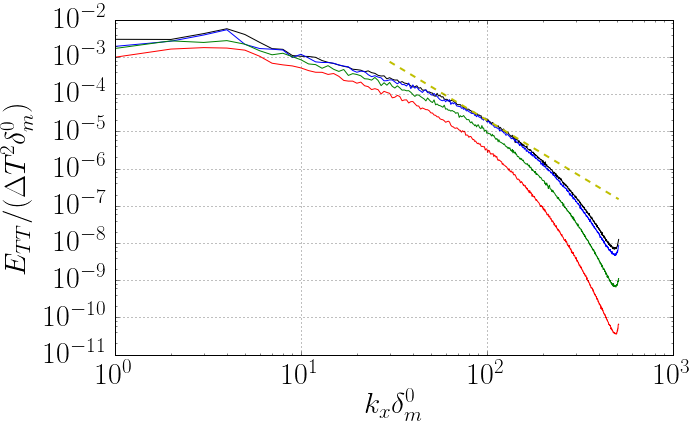

In [187]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname='spec1DTx'
#ax.set_xscale('log')
xlabel =r'$k_x \delta_m^0$'
ylabel =r'$E_{TT}/(\Delta T^2 \delta_m^0) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
#plt.xlim([-6,10])
#plt.ylim([-0.5,1])
plt.grid('on')
plt.xscale('log')
plt.yscale('log')
#dw_f = 45 dw_0
for icase in range(0,ncases):
    ii = 0
    for ijob in lcases[icase]:
        imid = len(p_folders_spe[ijob])/2
        [kx,kz,time,Ex,Ez,f00] = getspectra(p_folders_spe[ijob][imid],11)
        if ii ==0:
            Ekk = np.zeros(len(Ex[:,1]))
    #[kx,kz,time,Ex2,Ez2,f002] = getspectra(p_folders_spe[ijob][imid],1)
    #[kx,kz,time,Ex3,Ez3,f003] = getspectra(p_folders_spe[ijob][imid],2)
        ilim = where(time>SS2j[ijob])[0][0]-1
        Ekk = Ekk + Ex[:,ilim]
        ii += 1
    #plt.plot(xvect,Rii[:,0])
    print "total of runs = %s"%ii
    plt.plot(kx/kx[1],Ekk/ii/vDT[icase]**2,l_job_style[icase])
    print time[ilim]
plt.plot(kx[30:]/kx[1],20*(kx[30:]/kx[1])**(-5/2),'y--',lw=2.0)  
if PRINT == True:
    
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')

total of runs = 4
508.721954346
total of runs = 4
464.865936279
total of runs = 4
521.137084961
total of runs = 4
639.152770996
figure /share/drive/toni/VDML/JFM_201706/spec1DTz.pdf saved!


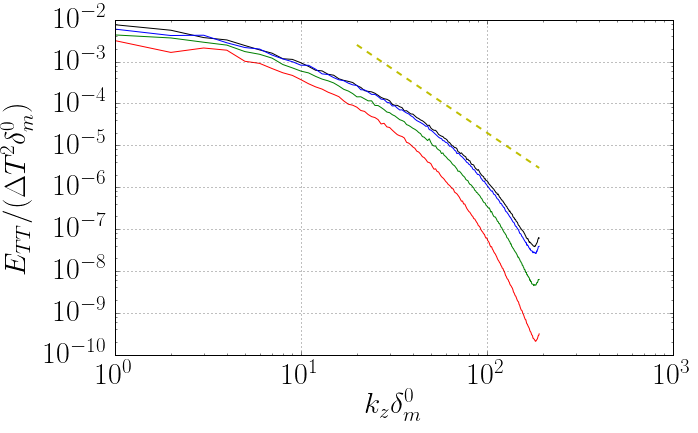

In [189]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname='spec1DTz'
#ax.set_xscale('log')
xlabel =r'$k_z \delta_m^0$'
ylabel =r'$E_{TT}/(\Delta T^2 \delta_m^0) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
#plt.xlim([-6,10])
#plt.ylim([-0.5,1])
plt.grid('on')
plt.xscale('log')
plt.yscale('log')
#dw_f = 45 dw_0
for icase in range(0,ncases):
    ii = 0
    for ijob in lcases[icase]:
        imid = len(p_folders_spe[ijob])/2
        [kx,kz,time,Ex,Ez,f00] = getspectra(p_folders_spe[ijob][imid],11)
        if ii ==0:
            Ekk = np.zeros(len(Ez[:,1]))
    #[kx,kz,time,Ex2,Ez2,f002] = getspectra(p_folders_spe[ijob][imid],1)
    #[kx,kz,time,Ex3,Ez3,f003] = getspectra(p_folders_spe[ijob][imid],2)
        ilim = where(time>SS2j[ijob])[0][0]-1
        Ekk = Ekk + Ez[:,ilim]
        ii += 1
    #plt.plot(xvect,Rii[:,0])
    print "total of runs = %s"%ii
    plt.plot(kz/kz[1],Ekk/ii/vDT[icase]**2,l_job_style[icase])
    print time[ilim]
plt.plot(kz[20:]/kz[1],20*(kz[20:]/kz[1])**(-5/2),'y--',lw=2.0) 
if PRINT == True:
    
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')

total of runs = 4
508.721954346
total of runs = 4
464.865936279
total of runs = 4
521.137084961
total of runs = 4
639.152770996
figure /share/drive/toni/VDML/JFM_201706/spec1Duz.pdf saved!


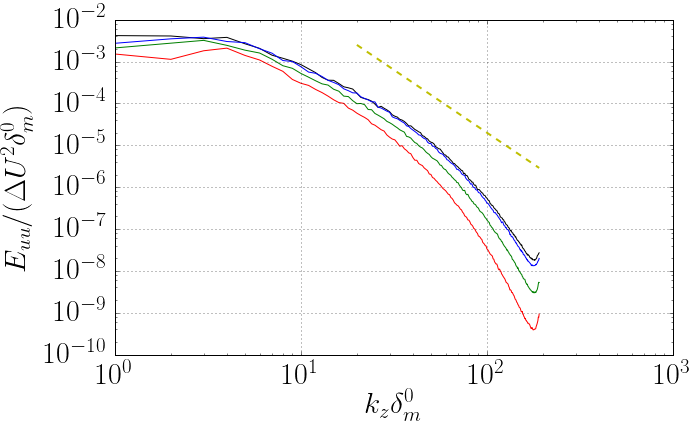

In [191]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname='spec1Duz'
#ax.set_xscale('log')
xlabel =r'$k_z \delta_m^0$'
ylabel =r'$E_{uu}/(\Delta U^2 \delta_m^0) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
#plt.xlim([-6,10])
#plt.ylim([-0.5,1])
plt.grid('on')
plt.xscale('log')
plt.yscale('log')
#dw_f = 45 dw_0
for icase in range(0,ncases):
    ii = 0
    for ijob in lcases[icase]:
        imid = len(p_folders_spe[ijob])/2
        [kx,kz,time,Ex,Ez,f00] = getspectra(p_folders_spe[ijob][imid],0)
        if ii ==0:
            Ekk = np.zeros(len(Ez[:,1]))
    #[kx,kz,time,Ex2,Ez2,f002] = getspectra(p_folders_spe[ijob][imid],1)
    #[kx,kz,time,Ex3,Ez3,f003] = getspectra(p_folders_spe[ijob][imid],2)
        ilim = where(time>SS2j[ijob])[0][0]-1
        Ekk = Ekk + Ez[:,ilim]
        ii += 1
    #plt.plot(xvect,Rii[:,0])
    print "total of runs = %s"%ii
    plt.plot(kz/kz[1],Ekk/ii,l_job_style[icase])
    print time[ilim]
plt.plot(kz[20:]/kz[1],20*(kz[20:]/kz[1])**(-5/2),'y--',lw=2.0) 
if PRINT == True:
    
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')

total of runs = 4
508.721954346
total of runs = 4
464.865936279
total of runs = 4
521.137084961
total of runs = 4
639.152770996
figure /share/drive/toni/VDML/JFM_201706/spec1Dvz.pdf saved!


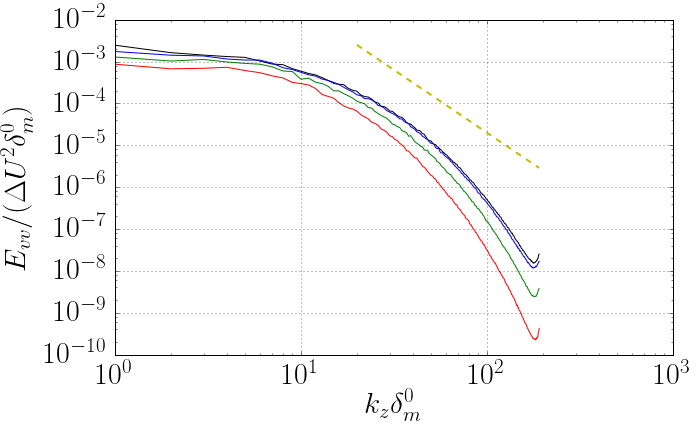

In [192]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname='spec1Dvz'
#ax.set_xscale('log')
xlabel =r'$k_z \delta_m^0$'
ylabel =r'$E_{vv}/(\Delta U^2 \delta_m^0) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
#plt.xlim([-6,10])
#plt.ylim([-0.5,1])
plt.grid('on')
plt.xscale('log')
plt.yscale('log')
#dw_f = 45 dw_0
for icase in range(0,ncases):
    ii = 0
    for ijob in lcases[icase]:
        imid = len(p_folders_spe[ijob])/2
        [kx,kz,time,Ex,Ez,f00] = getspectra(p_folders_spe[ijob][imid],1)
        if ii ==0:
            Ekk = np.zeros(len(Ez[:,1]))
    #[kx,kz,time,Ex2,Ez2,f002] = getspectra(p_folders_spe[ijob][imid],1)
    #[kx,kz,time,Ex3,Ez3,f003] = getspectra(p_folders_spe[ijob][imid],2)
        ilim = where(time>SS2j[ijob])[0][0]-1
        Ekk = Ekk + Ez[:,ilim]
        ii += 1
    #plt.plot(xvect,Rii[:,0])
    print "total of runs = %s"%ii
    plt.plot(kz/kz[1],Ekk/ii,l_job_style[icase])
    print time[ilim]
plt.plot(kz[20:]/kz[1],20*(kz[20:]/kz[1])**(-5/2),'y--',lw=2.0) 
if PRINT == True:
    
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')

In [193]:
def getRiivstime(path,variable,Npoints=200):
    """
    Obtain the correlation from spectra
    """
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        kx = np.array(f['kx'])
        kz = np.array(f['kz'])
        mx = len(kx)-1;
        mz = len(kz)-1;
        funSPE = np.array(f['SPEC'][:,variable,:,:]);
        #The last distance being half of the box length
    #Clean the 00 mode, we want to analyze perturbations,not velocities.
    mode00 = np.zeros([len(time)])
    for tt in range(len(time)):
        mode00[tt]=funSPE[0,0,tt]
        funSPE[0,0,tt] = 0.0
    xmax=np.pi/kx[1]
        #Define a vector x
    xvect = np.linspace(0,xmax,Npoints);
        #discretization integral factor
        #int(f(x)) = fact*sum(f(x_i))
    #Spectra has already been myltiplied by dkxdkz
    #fact=1
    #Riix = np.zeros([Npoints,len(time)],dtype=complex)
    Riix = np.zeros([Npoints,len(time)])
    Eiik1=np.zeros([len(kx),len(time)])
    
    for kkx,ii in zip(kx,range(len(kx))):
        for kkz,jj in zip(kz,range(len(kz))):
            kk = (kkx**2+kkz**2)**0.5
            #Eiik1[ii,:]= Eiik1[ii,:]+1.0/(2*3.1416*kk**2)*(1.0-(kkx**2/kk**2))*funSPE[jj,ii,:]
            Eiik1[ii,:]+=funSPE[jj,ii,:]
    #Now we have Eii(k1)
    for i in range(Npoints):   
        for kkx,ii in zip(kx,range(len(kx))):
            Riix[i,:] += Eiik1[ii,:]*cos(kkx*xvect[i])
        #Scaling    
    
    Riix=Riix/Riix[0,:]

    dk1=kx[-1]/(len(kx)-1)
    Lii = np.pi*(Eiik1[0,:])/(2*Riix[0,:])/dk1
    #Lii = np.pi*(Eiik1[0,:]+mode00)/(2*Riix[0,:])
    print Eiik1[0,-1],Riix[0,-1]
    #fun00 = funSPE[0,0,:]
        
    #funkx0  = np.sum(funSPE[1:,1,:],axis=0)
    #res=time*0.0
    #for kk,ii in  zip(kx[1:],range(1,len(kx))):
    #    res += np.sum(funSPE[1:,ii,:],axis=0)
    #funRest = res
    return kx,kz,time,xvect,Riix,Riix[0,:],Lii

In [194]:
def getRiizvstime(path,variable,Npoints=100):
    """
    Obtain the correlation from spectra
    """
    with h5py.File(path,"r") as f:
        time = np.array(f['time']);
        kx = np.array(f['kx'])
        kz = np.array(f['kz'])
        mx = len(kx)-1;
        mz = len(kz)-1;
        funSPE = np.array(f['SPEC'][:,variable,:,:]);
        #The last distance being half of the box length
    #Clean the 00 mode, we want to analyze perturbations,not velocities.
    mode00 = np.zeros([len(time)])
    for tt in range(len(time)):
        mode00[tt]=funSPE[0,0,tt]
        funSPE[0,0,tt] = 0.0
    zmax=np.pi/kz[1]
        #Define a vector x
    zvect = np.linspace(0,zmax,Npoints);
        #discretization integral factor
        #int(f(x)) = fact*sum(f(x_i))
    #Spectra has already been myltiplied by dkxdkz
    #fact=1
    #Riix = np.zeros([Npoints,len(time)],dtype=complex)
    Riiz = np.zeros([Npoints,len(time)])
    Eiik3=np.zeros([len(kz),len(time)])
    
    
    for kkz,jj in zip(kz,range(len(kz))):
        for kkx,ii in zip(kx,range(len(kx))):
            #kk = (kkx**2+kkz**2)**0.5
            #Eiik1[ii,:]= Eiik1[ii,:]+1.0/(2*3.1416*kk**2)*(1.0-(kkx**2/kk**2))*funSPE[jj,ii,:]
            Eiik3[jj,:]+=funSPE[jj,ii,:]
    #Now we have Eii(k1)
    for i in range(Npoints):   
        for kkz,jj in zip(kz,range(len(kz))):
            Riiz[i,:] += Eiik3[jj,:]*cos(kkz*zvect[i])
        #Scaling    
    
    Riiz=Riiz/Riiz[0,:]

    dk3=kz[-1]/(len(kz)-1)
    Lii = np.pi*(Eiik3[0,:])/(2*Riiz[0,:])/dk3
    #Lii = np.pi*(Eiik1[0,:]+mode00)/(2*Riix[0,:])
    print Eiik3[0,-1],Riiz[0,-1]
    #fun00 = funSPE[0,0,:]
        
    #funkx0  = np.sum(funSPE[1:,1,:],axis=0)
    #res=time*0.0
    #for kk,ii in  zip(kx[1:],range(1,len(kx))):
    #    res += np.sum(funSPE[1:,ii,:],axis=0)
    #funRest = res
    return kx,kz,time,zvect,Riiz,Riiz[0,:],Lii

In [195]:
l_job_style=['k','b','g','r']

In [196]:
imid = len(p_folders_spe[1])/2
print p_folders_spe[1][imid]

/share/drive/toni/VDML/s10/03/h5.mid.spes


0.00727099598975 1.0
446.245697021
0.00268015126521 1.0
508.307434082
0.00289039529011 1.0
526.492126465
0.00326056809759 1.0
508.721954346
0.00357261719381 1.0
513.607421875
0.00254329552716 1.0
494.73626709
0.0013374636428 1.0
477.856719971
0.000698282497357 1.0
464.865936279
0.000529407064156 1.0
613.973876953
0.00102259167949 1.0
617.928222656
0.00193512696551 1.0
493.140075684
0.00194088786005 1.0
521.137084961
0.000662248162327 1.0
734.974243164
0.000484827288466 1.0
608.504943848
0.00153386595008 1.0
668.321716309
0.000792928459255 1.0
639.152770996
figure /share/drive/toni/VDML/JFM_201706/kk.pdf saved!


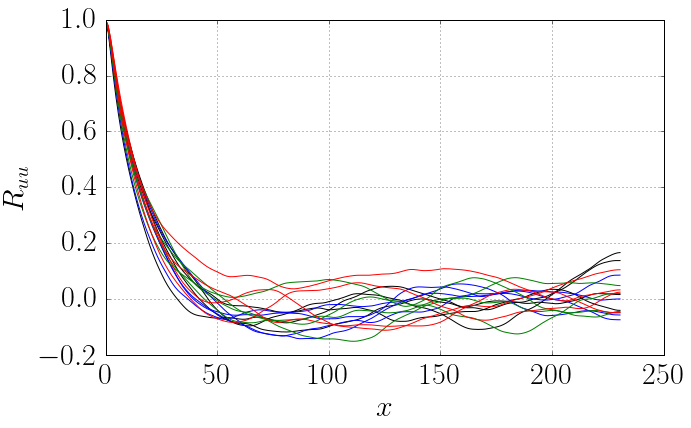

In [197]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname = 'Ruu_all'
#ax.set_xscale('log')
xlabel =r'$x$'
ylabel =r'$R_{uu} $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'kk'
#plt.xlim([-6,10])
plt.ylim([-0.2,1])
plt.grid('on')
#dw_f = 45 dw_0
for ijob in range(0,16):
    imid = len(p_folders_spe[ijob])/2
    [kx,kz,time,xvect,Rii,Rii0,L11] = getRiivstime(p_folders_spe[ijob][imid],0)
    #ilim1 = where(time>SS1j[ijob])[0][0]
    ilim = where(time>SS2j[ijob])[0][0]-1
    #plt.plot(xvect,Rii[:,0])
    plt.plot(xvect,Rii[:,ilim],l_job_style[ijob/4])
    print time[ilim]
    
if PRINT == True:
    
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')



In [198]:
print lcases[1]

[4, 5, 6, 7]


0
0
15
0.00727099598975 1.0
1
15
0.00268015126521 1.0
2
15
0.00289039529011 1.0
3
15
0.00326056809759 1.0
519.814025879
1
4
15
0.00357261719381 1.0
5
15
0.00254329552716 1.0
6
15
0.0013374636428 1.0
7
15
0.000698282497357 1.0
511.160491943
2
8
15
0.000529407064156 1.0
9
15
0.00102259167949 1.0
10
15
0.00193512696551 1.0
11
15
0.00194088786005 1.0
615.180175781
3
12
15
0.000662248162327 1.0
13
15
0.000484827288466 1.0
14
15
0.00153386595008 1.0
15
15
0.000792928459255 1.0
739.68560791
figure /share/drive/toni/VDML/JFM_201706/rhou_case.pdf saved!


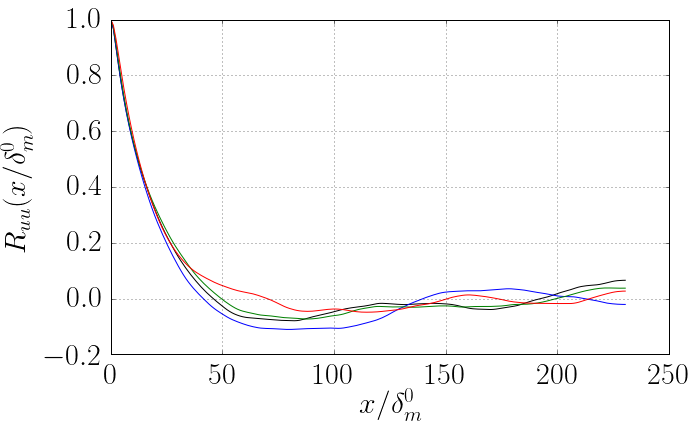

In [206]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname = 'rhou_case'
#ax.set_xscale('log')
xlabel =r'$x/\delta_m^0$'
ylabel =r'$R_{uu}(x/\delta_m^0) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
#plt.xlim([-6,10])
plt.ylim([-0.2,1])
plt.grid('on')
#dw_f = 45 dw_0
for icase in range(ncases):
    print icase
    icount = 0
    for ijob in lcases[icase]:
        print ijob
        imid = len(p_folders_spe[ijob])/2
        print imid
        [kx,kz,time,xvect,Rii,Rii0,L11] = getRiivstime(p_folders_spe[ijob][imid],0)
        if icount == 0:
            Riimean=np.zeros(len(xvect))
        ilim = where(time>SS2[icase])[0][0]-1
        Riimean += Rii[:,ilim]
        icount += 1
        #plt.plot(xvect,Rii[:,0])
    plt.plot(xvect,Riimean/4,l_job_style[ijob/4])
    print time[ilim]
if PRINT == True: 
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')   


0
0
15
0.00580213114108 1.0
1
15
0.00341120077508 1.0
2
15
0.0013495619073 1.0
3
15
0.000995575799002 1.0
519.814025879
1
4
15
0.000686990828807 1.0
5
15
0.000446822456735 1.0
6
15
0.000403221287177 1.0
7
15
0.000731538425849 1.0
511.160491943
2
8
15
0.00334146177547 1.0
9
15
0.00984659874589 1.0
10
15
0.00540264340651 1.0
11
15
0.00416226795629 1.0
615.180175781
3
12
15
0.00535924188541 1.0
13
15
0.00530907824083 1.0
14
15
0.0106876880735 1.0
15
15
0.00759642375298 1.0
739.68560791
figure /share/drive/toni/VDML/JFM_201706/rhoT_case.pdf saved!


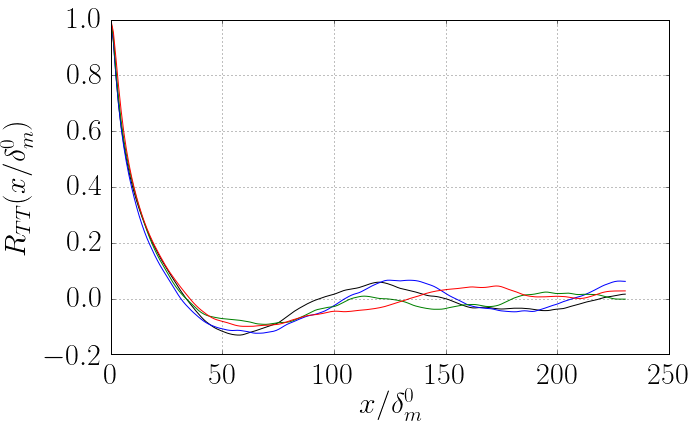

In [205]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname = 'rhoT_case'
#ax.set_xscale('log')
xlabel =r'$x/\delta_m^0$'
ylabel =r'$R_{TT}(x/\delta_m^0) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
#plt.xlim([-6,10])
plt.ylim([-0.2,1])
plt.grid('on')
#dw_f = 45 dw_0
for icase in range(ncases):
    print icase
    icount = 0
    for ijob in lcases[icase]:
        print ijob
        imid = len(p_folders_spe[ijob])/2
        print imid
        [kx,kz,time,xvect,Rii,Rii0,L11] = getRiivstime(p_folders_spe[ijob][imid],11)
        if icount == 0:
            Riimean=np.zeros(len(xvect))
        ilim = where(time>SS2[icase])[0][0]-1
        Riimean += Rii[:,ilim]
        icount += 1
        #plt.plot(xvect,Rii[:,0])
    plt.plot(xvect,Riimean/4,l_job_style[ijob/4])
    print time[ilim]
if PRINT == True: 
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')   


0
0
15
0.00674795795649 1.0
1
15
0.0131988405349 1.0
2
15
0.00448754229761 1.0
3
15
0.0059975198818 1.0
519.814025879
1
4
15
0.00965118801057 1.0
5
15
0.00174757977267 1.0
6
15
0.00952973861364 1.0
7
15
0.00635993100343 1.0
511.160491943
2
8
15
0.014658759447 1.0
9
15
0.0401018676788 1.0
10
15
0.0440041847144 1.0
11
15
0.00809500344451 1.0
615.180175781
3
12
15
0.0466169911842 1.0
13
15
0.0445803551454 1.0
14
15
0.096416131727 1.0
15
15
0.0845137491522 1.0
739.68560791
figure /share/drive/toni/VDML/JFM_201706/rhoT_z_case.pdf saved!


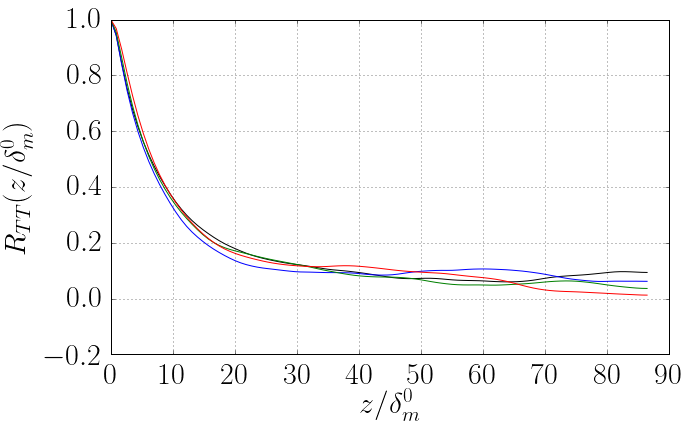

In [203]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname = 'rhoT_z_case'
#ax.set_xscale('log')
xlabel =r'$z/\delta_m^0$'
ylabel =r'$R_{TT}(z/\delta_m^0) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
#plt.xlim([-6,10])
plt.ylim([-0.2,1])
plt.grid('on')
#dw_f = 45 dw_0
for icase in range(ncases):
    print icase
    icount = 0
    for ijob in lcases[icase]:
        print ijob
        imid = len(p_folders_spe[ijob])/2
        print imid
        [kx,kz,time,xvect,Rii,Rii0,L11] = getRiizvstime(p_folders_spe[ijob][imid],11)
        if icount == 0:
            Riimean=np.zeros(len(xvect))
        ilim = where(time>SS2[icase])[0][0]-1
        Riimean += Rii[:,ilim]
        icount += 1
        #plt.plot(xvect,Rii[:,0])
    plt.plot(xvect,Riimean/4,l_job_style[ijob/4])
    print time[ilim]
if PRINT == True: 
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')   


0
0
15
0.00137395833192 1.0
1
15
0.00352948936088 1.0
2
15
0.00131207226696 1.0
3
15
0.00160303055151 1.0
519.814025879
1
4
15
0.00125480137687 1.0
5
15
0.000491230303172 1.0
6
15
0.00297235080044 1.0
7
15
0.00170944955216 1.0
511.160491943
2
8
15
0.00060653639194 1.0
9
15
0.00279180742356 1.0
10
15
0.00182378689551 1.0
11
15
0.000688720990661 1.0
615.180175781
3
12
15
0.000531981825478 1.0
13
15
0.00105044851603 1.0
14
15
0.0010008688623 1.0
15
15
0.000753321978269 1.0
739.68560791
figure /share/drive/toni/VDML/JFM_201706/rhou_z_case.pdf saved!


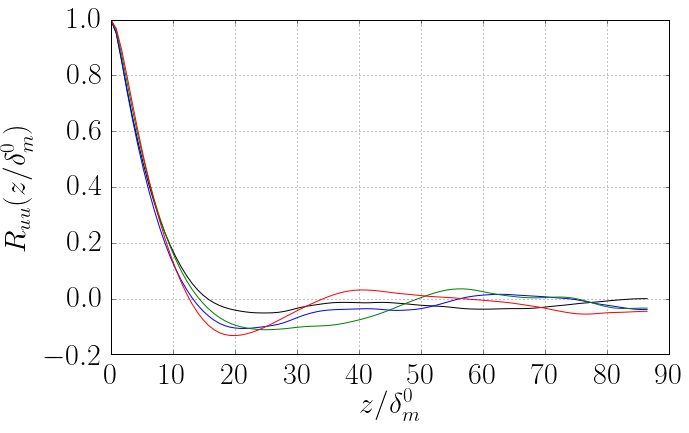

In [208]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname = 'rhou_z_case'
#ax.set_xscale('log')
xlabel =r'$z/\delta_m^0$'
ylabel =r'$R_{uu}(z/\delta_m^0) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
#plt.xlim([-6,10])
plt.ylim([-0.2,1])
plt.grid('on')
#dw_f = 45 dw_0
for icase in range(ncases):
    print icase
    icount = 0
    for ijob in lcases[icase]:
        print ijob
        imid = len(p_folders_spe[ijob])/2
        print imid
        [kx,kz,time,xvect,Rii,Rii0,L11] = getRiizvstime(p_folders_spe[ijob][imid],0)
        if icount == 0:
            Riimean=np.zeros(len(xvect))
        ilim = where(time>SS2[icase])[0][0]-1
        Riimean += Rii[:,ilim]
        icount += 1
        #plt.plot(xvect,Rii[:,0])
    plt.plot(xvect,Riimean/4,l_job_style[ijob/4])
    print time[ilim]
if PRINT == True: 
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')   


In [ ]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname = 'rhow_case'
#ax.set_xscale('log')
xlabel =r'$x/\delta_m^0$'
ylabel =r'$R_{ww}(x/\delta_m^0) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
#plt.xlim([-6,10])
plt.ylim([-0.2,1])
plt.grid('on')
#dw_f = 45 dw_0
for icase in range(ncases):
    print icase
    icount = 0
    for ijob in lcases[icase]:
        print ijob
        imid = len(p_folders_spe[ijob])/2
        print imid
        [kx,kz,time,xvect,Rii,Rii0,L11] = getRiivstime(p_folders_spe[ijob][imid],2)
        if icount == 0:
            Riimean=np.zeros(len(xvect))
        ilim = where(time>SS2[icase])[0][0]-1
        Riimean += Rii[:,ilim]
        icount += 1
        #plt.plot(xvect,Rii[:,0])
    plt.plot(xvect,Riimean/4,l_job_style[ijob/4])
    print time[ilim]
if PRINT == True: 
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')   


0
0
15
0.000408345159941 1.0
1
15
0.000422085107712 1.0
2
15


0
0
15
0.00137395833192 1.0
1
15
0.00352948936088 1.0
2
15
0.00131207226696 1.0
3
15
0.00160303055151 1.0
519.814025879
1
4
15
0.00125480137687 1.0
5
15
0.000491230303172 1.0
6
15
0.00297235080044 1.0
7
15
0.00170944955216 1.0
511.160491943
2
8
15
0.00060653639194 1.0
9
15
0.00279180742356 1.0
10
15
0.00182378689551 1.0
11
15
0.000688720990661 1.0
615.180175781
3
12
15
0.000531981825478 1.0
13
15
0.00105044851603 1.0
14
15
0.0010008688623 1.0
15
15
0.000753321978269 1.0
739.68560791
figure /share/drive/toni/VDML/JFM_201706/rhou_z_case.pdf saved!


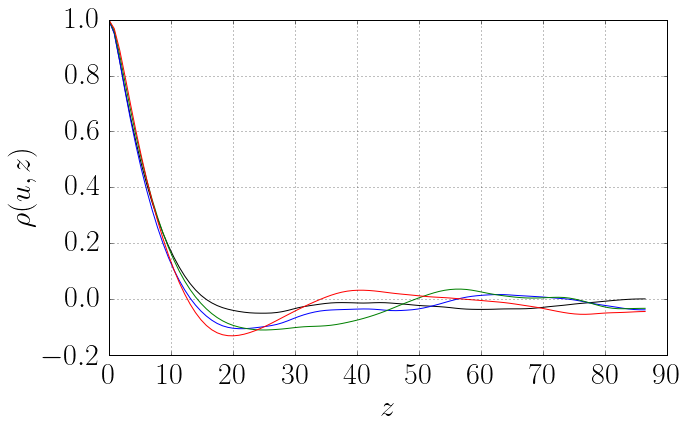

In [152]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname = 'rhou_z_case'
#ax.set_xscale('log')
xlabel =r'$z$'
ylabel =r'$\rho(u,z) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
#plt.xlim([-6,10])
plt.ylim([-0.2,1])
plt.grid('on')
#dw_f = 45 dw_0
for icase in range(ncases):
    print icase
    icount = 0
    for ijob in lcases[icase]:
        print ijob
        imid = len(p_folders_spe[ijob])/2
        print imid
        [kx,kz,time,xvect,Rii,Rii0,L11] = getRiizvstime(p_folders_spe[ijob][imid],0)
        if icount == 0:
            Riimean=np.zeros(len(xvect))
        ilim = where(time>SS2[icase])[0][0]-1
        Riimean += Rii[:,ilim]
        icount += 1
        #plt.plot(xvect,Rii[:,0])
    plt.plot(xvect,Riimean/4,l_job_style[ijob/4])
    print time[ilim]
if PRINT == True: 
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')   


0
0
15
0.00127039234506 1.0
1
15
0.000590569871171 1.0
2
15
0.000816251177039 1.0
3
15
0.000485844524961 1.0
519.814025879
1
4
15
0.000593794121767 1.0
5
15
0.000310172694064 1.0
6
15
0.000242399237943 1.0
7
15
0.000125801864208 1.0
511.160491943
2
8
15
0.000236391552614 1.0
9
15
0.000357744530236 1.0
10
15
0.000543556804489 1.0
11
15
0.000360641846524 1.0
615.180175781
3
12
15
0.000134496681654 1.0
13
15
0.000175265550179 1.0
14
15
0.000191946832929 1.0
15
15
0.000216897158312 1.0
739.68560791
figure /share/drive/toni/VDML/JFM_201706/rhov_case.pdf saved!


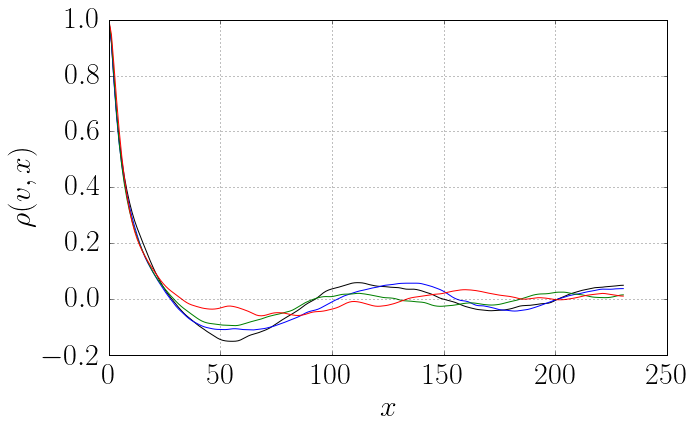

In [150]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname = 'rhov_case'
ivar = 1
#ax.set_xscale('log')
xlabel =r'$x$'
ylabel =r'$\rho(v,x) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
#plt.xlim([-6,10])
plt.ylim([-0.2,1])
plt.grid('on')
#dw_f = 45 dw_0
for icase in range(ncases):
    print icase
    icount = 0
    for ijob in lcases[icase]:
        print ijob
        imid = len(p_folders_spe[ijob])/2
        print imid
        [kx,kz,time,xvect,Rii,Rii0,L11] = getRiivstime(p_folders_spe[ijob][imid],ivar)
        if icount == 0:
            Riimean=np.zeros(len(xvect))
        ilim = where(time>SS2[icase])[0][0]-1
        Riimean += Rii[:,ilim]
        icount += 1
        #plt.plot(xvect,Rii[:,0])
    plt.plot(xvect,Riimean/4,l_job_style[ijob/4])
    print time[ilim]
if PRINT == True: 
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')   


0
0
15
0.0022571974888 1.0
1
15
0.00763256715103 1.0
2
15
0.00123848951074 1.0
3
15
0.0031142933882 1.0
519.814025879
1
4
15
0.00389930569373 1.0
5
15
0.0015351361495 1.0
6
15
0.00369058664925 1.0
7
15
0.00545826039018 1.0
511.160491943
2
8
15
0.0013928725228 1.0
9
15
0.00438079071869 1.0
10
15
0.00191203418823 1.0
11
15
0.000513776311068 1.0
615.180175781
3
12
15
0.000706375203756 1.0
13
15
0.000492266499115 1.0
14
15
0.0022544583703 1.0
15
15
0.00157264353122 1.0
739.68560791
figure /share/drive/toni/VDML/JFM_201706/rhov_z_case.pdf saved!


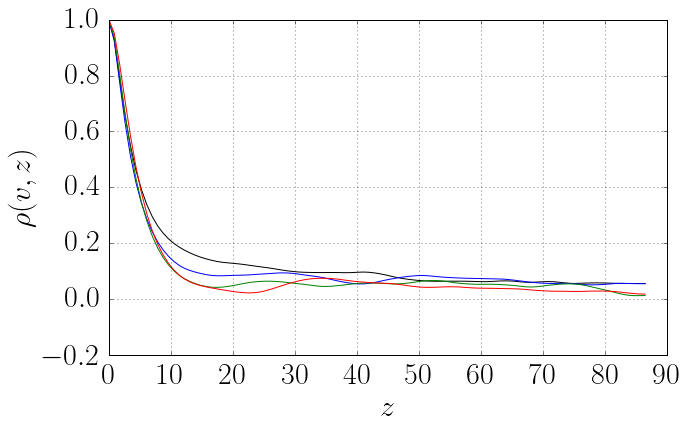

In [153]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname = 'rhov_z_case'
ivar = 1
#ax.set_xscale('log')
xlabel =r'$z$'
ylabel =r'$\rho(v,z) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
#plt.xlim([-6,10])
plt.ylim([-0.2,1])
plt.grid('on')
#dw_f = 45 dw_0
for icase in range(ncases):
    print icase
    icount = 0
    for ijob in lcases[icase]:
        print ijob
        imid = len(p_folders_spe[ijob])/2
        print imid
        [kx,kz,time,xvect,Rii,Rii0,L11] = getRiizvstime(p_folders_spe[ijob][imid],ivar)
        if icount == 0:
            Riimean=np.zeros(len(xvect))
        ilim = where(time>SS2[icase])[0][0]-1
        Riimean += Rii[:,ilim]
        icount += 1
        #plt.plot(xvect,Rii[:,0])
    plt.plot(xvect,Riimean/4,l_job_style[ijob/4])
    print time[ilim]
if PRINT == True: 
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')   


0
0
15
0.00580213114108 1.0
1
15
0.00341120077508 1.0
2
15
0.0013495619073 1.0
3
15
0.000995575799002 1.0
519.814025879
1
4
15
0.000686990828807 1.0
5
15
0.000446822456735 1.0
6
15
0.000403221287177 1.0
7
15
0.000731538425849 1.0
511.160491943
2
8
15
0.00334146177547 1.0
9
15
0.00984659874589 1.0
10
15
0.00540264340651 1.0
11
15
0.00416226795629 1.0
615.180175781
3
12
15
0.00535924188541 1.0
13
15
0.00530907824083 1.0
14
15
0.0106876880735 1.0
15
15
0.00759642375298 1.0
739.68560791
figure /share/drive/toni/VDML/JFM_201706/rhoT_case.pdf saved!


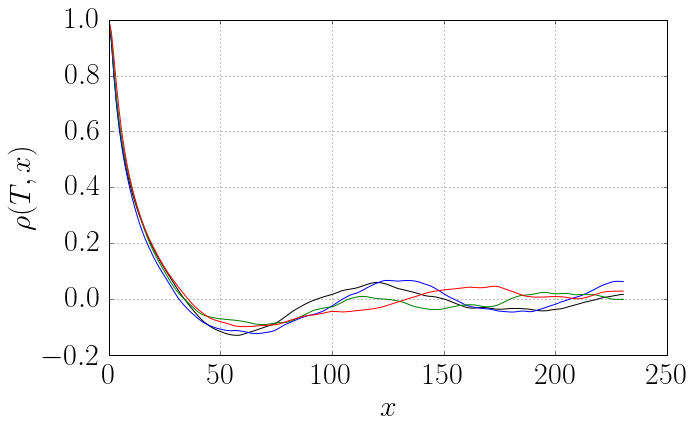

In [151]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname = 'rhoT_case'
ivar = 11
#ax.set_xscale('log')
xlabel =r'$x$'
ylabel =r'$\rho(T,x) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
#plt.xlim([-6,10])
plt.ylim([-0.2,1])
plt.grid('on')
#dw_f = 45 dw_0
for icase in range(ncases):
    print icase
    icount = 0
    for ijob in lcases[icase]:
        print ijob
        imid = len(p_folders_spe[ijob])/2
        print imid
        [kx,kz,time,xvect,Rii,Rii0,L11] = getRiivstime(p_folders_spe[ijob][imid],ivar)
        if icount == 0:
            Riimean=np.zeros(len(xvect))
        ilim = where(time>SS2[icase])[0][0]-1
        Riimean += Rii[:,ilim]
        icount += 1
        #plt.plot(xvect,Rii[:,0])
    plt.plot(xvect,Riimean/4,l_job_style[ijob/4])
    print time[ilim]
if PRINT == True: 
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')   


0
0
15
0.00674795795649 1.0
1
15
0.0131988405349 1.0
2
15
0.00448754229761 1.0
3
15
0.0059975198818 1.0
519.814025879
1
4
15
0.00965118801057 1.0
5
15
0.00174757977267 1.0
6
15
0.00952973861364 1.0
7
15
0.00635993100343 1.0
511.160491943
2
8
15
0.014658759447 1.0
9
15
0.0401018676788 1.0
10
15
0.0440041847144 1.0
11
15
0.00809500344451 1.0
615.180175781
3
12
15
0.0466169911842 1.0
13
15
0.0445803551454 1.0
14
15
0.096416131727 1.0
15
15
0.0845137491522 1.0
739.68560791
figure /share/drive/toni/VDML/JFM_201706/rhoT_z_case.pdf saved!


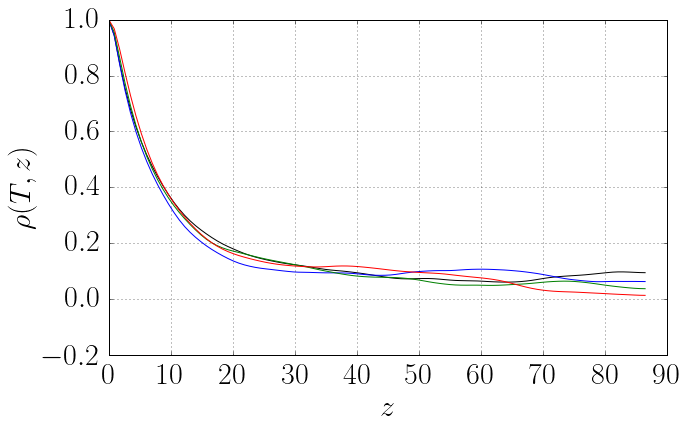

In [154]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)
figname = 'rhoT_z_case'
ivar = 11
#ax.set_xscale('log')
xlabel =r'$z$'
ylabel =r'$\rho(T,z) $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
#plt.xlim([-6,10])
plt.ylim([-0.2,1])
plt.grid('on')
#dw_f = 45 dw_0
for icase in range(ncases):
    print icase
    icount = 0
    for ijob in lcases[icase]:
        print ijob
        imid = len(p_folders_spe[ijob])/2
        print imid
        [kx,kz,time,xvect,Rii,Rii0,L11] = getRiizvstime(p_folders_spe[ijob][imid],ivar)
        if icount == 0:
            Riimean=np.zeros(len(xvect))
        ilim = where(time>SS2[icase])[0][0]-1
        Riimean += Rii[:,ilim]
        icount += 1
        #plt.plot(xvect,Rii[:,0])
    plt.plot(xvect,Riimean/4,l_job_style[ijob/4])
    print time[ilim]
if PRINT == True: 
    pathname = save_folder + figname + fformat
    print "figure %s saved!"%(pathname)
    fig.savefig(pathname,bbox_inches='tight')   


In [378]:
l_point_style=['k*','k*','k*','b*','b*','b*','g*','g*','g*','r*','r*','r*']

0.000997151189941 1.0
419.029693604
0.000611354402027 1.0
419.429321289
0.00214549709085 1.0
457.091674805
0.000853188822473 1.0
527.315307617
0.00127934118858 1.0
496.690216064
0.0010133055881 1.0
465.923278809
0.00109672424923 1.0
646.080749512
0.000808040474386 1.0
648.490661621
0.00077771344721 1.0
649.728271484
0.000482325841126 1.0
736.98034668
0.00107579701827 1.0
759.485473633
0.000471480055981 1.0
767.03692627


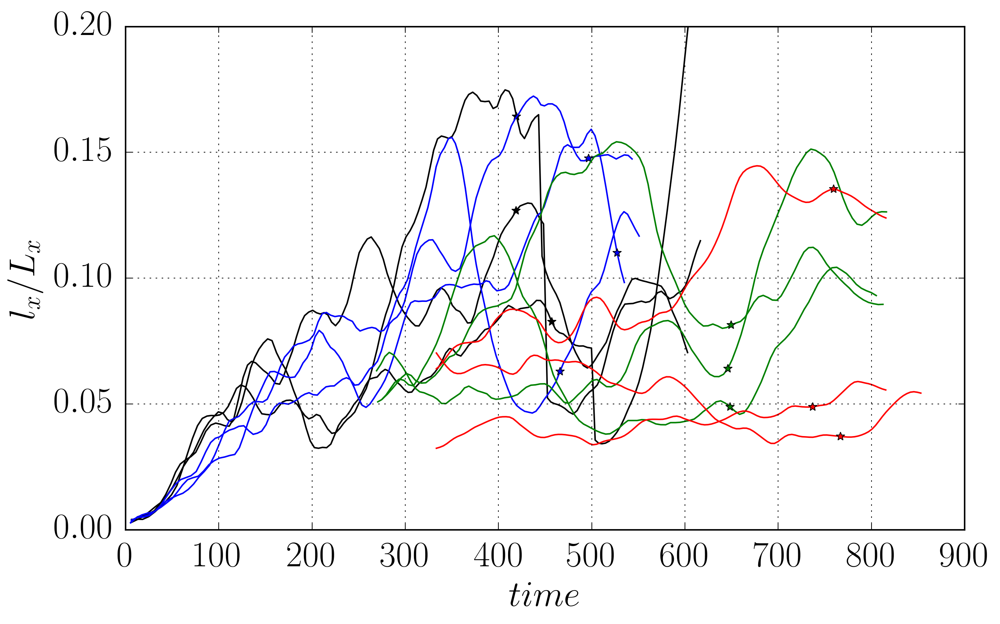

In [387]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)

#ax.set_xscale('log')
xlabel =r'$time$'
ylabel =r'$l_{x}/L_x $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'kk'
#plt.xlim([-6,10])
plt.ylim([0,0.2])
plt.grid('on')
#dw_f = 45 dw_0
for ijob in range(0,12):
    [kx,kz,time,xvect,Rii,Rii0,L11] = getRiivstime(p_folders_spe[ijob],0)
    ilim = where(time>SS2[ijob])[0][0]-1
    #plt.plot(xvect,Rii[:,0])
    plt.plot(time,L11,l_job_style[ijob/3])
    plt.plot(time[ilim],L11[ilim],l_point_style[ijob])
    print time[ilim]
    


0.00128564356997 1.0
419.029693604
0.00115302713623 1.0
419.429321289
0.0008670472508 1.0
457.091674805
0.000752545741059 1.0
527.315307617
0.000716498790979 1.0
496.690216064
0.000454279990351 1.0
465.923278809
0.00059928350932 1.0
646.080749512
0.000714138922705 1.0
648.490661621
0.000795922271069 1.0
649.728271484
0.000239104329018 1.0
736.98034668
0.000599886647981 1.0
759.485473633
0.000379300757378 1.0
767.03692627


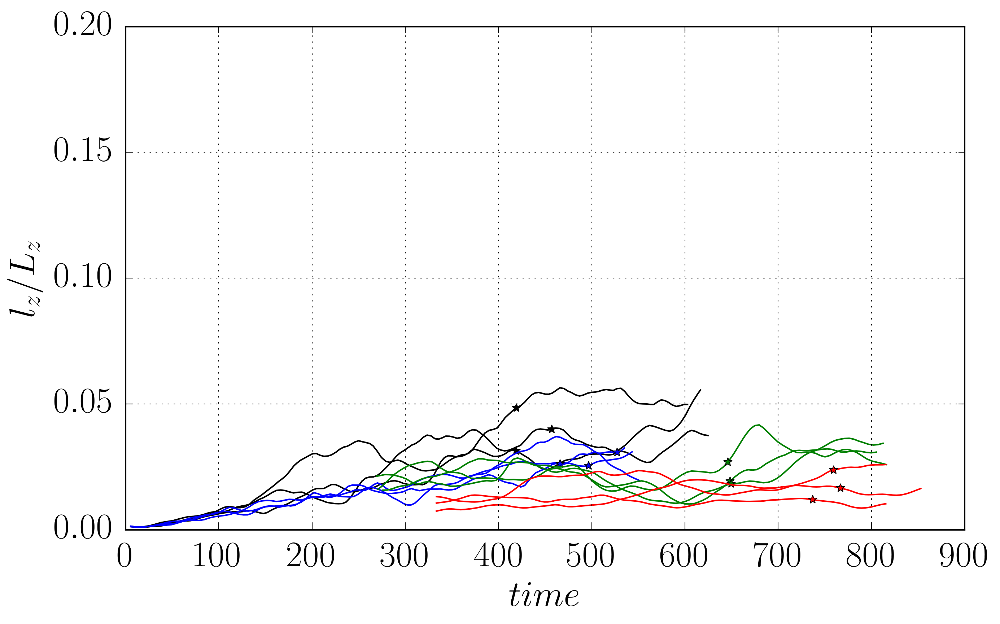

In [386]:
fig = plt.figure(figsize=(xlen,ylen)) #Define figure with size
ax=fig.add_subplot(1,1,1)

#ax.set_xscale('log')
xlabel =r'$time$'
ylabel =r'$l_{z}/L_z $'
plt.xlabel(xlabel);plt.ylabel(ylabel);
figname = 'kk'
#plt.xlim([-6,10])
plt.ylim([0,0.2])
plt.grid('on')
#dw_f = 45 dw_0
for ijob in range(0,12):
    [kx,kz,time,xvect,Rii,Rii0,L11] = getRiizvstime(p_folders_spe[ijob],0)
    ilim = where(time>SS2[ijob])[0][0]-1
    #plt.plot(xvect,Rii[:,0])
    plt.plot(time,L11,l_job_style[ijob/3])
    plt.plot(time[ilim],L11[ilim],l_point_style[ijob])
    print time[ilim]
    


 For Pantano: $lx/Lx = 0.126$ for $s=8$ at the end of the simulation
